# new time: 20000 max, 1200 count

In [1]:

import numpy as np                       # mathematical methods
from scipy.optimize import leastsq
from scipy import stats                  # contains some fitting routines
from scipy import signal
from scipy.signal import chirp
from scipy.signal import argrelextrema
import pandas as pd

from peakdetection import detect_peaks

#import matplotlib.pylab as plt
from matplotlib import pyplot as plt     # plotting methods within notebook

from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator


%matplotlib inline

In [2]:

plot = True
#plot = False

def kepler(x, I) : #inputs: resting potential v0,u0 , current[certaintime]
    GNa = 120.0
    GK = 36.0
    GL = 0.3
    ENa = +50.0
    EK = -77.0
    EL = -54.384
    C = 1.0 
    PT = 1.0

    V = x[0] 
    U = x[1]

    z = (U+55.0)/10.0
    ns = 1.0/(1.0+12.5*np.exp(-(U+65.0)/80.0)*0.1*(1.0 if abs(z) < 1e-4 else (1.0-np.exp(-z))/z))
    # ns = 1.0/(1.0+12.5*np.exp(-(U+65.0)/80.0)*(1.0-np.exp(-(U+55.0)/10.0))/(U+55.0))

    dU = 0.001
    z = (U+dU+55.0)/10.0
    nsU = 1.0/(1.0+12.5*np.exp(-(U+dU+65.0)/80.0)*0.1*(1.0 if abs(z) < 1e-4 else (1.0-np.exp(-z))/z))
    # nsU = 1.0/(1.0+12.5*np.exp(-(U+dU+65.0)/80.0)*(1.0-np.exp(-(U+dU+55.0)/10.0))/(U+dU+55.0))

    z = (V+55.0)/10.0
    nsV = 1.0/(1.0+12.5*np.exp(-(V+65.0)/80.0)*0.1*(1.0 if abs(z) < 1e-4 else (1.0-np.exp(-z))/z))
    # nsV = 1.0/(1.0+12.5*np.exp(-(V+65.0)/80.0)*(1.0-np.exp(-(V+55.0)/10.0))/(V+55.0))

    z = (V+40.0)/10.0
    ms = 1.0/(1.0+40.0*np.exp(-(V+65)/18.0)*0.1*(1.0 if abs(z) < 1e-4 else (1.0-np.exp(-z))/z))
    # ms = 1.0/(1.0+40.0*np.exp(-(V+65)/18.0)*(1.0-np.exp(-(V+40.0)/10.0))/(V+40.0))

    dV = 0.001
    z = (V+dV+40.0)/10.0
    msV = 1.0/(1.0+40.0*np.exp(-(V+dV+65)/18.0)*0.1*(1.0 if abs(z) < 1e-4 else (1.0-np.exp(-z))/z))
    # msV = 1.0/(1.0+40.0*np.exp(-(V+dV+65)/18.0)*(1.0-np.exp(-(V+dV+40.0)/10.0))/(V+dV+40.0))

    hs = 1.0/(1.0+1.0/(0.07*np.exp(-(U+65)/20.0)*(np.exp(-(U+35.0)/10.0)+1.0)))
    hsU = 1.0/(1.0+1.0/(0.07*np.exp(-(U+dU+65)/20.0)*(np.exp(-(U+dU+35.0)/10.0)+1.0)))
    hsV = 1.0/(1.0+1.0/(0.07*np.exp(-(V+65)/20.0)*(np.exp(-(V+35.0)/10.0)+1.0)))

    dgNa = GNa*ms*ms*ms*(V-ENa)
    dgK = GK*4.0*ns*ns*ns*(V-EK)
    th = 1.0/(0.07*np.exp(-(V+65.0)/20.0)+1.0/(np.exp(-(V+35.0)/10.0)+1.0))

    z = (V+55.0)/10.0
    tn = 1.0/(0.125*np.exp(-(V+65)/80.0)+0.1*(1.0 if abs(z) < 1e-4 else z/(1.0-np.exp(-z))))
    # tn = 1.0/(0.125*np.exp(-(V+65)/80.0)+0.01*(V+55.0)/(1.0-np.exp(-(V+55.0)/10.0)))

    z = (V+40.0)/10.0
    # tm = 1.0/(4.0*np.exp(-(V+65.0)/18.0)+0.1*(V+40.0)/(1.0-np.exp(-(V+40.0)/10.0)))
    tm = 1.0/(4.0*np.exp(-(V+65.0)/18.0)+(1.0 if abs(z) < 1e-4 else z/(1.0-np.exp(-z))))

    a = dgNa*(hsV-hs)/th+dgK*(nsV-ns)/tn
    b = dgNa*(hsU-hs)/dU+dgK*(nsU-ns)/dU

    g = GL + GK*ns*ns*ns*ns + GNa*ms*ms*ms*hs
    dFdVm = GNa*3.0*ms*ms*hs*(V-ENa)*(msV-ms)/dV
    alpha = 0.5*(C/tm+g - np.sqrt((C/tm+g)*(C/tm+g)-4.0*(g+dFdVm)*C/tm))/(g+dFdVm)

    GNaGates = GNa*ms*ms*ms*hs
    GKGates = GK*ns*ns*ns*ns

    INa = GNaGates*(V-ENa)
    IK = GKGates*(V-EK)
    IL = GL*(V-EL)

    dVdt = alpha * (-INa-IK-IL+I)/C   
    dUdt = a/b                         

    return dVdt, dUdt               
#returns changes in V and U for a certain v0 and u0 and current[time k]

#HH-style



In [3]:
 def trajectory(derivative, tmin, tmax, I0, I1, v0, u0) :
    deltat = 0.01
    time = np.arange(tmin, tmax, deltat)
    # = [tmin, tmin+deltat, tmin+2deltat, ..., tmax - deltat], len(time) = (tmax - tmin) / deltat
    x = np.zeros((2, len(time)))
    # 2-dim Array of len(time)x 0's x2
    current = np.zeros(len(time))
    # 1-dim Array of len(time)x 0's
    current[time<0.0] = I0
    # set current below time = 0 on I0
    current[time>=0.0] = I1
    # set current beginning at time = 0 on I1
    xx = [ v0, u0 ]
    for k in range(len(time)) :
        dVdt, dUdt = derivative(xx, current[k]) #gets changes in V and U for a certain current[time k]
        xx[0] += dVdt*deltat 
        xx[1] += dUdt*deltat #add these changes to the former values v0, u0
        x[0,k] = xx[0] #stores all changes in V ...
        x[1,k] = xx[1] #stores all changes in U untill tmax for every timestep
    return time, current, x #returns timearray, currentarray and updated v,u-array

In [4]:

#uvgrid = np.mgrid[slice(-80, 50 + .05, .05), slice(-80, -30 + .05, .05)]
#vs = np.arange(-80, 50 + .025, .025)
#us = np.arange(-70, -30 + .025, .025)
vs = np.arange(-80, 50 + .01, .01)
us = np.arange(-70, -30 + .01, .01)
zeros1 = np.zeros((len(vs), len(us)))
zeros2 = np.zeros((len(vs), len(us)))
zeros3 = np.zeros((len(vs), len(us)))
iis = (0, 5, 10)
ichange = (zeros1, zeros2, zeros3)
#uvgridz = np.zeros(np.arange(-80, 50 + .05, .05), np.arange(-80, -30 + .05, .05))
#print(uvgridz)
for c0, i in enumerate(iis, 0):
    print('step {} of {}'.format(c0, len(iis)))
    for c1, Vs in enumerate(vs, 0):
        for c2, Us in enumerate(us, 0):
            if np.round(kepler((Vs, Us), i), 2)[0] == 0:
                ichange[c0][c1][c2] = 1

#kepler((-65, -65), 0)

step 0 of 3
step 1 of 3
step 2 of 3


In [7]:
t1, x1, i1 = spikeresponse_rec15(kepler, 0.0, 0.0, 100)
v1 = x1[0][10000]
u1 = x1[1][10000]
print(v1)
print(u1)
t2, x2, i2 = spikeresponse_rec15(kepler, 5.0, 5.0, 100)
v2 = x2[0][10000]
u2 = x2[1][10000]
print(v2)
print(u2)
t3, x3, i3 = spikeresponse_rec15(kepler, 10.0, 10.0, 100)
#v3 = x3[0][10000]
#u3 = x3[1][10000]
#print(v3)
#print(u3)

-64.9956081014
-64.9956081014
-61.7315502329
-61.7315242527


In [47]:
#plt.plot(t2, x2[0])
#plt.plot(x2[0], x2[1])
#plt.plot(x3[0], x3[1])
#plt.plot(t3, x3[0])
#plt.axis((0,100,-80,40))
#idx = np.argwhere(np.diff(np.sign((vs[np.where(ichange[2] == 1)[0]] - us[np.where(ichange[2] == 1)[1]]))) != 0).reshape(-1) + 0
#print(idx)
#print(vs[np.where(ichange[2] == 1)[0]][29])
#print(us[np.where(ichange[2] == 1)[0]][29])

[29]
-59.4


(-82.5, 55, -63, -35)

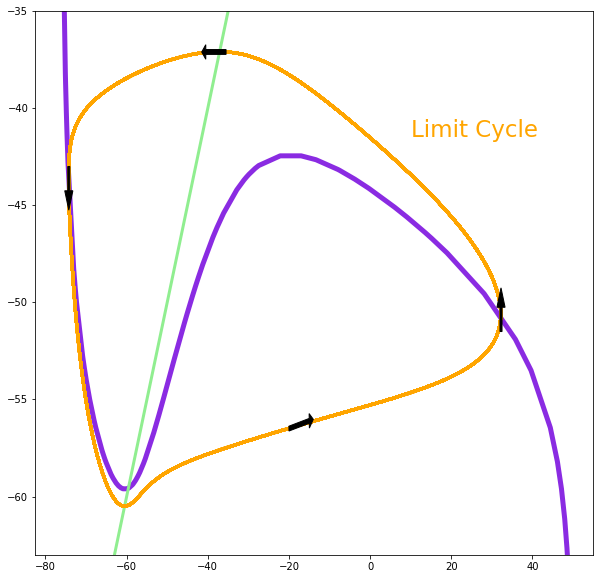

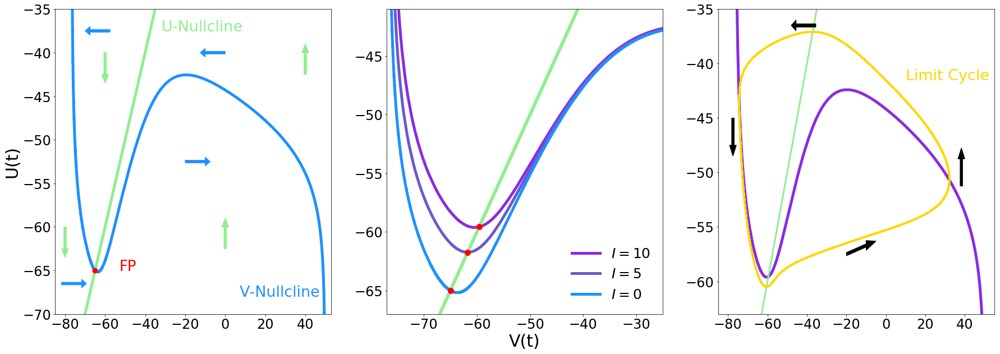

In [8]:

fig = plt.figure(figsize=(30,10))


fig.add_subplot(1,3,1)
plt.plot(vs[np.where(ichange[0] == 1)[0]], us[np.where(ichange[0] == 1)[1]], color = 'dodgerblue', label = 'V-Nullcline', linewidth = 5)
plt.plot(np.arange(-70, -30, 1), np.arange(-70, -30, 1), color = 'lightgreen', label = 'U-Nullcline', linewidth = 5)
plt.plot(v1, u1, 'o', color = 'red', markersize = 9)
plt.axis((-85, 53, -70, -35))
plt.text(-32, -37.5, 'U-Nullcline', color = 'lightgreen', fontsize = 27)
plt.text(7, -68, 'V-Nullcline', color = 'dodgerblue', fontsize = 27)
plt.text(-53, -65, 'FP', color = 'red', fontsize = 26)
plt.arrow(40, -42.5, 0, 2.5, head_width=3.5, width = 1.25, head_length=1, linestyle = 'solid', zorder = 3, color = 'lightgreen')
plt.arrow(0, -62.5, 0, 2.5, head_width=3.5, width = 1.25, head_length=1, linestyle = 'solid', zorder = 3, color = 'lightgreen')
plt.arrow(-60, -40, 0, -2.5, head_width=3.5, width = 1.25, head_length=1, linestyle = 'solid', zorder = 3, color = 'lightgreen')
plt.arrow(-80, -60, 0, -2.5, head_width=3.5, width = 1.25, head_length=1, linestyle = 'solid', zorder = 3, color = 'lightgreen')


plt.arrow(-57.5, -37.5, -10, 0, head_width=1, width = .3, head_length=2.5, linestyle = 'solid', zorder = 3, color = 'dodgerblue')
plt.arrow(0, -40, -10, 0, head_width=1, width = .3, head_length=2.5, linestyle = 'solid', zorder = 3, color = 'dodgerblue')
plt.arrow(-20, -52.5, 10, 0, head_width=1, width = .3, head_length=2.5, linestyle = 'solid', zorder = 3, color = 'dodgerblue')
plt.arrow(-81.75, -66.5, 10, 0, head_width=1, width = .3, head_length=2.5, linestyle = 'solid', zorder = 3, color = 'dodgerblue')



#plt.xlabel('V(t)', fontsize = 2)
plt.ylabel('U(t)', fontsize = 30)
plt.xticks(fontsize = 24)
plt.yticks(fontsize = 24)
fig.add_subplot(1,3,2)
plt.plot(vs[np.where(ichange[2] == 1)[0]], us[np.where(ichange[2] == 1)[1]], color = 'blueviolet', linewidth = 5, label = r'$I = 10$')
plt.plot(vs[np.where(ichange[1] == 1)[0]], us[np.where(ichange[1] == 1)[1]], color = 'slateblue', linewidth = 5, label = r'$I = 5$')
plt.plot(vs[np.where(ichange[0] == 1)[0]], us[np.where(ichange[0] == 1)[1]], color = 'dodgerblue', linewidth = 5, label = r'$I = 0$')
plt.plot(np.arange(-70, -30, 1), np.arange(-70, -30, 1), color = 'lightgreen', linewidth = 6)
plt.plot(v1, u1, 'o', color = 'red', markersize = 10)
plt.plot(v2, u2, 'o', color = 'red', markersize = 10)
plt.plot(-59.56, -59.56, 'o', color = 'red', markersize = 10)
plt.axis((-77, -25, -67, -41))
plt.legend(loc = 'lower right', frameon = False, fontsize = 25)
plt.xlabel('V(t)', fontsize = 30)
plt.xticks(fontsize = 24)
plt.yticks(fontsize = 24)
#plt.ylabel('U(t)')
plt
fig.add_subplot(1,3,3)
plt.plot(vs[np.where(ichange[2] == 1)[0]], us[np.where(ichange[2] == 1)[1]], color = 'blueviolet', linewidth = 5, label = r'$I = 10$', zorder = 1)
plt.plot(np.arange(-70, -30, 1), np.arange(-70, -30, 1), color = 'lightgreen', label = 'U-Nullcline', linewidth = 3, zorder = 2)
plt.plot(x3[0][10000:], x3[1][10000:], color = 'gold', zorder = 2, linewidth = 3)
plt.arrow(38.25, -51.25, 0, 2.5, head_width=3.5, width = 1.25, head_length=1, fc='k', ec='k', linestyle = 'solid', zorder = 3, color = 'black')
plt.arrow(-77.5, -45, 0, -2.5, head_width=3.5, width = 1.25, head_length=1, fc='k', ec='k', linestyle = 'solid', zorder = 3, color = 'black')
plt.arrow(-35.5, -36.5, -10, 0, head_width=1, width = .3, head_length=2.5, fc='k', ec='k', linestyle = 'solid', zorder = 3, color = 'black')
plt.arrow(-20, -57.5, 10, .8, head_width=.9, width = .3, head_length=5, fc='k', ec='k', linestyle = 'solid', zorder = 3, color = 'black')
plt.text(10, -41.5, 'Limit Cycle', color = 'gold', fontsize = 27)
plt.axis((-85, 55, -63, -35))
plt.xticks(fontsize = 24)
plt.yticks(fontsize = 24)
#plt.xlabel('V(t)')
#plt.ylabel('U(t)')
plt.savefig('BA_system_behavior_fin2.pdf')

In [164]:
plt.arrow?

In [4]:

def inv_trajectory(derivative, tmin, tmax, I0, I1, v0, u0) :
    deltat = 0.01
    time = np.arange(tmin, tmax, deltat)
    # = [tmin, tmin+deltat, tmin+2deltat, ..., tmax - deltat], len(time) = (tmax - tmin) / deltat
    x = np.zeros((2, len(time)))
    # 2-dim Array of len(time)x 0's x2
    current = np.zeros(len(time))
    # 1-dim Array of len(time)x 0's
    current[time<0.0] = I0
    # set current below time = 0 on I0
    current[time>=0.0] = I1
    # set current beginning at time = 0 on I1
    xx = [ v0, u0 ]
    for k in range(len(time)) :
        dVdt, dUdt = derivative(xx, current[k]) #gets changes in V and U for a certain current[time k]
        
        xx[0] -= dVdt*deltat 
        xx[1] -= dUdt*deltat #add these changes to the former values v0, u0
        x[0,k] = xx[0] #stores all changes in V ...
        x[1,k] = xx[1] #stores all changes in U untill tmax for every timestep
    return time, current, x #returns timearray, currentarray and updated v,u-array


In [53]:
expinput = False
sineinput = False
noise = False
recinput = True


def spikeresponse(derivative, I0, I1, freqstart, freqend):
    
    tmax = 2000.0
    dt = 0.01
    df = 1
    #D = .1
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    thresh = -20.0
    taus = 1.0
    
    stime = np.arange(0.0, 8.0*taus, dt) #pulsetime: [0, dt, 2dt, ..., 8taus]
    
    if recinput == True:
        stime = np.arange(0.0, 1.5 * taus, dt) #spiketime: [0, dt, 2dt, ..., 8taus] WHY 8?

    
    #shorter pulsetime for rectangle input
    if (expinput == False) & (sineinput == False):
        stime = np.arange(0.0, taus, dt)
    
    #rectangle input
    spulse = (I1-I0) + 0 * stime
    
    #exp input
    if expinput:
        spulse = (I1-I0)*stime*np.exp(1.0-stime/taus)/taus #see below for better description
   
    #eigenfrequence for an input I
   # eigenfrequence = eigenfreq(derivative, tmax, I0, I1, spulse, taus, time, dt)
    
    #frequency array
    freqs = np.arange(freqstart, freqend + df, df)
    
    #empty array for future rates for all freqs
    rates = []
    
    #empty array for future amplitudes for all freqs
    amplitudes = []

    
    #compute for all freqs:
    for f in freqs:
        
        #period = distance of pulses (= 1000 ms / frequency)
        dp = 1000.0/f
        
        
        #ONE PULSE
        #pulses occuring between 0 and tmax-8taus with dist. dp
        if recinput == True:
            
            pulses = np.arange(0.0, tmax-(1.5*taus), dp) #pulses occuring between 0 and tmax-8taus with dist. dp
        else:
            pulses = np.arange(0.0, tmax-8.0*taus, dp)
    
        #later endingtime for shorter rectangle input
        #if (expinput == False) & (sineinput == False):
        #    pulses = np.arange(0.0, tmax-taus, dp)
    
        #CURRENT OF PULSES
        #current = I0 for all the time
        current = np.zeros(len(time)) + I0
    
        #sine input current
        if sineinput:
            spulse = (I1-I0)*np.sin(f*time*((2*np.pi)/1000))
            #spulse = (I1-I0)*signal.chirp(time, f0= 30/1000, f1=200/1000, t1=500, method='linear', phi = -90)
            current += spulse
        else:
            for pt in pulses: #loop through all the pulse-times
                current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
                
        #NOISE 
        if noise:
            current += np.random.randn(len(current)) * np.sqrt((2*D)/dt)
            
        #get time, current and voltage
        t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
        
        #array of times where value just jumps over threshhold
        spikes = t[:-1][(x[0][:-1]<thresh) & (x[0][1:]>=thresh)]
        spikes = spikes[spikes>0.0] #only pick spikes, which occur for t>0
        #spikes = spikes[spikes>100.0] #for plots
        
        #RATE
        rate = 0.0
        if len(spikes) > 2: #more han two spikes occur
            rate = 1000.0*(len(spikes)-1)/(spikes[-1]-spikes[0]) #
        rates.append(rate) #put all rate together in rates (evaluate one rate per frequency)
        
        
        
        
        #RESONANCE
        if sineinput:
            max_osc_indices = argrelextrema(x[0][10000:(10000+int(dp/dt))], np.greater)[0]
            min_osc_indices = argrelextrema(x[0][10000:(10000+int(dp/dt))], np.less)[0]
            amplitude = x[0][10000+max_osc_indices]-x[0][10000+min_osc_indices]
            print(max_osc_indices)
            print(min_osc_indices)
            print(x[0][10000+max_osc_indices])
            print(x[0][10000+min_osc_indices])
            print(amplitude)
            amplitudes.append(amplitude)
           
        
        #FIT eigenfrequence
        '''
        #alternative: fit a curve on oscillation
        
        guess_mean = np.mean(x[0][10000:(10000+int(dp/dt))])
        guess_std = 3*np.std(x[0][10000:(10000+int(dp/dt))])/(2**0.5)
        guess_freq = eigenfrequence
        optimize_func = lambda y: np.exp(-t[10000:(10000+int(dp/dt))]/taus) * y[0] * np.sin(t[10000:(10000+int(dp/dt))]*2*np.pi*y[1]) + y[2] - x[0][10000:(10000+int(dp/dt))]
        est_std, est_freq, est_mean = leastsq(optimize_func, [guess_std, guess_freq, guess_mean])[0]
        
        fitted_exp_sin = np.exp(-t[10000:(10000+int(dp/dt))]/taus) * est_std * np.sin(t[10000:(10000+int(dp/dt))]*2*np.pi*est_freq) + est_mean - x[0][10000:(10000+int(dp/dt))] - x[0][10000]
        
        print('fitted eigenfrequence is: {}'.format(est_freq))
        '''
        
        #print each step (and if nccs. a plot)
        if plot:
            print('freq: %6.1fHz, period=%6.1fms, rate=%6.1fHz, I0=%6.1f, I1=%6.1f' % (f, dp, rate, I0, I1))
        ## plt.plot(t, x[0], 'r', lw=2, label=r'$V(t)$')     #linewidth
        ## plt.plot(t, i, 'b', lw=2, label=r'$I(t)$')
        ## plt.plot(spikes, np.zeros(len(spikes))+ -20.0, '.k', ms=10)
        ## plt.show()
       
    #RESONANCE
    
    #compute 
    if sineinput:  
        resonant_indice = amplitudes.index(max(amplitudes))
        resonant_freq = freqs[resonant_indice]
        print(resonant_indice)
        print(resonant_freq)
       
    #PLOT EVERYTHINF    
    if plot:
        
        #WHOLE PLOT
        f = plt.figure(figsize=(18, 12))
        
        plt.plot(t, i)
       # plt.axis((200,1200,-80,-10))
'''       
        #SUBPLOTS
        
        
        #plot r(f)
        f.add_subplot(3, 3, 1)  
        plt.plot(freqs, rates/freqs, 'b', ms=10)
        plt.xlabel('Input frequency [Hz]')
        plt.ylabel('Output firing rate [Hz]')
      #  plt.axvline(x=eigenfrequence, color = 'r', label = 'eigenfrequence')
        plt.legend()
        
      #  plt.savefig('ratio_{}.png'.format(I1))
        
        
        #plot I(t)
        f.add_subplot(3, 3, 1)
        plt.plot(t,i)
        plt.axis((0,20, -.5, 15))
        plt.xlabel('Time t [ms]')
        plt.ylabel('Current I [mV]')
        plt.plot(t, 0*t + I1, 'r--', label = 'I1')
        plt.plot(t, 0*t + I0, 'r', label = 'I0')
        plt.legend()
        
        f.add_subplot(3, 3, 2)
        plt.plot(t,i)
 #       plt.axis((-100, 550, 4.5, 6.5))
        plt.xlabel('Time t [ms]')
        plt.ylabel('Current I [mV]')
        plt.plot(t, 0*t + I1, 'r--', label = 'I1')
        plt.plot(t, 0*t + I0, 'r', label = 'I0')
        plt.legend()

        #plot V(t)
        f.add_subplot(3, 3, 3)
        plt.plot(t, x[0])
     #   plt.plot(t[10000:(10000+int(dp/dt))], (-1) * fitted_exp_sin, 'r--')
        plt.axis((-2, int(dp)+1, -65, 40))
        plt.xlabel('Time t [ms]')
        plt.ylabel('Voltage V(t) [mV]')
         
        
        #plot r(f)
        f.add_subplot(3, 3, 4)  
        plt.plot(freqs, rates, 'b', ms=10)
        plt.xlabel('Input frequency [Hz]')
        plt.ylabel('Output firing rate [Hz]')
     #   if len(maxima_indices)>1:
     #       plt.axvline(x=eigenfrequence, color = 'r', label = 'eigenfrequence')
        plt.legend()
        
        #plot k(f)
        f.add_subplot(3, 3, 5) 
        plt.plot(freqs, rates/freqs, 'b', ms=10)
        plt.xlabel('Input frequency [Hz]')
        plt.ylabel('k = Output frequency / Input frequency')
   #     if len(maxima_indices)>1:
   #         plt.axvline(x=eigenfrequence, color = 'r', label = 'eigenfrequence')
        plt.legend()
        
        
        f.add_subplot(3, 3, 6)
        plt.plot(t, x[0])
        plt.plot(t, i)
        plt.axis((0,10,-65,I1))
        plt.xlabel('Time [s]')
        plt.ylabel('Voltage V(t) [mV]')
       
    
        if sineinput:
            f.add_subplot(3, 3, 7)
            plt.plot(freqs, amplitudes)
            plt.xlabel('Input frequency [Hz]')
            plt.ylabel('Amplitude of Output-sine')
         #   plt.axvline(x=freqs[resonance_indice], color = 'r', label = 'eigenfrequence')
       
       # plt.savefig('rf_i0_0_i1_{}_f0_{}_f1_{}.png'.format(I1, freqstart, freqend))
        ##plt.plot(freqs, rates, '.-b', ms=10)
        ##plt.xlabel('Input frequency [Hz]')
        ##plt.ylabel('Output firing rate [Hz]')
        ##plt.show()
        
    
'''

"       \n        #SUBPLOTS\n        \n        \n        #plot r(f)\n        f.add_subplot(3, 3, 1)  \n        plt.plot(freqs, rates/freqs, 'b', ms=10)\n        plt.xlabel('Input frequency [Hz]')\n        plt.ylabel('Output firing rate [Hz]')\n      #  plt.axvline(x=eigenfrequence, color = 'r', label = 'eigenfrequence')\n        plt.legend()\n        \n      #  plt.savefig('ratio_{}.png'.format(I1))\n        \n        \n        #plot I(t)\n        f.add_subplot(3, 3, 1)\n        plt.plot(t,i)\n        plt.axis((0,20, -.5, 15))\n        plt.xlabel('Time t [ms]')\n        plt.ylabel('Current I [mV]')\n        plt.plot(t, 0*t + I1, 'r--', label = 'I1')\n        plt.plot(t, 0*t + I0, 'r', label = 'I0')\n        plt.legend()\n        \n        f.add_subplot(3, 3, 2)\n        plt.plot(t,i)\n #       plt.axis((-100, 550, 4.5, 6.5))\n        plt.xlabel('Time t [ms]')\n        plt.ylabel('Current I [mV]')\n        plt.plot(t, 0*t + I1, 'r--', label = 'I1')\n        plt.plot(t, 0*t + I0, 'r', la

In [51]:
for i in range(6.94, 6.96, .01):
    spikeresponse(kepler, 5, i, 30, 30)

TypeError: 'float' object cannot be interpreted as an integer

freq:   80.0Hz, period=  12.5ms, rate=  18.7Hz, I0=   5.0, I1=   8.0


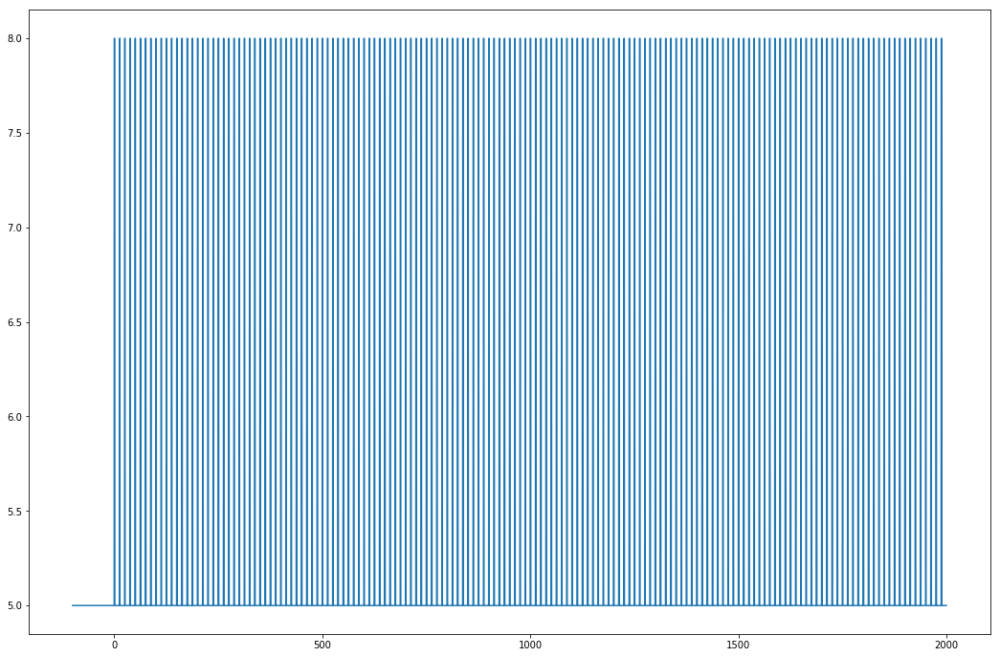

In [54]:
spikeresponse(kepler, 5.0, 8.0, 80, 80)

In [149]:
def eigenfreq(derivative, tmax, I0, I1, spulse, taus, time, dt):
    
    #set current for low frequency
    dp_high = 1000.0 / 20
    pulses = np.arange(0.0, tmax-8.0*taus, dp_high) #pulses occuring between 0 and tmax-8taus with dist. dp
    current = np.zeros(len(time)) + I0 #current = I0 for all the time

    for pt in pulses: #loop through all the pulse-times
        current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
        
    t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
    
    #find maxima:
    maxima_indices = argrelextrema(x[0][10000:(10000+int(dp_high/dt))], np.greater)[0]
        
    if len(maxima_indices)>1:
            
        #eigenperiode
        eigenperiods = np.zeros(len(maxima_indices)-1)
        for mxms in range(0, len(maxima_indices)-1, 1):
            eigenperiods[mxms] = maxima_indices[mxms+1] - maxima_indices[mxms]
        
        eigenperiod = np.mean(eigenperiods) * dt
        #compute eigenfrequence
        eigenfrequence = 1000.0 / eigenperiod
        
       # print(maxima_indices)
       # print(eigenperiods)
       # print(eigenperiod)
       # print('computed eigenfrequence is: {}'.format(eigenfrequence))
        
        return eigenfrequence
    
    

In [4]:
expinput = True
sineinput = False

def eigenfreq2(derivative):
    
    I0 = 5
    tmax = 600.0
    dt = 0.01
    df = 1.0
    taus = 1.0
    dinput = 0.0
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    threshold = -50
    
    #set current for low frequency
    di = .05
    i0, i1 = 6 + di, 8
    iarray = np.arange(i0, i1 + di, di)
    rec_eigenfrequences, diff_eigenfrequences, thresh_eigenfrequences = np.zeros(len(iarray)), np.zeros(len(iarray)), np.zeros(len(iarray))
  
    print(len(iarray))
    
    for ix in range(0, len(iarray)):
    
        stime = np.arange(0.0, 8.0*taus, dt) #pulsetime: [0, dt, 2dt, ..., 8taus]
    
    #shorter pulsetime for rectangle input
        if (expinput == False) & (sineinput == False):
            stime = np.arange(0.0, 6.0*taus, dt)
    
        spulse = (iarray[ix]-I0) + 0 * stime
        if expinput:
            spulse = (iarray[ix]-I0)*stime*np.exp(1.0-stime/taus)/taus #see below for better description
    
        dp_high = 1000.0 / 20
        pulses = np.arange(0.0, tmax-8.0*taus, dp_high) #pulses occuring between 0 and tmax-8taus with dist. dp
        current = np.zeros(len(time)) + I0 #current = I0 for all the time

        for pt in pulses: #loop through all the pulse-times
            current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
        
        t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
    
    #find maxima:
        maxima_indices = argrelextrema(x[0][10000:(10000+int(dp_high/dt))], np.greater, order = 5)[0]
        maxima_values = (x[0][10000+maxima_indices])

        thresh_maxima_indices = []
        
        if len(maxima_indices)>1:
            
        #eigenperiode
            eigenperiods = np.diff(maxima_indices)

            for threshcheck in range(0, len(maxima_indices), 1):
                if maxima_values[threshcheck] < threshold:
                    thresh_maxima_indices.append(maxima_indices[threshcheck])
            
            
            thresh_eigenperiods = np.diff(thresh_maxima_indices)#[0]
            
            diff_eigenperiod = eigenperiods[0] * dt
            rec_eigenperiod = np.mean(eigenperiods) * dt
            thresh_eigenperiod = np.mean(thresh_eigenperiods) * dt
            
            
            
            #print('maxima indices are: {}'.format(maxima_indices))
            #print('the periods are: {}'.format(eigenperiods))
            #print('maxima values are: {}'.format(maxima_values))
            #print('from which are indices: {} under the threshold'.format(thresh_maxima_indices))
            
            
            
            #print('diff. eigenperiod is {:.2f}'.format(diff_eigenperiod))
            #print('rec. eigenperiod is {:.2f}'.format(rec_eigenperiod))
            #print('thresh. eigenperiod is {:.2f}'.format(thresh_eigenperiod))

            
        #compute eigenfrequence
            rec_eigenfrequences[ix] = 1000.0 / rec_eigenperiod
            diff_eigenfrequences[ix] = 1000.0 / diff_eigenperiod
            thresh_eigenfrequences[ix] = 1000.0 / thresh_eigenperiod
        
        

        #print('recent computed eigenfrequence for I1 = {:.2f} is: {:.2f}'.format(iarray[ix], rec_eigenfrequences[ix]))
        #print('diff. computed eigenfrequence for I1 = {:.2f} is: {:.2f}'.format(iarray[ix], diff_eigenfrequences[ix]))
        #print('thresh. computed eigenfrequence for I1 = {:.2f} is: {:.2f}'.format(iarray[ix], thresh_eigenfrequences[ix]))
        
    return rec_eigenfrequences, diff_eigenfrequences, thresh_eigenfrequences

In [5]:
eigenfreq2(kepler)

41


(array([ 84.60236887,  84.60236887,  84.60236887,  84.62623413,
         84.62623413,  84.62623413,  84.62623413,  84.62623413,
         84.62623413,  84.62623413,  84.62623413,  84.62623413,
         84.62623413,  84.62623413,  84.62623413,  84.62623413,
         84.60236887,  84.57851706,  84.57851706,  84.55467869,
         84.53085376,  84.50704225,  84.48324416,  84.43568815,
         84.36445444,  84.24599832,  75.62389715,  75.56675063,
         75.54772098,  75.52870091,  75.50969041,  75.52870091,
         75.50969041,  75.50969041,  75.50969041,  75.49068948,
         75.49068948,  75.50969041,  75.49068948,  75.49068948,  75.49068948]),
 array([ 86.58008658,  86.58008658,  86.50519031,  86.50519031,
         86.43042351,  86.35578584,  86.35578584,  86.35578584,
         86.28127696,  86.20689655,  86.13264427,  86.13264427,
         86.05851979,  85.98452279,  85.91065292,  85.83690987,
         85.76329331,  85.68980291,  85.54319932,  85.47008547,
         85.32423208,  8

In [60]:
a = []
a.append(1)
a.append(2)
a
np.diff(a)[0]

1

In [172]:
recchirp = True

def myownSign(x):
    y = np.zeros(len(x))
    for i in range(0, len(y), 1):
        if x[i] > 0:
            y[i] = 1
    return y


def freqoutput(f0, f1, t1, t):
    return (f0/1000) + (((f1-f0)/1000) * t / t1)

def resonance(derivative, I0, I1s, I1e, di):
    
    tmax = 600.0
    dt = 0.01
    taus = 1.0

    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]

    iarray = np.arange(I1s, I1e + di, di)

    print('making {} steps'.format(len(iarray)))
    resonances = []
    
    for ix in range(0, len(iarray)):
        
        current = np.zeros(len(time)) + I0 #current = I0 for all the time
        
        spulse = (iarray[ix]-I0)*signal.chirp(time, f0= 30/1000, f1=200/1000, t1=500, method='linear', phi = -90)
        
        if recchirp:
            #spulse = np.sign(spulse)
            spulse = myownSign(spulse)*iarray[ix]
            
        
        current += spulse
        
        t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)

        
        spiked = False
        
        #plt.figure(figsize=(9,5))
        #plt.plot(t,i, 'r')
        
        if np.max(x[0]) > -20:
            #NEURON SPIKES AT I1 = .58002
            spiked = True
            print('Neuron is spiking at I1 = {:.5f}'.format(iarray[ix]))
            #plt.figure(figsize=(9,5))
            #plt.plot(t,x[0])
            resonance = 0
            resonances.append(resonance)
            
        
        else:
            resonance_indice = np.argmax(x[0])
            resonance_voltage = x[0][np.argmax(x[0])]
            resonance_indice = resonance_indice - 10000
            resonance_time = resonance_indice * dt
            resonance = freqoutput(30, 200, 500, resonance_time) * 1000
            resonances.append(resonance)
            print('Neuron not spiking at I1 = {:.5f}, resonance frequency = {}'.format(iarray[ix], resonance))
            #plt.figure(figsize=(9,5))
            #plt.plot(t,x[0])
            #plt.axvline(x=resonance_time, color = 'r', label = 'resonance')
            
       # plt.figure(figsize=(9,5))
        #plt.plot(t,x[0], label = iarray[ix])
       # plt.plot(t,i)
        #plt.legend()
        
    return resonances
        

making 210 steps
Neuron not spiking at I1 = 0.01000, resonance frequency = 66.9376
Neuron not spiking at I1 = 0.02000, resonance frequency = 66.941
Neuron not spiking at I1 = 0.03000, resonance frequency = 66.941
Neuron not spiking at I1 = 0.04000, resonance frequency = 66.941
Neuron not spiking at I1 = 0.05000, resonance frequency = 66.941
Neuron not spiking at I1 = 0.06000, resonance frequency = 66.941
Neuron not spiking at I1 = 0.07000, resonance frequency = 66.941
Neuron not spiking at I1 = 0.08000, resonance frequency = 66.941
Neuron not spiking at I1 = 0.09000, resonance frequency = 66.941
Neuron not spiking at I1 = 0.10000, resonance frequency = 66.9444
Neuron not spiking at I1 = 0.11000, resonance frequency = 66.9444
Neuron not spiking at I1 = 0.12000, resonance frequency = 66.9444
Neuron not spiking at I1 = 0.13000, resonance frequency = 66.9444
Neuron not spiking at I1 = 0.14000, resonance frequency = 66.9444
Neuron not spiking at I1 = 0.15000, resonance frequency = 66.9444
N

Neuron not spiking at I1 = 1.19000, resonance frequency = 67.077
Neuron not spiking at I1 = 1.20000, resonance frequency = 67.077
Neuron not spiking at I1 = 1.21000, resonance frequency = 67.08040000000001
Neuron not spiking at I1 = 1.22000, resonance frequency = 67.0838
Neuron not spiking at I1 = 1.23000, resonance frequency = 67.0872
Neuron not spiking at I1 = 1.24000, resonance frequency = 67.0906
Neuron not spiking at I1 = 1.25000, resonance frequency = 67.09400000000001
Neuron not spiking at I1 = 1.26000, resonance frequency = 67.09400000000001
Neuron not spiking at I1 = 1.27000, resonance frequency = 67.09740000000001
Neuron not spiking at I1 = 1.28000, resonance frequency = 67.1008
Neuron not spiking at I1 = 1.29000, resonance frequency = 67.1042
Neuron not spiking at I1 = 1.30000, resonance frequency = 67.1076
Neuron not spiking at I1 = 1.31000, resonance frequency = 67.111
Neuron not spiking at I1 = 1.32000, resonance frequency = 67.1144
Neuron not spiking at I1 = 1.33000, res

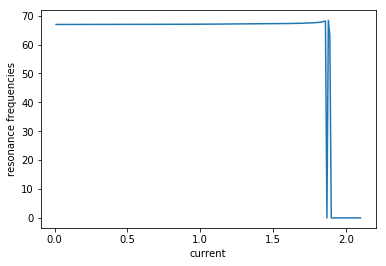

In [174]:
#resonance(kepler, 0, .01, 3, .5)

#print(freqoutput(30,50,500,250) * 1000)
#print(freqoutput(30,200,500,110)*1000)

plt.plot(np.arange(.01, 2.11, .01), resonance(kepler, 0, .01, 2.1, .01))
plt.xlabel('current')
plt.ylabel('resonance frequencies')
plt.savefig('resonance_frequencies_rectanglesweep.png')

In [197]:
expinput = True
sineinput = False

def eigenfreq3(derivative):
    
    I0 = 5
    tmax = 600.0
    dt = 0.01
    df = 1.0
    taus = 1.0
    dinput = 0.0
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    threshold = -50
    
    #set current for low frequency
    di = .01
    i0, i1 = 6.95 + di, 6.97
    iarray = np.arange(i0, i1 + di, di)
    rec_eigenfrequences, diff_eigenfrequences, thresh_eigenfrequences = np.zeros(len(iarray)), np.zeros(len(iarray)), np.zeros(len(iarray))
  
    print(len(iarray))
    
    for ix in range(0, len(iarray)):
    
        stime = np.arange(0.0, 8.0*taus, dt) #pulsetime: [0, dt, 2dt, ..., 8taus]
    
    #shorter pulsetime for rectangle input
        if (expinput == False) & (sineinput == False):
            stime = np.arange(0.0, 6.0*taus, dt)
    
        spulse = (iarray[ix]-I0) + 0 * stime
        if expinput:
            spulse = (iarray[ix]-I0)*stime*np.exp(1.0-stime/taus)/taus #see below for better description
    
        dp_high = 1000.0 / 20
        pulses = np.arange(0.0, tmax-8.0*taus, dp_high) #pulses occuring between 0 and tmax-8taus with dist. dp
        current = np.zeros(len(time)) + I0 #current = I0 for all the time

        for pt in pulses: #loop through all the pulse-times
            current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
        
        t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
    
    #find maxima:
        maxima_indices = argrelextrema(x[0][10000:(10000+int(dp_high/dt))], np.greater, order = 5)[0]
        maxima_values = (x[0][10000+maxima_indices])

        thresh_maxima_indices = []
        
        if len(maxima_indices)>1:
            
        #eigenperiode
            eigenperiods = np.diff(maxima_indices)

            for threshcheck in range(0, len(maxima_indices), 1):
                if maxima_values[threshcheck] < threshold:
                    thresh_maxima_indices.append(maxima_indices[threshcheck])
            
            
            thresh_eigenperiods = np.diff(thresh_maxima_indices)#[0]
            
            diff_eigenperiod = eigenperiods[0] * dt
            rec_eigenperiod = np.mean(eigenperiods) * dt
            thresh_eigenperiod = np.mean(thresh_eigenperiods) * dt
            
            
            
            print('maxima indices are: {}'.format(maxima_indices))
            print('the periods are: {}'.format(eigenperiods))
            print('maxima values are: {}'.format(maxima_values))
            print('from which are indices: {} under the threshold'.format(thresh_maxima_indices))
            
            
            
            print('diff. eigenperiod is {:.2f}'.format(diff_eigenperiod))
            print('rec. eigenperiod is {:.2f}'.format(rec_eigenperiod))
            print('thresh. eigenperiod is {:.2f}'.format(thresh_eigenperiod))

            
        #compute eigenfrequence
            rec_eigenfrequences[ix] = 1000.0 / rec_eigenperiod
            diff_eigenfrequences[ix] = 1000.0 / diff_eigenperiod
            thresh_eigenfrequences[ix] = 1000.0 / thresh_eigenperiod
        
        
            dots = (maxima_indices, maxima_values)
        #print('recent computed eigenfrequence for I1 = {:.2f} is: {:.2f}'.format(iarray[ix], rec_eigenfrequences[ix]))
        #print('diff. computed eigenfrequence for I1 = {:.2f} is: {:.2f}'.format(iarray[ix], diff_eigenfrequences[ix]))
        #print('thresh. computed eigenfrequence for I1 = {:.2f} is: {:.2f}'.format(iarray[ix], thresh_eigenfrequences[ix]))
            plt.plot(t, x[0], label = rec_eigenfrequences[ix])
         
            plt.plot(maxima_indices/100, maxima_values, 'ro')
            plt.axis((0,50,-64.5, -58))
            plt.legend()
    

2
maxima indices are: [ 355 1524 2707 3902]
the periods are: [1169 1183 1195]
maxima values are: [-58.39667322 -60.51277251 -61.29098493 -61.57303886]
from which are indices: [355, 1524, 2707, 3902] under the threshold
diff. eigenperiod is 11.69
rec. eigenperiod is 11.82
thresh. eigenperiod is 11.82
maxima indices are: [ 356 1525 2709 3904]
the periods are: [1169 1184 1195]
maxima values are: [-58.36413333 -60.50314532 -61.28749548 -61.57178032]
from which are indices: [356, 1525, 2709, 3904] under the threshold
diff. eigenperiod is 11.69
rec. eigenperiod is 11.83
thresh. eigenperiod is 11.83


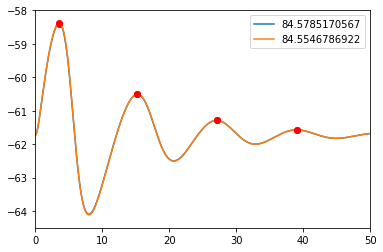

In [198]:

eigenfreq3(kepler)

In [57]:
def eigenfreq_new(derivative, I0, I1s, I1e, di):
    delta = True
    I0 = 5.0
    tmax = 1000.0
    dt = 0.01
    taus = 1.0
    dinput = 0.0
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    threshold = -50
    
    #set current for low frequency
    #di = .05 now as input
    #i0, i1 = 7.95 + di, 8
    i0, i1 = I1s, I1e
    iarray = np.arange(i0, i1 + di, di)
    rec_eigenfrequences, diff_eigenfrequences, thresh_eigenfrequences = np.zeros(len(iarray)), np.zeros(len(iarray)), np.zeros(len(iarray))
  
    #print(len(iarray))
    
    for ix in range(0, len(iarray)):
        if delta:
            stime = np.arange(0.0, .025 * taus, dt) #spiketime: [0, dt, 2dt, ..., 8taus] WHY 8?
        else:
            stime = np.arange(0.0, 1.5 * taus, dt) #spiketime: [0, dt, 2dt, ..., 8taus] WHY 8?
        spulse = (iarray[ix]-I0) + 0 * stime
    
        dp_high = 1000.0 / 20

        pulses = np.arange(0.0, tmax-(1.5*taus), dp_high) #pulses occuring between 0 and tmax-8taus with dist. dp
        current = np.zeros(len(time)) + I0 #current = I0 for all the time

        for pt in pulses: #loop through all the pulse-times
            current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
        
        t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
    
    #find maxima:
             
        maxima_indices, xyz = detect_peaks(x[0][10000:(10000+int(dp_high/dt))], .1)
        #maxima_times = maxima_indices * dt
        maxima_times, xyz2 = detect_peaks(x[0][10000:(10000+int(dp_high/dt))], .1, time = t[10000:(10000+int(dp_high/dt))])
        maxima_values = (x[0][10000+maxima_indices])

        thresh_maxima_indices = []
        
        if len(maxima_indices)>1:
            
        #eigenperiode
            eigenperiods = np.diff(maxima_indices)

            for threshcheck in range(0, len(maxima_indices), 1):
                if maxima_values[threshcheck] < threshold:
                    thresh_maxima_indices.append(maxima_indices[threshcheck])
            
            
            thresh_eigenperiods = np.diff(thresh_maxima_indices)#[0]
            thresh_maxima_times = np.asarray(thresh_maxima_indices) * dt
            thresh_maxima_values = (x[0][10000+np.asarray(thresh_maxima_indices)])
            
            diff_eigenperiod = eigenperiods[0] * dt
            rec_eigenperiod = np.mean(eigenperiods) * dt
            thresh_eigenperiod = np.mean(thresh_eigenperiods) * dt
            
            
            
            #print('maxima indices are: {}'.format(maxima_indices))
            #print('the periods are: {}'.format(eigenperiods))
            #print('maxima values are: {}'.format(maxima_values))
            #print('from which are indices: {} under the threshold'.format(thresh_maxima_indices))
            
            
            
            #print('diff. eigenperiod is {:.2f}'.format(diff_eigenperiod))
            #print('rec. eigenperiod is {:.2f}'.format(rec_eigenperiod))
            #print('thresh. eigenperiod is {:.2f}'.format(thresh_eigenperiod))

            
        #compute eigenfrequence
            rec_eigenfrequences[ix] = 1000.0 / rec_eigenperiod
            diff_eigenfrequences[ix] = 1000.0 / diff_eigenperiod
            thresh_eigenfrequences[ix] = 1000.0 / thresh_eigenperiod
            
            #plt.figure(figsize=(15,8))
            plt.plot(t, x[0])
            plt.plot(thresh_maxima_times, thresh_maxima_values, 'o')
            plt.axis((-1,dp_high+1,-66,40))
        
        

        #print('recent computed eigenfrequence for I1 = {:.2f} is: {:.2f}'.format(iarray[ix], rec_eigenfrequences[ix]))
        #print('diff. computed eigenfrequence for I1 = {:.2f} is: {:.2f}'.format(iarray[ix], diff_eigenfrequences[ix]))
        print('thresh. computed eigenfrequence for I1 = {:.2f} is: {:.2f}'.format(iarray[ix], thresh_eigenfrequences[ix]))
        
    #return thresh_eigenfrequences
    #return diff_eigenfrequences

thresh. computed eigenfrequence for I1 = 130.10 is: 84.36
thresh. computed eigenfrequence for I1 = 130.15 is: 84.34


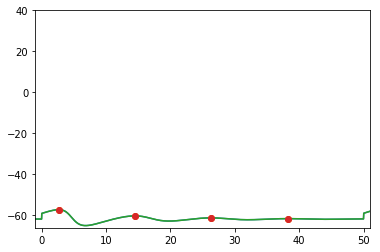

In [59]:
eigenfreq_new(kepler, 5.0, 130.1, 130.1)

In [16]:
#TODO


recchirp = True
expchirp = False #put recchirp True too

def myownSign2(x):
    y = np.zeros(len(x))
    for i in range(0, len(y), 1):
        if x[i] > 0:
            y[i] = 1
    return y


def freqoutput2(f0, f1, t1, t):
    return (f0/1000) + (((f1-f0)/1000) * t / t1)

def resonance2(derivative, I0, I1s, I1e, di):
    
    tmax = 2000.0
    dt = 0.01
    taus = 1.0

    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]

    iarray = np.arange(I1s, I1e + di, di)

    print('making {} step(s)'.format(len(iarray)))
    resonances = []
    
    for ix in range(0, len(iarray)):
        
        current = np.zeros(len(time)) + I0 #current = I0 for all the time
        
        spulse = (iarray[ix]-I0)*signal.chirp(time, f0= 150/1000, f1=30/1000, t1=2000, method='linear', phi = -90)
        
        if recchirp:
            #spulse = np.sign(spulse)
            spulse = myownSign2(spulse)*iarray[ix]
            
                
        
        
        if expchirp: #spikes at about I1 = 3, keeps resonance relatively constant
            spikesstart = time[:-1][(spulse[:-1]==0) & (spulse[1:]>0)]
            spikesstart = np.concatenate(([0], spikesstart))
            #spikesstart = spikesstart[:-1]
            print(spikesstart)
            #print(1000.0/np.diff(spikesstart))
            #print(len(spikesstart))
            
            spikeends = time[:-1][(spulse[:-1]>0) & (spulse[1:]==0)]
            print(spikeends)
            #print(len(spikeends))
            
            tauses = (spikeends - spikesstart)/8
            tauses = 1
            
            
            for addspikes in range(0, len(spikesstart)):
                spikelength = np.arange(0.0, 8, dt)
                #spikelength = np.arange(0.0, 9 * tauses[addspikes], dt)
                #print('the length of spikelength is : {}'.format(len(spikelength)))
                #spulse = (iarray[ix]-I0)*spikelength*np.exp(1.0-spikelength/tauses[addspikes])/tauses[addspikes]
                spulse = (iarray[ix]-I0)*spikelength*np.exp(1.0-spikelength/tauses)/tauses
                #print(int(spikesstart[addspikes]/dt))
                #print(int(spikesstart[addspikes]/dt)+len(spikelength))
                #print('the length of spulse is : {}'.format(len(spulse)))

                #print('the length of the interval in which spulse is added is: {}'.format((spikesstart[addspikes]/dt)+len(spikelength)-int(spikesstart[addspikes]/dt)))
                current[int(spikesstart[addspikes]/dt):int(spikesstart[addspikes]/dt)+len(spikelength)] += spulse
        else:
            current += spulse

        
        t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)

        
        spiked = False
        
        plt.figure(figsize=(9,5))
        plt.plot(t, i, 'r')
        plt.axis((0, 100, 0, 10))
        #plt.axis((1965, 1983, 0, 2))
        
        if np.max(x[0][10000:]) > -20:
            
            spiked = True
            print('Neuron is spiking at I1 = {:.5f}'.format(iarray[ix]))
            plt.figure(figsize=(9,5))
            plt.plot(t,x[0])
            resonance = 0
            resonances.append(resonance)
            
        
        else:
            resonance_indice = np.argmax(x[0][10000:])
            resonance_indice_1low = np.argmax(x[0][:resonance_indice-1000])
            resonance_voltage = x[0][np.argmax(x[0][10000:])]
            #resonance_voltage_1low = x[0][np.argmax(x[0][:np.argmax(x[0])]
            resonance_indice = resonance_indice - 10000
            resonance_indice_1low = resonance_indice_1low - 10000
            resonance_time = resonance_indice * dt
            resonance_time_1low = resonance_indice_1low * dt
            resonance = freqoutput2(150, 30, 2000, resonance_time) * 1000
            #resonance_1low = freqoutput2(30, 200, 500, resonance_time_1low) * 1000
            resonances.append(resonance)
            print('Neuron not spiking at I1 = {:.5f}, resonance frequency = {}'.format(iarray[ix], resonance))
            #print('resonance 1 spike lower is: {}'.format(resonance_1low))
            
            plt.figure(figsize=(9,5))
            plt.plot(t,x[0], label = iarray[ix])
            plt.axvline(x=resonance_time, color = 'r', label = 'resonance')
            #plt.axvline(x=resonance_time_1low, color = 'r', label = 'resonance_1low')
            plt.legend()
            
       # plt.figure(figsize=(9,5))
        #plt.plot(t,x[0], label = iarray[ix])
       # plt.plot(t,i)
        #plt.legend()
    return resonances
        

In [21]:


def myownSign2(x):
    y = np.zeros(len(x))
    for i in range(0, len(y), 1):
        if x[i] > 0:
            y[i] = 1
        else:
            y[i] = 0
    return y


def freqoutput2(f0, f1, t1, t):
    return (f0/1000) + (((f1-f0)/1000) * t / t1)

def resonance2(derivative, I0, I1s, I1e, di):
    
    tmax = 2000.0
    dt = 0.01
    taus = 1.0

    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]

    iarray = np.arange(I1s, I1e + di, di)

    print('making {} step(s)'.format(len(iarray)))
    resonances = []
    
    for ix in range(0, len(iarray)):
        
        current = np.zeros(len(time)) + I0 #current = I0 for all the time
        
        spulse = (iarray[ix]-I0)*signal.chirp(time, f0= 150/1000, f1=30/1000, t1=2000, method='linear', phi = -90)
        
        spulse = myownSign2(spulse)*iarray[ix]
            
        t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)

        
        spiked = False
        
        plt.figure(figsize=(9,5))
        plt.plot(t, i, 'r')
        plt.axis((0, 100, 0, 10))
        #plt.axis((1965, 1983, 0, 2))
'''        
        if np.max(x[0][10000:]) > -20:
            
            spiked = True
            print('Neuron is spiking at I1 = {:.5f}'.format(iarray[ix]))
            plt.figure(figsize=(9,5))
            plt.plot(t,x[0])
            resonance = 0
            resonances.append(resonance)
            
        
        else:
            resonance_indice = np.argmax(x[0][10000:])
            resonance_indice_1low = np.argmax(x[0][:resonance_indice-1000])
            resonance_voltage = x[0][np.argmax(x[0][10000:])]
            #resonance_voltage_1low = x[0][np.argmax(x[0][:np.argmax(x[0])]
            resonance_indice = resonance_indice - 10000
            resonance_indice_1low = resonance_indice_1low - 10000
            resonance_time = resonance_indice * dt
            resonance_time_1low = resonance_indice_1low * dt
            resonance = freqoutput2(150, 30, 2000, resonance_time) * 1000
            #resonance_1low = freqoutput2(30, 200, 500, resonance_time_1low) * 1000
            resonances.append(resonance)
            print('Neuron not spiking at I1 = {:.5f}, resonance frequency = {}'.format(iarray[ix], resonance))
            #print('resonance 1 spike lower is: {}'.format(resonance_1low))
            
            plt.figure(figsize=(9,5))
            plt.plot(t,x[0], label = iarray[ix])
            plt.axvline(x=resonance_time, color = 'r', label = 'resonance')
            #plt.axvline(x=resonance_time_1low, color = 'r', label = 'resonance_1low')
            plt.legend()
            
       # plt.figure(figsize=(9,5))
        #plt.plot(t,x[0], label = iarray[ix])
       # plt.plot(t,i)
        #plt.legend()
    return resonances
'''       

"        \n        if np.max(x[0][10000:]) > -20:\n            \n            spiked = True\n            print('Neuron is spiking at I1 = {:.5f}'.format(iarray[ix]))\n            plt.figure(figsize=(9,5))\n            plt.plot(t,x[0])\n            resonance = 0\n            resonances.append(resonance)\n            \n        \n        else:\n            resonance_indice = np.argmax(x[0][10000:])\n            resonance_indice_1low = np.argmax(x[0][:resonance_indice-1000])\n            resonance_voltage = x[0][np.argmax(x[0][10000:])]\n            #resonance_voltage_1low = x[0][np.argmax(x[0][:np.argmax(x[0])]\n            resonance_indice = resonance_indice - 10000\n            resonance_indice_1low = resonance_indice_1low - 10000\n            resonance_time = resonance_indice * dt\n            resonance_time_1low = resonance_indice_1low * dt\n            resonance = freqoutput2(150, 30, 2000, resonance_time) * 1000\n            #resonance_1low = freqoutput2(30, 200, 500, resonance_time_

making 1 step(s)


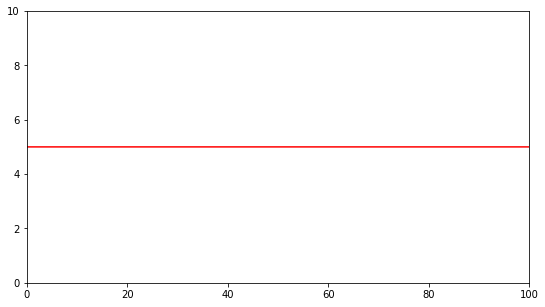

In [23]:
resonance2(kepler, 5, 5, 5, .05)

In [47]:
freqoutput2(200, 1, 2000, 1400) * 1000

60.7

(1900, 1950, -5, 5)

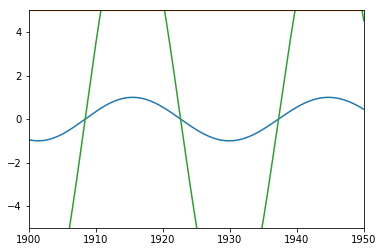

In [40]:
tmax = 2000.0
dt = .01
I0 = 5.0
I1 = 10.0
time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
plt.plot(time, signal.chirp(time, f0= 150/1000, f1=30/1000, t1=2000, method='linear', phi = -90))
current = np.zeros(len(time)) + I0 #current = I0 for all the time
plt.plot(time, current)  

plt.plot(time, I1*signal.chirp(time, f0= 150/1000, f1=30/1000, t1=2000, method='linear', phi = -90))
plt.axis((1900,1950,-5,5))
#spulse = myownSign2(spulse)*iarray[ix]

(1800, 1900, 0, 15)

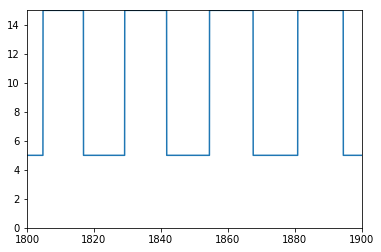

In [43]:
current = np.zeros(len(time)) + I0 #current = I0 for all the time
        
spulse = (I1-I0)*signal.chirp(time, f0= 150/1000, f1=30/1000, t1=2000, method='linear', phi = -90)
        
spulse = myownSign2(spulse)*I1

current += spulse

plt.plot(time, current)
plt.axis((1800, 1900, 0, 15))

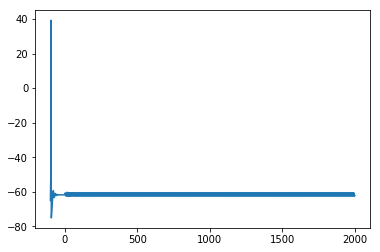

In [49]:
I0 = 5.0
I1 = 6.0


In [58]:
#TODO
#TODO
#TODO
#TODO
#TODO
freqs = np.arange(80, 90, .5)
maxes = []
for chirp in np.arange(6.2, 6.45, .25):
    #print(len(np.arange(5.25, 5.5, .25)))
    for f in freqs:
        #print(len(np.arange(30, 120, 5)))
        I0 = 5.0
        I1 = chirp
        freq = f
        tmax = 2000.0
        taus = 1.0
        dt = 0.01
        time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
        thresh = -20.0
        stime = np.arange(0.0, 1.5 * taus, dt) #delta = .025
        spulse = (I1-I0) + 0 * stime

        rates = [] #creates empty array
        dp = 1000.0/freq          #period = distance of pulses (= 1000 ms / frequency)
        pulses = np.arange(0.0, tmax-(1.5*taus), dp) #pulses occuring between 0 and tmax-8taus with dist. dp
        current = np.zeros(len(time)) + I0 #MAXEcurrent = I0 for all the time
        for pt in pulses: #loop through all the pulse-times
            current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
                    #add spulse (growth) while current is between pt and pt + 8tau/dt (= back at rest. pot)
                    # = adds a full spulse on the current to the next pulse (dimensions are perfectly fit)
        t, i, x = trajectory(kepler, -100.0, tmax, I0, current, -65.0, -65.0)
        maxv = np.max(x[0][10000:])
        #plt.plot(t[10000:], x[0][10000:])
        print('frequency {}'.format(f))
        print(maxv)
        maxes.append(maxv)
print(maxes)
print(np.max(maxes))

frequency 80.0
-59.3576326659
frequency 80.5
-59.2840065341
frequency 81.0
-59.2165994762
frequency 81.5
-59.1600190797
frequency 82.0
-59.1176578847
frequency 82.5
-59.0932040591
frequency 83.0
-59.0856369284
frequency 83.5
-59.0915114991
frequency 84.0
-59.1082154275
frequency 84.5
-59.1321019571
frequency 85.0
-59.1601628642
frequency 85.5
-59.1895567927
frequency 86.0
-59.2228435684
frequency 86.5
-59.2566255969
frequency 87.0
-59.2876084681
frequency 87.5
-59.3237630715
frequency 88.0
-59.3554458485
frequency 88.5
-59.3883437789
frequency 89.0
-59.4240550574
frequency 89.5
-59.4578534624
[-59.357632665898791, -59.28400653409512, -59.216599476237512, -59.160019079746235, -59.117657884724096, -59.093204059119742, -59.085636928390862, -59.091511499083161, -59.1082154275107, -59.132101957087059, -59.160162864211053, -59.189556792741477, -59.222843568354662, -59.256625596873512, -59.287608468059247, -59.323763071469301, -59.355445848529193, -59.388343778879054, -59.424055057407493, -59

In [25]:
signal.chirp?

In [120]:

def plotcircle(x) :
    
    if x<0:
        x += 2 * np.pi
    
    
    ax = plt.axes()
    x0 = .5
    y0 = .5
    rad = .4
    angle = (x / (2 * np.pi))*360
    angle_rad = angle * np.pi / 180
    circle = plt.Circle((x0,y0), rad, color='red', fill=False)
    fig = plt.gcf()
    fig.gca().add_artist(circle)

    #draw an arrow
    head_length = 0.05
    ax.arrow(x0, y0,
         (rad - head_length) * np.cos(angle_rad),
         (rad - head_length) * np.sin(angle_rad),
         head_width=0.05, head_length=head_length, fc='k', ec='k')

# Newest Version of spikeresponse

In [15]:

expinput = True
sineinput = False
noise = False

        

def spikeresponse_eigenf(derivative, I0, I1, freq) :
    tmax = 1000.0
    dt = 0.01
    df = 1.0
    taus = 1.0
    dinput = 0.0
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    thresh = -20.0

    
    stime = np.arange(0.0, 8.0*taus, dt) #pulsetime: [0, dt, 2dt, ..., 8taus]
    
    #shorter pulsetime for rectangle input
    if (expinput == False) & (sineinput == False):
        stime = np.arange(0.0, 6.0*taus, dt)
    
    #rectangle input
    spulse = (I1-I0) + 0 * stime
    
    #exp input
    if expinput:
        spulse = (I1-I0)*stime*np.exp(1.0-stime/taus)/taus #see below for better description
   
    #eigenfrequence    
    #eigenfrequence = eigenfreq(derivative, tmax, I0, I1, spulse, taus, time, dt) 
        
    
    #period = distance of pulses (= 1000 ms / frequency)
    dp = 1000.0/freq
    
    #pulses occuring between 0 and tmax-8taus with dist. dp
    pulses = np.arange(0.0, tmax-8.0*taus, dp)
    
    #later endingtime for shorter rectangle input
    if (expinput == False) & (sineinput == False):
        pulses = np.arange(0.0, tmax-6.0*taus, dp)
    
    
    #current = I0 for all the time
    current = np.zeros(len(time)) + I0
    
    #sine input
    if sineinput:
        spulse = (I1-I0)*np.sin(freq*time*((2*np.pi)/1000))
        current += spulse
    else:
        for pt in pulses: #loop through all the pulse-times
            current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
    
    #NOISE    
    if noise:
        current += (np.random.randn(len(current)) * np.sqrt((2*dinput)/dt))   
            
    #get time, current and voltage
    t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
    
    #array of times where value just jumps over threshold
    spikes = t[:-1][(x[0][:-1]<thresh) & (x[0][1:]>=thresh)]
    

    #only pick spikes, which occur for t>100ms - for plots
    spikes = spikes[spikes>0.0]
    
    #RATE
    rate = 0.0
    if len(spikes) > 2: #more han two spikes occur
        rate = 1000.0*(len(spikes)-1)/(spikes[-1]-spikes[0])
     
    
    #PHASE, VECTORSTRENGTH:

    phis = np.zeros(len(spikes))
    phis = ((spikes % dp) / dp) * 2 * np.pi
    phis_x = np.cos(phis)
    phis_y = np.sin(phis)
    
    phis_x_mean = np.mean(phis_x)
    phis_y_mean = np.mean(phis_y)
    
    phi_mean = np.arctan2(phis_y_mean, phis_x_mean)
    vector_strength = np.sqrt(phis_x_mean**2 + phis_y_mean**2)
        
    if phi_mean < 0:
        phi_mean += 2 * np.pi
        
    if rate == 0.0:
        phi_mean = -1
        vector_strength = -1
    
    #return rate/freq, eigenfrequence
    return t, x[0], i, vector_strength#, eigenfrequence
    
    #plt.figure(figsize=(10,10))
    #plt.plot(t, x[0], label = eigenfrequence)
    #plt.axis((-1,100, -64, -60))
    #plt.legend()
'''
df, di = 1, .1
f0, f1 = 80, 84
i0, i1 = 6.5 + di, 7
fgrid, igrid = np.mgrid[slice(f0, f1 + df, df), slice(i0, i1 + di, di)]

zx = np.zeros(shape=(len(fgrid[:,1]), len(igrid[1,:])))
eigenfreqs = np.zeros(shape=(len(igrid)))


for i in range(0, len(igrid[1,:])):
    for f in range(0, len(fgrid[:,1])):
        zx[f][i], eigenfreqs[i] = spikeresponse_eigenf(kepler, 5.0, igrid[0][i], fgrid[f][0])
        print('i[{}] = {}, f[{}] = {}, rateratio = {}, eigenfreqs[{}] = {}'.format(i, igrid[0][i], f, fgrid[f][0], zx[f][i], i, eigenfreqs[i]))
'''

"\ndf, di = 1, .1\nf0, f1 = 80, 84\ni0, i1 = 6.5 + di, 7\nfgrid, igrid = np.mgrid[slice(f0, f1 + df, df), slice(i0, i1 + di, di)]\n\nzx = np.zeros(shape=(len(fgrid[:,1]), len(igrid[1,:])))\neigenfreqs = np.zeros(shape=(len(igrid)))\n\n\nfor i in range(0, len(igrid[1,:])):\n    for f in range(0, len(fgrid[:,1])):\n        zx[f][i], eigenfreqs[i] = spikeresponse_eigenf(kepler, 5.0, igrid[0][i], fgrid[f][0])\n        print('i[{}] = {}, f[{}] = {}, rateratio = {}, eigenfreqs[{}] = {}'.format(i, igrid[0][i], f, fgrid[f][0], zx[f][i], i, eigenfreqs[i]))\n"

In [6]:

def spikeresponse_rec15(derivative, I0, I1, freq) :
    tmax = 2000.0
    #tmax = 2000.0
    dt = 0.01
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    thresh = -20.0
    taus = 1.0 #changed taus as an input
    stime = np.arange(0.0, 1.5 * taus, dt) #spiketime: [0, dt, 2dt, ..., 8taus] WHY 8?
    spulse = (I1-I0) + 0 * stime

    rates = [] #creates empty array
    dp = 1000.0/freq          #period = distance of pulses (= 1000 ms / frequency)
    pulses = np.arange(0.0, tmax-(1.5*taus), dp) #pulses occuring between 0 and tmax-8taus with dist. dp
    current = np.zeros(len(time)) + I0 #current = I0 for all the time
    for pt in pulses: #loop through all the pulse-times
        current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
            #add spulse (growth) while current is between pt and pt + 8tau/dt (= back at rest. pot)
            # = adds a full spulse on the current to the next pulse (dimensions are perfectly fit)
    t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
        #...
    spikes = t[:-1][(x[0][:-1]<thresh) & (x[0][1:]>=thresh)]
        #array of times where value just jumps over threshhold
    spikes = spikes[spikes>1200.0] #only pick spikes which occur for t>100ms
    rate = 0.0
    if len(spikes) > 2: #more han two spikes occur
        rate = 1000.0*(len(spikes)-1)/(spikes[-1]-spikes[0]) #
    rates.append(rate) #put all rate together in rates (evaluate one rate per frequency)
    '''
    plt.figure(figsize=(18,12))
    plt.plot(t, x[0])
    plt.axvline(x=200 + 425 * 0, color = 'red')
    plt.axvline(x=200 + 425 * 1, color = 'red')
    plt.axvline(x=200 + 425 * 2, color = 'red')
    plt.axvline(x=200 + 425 * 3, color = 'red')
    plt.axis((190, 1600, -80, -10))
    '''
    #return rate, t, x[0], i
    return t, x, i

C:\Programmieren\Anaconda3\lib\site-packages\matplotlib\pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


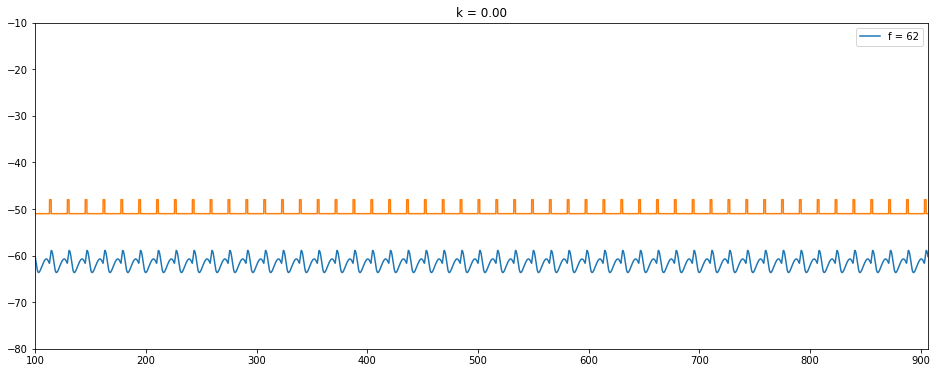

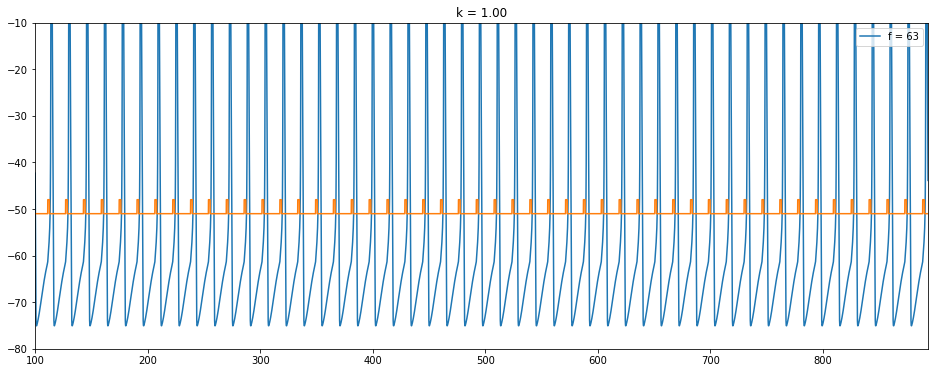

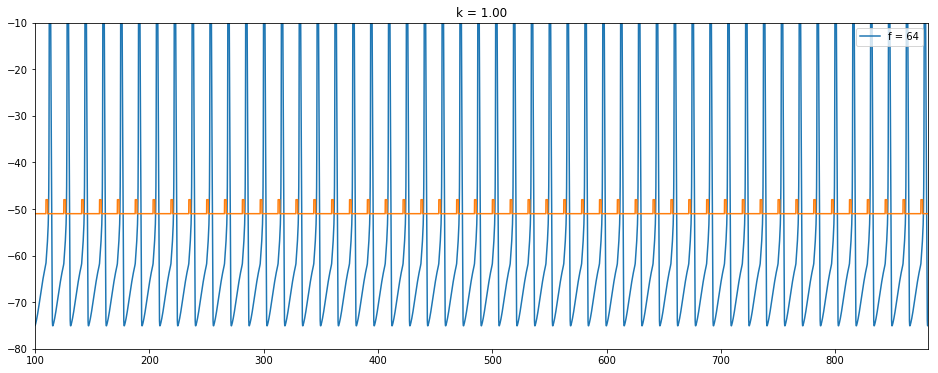

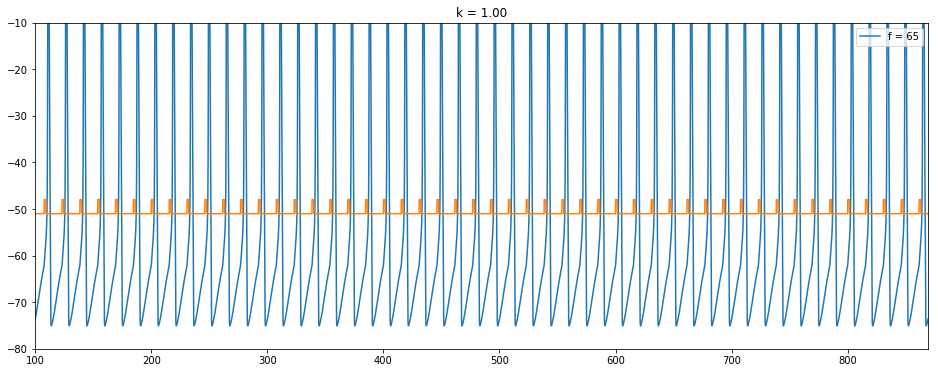

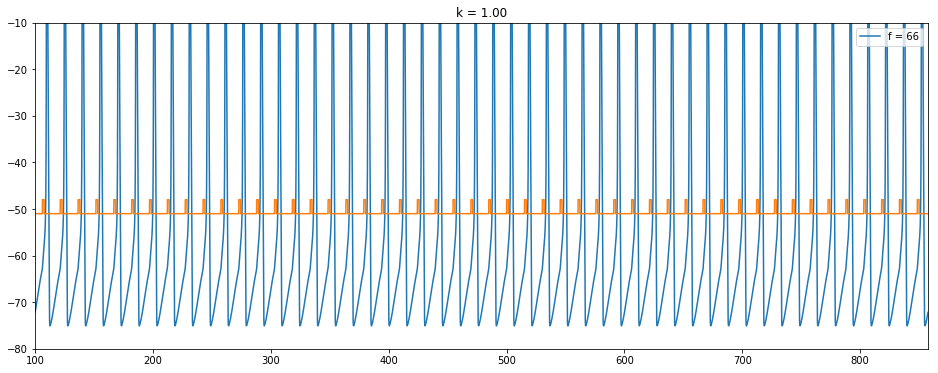

...

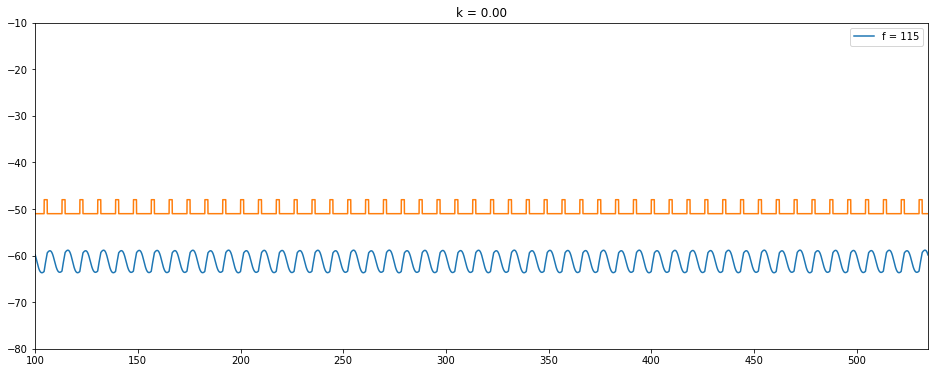

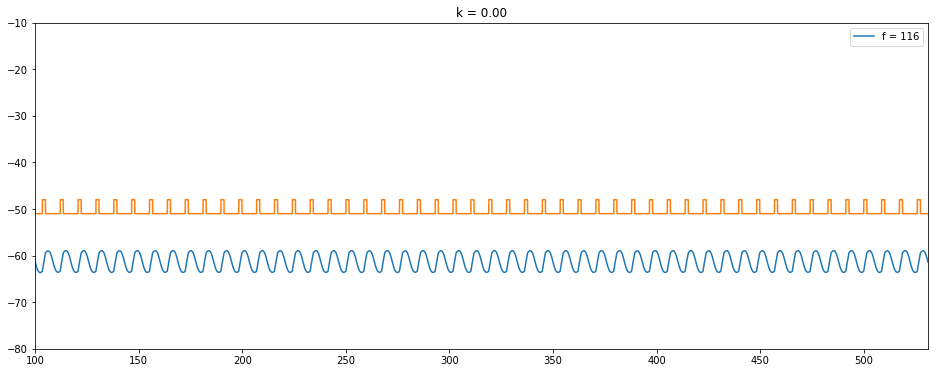

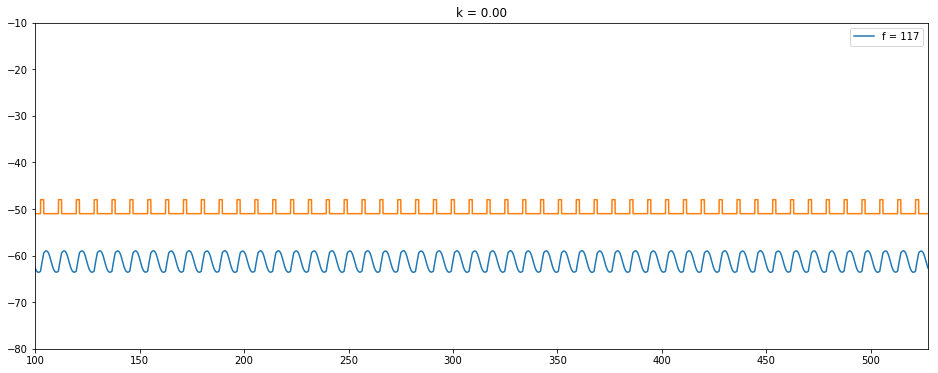

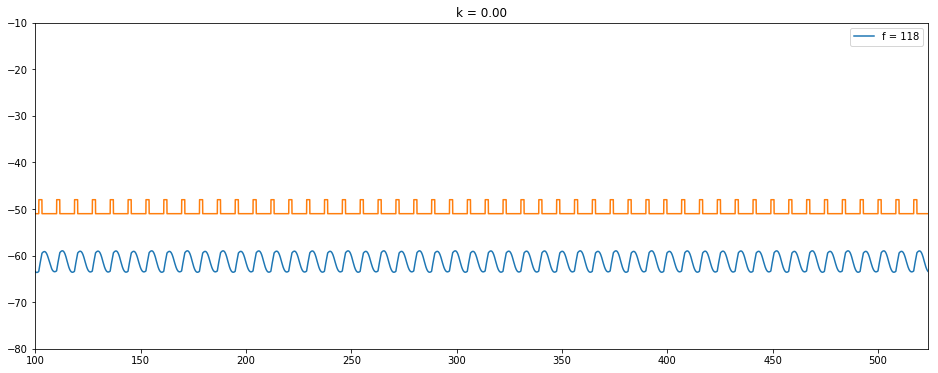

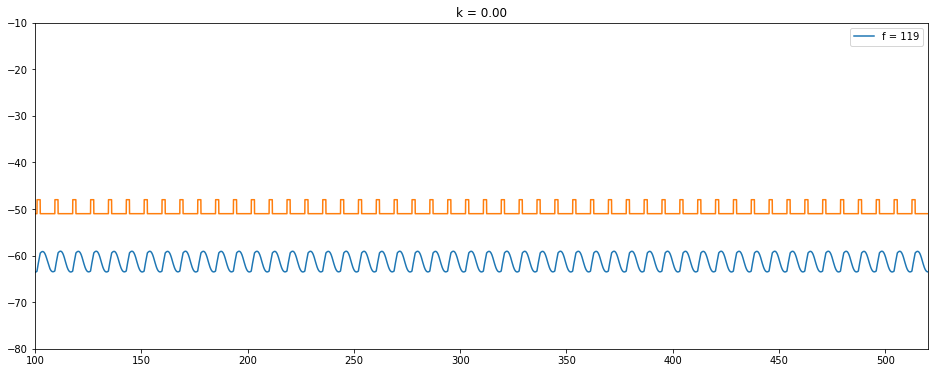

In [40]:
for f in np.arange(62, 120, 1):
    rate, t, x, i = spikeresponse_rec15(kepler, 5.0, 8, f)
    plt.figure(figsize=(16,6))
    plt.plot(t, x, label = 'f = {}'.format(f))
    plt.title('k = {:.2f}'.format(rate/f))
    plt.plot(t, (i-56))
    plt.axis((100,100+50*1000.0/f ,-80,-10))
    plt.legend(loc = 'upper right')

In [4]:

#AOI of which we need a histogramm: I0 = 5, I1 = 8, f = {x1,x2,x3,...}


def spikeresponse_rec15_hist(derivative, I0, I1, freq) :
    #tmax = 10000.0
    #tmax = 600.0
    tmax = 2000.0
    dt = 0.01
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    thresh = -20.0
    taus = 1.0 #changed taus as an input
    stime = np.arange(0.0, 1.5 * taus, dt) #spiketime: [0, dt, 2dt, ..., 8taus] WHY 8?
    spulse = (I1-I0) + 0 * stime

    rates = [] #creates empty array
    dp = 1000.0/freq          #period = distance of pulses (= 1000 ms / frequency)
    pulses = np.arange(0.0, tmax-(1.5*taus), dp) #pulses occuring between 0 and tmax-8taus with dist. dp
    current = np.zeros(len(time)) + I0 #current = I0 for all the time
    for pt in pulses: #loop through all the pulse-times
        current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
            #add spulse (growth) while current is between pt and pt + 8tau/dt (= back at rest. pot)
            # = adds a full spulse on the current to the next pulse (dimensions are perfectly fit)
    t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
        #...
    spikes = t[:-1][(x[0][:-1]<thresh) & (x[0][1:]>=thresh)]
        #array of times where value just jumps over threshhold
    spikes = spikes[spikes>1200.0] #only pick spikes, which occur for t>100ms
    rate = 0.0
    if len(spikes) > 2: #more han two spikes occur
        rate = 1000.0*(len(spikes)-1)/(spikes[-1]-spikes[0]) #
    rates.append(rate) #put all rate together in rates (evaluate one rate per frequency)
    
    phis = np.zeros(len(spikes))
    phis = ((spikes % dp) / dp) * 2 * np.pi
    phis_x = np.cos(phis)
    phis_y = np.sin(phis)
    
    phis_x_mean = np.mean(phis_x)
    phis_y_mean = np.mean(phis_y)
    
    phi_mean = np.arctan2(phis_y_mean, phis_x_mean)
    vector_strength = np.sqrt(phis_x_mean**2 + phis_y_mean**2)
        
    if phi_mean < 0:
        phi_mean += 2 * np.pi
        
    if rate == 0.0:
        phi_mean = -1
        vector_strength = -1
    
    
    
    #SPIKE DETECTION

    maxima_indices, xyz = detect_peaks(x[0][10000:(10000+int(dp/dt))], .1)
    maxima_times = maxima_indices * dt
    
    
    maxima_values = (x[0][10000+maxima_indices])
    
    #print(maxima_indices)
    #plt.plot(t, i)
    #
    #plt.plot(t, x[0])
    #plt.plot(maxima_times+200, maxima_values, 'o')
    #plt.axis((200,300,-60,40))
    isi = np.diff(maxima_indices)
    rel_isi = (isi / dp) * dt
    
    #print(isi)
    #print(rel_isi)
    
    #bins = np.linspace(np.min(rel_isi), np.max(rel_isi), 20)
    bins = np.linspace(.9, 6, 20)
    
    #plt.figure(figsize=(12,5))
    #plt.hist(rel_isi, bins)#, normed=True)
    #plt.title('k = {:.2f}, f = {}'.format(rate/freq, freq))
    
    #put isi in different bins: min should be one dp (period), max wil be about some periods
    #scott histogramm? $w = \frac {3.49 \cdot \sigma} {\sqrt[3]{n}}$

    #plt.plot(t, x[0])
    #plt.plot(maxima_times, maxima_values, 'o')
    #plt.axis((-1,dp,-66,-55))
    #return rate/freq, vector_strength
    
    
    return t, x[0], i, rate/freq
    #return rate/freq, vector_strength

In [ ]:
t, x, i = spikeresponse_rec15_hist(kepler, 5.0, 8.0, freq)

plt.plot(t, np.correlate())

In [ ]:
(int((int(1000.0/83)-int(1000.0/iinterval[iwalk]))/.01))*29

In [122]:
walk = np.arange(1,11,1)
len(walk)
x1 = ([0,10,0,0,0,0,0,0,0,0])
#x1 = np.random.rand(10)
#t123 = np.arange(0,1, .01)
xstep = walk[-1][(x1[:-1]==0) & (x1[1:]!=0)]
#spikes = t[:-1][(x[0][:-1]<thresh) & (x[0][1:]>=thresh)]
xstep

array([], dtype=int32)

In [60]:
walk[-1][(x1[:-1]==0) & (x1[1:]!=0)]

array([], dtype=int32)

In [15]:


def linregress(x): #[x e []]
    return -62.2+(x+61.52)*(.19/.329)

fit = stats.linregress([-61.15, -59.84], [linregress(-61.15), -61.53])

#poi_v = np.asarray([-61.6, -61.5])
poi_v = np.arange(-61.6, -61.15, .05)
poi_u = linregress(poi_v)

v63, u63 = (-61.43295298479063,-62.396537424164485)#!
v64, u64 = (-61.82227338369585,-62.449932671392624)
v65, u65 = (-62.27383019943414,-62.47977347396391)
v66, u66 = (-62.917468717536494,-62.465121455762926)

v102, u102 = (-59.83722020476104,-61.528981858519735)#!
v103, u103 = (-59.83517083560431,-61.563768952856826)
v104, u104 = (-59.84959994019788,-61.5945981460203)
v105, u105 = (-59.86814513645055,-61.63154092755905)
v106, u106 = (-59.885666666381226,-61.670942207421575)
v107, u107 = (-59.90847714286991,-61.707211522419904)#!!

fpu = -61.7315242527

v83, u83 = (-61.47969026248684,-62.198363885013435)
v84, u84 = (-61.28936792275013,-62.11274914597702)
v85, u85 = (-61.2429977193729,-62.073980552291516)
v86, u86 = (-61.186798477262315,-62.02995882201021)
v87, u87 = (-61.18218043887274,-62.01848305077228)
v88, u88 = (-61.17884429547091,-62.014878852529506)
v89, u89 = (-61.20404898965334,-62.026338294082564)
v90, u90 = (-61.23063958671107,-62.04225842445636)
v91, u91 = (-61.27963202236668,-62.06840940325215)
v92, u92 = (-61.353696650443716,-62.10217202598505)
v93, u93 = (-61.46358280370734,-62.144476615800485)
v94, u94 = (-61.64782984325423,-62.20129502734912)

#-61.6, linregress(-61.6)
#v102, u102 = (-59.83722020476104,-61.528981858519735)


    
v11 = np.asarray([v63, v64, v65, v66])
u11 = np.asarray([u63, u64, u65, u66])

v21 = np.asarray([v102, v103, v104, v105, v106, v107])
u21 = np.asarray([u102, u103, u104, u105, u106, u107])

v31 = np.asarray([v83, v84, v85, v86, v87, v88, v89, v90, v91, v92, v93, v94])
u31 = np.asarray([u83, u84, u85, u86, u87, u88, u89, u90, u91, u92, u93, u94])

check_v22 = np.arange(-61.25, -59.75, .1)
check_u22 = -61.732


check_v2 = np.arange(-61.25, -59.25, .1)
check_u2 = check_v2 * fit.slope + fit.intercept


mymap = plt.get_cmap('viridis')

def spikeresponse_inv_trajec(derivative, I0, I1, freq) :
    #tmax = 10000.0
    #tmax = 600.0
    tmax = 1000.0
    dt = 0.01
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    thresh = -20.0
    
    
    taus = 1.0 #changed taus as an input
    
    stime = np.arange(0.0, 1.5 * taus, dt) #spiketime: [0, dt, 2dt, ..., 8taus] WHY 8?
    
    spulse = (I1-I0) + 0 * stime

    rates = [] #creates empty array
    dp = 1000.0/freq          #period = distance of pulses (= 1000 ms / frequency)
    pulses = np.arange(0.0, tmax-(1.5*taus), dp) #pulses occuring between 0 and tmax-8taus with dist. dp
    current = np.zeros(len(time)) + I0 #current = I0 for all the time
    for pt in pulses: #loop through all the pulse-times
        current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
            #add spulse (growth) while current is between pt and pt + 8tau/dt (= back at rest. pot)
            # = adds a full spulse on the current to the next pulse (dimensions are perfectly fit)
    

        #...
    #spikes = t[:-1][(x[0][:-1]<thresh) & (x[0][1:]>=thresh)]
        #array of times where value just jumps over threshhold
    #spikes = spikes[spikes>200.0] #only pick spikes, which occur for t>100ms
    #rate = 0.0
    #if len(spikes) > 2: #more han two spikes occur
    #    rate = 1000.0*(len(spikes)-1)/(spikes[-1]-spikes[0]) #
    #rates.append(rate) #put all rate together in rates (evaluate one rate per frequency)
    eigenperiod = int(1000.0/84/dt)
    
        

    
    
    #get fixpoint
    t0, x0, i0 = spikeresponse_trajec(kepler, 5.0, 5.0, 84, False)

    
    print(x0)
    print(i0)
    
    fp_v = x0[0][10000]
    fp_u = x0[1][10000]
    
    plt.figure(figsize=(10,7))
    
    print(fp_u)
    '''
    for ps in range(0, len(poi_v), 1):
        tp, ip, xp = inv_trajectory(derivative, -100.0, tmax, I0, current, poi_v[ps], poi_u[ps])
        #print(xp[0][:int(1000.0/84/dt/2)], xp[1][:int(1000.0/84/dt/2)])
        plt.plot(xp[0][:eigenperiod], xp[1][:eigenperiod])
        plt.plot(xp[0][int(.25*eigenperiod)], xp[1][int(.25*eigenperiod)], 'o')
        plt.plot(xp[0][int(.5*eigenperiod)], xp[1][int(.5*eigenperiod)], 'o')
        plt.plot(xp[0][int(.75*eigenperiod)], xp[1][int(.75*eigenperiod)], 'o')
        plt.plot(xp[0][int(1*eigenperiod)], xp[1][int(1*eigenperiod)], 'o')
        
    plt.plot(poi_v, poi_u)

    
    
    fit = stats.linregress([-61.15, -59.84], [linregress(-61.15), -61.53])
#plt.plot([-61.15, -59.84], [linregress(-61.15), -61.53])

    check_v = np.arange(-61, -59.5, .25)
    check_u = check_v * fit.slope + fit.intercept
    
    
    
    t65, i65, x65 = trajectory(derivative, 0, tmax, I0, current, v65, u65)
    plt.plot(x65[0][0*int(1000.0/65/dt):0*int(1000.0/65/dt)+int(eigenperiod*1.25)],x65[1][0*int(1000.0/65/dt):0*int(1000.0/65/dt)+int(eigenperiod*1.25)], label = 'f65')
    
    plt.plot(x65[0][0*int(1000.0/65/dt)+int(.25*eigenperiod)], x65[1][0*int(1000.0/65/dt)+int(.25*eigenperiod)], 'o', color = 'blue', label = '.25xef')
    plt.plot(x65[0][0*int(1000.0/65/dt)+int(.5*eigenperiod)], x65[1][0*int(1000.0/65/dt)+int(.5*eigenperiod)], 'o', color = 'green', label = '.5xef')
    plt.plot(x65[0][0*int(1000.0/65/dt)+int(.75*eigenperiod)], x65[1][0*int(1000.0/65/dt)+int(.75*eigenperiod)], 'o', color = 'orange', label = '.75xef')
    plt.plot(x65[0][0*int(1000.0/65/dt)+int(1*eigenperiod)], x65[1][0*int(1000.0/65/dt)+int(1*eigenperiod)], 'o', color = 'yellow', label = '1xef')
    t102, i102, x102 = trajectory(derivative, 0, tmax, I0, current, v102, u102)
    plt.plot(x102[0][0*int(1000.0/65/dt):0*int(1000.0/65/dt)+int(eigenperiod*1.25)], x102[1][0*int(1000.0/65/dt):0*int(1000.0/65/dt)+int(eigenperiod*1.25)], label = 'f102')
    
    plt.plot(x102[0][0*int(1000.0/65/dt)+int(.25*eigenperiod)], x102[1][0*int(1000.0/65/dt)+int(.25*eigenperiod)], 'o', color = 'blue', label = '.25xef')
    plt.plot(x102[0][0*int(1000.0/65/dt)+int(.5*eigenperiod)], x102[1][0*int(1000.0/65/dt)+int(.5*eigenperiod)], 'o', color = 'green', label = '.5xef')
    plt.plot(x102[0][0*int(1000.0/65/dt)+int(.75*eigenperiod)], x102[1][0*int(1000.0/65/dt)+int(.75*eigenperiod)], 'o', color = 'orange', label = '.75xef')
    plt.plot(x102[0][0*int(1000.0/65/dt)+int(1*eigenperiod)], x102[1][0*int(1000.0/65/dt)+int(1*eigenperiod)], 'o', color = 'yellow', label = '1xef')
    
    for mid in range(0, len(check_v22), 1):
    #for mid in range(0, len(check_v2), 1):
        color = mymap(0 + float(mid)/(len(check_v22)-1))
        #tm, im, xm = inv_trajectory(derivative, -100.0, tmax, I0, current, check_v2[mid], check_u2[mid])
        tm, im, xm = inv_trajectory(derivative, -100.0, tmax, I0, current, check_v22[mid], check_u22)
        plt.plot(xm[0][:eigenperiod], xm[1][:eigenperiod], color = color)
        if mid == 0:
            plt.plot(xm[0][int(.25*eigenperiod)], xm[1][int(.25*eigenperiod)], 'o', color = 'blue', label = '.25xef')
            plt.plot(xm[0][int(.5*eigenperiod)], xm[1][int(.5*eigenperiod)], 'o', color = 'green', label = '.5xef')
            plt.plot(xm[0][int(.75*eigenperiod)], xm[1][int(.75*eigenperiod)], 'o', color = 'orange', label = '.75xef')
            plt.plot(xm[0][int(1*eigenperiod)], xm[1][int(1*eigenperiod)], 'o', color = 'yellow', label = '1xef')
        else:
            plt.plot(xm[0][int(.25*eigenperiod)], xm[1][int(.25*eigenperiod)], 'o', color = 'blue')
            plt.plot(xm[0][int(.5*eigenperiod)], xm[1][int(.5*eigenperiod)], 'o', color = 'green')
            plt.plot(xm[0][int(.75*eigenperiod)], xm[1][int(.75*eigenperiod)], 'o', color = 'orange')
            plt.plot(xm[0][int(1*eigenperiod)], xm[1][int(1*eigenperiod)], 'o', color = 'yellow')
        
        
    for ps2 in range(0, len(v21), 1):
        plt.plot(v21[ps2], u21[ps2], 'o', color = 'black')
    
    for ps1 in range(0, len(v11), 1):
        plt.plot(v11[ps1], u11[ps1], 'o', color = 'black')
        
    for ps3 in range(0, len(v31), 1):
        plt.plot(v31[ps3], u31[ps3], 'o', color = 'black')
       
        
        
        if xm[0][int(1*eigenperiod)] < -200:
            print(mid, check_v22[mid])
    #plt.plot(check_v2, check_u2)
    plt.plot(check_v22, np.zeros(len(check_v22))+check_u22)
    '''
        
    #t1, i1, x1 = trajectory(kepler, 0, tmax, 101.5, 101.5, -60, -62.5)
    #t2, i2, x2 = trajectory(kepler, 0, tmax, 101.5, 101.5, -58, -62.0)
    #t3, i3, x3 = trajectory(kepler, 0, tmax, 101.5, 101.5, -59.75, -61.15) 
    
    t1, i1, x1 = trajectory(kepler, 0, tmax, 5.0, 8.0, v63, u63)
    t2, i2, x2 = trajectory(kepler, 0, tmax, 5.0, 8.0, v84, u84)
    t3, i3, x3 = trajectory(kepler, 0, tmax, 5.0, 8.0, v105, u105)    
    plt.plot(x1[0][:eigenperiod], x1[1][:eigenperiod], color = mymap(0.0))
    plt.plot(x2[0][:eigenperiod], x2[1][:eigenperiod], color = mymap(.5))
    plt.plot(x3[0][:eigenperiod], x3[1][:eigenperiod], color = mymap(.99))
    
    plt.plot(x1[0][int(.25*eigenperiod)], x1[1][int(.25*eigenperiod)], 'o', color = 'blue', label = r'$\frac{p_e}{4}$')
    plt.plot(x1[0][int(.5*eigenperiod)], x1[1][int(.5*eigenperiod)], 'o', color = 'green', label = r'$\frac{p_e}{2}$')
    plt.plot(x1[0][int(.75*eigenperiod)], x1[1][int(.75*eigenperiod)], 'o', color = 'orange', label = r'$\frac{3p_e}{4}$')
    plt.plot(x1[0][int(1*eigenperiod)], x1[1][int(1*eigenperiod)], 'o', color = 'yellow', label = r'$\frac{p_e}{1}$')

    plt.plot(x2[0][int(.25*eigenperiod)], x2[1][int(.25*eigenperiod)], 'o', color = 'blue')
    plt.plot(x2[0][int(.5*eigenperiod)], x2[1][int(.5*eigenperiod)], 'o', color = 'green')
    plt.plot(x2[0][int(.75*eigenperiod)], x2[1][int(.75*eigenperiod)], 'o', color = 'orange')
    plt.plot(x2[0][int(1*eigenperiod)], x2[1][int(1*eigenperiod)], 'o', color = 'yellow')

    plt.plot(x3[0][int(.25*eigenperiod)], x3[1][int(.25*eigenperiod)], 'o', color = 'blue')
    plt.plot(x3[0][int(.5*eigenperiod)], x3[1][int(.5*eigenperiod)], 'o', color = 'green')
    plt.plot(x3[0][int(.75*eigenperiod)], x3[1][int(.75*eigenperiod)], 'o', color = 'orange')
    plt.plot(x3[0][int(1*eigenperiod)], x3[1][int(1*eigenperiod)], 'o', color = 'yellow')

    
    plt.plot(fp_v, fp_u, 'o', label = 'FP', color = 'red')
    plt.xlabel('V(t) [mV]', fontsize = 15)
    plt.ylabel('U(t)', fontsize = 15)
    plt.legend(loc = 'upper right', fontsize = 15)
    
    #return t, x, i

[[-64.9548212  -64.90981138 -64.86496839 ..., -61.73067473 -61.73067473
  -61.73067473]
 [-65.         -64.99991951 -64.99975889 ..., -61.73067473 -61.73067473
  -61.73067473]]
[ 5.  5.  5. ...,  5.  5.  5.]
-61.7315242527


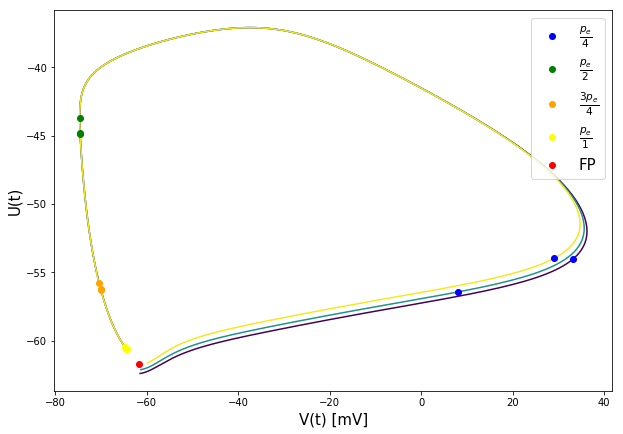

In [16]:
spikeresponse_inv_trajec(kepler, 5.0, 5.0, 101)

plt.savefig('BA_indep_starting')

In [18]:
spikeresponse_inv_trajec(kepler, 5.0, 8.0, 100)

#plt.savefig('rec_31_deltaapprox')

IndexError: invalid index to scalar variable.

In [12]:
def spikeresponse_trajec(derivative, I0, I1, freq, delta) :
    
    
    #tmax = 10000.0
    #tmax = 600.0
    tmax = 1000.0
    dt = 0.01
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    thresh = -20.0
    
    
    taus = 1.0 #changed taus as an input
    if delta:
        stime = np.arange(0.0, .025 * taus, dt)
    else:
        stime = np.arange(0.0, 1.5 * taus, dt)
    spulse = (I1-I0) + 0 * stime

    rates = [] #creates empty array
    dp = 1000.0/freq          #period = distance of pulses (= 1000 ms / frequency)
    pulses = np.arange(0.0, tmax-(1.5*taus), dp) #pulses occuring between 0 and tmax-8taus with dist. dp
    current = np.zeros(len(time)) + I0 #current = I0 for all the time
    for pt in pulses: #loop through all the pulse-times
        current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
            #add spulse (growth) while current is between pt and pt + 8tau/dt (= back at rest. pot)
            # = adds a full spulse on the current to the next pulse (dimensions are perfectly fit)
    
    eigenperiod = int(1000.0/84/dt)
    
    t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)

    return t, x, i

In [53]:
eigenfreq_new(kepler, 5.0, 129.9, 1.31)

array([], dtype=float64)

In [10]:
def spikeresponse_baby(derivative, I0, I1, freq, delta, v0, u0) :
    
    
    #tmax = 10000.0
    #tmax = 600.0
    tmax = 1000.0
    dt = 0.01
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    thresh = -20.0
    
    
    taus = 1.0 #changed taus as an input
    if delta:
        stime = np.arange(0.0, .025 * taus, dt)
    else:
        stime = np.arange(0.0, 1.5 * taus, dt)
    spulse = (I1-I0) + 0 * stime

    rates = [] #creates empty array
    dp = 1000.0/freq          #period = distance of pulses (= 1000 ms / frequency)
    pulses = np.arange(0.0, tmax-(1.5*taus), dp) #pulses occuring between 0 and tmax-8taus with dist. dp
    current = np.zeros(len(time)) + I0 #current = I0 for all the time
    for pt in pulses: #loop through all the pulse-times
        current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
            #add spulse (growth) while current is between pt and pt + 8tau/dt (= back at rest. pot)
            # = adds a full spulse on the current to the next pulse (dimensions are perfectly fit)
    
    eigenperiod = int(1000.0/84/dt)
    
    t, i, x = trajectory(derivative, -.01, tmax, I0, current, v0, u0)

    return t, x, i

-0.01
-0.00999999994885
-64.9548211993


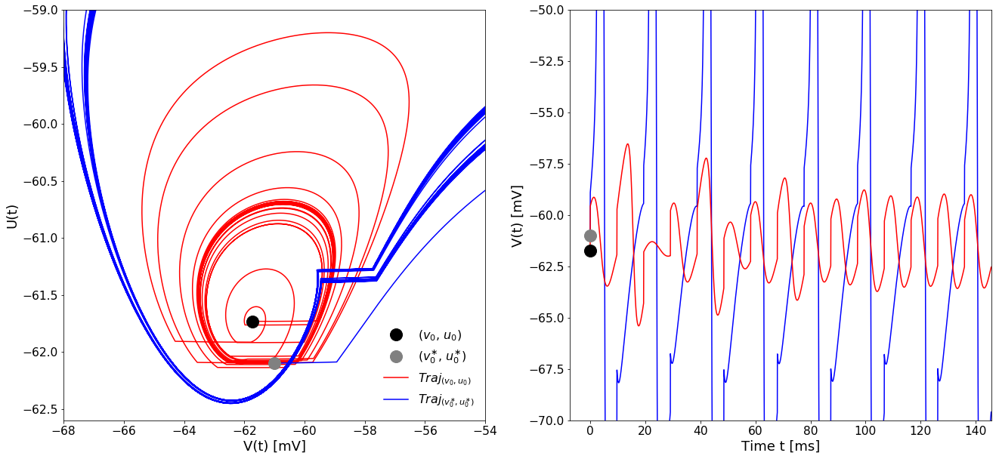

In [26]:
checki = False
checkf = True

eigenfreq = 84 #TO DO
eigenperiod = 1000.0 / eigenfreq

dt = .01

freqs = np.arange(83, 95, 1) #for 8.0 and 130.1
freqs = (108, 109, 110)
freqs = (102.5, 103.0)
#freqs = np.arange(63, 67, 1) #for 8.0 and 130.1
#freqs = np.arange(101, 108, 1) #for 8.0
#freqs = np.arange(101, 107, 1) #for 130.1

currents = np.arange(125, 135, .5)

fig = plt.figure(figsize=(22,10))
#fig = plt.figure(figsize=(12,12)) 

xmax = -52.0 #-55.5
xmin = -69.8
ymin = -62.7
ymax = -56.0 #-58.5

xmax2 = -60.75
xmin2 = -61.8
ymin2 = -62.25
ymax2 = -61.95

xmin3 = -63.0
xmax3 = -59.0
ymin3 = -62.25
ymax3 = -61.8

xmin = -67
xmax = -55
ymin = -62.6
ymax = -59

threshi=(101.5, 101.5, 103.0, 103.0, 105.0, 105.0)
threshf=(102.5, 103.0, 103.0, 104.0, 105.0, 106.0)

threshi=(101.5, 101.5, 103.0)
threshf=(102.5, 103.0, 103.0)

iwalk = [101.5]
fwalk = [103.0]

#iis = (101.5, 101.75, 102.0, 102.25, 102.50, 102.75)

#iwalk = np.arange(101.0, 112, .1)
#fwalk = np.arange(102.5, 108, .25)
#threshi=np.arange(101.5,)


min, max = (np.min(freqs), np.max(freqs))
mymap = plt.get_cmap('plasma')
#step = 2
#Z = [[0,0],[0,0]]
#levels = range(min,max+step,step)
#CS3 = plt.contourf(Z, levels, cmap=mymap)
#plt.clf()
#plt.figure(figsize=(14,8))
    
#fig.add_subplot(2, 1, 1)
'''

for f in freqs:

    t, x, i = spikeresponse_trajec(kepler, 5.0, 8.0, f) #ef
    
    spikeinterval_start = int(10000+20*period/dt)
    spikeinterval_end = int(10000+23*period/dt)
    period = (1000.0 / f)
    v_onespike = x[0][spikeinterval_start : spikeinterval_end]
    u_onespike = x[1][spikeinterval_start : spikeinterval_end]

    #get fixpoint
    t1, x1, i1 = spikeresponse_trajec(kepler, 5.0, 5.0, 84)

    fp_v = x1[0][10000]
    fp_u = x1[1][10000]
    
    plt.plot(v_onespike, u_onespike, label = f)

plt.xlabel('dVdt')
plt.ylabel('dUdt')
plt.vlines(x=xmin, ymin = ymin, ymax = ymax, color = 'red')
plt.vlines(x=xmax, ymin = ymin, ymax = ymax, color = 'red')
plt.hlines(y=ymin, xmin = xmin, xmax = xmax, color = 'red')
plt.hlines(y=ymax, xmin = xmin, xmax = xmax, color = 'red')
    
plt.plot(fp_v, fp_u, 'o', label = 'fixpoint')

fig.add_subplot(3,1,2)

'''

#fig.add_subplot(2,1,1)
#if checkf:
#    for fs in range(0, len(fwalk)-1):
#        for i in range(0, len(iwalk)-1):
            
    #for counter in range(0, len(iis), 1):
#            spiking = False


            #period = 1000.0 / threshf[counter]
period = 1000.0 / 103.0



            #color = mymap(0 + float(counter)/(len(iis)-1))

            #t, i, x = spikeresponse_trajec(kepler, 5.0, 130.1, f, True) #ef

            #if f == 94:
            #    spikeinterval_start = int(10000+31*period/dt) #former: 29
            #    spikeinterval_end = int(10000+33*period/dt)
            #else:

            #spikeinterval_start = int(10000+31.70*period/dt) #former: 31.7 - 32.7, 31.7 - 34.7, 31.7 - 33.7
            #spikeinterval_end = int(10000+35.70*period/dt)+int(.025/dt)
                  #  if np.max(v_onespike) > -52.0:
          #      spiking = True

          #      maxindice = np.where(v_onespike == np.max(v_onespike))[0][0]
          #      pulseindice = maxindice // (period/dt)
              #  pulseindice += 1
                #print(pulseindice)
                #print(threshf[counter])
           # plt.plot(x[0][int(10000+31*(1000.0/87)/dt)], x[1][int(10000+31*(1000.0/87)/dt)], 'o', color = 'red')
           # plt.plot(x[0][int(10000+32*(1000.0/87)/dt)], x[1][int(10000+32*(1000.0/87)/dt)], 'o', color = 'red')
           # plt.plot(x[0][int(10000+33*(1000.0/87)/dt)], x[1][int(10000+33*(1000.0/87)/dt)], 'o', color = 'red')

t, x, i = spikeresponse_baby(kepler, 5.0, 101.5, 103.0, True, -61, -62.1) #ef
t2, x2, i2 = spikeresponse_trajec(kepler, 5.0, 101.5, 103.0, True) #ef

spikeinterval_start = 0#int(9999+0*period/dt) #former: 31.7 - 32.7, 31.7 - 34.7, 31.7 - 33.7
spikeinterval_end = int(10000+60*period/dt)+int(.025/dt)

v_onespike = x[0][spikeinterval_start : spikeinterval_end]
u_onespike = x[1][spikeinterval_start : spikeinterval_end]
v2_onespike = x2[0][spikeinterval_start : spikeinterval_end]
u2_onespike = x2[1][spikeinterval_start : spikeinterval_end]

t1, x1, i1 = spikeresponse_trajec(kepler, 5.0, 5.0, 84, True)

fp_v = x1[0][10000]
fp_u = x1[1][10000]



fig.add_subplot(1,2,1)
plt.plot(fp_v, fp_u, 'o', label = r'($v_0$, $u_0$)', color = 'black', markersize = 16, zorder = 2)     
plt.plot(-61, -62.1, 'o', label = r'($v_0^{\ast}$, $u_0^{\ast}$)', color = 'grey', markersize = 16, zorder = 2)
plt.plot(v2_onespike[int(100/dt)-1:], u2_onespike[int(100/dt)-1:], color = 'red', zorder = 1, label = r'$Traj_{(v_0, u_0)}$')
plt.plot(v_onespike, u_onespike, color = 'blue', zorder = 1, label = r'$Traj_{(v_0^{\ast}, u_0^{\ast})}$')
plt.yticks(np.arange(-62.5, -58.5, 0.5), fontsize = 15.5)
plt.xticks(np.arange(-68, -52, 2), fontsize = 15.5)
#  if spiking:
          #      plt.plot(v_onespike[int(pulseindice*period/dt)+int(.025/dt)], u_onespike[int(pulseindice*period/dt)+int(.025/dt)], 'o', color = 'red')
######       

#####
#plt.axis((xmin3, xmax3, ymin3, ymax3))

      #  plt.plot(x[0][int(spikeinterval_start + int(eigenperiod/dt))], x[1][int(spikeinterval_start + int(eigenperiod/dt))], 'o', color = 'yellow')
      #  plt.plot(x[0][int(spikeinterval_start)], x[1][int(spikeinterval_start)], 'o')
      #  print('threshold position ({},{})'.format(x[0][int(spikeinterval_start)], x[1][int(spikeinterval_start)]))
        #plt.plot(x[0][int(10000+21.95*period/dt)], x[1][int(10000+21.95*period/dt)], 'o')
        #plt.plot(x[0][int(10000+22.01*period/dt)], x[1][int(10000+22.01*period/dt)], 'o')


plt.axis((xmin-1, xmax+1, ymin, ymax))
plt.legend(loc = 'lower right', fontsize = 16.0, frameon = False)
    
plt.xlabel('V(t) [mV]', fontsize = 18)
plt.ylabel('U(t)', fontsize = 18)

fig.add_subplot(1,2,2)
plt.plot(t[:int(15*period/dt)], x[0][:int(15*period/dt)], color = 'blue')
plt.plot(t2[9999:9999+int(15*period/dt)], x2[0][9999:9999+int(15*period/dt)], color = 'red')
plt.axis((-7.5, t2[9999+int(15*period/dt)], -70.0, -50))
plt.plot(t2[9999], x2[0][9999], 'o', color = 'black', markersize = 16, zorder = 2)     
plt.plot(t[0], -61, 'o', color = 'grey', markersize = 16, zorder = 2)
plt.ylabel('V(t) [mV]', fontsize = 18)
plt.xlabel('Time t [ms]', fontsize = 18)
plt.yticks(np.arange(-70, -47.5, 2.5), fontsize = 15.5)
plt.xticks(np.arange(0, 160, 20), fontsize = 15.5)
print(t[0])
print(t2[9999])
print(x2[0][0])

#plt.plot(poi_v, poi_u, 'o')
#print(x[0][int(spikeinterval_start)], x[1][int(spikeinterval_start)])
#plt.legend(loc = 'lower left')

'''
fig.add_subplot(2,1,2)

if checkf:

    for counter, f in enumerate(threshi, 0):

        period = 1000.0 / f



        color = mymap(0 + float(counter)/(len(threshi)-1))

        #t, i, x = spikeresponse_trajec(kepler, 5.0, 130.1, f, True) #ef
        t, i, x = spikeresponse_trajec(kepler, 5.0, threshi[counter], threshf[counter], True) #ef
        #if f == 94:
        #    spikeinterval_start = int(10000+31*period/dt) #former: 29
        #    spikeinterval_end = int(10000+33*period/dt)
        #else:
        spikeinterval_start = int(10000+0*period/dt) #former: 31.7 - 32.7, 31.7 - 34.7, 31.7 - 33.7
        spikeinterval_end = int(10000+5*period/dt)+int(.025/dt)
        
        #spikeinterval_start = int(10000+31.70*period/dt) #former: 31.7 - 32.7, 31.7 - 34.7, 31.7 - 33.7
        #spikeinterval_end = int(10000+35.70*period/dt)+int(.025/dt)

        v_onespike = x[0][spikeinterval_start : spikeinterval_end]
        u_onespike = x[1][spikeinterval_start : spikeinterval_end]

       # plt.plot(x[0][int(10000+31*(1000.0/87)/dt)], x[1][int(10000+31*(1000.0/87)/dt)], 'o', color = 'red')
       # plt.plot(x[0][int(10000+32*(1000.0/87)/dt)], x[1][int(10000+32*(1000.0/87)/dt)], 'o', color = 'red')
       # plt.plot(x[0][int(10000+33*(1000.0/87)/dt)], x[1][int(10000+33*(1000.0/87)/dt)], 'o', color = 'red')

        #get fixpoint
        t1, i1, x1 = spikeresponse_trajec(kepler, 5.0, 5.0, 84, True)

        fp_v = x1[0][10000]
        fp_u = x1[1][10000]

        plt.plot(v_onespike, u_onespike, label = f, color = color)
#####
#####
plt.axis((xmin3, xmax3, ymin3, ymax3))




#plt.plot(fp_v, fp_u, 'o', label = 'fixpoint')
plt.legend(loc = 'upper left')

'''

plt.savefig('BA_ITLIVES2')

In [6]:

def spikeresponse_track2(derivative, I0, I1, freq) :
    #tmax = 10000.0
    #tmax = 600.0
    tmax = 2000.0
    dt = 0.01
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    thresh = -20.0
    taus = 1.0 #changed taus as an input
    stime = np.arange(0.0, .025 * taus, dt) #spiketime: [0, dt, 2dt, ..., 8taus] WHY 8?
    spulse = (I1-I0) + 0 * stime

    rates = [] #creates empty array
    dp = 1000.0/freq          #period = distance of pulses (= 1000 ms / frequency)
    pulses = np.arange(0.0, tmax-(1.5*taus), dp) #pulses occuring between 0 and tmax-8taus with dist. dp
    current = np.zeros(len(time)) + I0 #current = I0 for all the time
    for pt in pulses: #loop through all the pulse-times
        current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
            #add spulse (growth) while current is between pt and pt + 8tau/dt (= back at rest. pot)
            # = adds a full spulse on the current to the next pulse (dimensions are perfectly fit)
    t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
        #...
    spikes = t[:-1][(x[0][:-1]<thresh) & (x[0][1:]>=thresh)]
        #array of times where value just jumps over threshhold
    spikes = spikes[spikes>1200.0] #only pick spikes, which occur for t>100ms
    rate = 0.0
    if len(spikes) > 2: #more han two spikes occur
        rate = 1000.0*(len(spikes)-1)/(spikes[-1]-spikes[0]) #
    rates.append(rate) #put all rate together in rates (evaluate one rate per frequency)
    
    #return np.round(rate/freq, 2)

    
    return t[10000:], x, i[10000:]

i[0] = 98.0, f[0] = 98.0, spikerate = 0.4
i[0] = 98.0, f[1] = 98.5, spikerate = 0.4
i[0] = 98.0, f[2] = 99.0, spikerate = 0.4
i[0] = 98.0, f[3] = 99.5, spikerate = 0.0
i[0] = 98.0, f[4] = 100.0, spikerate = 0.0
i[0] = 98.0, f[5] = 100.5, spikerate = 0.0
i[0] = 98.0, f[6] = 101.0, spikerate = 0.0
i[0] = 98.0, f[7] = 101.5, spikerate = 0.0
i[0] = 98.0, f[8] = 102.0, spikerate = 0.0
i[0] = 98.0, f[9] = 102.5, spikerate = 0.0
i[0] = 98.0, f[10] = 103.0, spikerate = 0.0
i[0] = 98.0, f[11] = 103.5, spikerate = 0.0
i[0] = 98.0, f[12] = 104.0, spikerate = 0.0
i[0] = 98.0, f[13] = 104.5, spikerate = 0.0
i[0] = 98.0, f[14] = 105.0, spikerate = 0.0
i[0] = 98.0, f[15] = 105.5, spikerate = 0.0
i[0] = 98.0, f[16] = 106.0, spikerate = 0.0
i[0] = 98.0, f[17] = 106.5, spikerate = 0.0
i[0] = 98.0, f[18] = 107.0, spikerate = 0.0
i[0] = 98.0, f[19] = 107.5, spikerate = 0.0
i[0] = 98.0, f[20] = 108.0, spikerate = 0.0
i[0] = 98.0, f[21] = 108.5, spikerate = 0.0
i[0] = 98.0, f[22] = 109.0, spikerate = 0.0
i[

i[7] = 101.5, f[12] = 104.0, spikerate = 0.0
i[7] = 101.5, f[13] = 104.5, spikerate = 0.0
i[7] = 101.5, f[14] = 105.0, spikerate = 0.0
i[7] = 101.5, f[15] = 105.5, spikerate = 0.0
i[7] = 101.5, f[16] = 106.0, spikerate = 0.0
i[7] = 101.5, f[17] = 106.5, spikerate = 0.0
i[7] = 101.5, f[18] = 107.0, spikerate = 0.0
i[7] = 101.5, f[19] = 107.5, spikerate = 0.0
i[7] = 101.5, f[20] = 108.0, spikerate = 0.0
i[7] = 101.5, f[21] = 108.5, spikerate = 0.0
i[7] = 101.5, f[22] = 109.0, spikerate = 0.0
i[7] = 101.5, f[23] = 109.5, spikerate = 0.0
i[7] = 101.5, f[24] = 110.0, spikerate = 0.0
i[8] = 102.0, f[0] = 98.0, spikerate = 0.43
i[8] = 102.0, f[1] = 98.5, spikerate = 0.45
i[8] = 102.0, f[2] = 99.0, spikerate = 0.4
i[8] = 102.0, f[3] = 99.5, spikerate = 0.4
i[8] = 102.0, f[4] = 100.0, spikerate = 0.4
i[8] = 102.0, f[5] = 100.5, spikerate = 0.4
i[8] = 102.0, f[6] = 101.0, spikerate = 0.4
i[8] = 102.0, f[7] = 101.5, spikerate = 0.36
i[8] = 102.0, f[8] = 102.0, spikerate = 0.51
i[8] = 102.0, f[9] 

i[14] = 105.0, f[19] = 107.5, spikerate = 0.0
i[14] = 105.0, f[20] = 108.0, spikerate = 0.0
i[14] = 105.0, f[21] = 108.5, spikerate = 0.0
i[14] = 105.0, f[22] = 109.0, spikerate = 0.0
i[14] = 105.0, f[23] = 109.5, spikerate = 0.0
i[14] = 105.0, f[24] = 110.0, spikerate = 0.0
i[15] = 105.5, f[0] = 98.0, spikerate = 0.46
i[15] = 105.5, f[1] = 98.5, spikerate = 0.44
i[15] = 105.5, f[2] = 99.0, spikerate = 0.0
i[15] = 105.5, f[3] = 99.5, spikerate = 0.4
i[15] = 105.5, f[4] = 100.0, spikerate = 0.4
i[15] = 105.5, f[5] = 100.5, spikerate = 0.4
i[15] = 105.5, f[6] = 101.0, spikerate = 0.4
i[15] = 105.5, f[7] = 101.5, spikerate = 0.46
i[15] = 105.5, f[8] = 102.0, spikerate = 0.43
i[15] = 105.5, f[9] = 102.5, spikerate = 0.5
i[15] = 105.5, f[10] = 103.0, spikerate = 0.5
i[15] = 105.5, f[11] = 103.5, spikerate = 0.5
i[15] = 105.5, f[12] = 104.0, spikerate = 0.5
i[15] = 105.5, f[13] = 104.5, spikerate = 0.5
i[15] = 105.5, f[14] = 105.0, spikerate = 0.5
i[15] = 105.5, f[15] = 105.5, spikerate = 0.

i[21] = 108.5, f[24] = 110.0, spikerate = 0.0
i[22] = 109.0, f[0] = 98.0, spikerate = 0.39
i[22] = 109.0, f[1] = 98.5, spikerate = 0.42
i[22] = 109.0, f[2] = 99.0, spikerate = 0.44
i[22] = 109.0, f[3] = 99.5, spikerate = 0.43
i[22] = 109.0, f[4] = 100.0, spikerate = 0.39
i[22] = 109.0, f[5] = 100.5, spikerate = 0.4
i[22] = 109.0, f[6] = 101.0, spikerate = 0.4
i[22] = 109.0, f[7] = 101.5, spikerate = 0.44
i[22] = 109.0, f[8] = 102.0, spikerate = 0.5
i[22] = 109.0, f[9] = 102.5, spikerate = 0.5
i[22] = 109.0, f[10] = 103.0, spikerate = 0.5
i[22] = 109.0, f[11] = 103.5, spikerate = 0.5
i[22] = 109.0, f[12] = 104.0, spikerate = 0.5
i[22] = 109.0, f[13] = 104.5, spikerate = 0.5
i[22] = 109.0, f[14] = 105.0, spikerate = 0.5
i[22] = 109.0, f[15] = 105.5, spikerate = 0.5
i[22] = 109.0, f[16] = 106.0, spikerate = 0.5
i[22] = 109.0, f[17] = 106.5, spikerate = 0.5
i[22] = 109.0, f[18] = 107.0, spikerate = 0.0
i[22] = 109.0, f[19] = 107.5, spikerate = 0.0
i[22] = 109.0, f[20] = 108.0, spikerate = 

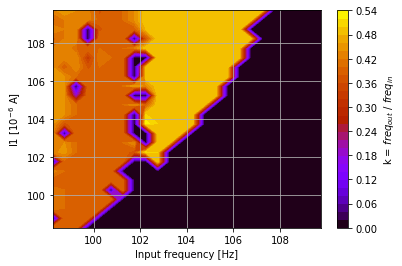

In [32]:
#find the 2:1 starting area in delta6060

df, di = .5, .5
f0, f1 = 98, 110
i0, i1 = 98, 110
fgrid, igrid = np.mgrid[slice(f0, f1 + df, df), slice(i0, i1 + di, di)]
zx = np.zeros(shape=(len(fgrid[:,1]), len(igrid[1,:])))
for i in range(0, len(igrid[1,:])):
    for f in range(0, len(fgrid[:,1])):
        zx[f][i] = spikeresponse_track2(kepler, 5.0, igrid[0][i], fgrid[f][0])
        print('i[{}] = {}, f[{}] = {}, spikerate = {}'.format(i, igrid[0][i], f, fgrid[f][0], zx[f][i]))

zx = zx[:-1, :-1]

levels = MaxNLocator(nbins=30).tick_values(zx.min(), zx.max())

cmap = plt.get_cmap('gnuplot')

norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)


fig, ax0 = plt.subplots(nrows=1)

cf = ax0.contourf(fgrid[:-1, :-1] + df/2.,
                  igrid[:-1, :-1] + di/2., zx, levels=levels,
                  cmap=cmap)

fig.colorbar(cf, ax=ax0, label = r'k = $freq_{out}$ / $freq_{in}$')
plt.xlabel('Input frequency [Hz]')
plt.ylabel(r'I1 [$10^{-6}$ A]')
plt.grid()

plt.savefig('rec_21subpulse_th_delta')

In [ ]:
#i[7] = 101.5, f[9] = 102.5, spikerate = 0.5
#di = 5.5, df = 3.5
#i[18] = 107.0, f[16] = 106.0, spikerate = 0.5
#i[18] = 110.0, f[16] = 107.5, spikerate = 0.5
#di = 8.5, df = 5.0
#p2
#i[18] = 110.0, f[16] = 107.5, spikerate = 0.5

In [11]:
#for f in np.arange(101, 107):
#    period = int(1000.0 / f / dt)
#    t, x, i = spikeresponse_track2(kepler, 5.0, 130.0, f)
#    plt.figure(figsize=(14,12))
#    plt.plot(t[int(32.7*period):int(34.7*period)], x[int(32.7*period):int(34.7*period)])
#    plt.title(f)

In [5]:

#AOI of which we need a histogramm: I0 = 5, I1 = 8, f = {x1,x2,x3,...}


def spikeresponse_track(derivative, I0, I1, freq) :
    #tmax = 10000.0
    #tmax = 600.0
    tmax = 1000.0
    dt = 0.01
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    thresh = -20.0
    taus = 1.0 #changed taus as an input
    stime = np.arange(0.0, 1.5 * taus, dt) #spiketime: [0, dt, 2dt, ..., 8taus] WHY 8?
    spulse = (I1-I0) + 0 * stime

    rates = [] #creates empty array
    dp = 1000.0/freq          #period = distance of pulses (= 1000 ms / frequency)
    pulses = np.arange(0.0, tmax-(1.5*taus), dp) #pulses occuring between 0 and tmax-8taus with dist. dp
    current = np.zeros(len(time)) + I0 #current = I0 for all the time
    for pt in pulses: #loop through all the pulse-times
        current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
            #add spulse (growth) while current is between pt and pt + 8tau/dt (= back at rest. pot)
            # = adds a full spulse on the current to the next pulse (dimensions are perfectly fit)
    t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
        #...
    spikes = t[:-1][(x[0][:-1]<thresh) & (x[0][1:]>=thresh)]
        #array of times where value just jumps over threshhold
    spikes = spikes[spikes>200.0] #only pick spikes, which occur for t>100ms
    rate = 0.0
    if len(spikes) > 2: #more han two spikes occur
        rate = 1000.0*(len(spikes)-1)/(spikes[-1]-spikes[0]) #
    rates.append(rate) #put all rate together in rates (evaluate one rate per frequency)
    
    return t[10000:], x[0][10000:], i[10000:]

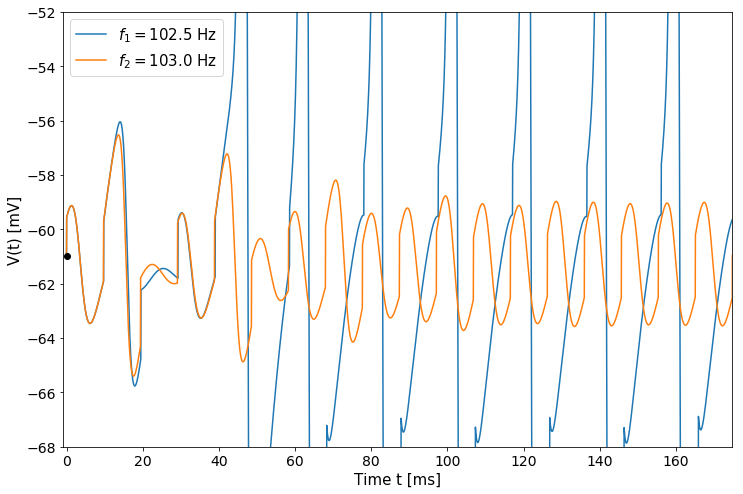

In [8]:
dt = .01
threshi=(101.5, 101.5)#, 103.0, 103.0, 105.0, 105.0)
threshf=(102.5, 103.0)#, 103.0, 104.0, 105.0, 106.0)
plt.figure(figsize=(12,8))
t, x, i = spikeresponse_track2(kepler, 5.0, 101.5, 102.5)
x1 = x[0][10000:]
x2 = x[1][10000:]
p = 1000.0 / threshf[0]
#plt.title('f = {}, i = {}'.format(threshf[0], threshi[0]))
plt.plot(t[:int(20*p/dt)], x1[:int(20*p/dt)], label = r'$f_1 =  ${} Hz'.format(threshf[0]))
#plt.axis((-1, 20*p, -80, -50))


#plt.plot(x1[:int(8*p/dt)], x2[:int(8*p/dt)])


t, x, i = spikeresponse_track2(kepler, 5.0, 101.5, 103.0)
x1 = x[0][10000:]
x2 = x[1][10000:]
p = 1000.0 / threshf[1]
#plt.title('f = {}, i = {}'.format(threshf[1], threshi[1]))
plt.plot(t[:int(20*p/dt)], x1[:int(20*p/dt)], label = r'$f_2 = ${} Hz'.format(threshf[1]))
#plt.plot(x1[:int(8*p/dt)], x2[:int(8*p/dt)])
plt.axis((-1, 18*p, -68, -52))
#plt.axis((-67.5, -55, -62.5, -58))
plt.legend(loc = 'upper left', fontsize = 15)
plt.xlabel('Time t [ms]', fontsize = 15)
plt.ylabel('V(t) [mV]', fontsize = 15)
plt.xticks(np.arange(0, 180, 20), fontsize = 14)
plt.yticks(np.arange(-68, -50, 2), fontsize = 14)
#plt.plot(x1[0], x2[0], 'o', color = 'red')
plt.plot(t[0], x1[0], 'o', color = 'black')

plt.savefig('BA_closebutfar2')
#plt.figure(figsize=(12,8))



periods of 1:1 locking are: [ 15.87301587  15.625       15.38461538  15.15151515]
periods of 2:1 locking are: [ 12.19512195  12.04819277  11.9047619   11.76470588  11.62790698
  11.49425287  11.36363636  11.23595506  11.11111111  10.98901099
  10.86956522  10.75268817  10.63829787]
periods of 3:1 locking are: [ 10.1010101   10.           9.9009901    9.80392157   9.70873786
   9.61538462   9.52380952   9.43396226   9.34579439]
current onset is at: 380.95
Without a spikes, maxima are: [ 384.95  396.86  408.65  420.56]
Differences are: [ 11.91  11.79  11.91]
With a spike    , maxima are: [ 384.61  400.72  412.47  424.35]
Differences are: [ 16.11  11.75  11.88]
My distance increase if it spikes is: 3.86
Alternatively, my distance increase if it spikes is: 4.20
distance between currentonset and first maxima: 3.66
distance between 11 and 21 currentonset: 3.97


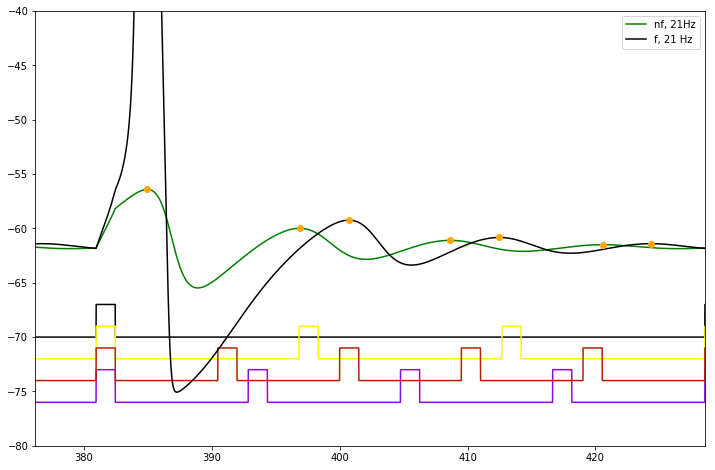

In [28]:
t_31, x_31, i_31 = spikeresponse_track(kepler, 5.0, 8.0, 84) #freq in 3:1 locked area
t_nfiring, x_nfiring, i_nfiring = spikeresponse_track(kepler, 5.0, 8.0, 21)
t_firing, x_firing, i_firing = spikeresponse_track(kepler, 5.0, 9.5, 21)

t_21, x_21, i_21 = spikeresponse_track(kepler, 5.0, 8.0, 105)

t_11, x_11, i_11 = spikeresponse_track(kepler, 5.0, 8.0, 63)

t = t_firing = t_31 = t_21 = t_11

dt = .01
interval_start = 7.9

mymap = plt.get_cmap('gnuplot')

p_nfiring = 1000.0 / 21
p_11 = 1000.0 / 63
p_21 = 1000.0 / 105
p_31 = 1000.0 / 84

locked11 = [63, 64, 65, 66]
locked21 = np.arange(82, 95, 1)
locked31 = np.arange(100, 108, 1)

locked11_periods = 1000.0/np.asarray(locked11)
locked21_periods = 1000.0/np.asarray(locked21)
locked31_periods = 1000.0/np.asarray(locked31)

print('periods of 1:1 locking are: {}'.format(locked11_periods))
print('periods of 2:1 locking are: {}'.format(locked21_periods))
print('periods of 3:1 locking are: {}'.format(locked31_periods))
#x_nfiring = np.roll(x_nfiring, int(40*(p_firing - p_nfiring)/dt))
#i_nfiring = np.roll(i_nfiring, int(40*(p_firing - p_nfiring)/dt))
#i_31 = np.roll(i_31, int((40*(p_21 - p_31)/dt)))
#i_21 = np.roll(i_21, int((40*(p_21 - p_21)/dt)))
#i_11 = np.roll(i_11, int((40*(p_21 - p_11)/dt)))
#i_nfiring = np.roll(i_nfiring, int())
#x_11 = np.roll(x_11, int(40*(p_firing - p_11)/dt))

xnf_interval = x_nfiring[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
xf_interval = x_firing[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
x_31_interval = x_31[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
x_21_interval = x_21[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
x_11_interval = x_11[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]

tint = t[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]

t0 = t[int(8*p_nfiring/dt)]
print('current onset is at: {:.2f}'.format(t0))



maxima_indices_xnf, xyz = detect_peaks(xnf_interval, .1)
maxima_times_xnf, xyz = detect_peaks(xnf_interval, .1, time = tint)
maxima_values_xnf = xnf_interval[maxima_indices_xnf]

maxima_indices_xf, xyz = detect_peaks(xf_interval, .1)
maxima_times_xf, xyz = detect_peaks(xf_interval, .1, time = tint)
maxima_values_xf = xf_interval[maxima_indices_xf]

maxima_times_xf_diff = np.diff(maxima_times_xf)
maxima_times_xnf_diff = np.diff(maxima_times_xnf)
print('Without a spikes, maxima are: {}'.format(maxima_times_xnf))
print('Differences are: {}'.format(maxima_times_xnf_diff))
print('With a spike    , maxima are: {}'.format(maxima_times_xf))
print('Differences are: {}'.format(maxima_times_xf_diff))
sdincr = maxima_times_xf[1] - maxima_times_xnf[1]
print('My distance increase if it spikes is: {:.2f}'.format(sdincr))
sdincr2 = maxima_times_xf_diff[0] - maxima_times_xnf_diff[0]
print('Alternatively, my distance increase if it spikes is: {:.2f}'.format(sdincr2))


conset_maxima_d = maxima_times_xf[0] - t0

print('distance between currentonset and first maxima: {:.2f}'.format(conset_maxima_d))

print('distance between 11 and 21 currentonset: {:.2f}'.format(p_11 - p_31))

print('ACKN 1: Eigenperiod/freq is equal to p_31 (Freq)')
plt.figure(figsize=(12,8))
plt.plot(t, i_nfiring-5-8-63+1, color = mymap(0))
plt.plot(t, i_31-5-8-63-5, color = mymap(1/3))
plt.plot(t, i_11-5-8-63-1, color = mymap(.99))
plt.plot(t, i_21-5-8-63-3, color = mymap(.5))
#plt.plot(tint, x_31_interval, label = '31f, 90Hz', color = 'blue')
plt.plot(tint, xnf_interval, label = 'nf, 21Hz', color = 'green')
plt.plot(tint, xf_interval, label = 'f, 21 Hz', color = 'black')
#plt.plot(tint, x_11_interval, label = '11f, 60Hz', color = 'black')
#plt.plot(t[int(40*p_firing/dt):int(44*p_firing/dt)], x_21_interval, label = '21f, 102Hz', color = 'red')

plt.plot(maxima_times_xnf, maxima_values_xnf, 'o', color = 'orange')
plt.plot(maxima_times_xf, maxima_values_xf, 'o', color = 'orange')
#plt.plot(maxima_times_xf+t[int(40*p_firing/dt)], maxima_values_xf, 'o', color = 'blue')

#plt.axis((t[int(39*p_21/dt)], t[int(43*p_21/dt)], -80, -40))
plt.axis((t[int(interval_start*p_nfiring/dt)], t[int(9*p_nfiring/dt)], -80, -40))
plt.legend()
#print(t[int(39*p_firing/dt)])
#print(maxima_times_xnf)
#print(maxima_values_xnf)


#2p_21 = maxima_times_xf_diff[0] + x = EIGF + x + x
#p_11 = EIGF + x
#

3.9682539682539684

[ 384.95  396.86  408.65  420.56]
[-56.41398523 -59.99574986 -61.10444885 -61.50560889]


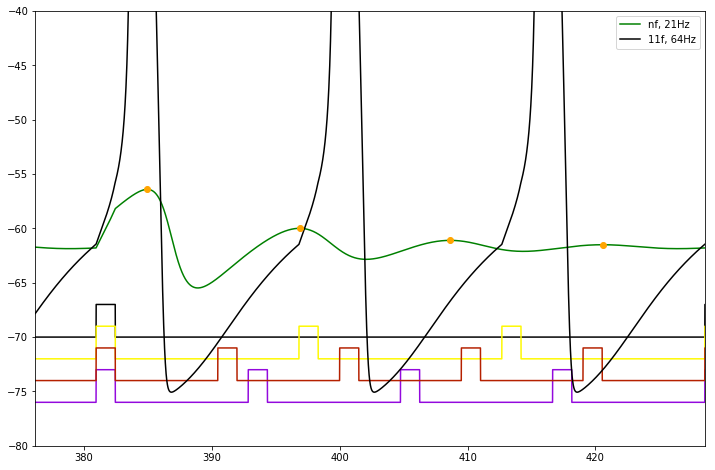

In [29]:
t_31, x_31, i_31 = spikeresponse_track(kepler, 5.0, 8.0, 84) #freq in 3:1 locked area
t_nfiring, x_nfiring, i_nfiring = spikeresponse_track(kepler, 5.0, 8.0, 21)

t_21, x_21, i_21 = spikeresponse_track(kepler, 5.0, 8.0, 105)

t_11, x_11, i_11 = spikeresponse_track(kepler, 5.0, 8.0, 63)

t = t_firing = t_31 = t_21 = t_11

dt = .01
interval_start = 7.9

mymap = plt.get_cmap('gnuplot')

p_nfiring = 1000.0 / 21
p_11 = 1000.0 / 63
p_21 = 1000.0 / 105
p_31 = 1000.0 / 84
#x_nfiring = np.roll(x_nfiring, int(40*(p_firing - p_nfiring)/dt))
#i_nfiring = np.roll(i_nfiring, int(40*(p_firing - p_nfiring)/dt))
#i_31 = np.roll(i_31, int((40*(p_21 - p_31)/dt)))
#i_21 = np.roll(i_21, int((40*(p_21 - p_21)/dt)))
#i_11 = np.roll(i_11, int((40*(p_21 - p_11)/dt)))
#i_nfiring = np.roll(i_nfiring, int())
#x_11 = np.roll(x_11, int(40*(p_firing - p_11)/dt))

xnf_interval = x_nfiring[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
x_31_interval = x_31[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
x_21_interval = x_21[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
x_11_interval = x_11[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
tint = t[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]

maxima_indices_xnf, xyz = detect_peaks(xnf_interval, .1)
maxima_times_xnf, noneed2 = detect_peaks(xnf_interval, .1, time = tint)
#maxima_times_xnf = maxima_indices_xnf * dt
#maxima_values_xnf = (x_nfiring[10000+maxima_indices_xnf])
maxima_values_xnf = xnf_interval[maxima_indices_xnf]
#maxima_indices_xf, xyz = detect_peaks(xf_interval, .1)
#maxima_times_xf = maxima_indices_xf * dt
#maxima_values_xf = (x_firing[10000+maxima_indices_xf])



plt.figure(figsize=(12,8))
plt.plot(t, i_nfiring-5-8-63+1, color = mymap(0))
plt.plot(t, i_31-5-8-63-5, color = mymap(1/3))
plt.plot(t, i_11-5-8-63-1, color = mymap(.99))
plt.plot(t, i_21-5-8-63-3, color = mymap(.5))
#plt.plot(tint, x_31_interval, label = '31f, 90Hz', color = 'blue')
plt.plot(tint, xnf_interval, label = 'nf, 21Hz', color = 'green')
plt.plot(tint, x_11_interval, label = '11f, 64Hz', color = 'black')
#plt.plot(t[int(40*p_firing/dt):int(44*p_firing/dt)], x_21_interval, label = '21f, 102Hz', color = 'red')

plt.plot(maxima_times_xnf, maxima_values_xnf, 'o', color = 'orange')
#plt.plot(maxima_times_xf+t[int(40*p_firing/dt)], maxima_values_xf, 'o', color = 'blue')

#plt.axis((t[int(39*p_21/dt)], t[int(43*p_21/dt)], -80, -40))
plt.axis((t[int(interval_start*p_nfiring/dt)], t[int(9*p_nfiring/dt)], -80, -40))
plt.legend()
#print(t[int(39*p_firing/dt)])
print(maxima_times_xnf)
print(maxima_values_xnf)




[ 384.95  396.86  408.65  420.56]
[-56.41398523 -59.99574986 -61.10444885 -61.50560889]


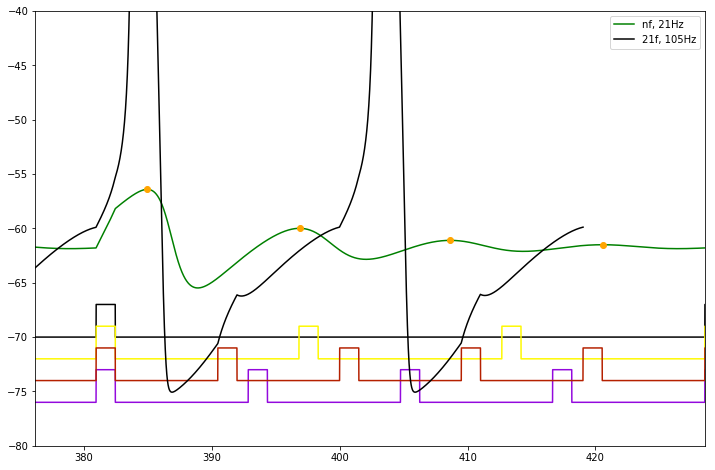

In [32]:
t_31, x_31, i_31 = spikeresponse_track(kepler, 5.0, 8.0, 84) #freq in 3:1 locked area
t_nfiring, x_nfiring, i_nfiring = spikeresponse_track(kepler, 5.0, 8.0, 21)

t_21, x_21, i_21 = spikeresponse_track(kepler, 5.0, 8.0, 105)

t_11, x_11, i_11 = spikeresponse_track(kepler, 5.0, 8.0, 63)

t = t_firing = t_31 = t_21 = t_11

dt = .01
interval_start = 7.9

mymap = plt.get_cmap('gnuplot')

p_nfiring = 1000.0 / 21
p_11 = 1000.0 / 63
p_21 = 1000.0 / 105
p_31 = 1000.0 / 84
#x_nfiring = np.roll(x_nfiring, int(40*(p_firing - p_nfiring)/dt))
#i_nfiring = np.roll(i_nfiring, int(40*(p_firing - p_nfiring)/dt))
#i_31 = np.roll(i_31, int((40*(p_21 - p_31)/dt)))
#i_21 = np.roll(i_21, int((40*(p_21 - p_21)/dt)))
#i_11 = np.roll(i_11, int((40*(p_21 - p_11)/dt)))
#i_nfiring = np.roll(i_nfiring, int())
#x_11 = np.roll(x_11, int(40*(p_firing - p_11)/dt))

xnf_interval = x_nfiring[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
x_31_interval = x_31[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
x_21_interval = x_21[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
x_11_interval = x_11[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
tint = t[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]

maxima_indices_xnf, xyz = detect_peaks(xnf_interval, .1)
maxima_times_xnf, noneed2 = detect_peaks(xnf_interval, .1, time = tint)
#maxima_times_xnf = maxima_indices_xnf * dt
#maxima_values_xnf = (x_nfiring[10000+maxima_indices_xnf])
maxima_values_xnf = xnf_interval[maxima_indices_xnf]
#maxima_indices_xf, xyz = detect_peaks(xf_interval, .1)
#maxima_times_xf = maxima_indices_xf * dt
#maxima_values_xf = (x_firing[10000+maxima_indices_xf])

#shift x_21_interval by one input
#x_21_interval = np.roll(x_21_interval, -(1000.0/105))

plt.figure(figsize=(12,8))
plt.plot(t, i_nfiring-5-8-63+1, color = mymap(0))
plt.plot(t, i_31-5-8-63-5, color = mymap(1/3))
plt.plot(t, i_11-5-8-63-1, color = mymap(.99))
plt.plot(t, i_21-5-8-63-3, color = mymap(.5))
#plt.plot(tint, x_31_interval, label = '31f, 90Hz', color = 'blue')
plt.plot(tint, xnf_interval, label = 'nf, 21Hz', color = 'green')
plt.plot(tint-p21, x_21_interval, label = '21f, 105Hz', color = 'black')
#plt.plot(t[int(40*p_firing/dt):int(44*p_firing/dt)], x_21_interval, label = '21f, 102Hz', color = 'red')

plt.plot(maxima_times_xnf, maxima_values_xnf, 'o', color = 'orange')
#plt.plot(maxima_times_xf+t[int(40*p_firing/dt)], maxima_values_xf, 'o', color = 'blue')

#plt.axis((t[int(39*p_21/dt)], t[int(43*p_21/dt)], -80, -40))
plt.axis((t[int(interval_start*p_nfiring/dt)], t[int(9*p_nfiring/dt)], -80, -40))
plt.legend()
#print(t[int(39*p_firing/dt)])
print(maxima_times_xnf)
print(maxima_values_xnf)



[ 384.95  396.86  408.65  420.56]
[-56.41398523 -59.99574986 -61.10444885 -61.50560889]


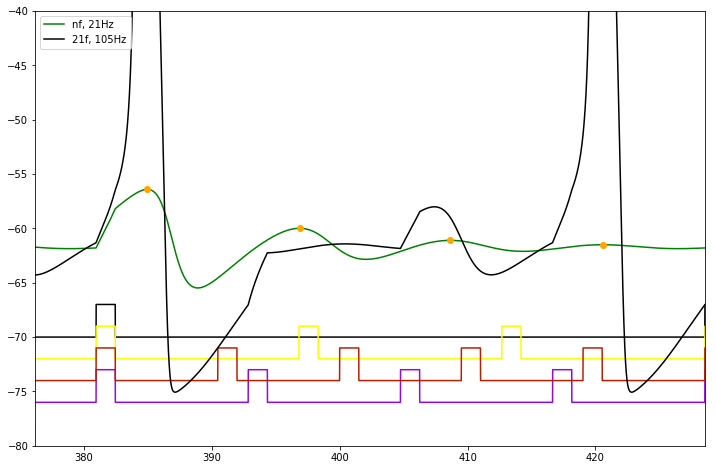

In [38]:
t_31, x_31, i_31 = spikeresponse_track(kepler, 5.0, 8.0, 84) #freq in 3:1 locked area
t_nfiring, x_nfiring, i_nfiring = spikeresponse_track(kepler, 5.0, 8.0, 21)

t_21, x_21, i_21 = spikeresponse_track(kepler, 5.0, 8.0, 105)

t_11, x_11, i_11 = spikeresponse_track(kepler, 5.0, 8.0, 63)

t = t_firing = t_31 = t_21 = t_11

dt = .01
interval_start = 7.9

mymap = plt.get_cmap('gnuplot')

p_nfiring = 1000.0 / 21
p_11 = 1000.0 / 63
p_21 = 1000.0 / 105
p_31 = 1000.0 / 84
#x_nfiring = np.roll(x_nfiring, int(40*(p_firing - p_nfiring)/dt))
#i_nfiring = np.roll(i_nfiring, int(40*(p_firing - p_nfiring)/dt))
#i_31 = np.roll(i_31, int((40*(p_21 - p_31)/dt)))
#i_21 = np.roll(i_21, int((40*(p_21 - p_21)/dt)))
#i_11 = np.roll(i_11, int((40*(p_21 - p_11)/dt)))
#i_nfiring = np.roll(i_nfiring, int())
#x_11 = np.roll(x_11, int(40*(p_firing - p_11)/dt))

xnf_interval = x_nfiring[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
x_31_interval = x_31[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)+int(2*p_31/dt)]
x_21_interval = x_21[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
x_11_interval = x_11[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
tint = t[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
tint2 = t[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)+int(2*p_31/dt)]

maxima_indices_xnf, xyz = detect_peaks(xnf_interval, .1)
maxima_times_xnf, noneed2 = detect_peaks(xnf_interval, .1, time = tint)
#maxima_times_xnf = maxima_indices_xnf * dt
#maxima_values_xnf = (x_nfiring[10000+maxima_indices_xnf])
maxima_values_xnf = xnf_interval[maxima_indices_xnf]
#maxima_indices_xf, xyz = detect_peaks(xf_interval, .1)
#maxima_times_xf = maxima_indices_xf * dt
#maxima_values_xf = (x_firing[10000+maxima_indices_xf])

#shift x_21_interval by one input
#x_21_interval = np.roll(x_21_interval, -(1000.0/105))

plt.figure(figsize=(12,8))
plt.plot(t, i_nfiring-5-8-63+1, color = mymap(0))
plt.plot(t, i_31-5-8-63-5, color = mymap(1/3))
plt.plot(t, i_11-5-8-63-1, color = mymap(.99))
plt.plot(t, i_21-5-8-63-3, color = mymap(.5))
#plt.plot(tint, x_31_interval, label = '31f, 90Hz', color = 'blue')
plt.plot(tint, xnf_interval, label = 'nf, 21Hz', color = 'green')
plt.plot(tint2-2*p_31, x_31_interval, label = '21f, 105Hz', color = 'black')
#plt.plot(t[int(40*p_firing/dt):int(44*p_firing/dt)], x_21_interval, label = '21f, 102Hz', color = 'red')

plt.plot(maxima_times_xnf, maxima_values_xnf, 'o', color = 'orange')
#plt.plot(maxima_times_xf+t[int(40*p_firing/dt)], maxima_values_xf, 'o', color = 'blue')

#plt.axis((t[int(39*p_21/dt)], t[int(43*p_21/dt)], -80, -40))
plt.axis((t[int(interval_start*p_nfiring/dt)], t[int(9*p_nfiring/dt)], -80, -40))
plt.legend()
#print(t[int(39*p_firing/dt)])
print(maxima_times_xnf)
print(maxima_values_xnf)



In [11]:
#381 / (1000.0/63)

print(24 * ((1000.0/63)- (1000.0/64)))
print(24 * ((1000.0/63)- (1000.0/65)))
print(24 * ((1000.0/63)- (1000.0/66)))

print(24 * ((1000.0/84) - (1000.0/82)))
print(24 * ((1000.0/84) - (1000.0/83)))
print(24 * ((1000.0/84) - (1000.0/85)))
print(24 * ((1000.0/84) - (1000.0/86)))




5.952380952380963
11.721611721611723
17.31601731601731
-6.968641114982574
-3.4423407917383884
3.361344537815114
6.644518272425273


In [19]:
np.arange(82,83,1)

array([82])

[ 384.95  396.86  408.65  420.56]
[-56.41398523 -59.99574986 -61.10444885 -61.50560889]


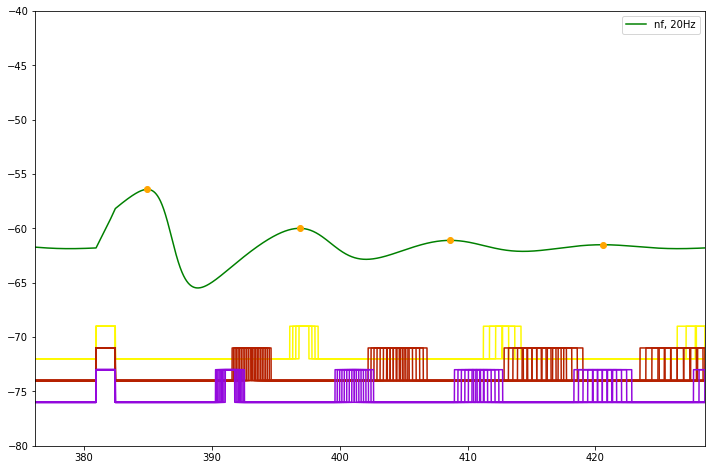

In [35]:
#1:1 locked: 63-66
#2:1 locked: 82-94
#3:1 locked: 99-107

t_31, x_31, i_31 = spikeresponse_track(kepler, 5.0, 8.0, 84) #freq in 3:1 locked area
t_nfiring, x_nfiring, i_nfiring = spikeresponse_track(kepler, 5.0, 8.0, 21)

t_21, x_21, i_21 = spikeresponse_track(kepler, 5.0, 8.0, 105)

t_11, x_11, i_11 = spikeresponse_track(kepler, 5.0, 8.0, 63)

t = t_firing = t_31 = t_21 = t_11

dt = .01
interval_start = 7.9

mymap = plt.get_cmap('gnuplot')

p_nfiring = 1000.0 / 21
p_11 = 1000.0 / 63
p_21 = 1000.0 / 105
p_31 = 1000.0 / 84
#x_nfiring = np.roll(x_nfiring, int(40*(p_firing - p_nfiring)/dt))
#i_nfiring = np.roll(i_nfiring, int(40*(p_firing - p_nfiring)/dt))
#i_31 = np.roll(i_31, int((40*(p_21 - p_31)/dt)))
#i_21 = np.roll(i_21, int((40*(p_21 - p_21)/dt)))
#i_11 = np.roll(i_11, int((40*(p_21 - p_11)/dt)))
#i_nfiring = np.roll(i_nfiring, int())
#x_11 = np.roll(x_11, int(40*(p_firing - p_11)/dt))

xnf_interval = x_nfiring[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
x_31_interval = x_31[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
x_21_interval = x_21[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
x_11_interval = x_11[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]
tint = t[int(interval_start*p_nfiring/dt):int(9*p_nfiring/dt)]

maxima_indices_xnf, xyz = detect_peaks(xnf_interval, .1)
maxima_times_xnf, noneed2 = detect_peaks(xnf_interval, .1, time = tint)
#maxima_times_xnf = maxima_indices_xnf * dt
#maxima_values_xnf = (x_nfiring[10000+maxima_indices_xnf])
maxima_values_xnf = xnf_interval[maxima_indices_xnf]
#maxima_indices_xf, xyz = detect_peaks(xf_interval, .1)
#maxima_times_xf = maxima_indices_xf * dt
#maxima_values_xf = (x_firing[10000+maxima_indices_xf])


'''
plt.figure(figsize=(12,8))
plt.plot(t, i_nfiring-5-8-63+1, color = mymap(0))
for locked1 in np.arange(63, 67, 1):
    perioddiff1 = ((1000.0/locked1) - (1000.0/63))
    plt.plot(t+((24*perioddiff1)), i_11-5-8-63-1, color = mymap(.99))
for locked2 in np.arange(82, 95, 1):
    perioddiff2 = ((1000.0/locked2) - (1000.0/84))
    plt.plot(t+(24*perioddiff2), i_21-5-8-63-3, color = mymap(1/2))
for locked3 in np.arange(99, 108, 1):
    perioddiff3 = ((1000.0/locked3) - (1000.0/105))
    plt.plot(t+(24*perioddiff3), i_31-5-8-63-5, color = mymap(1/3))
#plt.plot(tint, x_31_interval, label = '31f, 90Hz', color = 'blue')
'''
locked11 = [63, 64, 65, 66]
locked21 = np.arange(82, 95, 1)
locked31 = np.arange(99, 108, 1)

t1, i1 = ilocked(kepler, 5.0, 8.0, locked11)
t2, i2 = ilocked(kepler, 5.0, 8.0, locked21)
t3, i3 = ilocked(kepler, 5.0, 8.0, locked31)
plt.figure(figsize=(12,8))

#all i11
for f in range(0, len(locked11), 1):
    perioddiff = ((1000.0/locked11[f]) - (1000.0/63))
    plt.plot(t1-24*perioddiff, i1[f]-5-8-63-1, color = mymap(.99))

#all
for f in range(0, len(locked21), 1):
    perioddiff = ((1000.0/locked21[f]) - (1000.0/84))
    plt.plot(t2-32*perioddiff, i2[f]-5-8-63-3, color = mymap(1/2))
    
for f in range(0, len(locked31), 1):
    perioddiff = ((1000.0/locked31[f]) - (1000.0/105))
    plt.plot(t3-40*perioddiff, i3[f]-5-8-63-5, color = mymap(1/3))
    
    

plt.plot(tint, xnf_interval, label = 'nf, 20Hz', color = 'green')
#plt.plot(tint, x_11_interval, label = '11f, 60Hz', color = 'black')
#plt.plot(t[int(40*p_firing/dt):int(44*p_firing/dt)], x_21_interval, label = '21f, 102Hz', color = 'red')

plt.plot(maxima_times_xnf, maxima_values_xnf, 'o', color = 'orange')
#plt.plot(maxima_times_xf+t[int(40*p_firing/dt)], maxima_values_xf, 'o', color = 'blue')




#plt.axis((t[int(39*p_21/dt)], t[int(43*p_21/dt)], -80, -40))
plt.axis((t[int(interval_start*p_nfiring/dt)], t[int(9*p_nfiring/dt)], -80, -40))
plt.legend()
#print(t[int(39*p_firing/dt)])
print(maxima_times_xnf)
print(maxima_values_xnf)

In [14]:

#AOI of which we need a histogramm: I0 = 5, I1 = 8, f = {x1,x2,x3,...}


def ilocked(derivative, I0, I1, locked) :
    #tmax = 10000.0
    #tmax = 600.0
    tmax = 1000.0
    dt = 0.01
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    thresh = -20.0
    taus = 1.0 #changed taus as an input
    stime = np.arange(0.0, 1.5 * taus, dt) #spiketime: [0, dt, 2dt, ..., 8taus] WHY 8?
    spulse = (I1-I0) + 0 * stime
    
    #rates = [] #creates empty array
    iarrays = np.ndarray(shape=(len(locked), len(time)))
    
    for counter, f in enumerate(locked):
        dp = 1000.0/f        #period = distance of pulses (= 1000 ms / frequency)
        pulses = np.arange(0.0, tmax-(1.5*taus), dp) #pulses occuring between 0 and tmax-8taus with dist. dp
        current = np.zeros(len(time)) + I0 #current = I0 for all the time
        for pt in pulses: #loop through all the pulse-times
            current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse

        iarrays[counter] = current
                #add spulse (growth) while current is between pt and pt + 8tau/dt (= back at rest. pot)
                # = adds a full spulse on the current to the next pulse (dimensions are perfectly fit)
        #t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
            #...
        #spikes = t[:-1][(x[0][:-1]<thresh) & (x[0][1:]>=thresh)]
            #array of times where value just jumps over threshhold
        #spikes = spikes[spikes>200.0] #only pick spikes, which occur for t>100ms
        #rate = 0.0
        #if len(spikes) > 2: #more han two spikes occur
        #    rate = 1000.0*(len(spikes)-1)/(spikes[-1]-spikes[0]) #
        #rates.append(rate) #put all rate together in rates (evaluate one rate per frequency)

    return time, iarrays
    #return t[10000:], x[0][10000:], i[10000:]

In [9]:
for f in np.arange(63, 109, 1):
    print('f = {}, k = {}'.format(f, spikeresponse_track2(kepler, 5.0, 129.0, f)))

f = 63, k = 0.0
f = 64, k = 1.0
f = 65, k = 1.0
f = 66, k = 1.0
f = 67, k = 0.72
f = 68, k = 0.68
f = 69, k = 0.64
f = 70, k = 0.6
f = 71, k = 0.56
f = 72, k = 0.52
f = 73, k = 0.47
f = 74, k = 0.48
f = 75, k = 0.47
f = 76, k = 0.43
f = 77, k = 0.41
f = 78, k = 0.4
f = 79, k = 0.38
f = 80, k = 0.36
f = 81, k = 0.33
f = 82, k = 0.33
f = 83, k = 0.33
f = 84, k = 0.33
f = 85, k = 0.33
f = 86, k = 0.33
f = 87, k = 0.33
f = 88, k = 0.33
f = 89, k = 0.33
f = 90, k = 0.33
f = 91, k = 0.33
f = 92, k = 0.33
f = 93, k = 0.33
f = 94, k = 0.33
f = 95, k = 0.33
f = 96, k = 0.37
f = 97, k = 0.43
f = 98, k = 0.43
f = 99, k = 0.45
f = 100, k = 0.41
f = 101, k = 0.5
f = 102, k = 0.5
f = 103, k = 0.5
f = 104, k = 0.5
f = 105, k = 0.5
f = 106, k = 0.5
f = 107, k = 0.0
f = 108, k = 0.0


11 : 64-66 - 3

31 : 81-95 - 15

21 : 101-106 - 5

In [12]:
for i in np.arange(60, 100, 1):
    print('i = {}, k = {}'.format(i, spikeresponse_track2(kepler, 5.0, i, 80)))

i = 60, k = 0.0
i = 61, k = 0.0
i = 62, k = 0.0
i = 63, k = 0.0
i = 64, k = 0.0
i = 65, k = 0.0
i = 66, k = 0.0
i = 67, k = 0.0
i = 68, k = 0.06
i = 69, k = 0.08


KeyboardInterrupt: 

In [14]:

#AOI of which we need a histogramm: I0 = 5, I1 = 8, f = {x1,x2,x3,...}


def spikeresponse_rec15_hist(derivative, I0, I1, freq) :
    #tmax = 10000.0
    #tmax = 600.0
    tmax = 2500.0
    dt = 0.01
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    thresh = -20.0
    taus = 1.0 #changed taus as an input
    stime = np.arange(0.0, 1.5 * taus, dt) #spiketime: [0, dt, 2dt, ..., 8taus] WHY 8?

    spulse = (I1-I0) + 0 * stime

    rates = [] #creates empty array
    dp = 1000.0/freq          #period = distance of pulses (= 1000 ms / frequency)
    pulses = np.arange(0.0, tmax-(1.5*taus), dp) #pulses occuring between 0 and tmax-8taus with dist. dp
    current = np.zeros(len(time)) + I0 #current = I0 for all the time
    for pt in pulses: #loop through all the pulse-times
        current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
            #add spulse (growth) while current is between pt and pt + 8tau/dt (= back at rest. pot)
            # = adds a full spulse on the current to the next pulse (dimensions are perfectly fit)
    t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
        #...
    spikes = t[:-1][(x[0][:-1]<thresh) & (x[0][1:]>=thresh)]
        #array of times where value just jumps over threshhold
    spikes = spikes[spikes>1200.0] #only pick spikes, which occur for t>100ms
    rate = 0.0
    if len(spikes) > 2: #more han two spikes occur
        rate = 1000.0*(len(spikes)-1)/(spikes[-1]-spikes[0]) #
    rates.append(rate) #put all rate together in rates (evaluate one rate per frequency)
    
    phis = np.zeros(len(spikes))
    phis = ((spikes % dp) / dp) * 2 * np.pi
    phis_x = np.cos(phis)
    phis_y = np.sin(phis)
    
    phis_x_mean = np.mean(phis_x) #MEAN?
    phis_y_mean = np.mean(phis_y) #MEAN?
    
    phi_mean = np.arctan2(phis_y_mean, phis_x_mean)
    vector_strength = np.sqrt(phis_x_mean**2 + phis_y_mean**2)
        
    if phi_mean < 0:
        phi_mean += 2 * np.pi
        
    if rate == 0.0:
        phi_mean = -1
        vector_strength = -1
    
    
    
    #SPIKE DETECTION

    maxima_indices, xyz = detect_peaks(x[0][10000:(10000+int(dp/dt))], .1)
    maxima_times = maxima_indices * dt
    
    
    maxima_values = (x[0][10000+maxima_indices])
    
    #print(maxima_indices)
    #plt.plot(t, i)
    #
    #plt.plot(t, x[0])
    #plt.plot(maxima_times+200, maxima_values, 'o')
    #plt.axis((200,300,-60,40))
    isi = np.diff(maxima_indices)
    rel_isi = (isi / dp) * dt
    
    #print(isi)
    #print(rel_isi)
    
    #bins = np.linspace(np.min(rel_isi), np.max(rel_isi), 20)
    bins = np.linspace(.9, 6, 20)
    
    #plt.figure(figsize=(12,5))
    #plt.hist(rel_isi, bins)#, normed=True)
    #plt.title('k = {:.2f}, f = {}'.format(rate/freq, freq))
    
    #put isi in different bins: min should be one dp (period), max wil be about some periods
    #scott histogramm? $w = \frac {3.49 \cdot \sigma} {\sqrt[3]{n}}$

    #plt.plot(t, x[0])
    #plt.plot(maxima_times, maxima_values, 'o')
    #plt.axis((-1,dp,-66,-55))
    #return rate/freq, vector_strength
    
    
    #return t, x[0], i, rate
    return t, x[0], i
    #return rate/freq#, vector_strength
    #return vector_strength

[]
frequence 70.24, no period found
[ 42.71  42.71  42.71  42.73  42.71  42.72  42.73  42.72  42.73  42.73
  42.74]
11
22.0
frequence 70.25, no period found
[ 42.69  42.7   42.71  42.69  42.71  42.7   42.69  42.7   42.69  42.71
  42.69  42.7   42.7   42.69  42.7   42.7   42.69  42.7   42.7   42.7   42.7
  42.7   42.7 ]
23
22.0
frequence: 70.26, period: 14.23, whole period: 3.0
[]
frequence 73.14, no period found
[ 191.58]
1
4.0
frequence 73.15, no period found
[]
frequence 73.16, no period found
[30, 30, 3.0, 30, 30, 30]


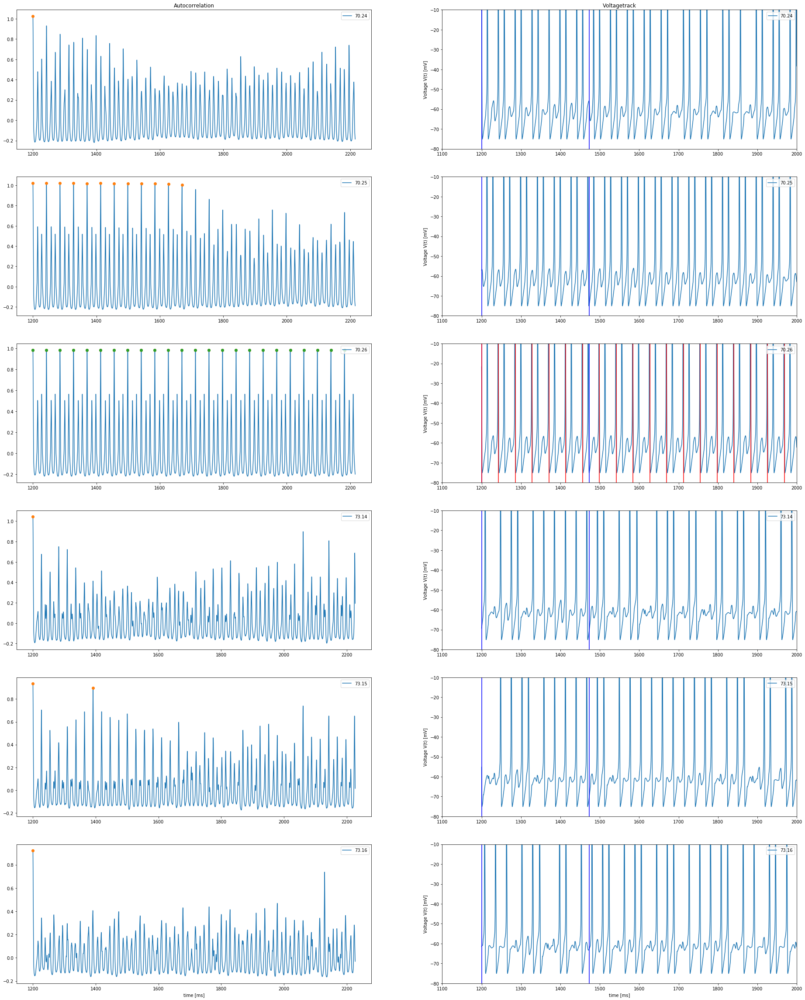

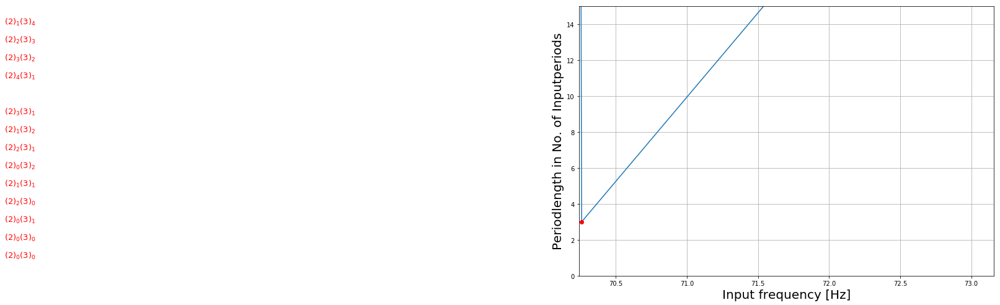

In [13]:



plot = True
#farea = np.round(np.arange(63, 108+.1, .1), 1)63.7, 
farea = np.round(np.arange(63, 108+.05, .05), 2)
farea = np.arange(82.1, 82.25, .025)

farea = ([82.1, 82.2, 100.6, 101.0])
farea = ([74.4, 74.45])
farea = ([73.29, 73.47, ])
#farea = np.round(np.arange(73.30, 108+.05, .05), 2)
#frequence: 73.35, period: 13.63, whole period: 8.0
#farea = np.round(np.arange(63.7, 63.8, .05), 2)
dt = .01
pf = []

#print(farea)
#farea = (76.0, 98.1)
#farea = np.arange(98, 98.2, .1)
#farea = np.arange(77.7, 83, .1)
#farea = (77.1, 77.2)
#farea = (68, 69, 76, 82, 98, 99)
#farea = [68, 80]

if plot:
    fig = plt.figure(figsize=(32,len(farea)*8))



for f in farea:
    
    t, x, i = spikeresponse_rec15_hist(kepler, 5.0, 8.0, f)
    
    #set x just to x beginning with 100 ms
    x = x[int(1300/dt):]
    
    xold = x

    #normalization
    x = x - np.mean(x)
    x = x / np.std(x)
    
    #ac = np.correlate(x[int(100/.01):int(int(100+50*1000.0/93)/.01)], x[int(100/.01):int(int(100+50*1000.0/93)/.01)], 'full')
    #correlate input 20-60 with whole x
    #ac2 = np.correlate(x[int(20*1000.0/f/.01):int(int(40*1000.0/f)/.01)], x, 'same')
    ac2 = np.correlate(x, x[int(0*1000.0/f/dt):int(int(20*1000.0/f)/dt)],'valid') / len(x[int(0*1000.0/f/dt):int(int(20*1000.0/f)/dt)])
    #ac2 = (ac2 - np.mean(ac2)) / np.std(ac2) activate!!!
    #ac2 = np.correlate(x, x, 'same')

    
    #pick a relevant interval
    #ac2int = ac2[int(200/.01):int(int(200+50*1000.0/95)/.01)]
    #ac2int = ac2[int(30*1000.0/f/.01):int(int(60*1000.0/f)/.01)] #what is the right interval?
    
    #alternative:
    #ac2int = ac2[ac2>=0.23]
    ac2int = ac2
    t = t[int(1300/dt):]
    tint = t[:-int(int(20*1000.0/f)/dt)+1]
    #tint = tint[ac2>=0.23]
    
    #plt.plot(tint, ac2int)
    
    #ac2int = ac2[int(200/.01):int(600/.01)]
    
    


    #plot autocorrelation
    #plt.plot(t, ac2)
    #plt.axis((0*1000.0/f-100, 50*1000.0/f, 2.5, np.max(ac2)+.1))
    
    
    #detect peaks in ac
    #ac2_maxima, noneed = detect_peaks(ac2int, 1.05)
    ac2_maxima, noneed = detect_peaks(ac2, (np.max(ac2)-np.min(ac2))*.95)
    #ac2_maxima_times, noneed2 = detect_peaks(ac2int, 1.05, time = tint)
    ac2_maxima_times, noneed2 = detect_peaks(ac2, (np.max(ac2)-np.min(ac2))*.95, time = tint)
    
    #added for better checks
    ac2_maxima_times = np.append(tint[0], ac2_maxima_times)
    ac2_maxima = np.append(0, ac2_maxima).tolist()
    ac2_maxima[0] = int(0)
    
    #ac2_maxima_indices = ac2
    if len(ac2_maxima) != 0:
        ac2_maxima_values = ac2[ac2_maxima]
        
    

    #ac2_maxima_times_diff = ac2_maxima_times - (ac2_maxima_times[0] - t[int(0*1000.0/f/.01)+int(300/.01)])
    #ac2_maxima_times_diff = ac2_maxima_times - 100
    #print(ac2_maxima_times)
    #print(ac2_maxima_times_diff)
    #print(ac2_maxima)
    #print(tint[-1])
    if plot:

    #plot autocorrelation in the specific interval
        #plt.plot(t[int(100/.01):int(int(100+50*1000.0/93)/.01)], ac)
        #fig = plt.figure(figsize=(20,16))
        #fig.add_subplot(len(farea)+1, 2, 1+2*(f-farea[0]))
        fig.add_subplot(len(farea)+1, 2, 1+2*np.where(np.asarray(farea) == f)[0][0])
        if f==farea[0]:
            plt.title('Autocorrelation')
        #plt.plot(t[int(200/.01):], ac2)
        plt.plot(tint, ac2int, label = f)
        if len(ac2_maxima) != 0:
            plt.plot(ac2_maxima_times, ac2_maxima_values, 'o')
        #plt.plot(t[:-int(300/.01)], ac2int)
        #plt.plot(t[int(30*1000.0/f/.01):int(int(60*1000.0/f)/.01)], ac2int)
        #plt.plot(t[int(200/.01):int(600/.01)], ac2int)
        if f==farea[len(farea)-1]:
            plt.xlabel('time [ms]')
        plt.legend(loc = 'upper right')
    #ac2_maxima_times = ac2_maxima * .01 + 200
    
    #find periods
    ac2_maxima_times_isi = np.diff(ac2_maxima_times)
    #ac2_maxima_times_isi = np.concatenate(([0], ac2_maxima_times_isi))#notneeded?
    print(ac2_maxima_times_isi)


    #print(ac2_maxima_times)
    
    #print(tint[0])

    periodic = True
    #print(len(tint)*.01 / 2)
    #if ac2_maxima_times_isi[0]
   # if np.sum(ac2_maxima_times_isi) < (len(tint)*.01 / 2):
   #     periodic = False
    
        
    if len(ac2_maxima_times_isi) < 1:
        periodic = False


    
    
    if len(ac2_maxima_times_isi) != 0:
 #       print((len(tint)*.01) // ac2_maxima_times_isi[0])
        print(len(ac2_maxima_times_isi))
        print(((len(tint)*dt) // ac2_maxima_times_isi[0]) -1)
        #if len(ac2_maxima_times_isi) != (((len(tint)*dt) // ac2_maxima_times_isi[0])):
        if ((((len(tint)*dt) // ac2_maxima_times_isi[0]) -1) - len(ac2_maxima_times_isi)) >= 1:
            
            periodic = False
                
                
       # if np.round(ac2_maxima_times_isi[0], -1) != np.round(ac2_maxima_times[1], -1):
       #     periodic = False
    for i in range(0, len(ac2_maxima_times_isi)-1, 1):
            if np.round(ac2_maxima_times_isi[i], -1) != np.round(ac2_maxima_times_isi[i+1], -1):
                periodic = False

    #if len(ac2_maxima_times_isi) == 1:   #should be ISI??
    #    if ac2_maxima_times[0] < len(tint)*dt/2:
    #        period = False
    #    print(ac2_maxima_times)
        
    #if len(ac2_maxima_times) == 1:   #should be ISI??
    #    if ac2_maxima_times[0] < (1000.0-(20*1000.0/f))/2:
    #        period = False
    #    print(ac2_maxima_times)

    if periodic:
        
        ac2_maxima_values = ac2int[ac2_maxima]
        if len(ac2_maxima_times) == 1:
            period = round(((ac2_maxima_times[0] - t[0]) / (1000.0/f)), 1)
        else:
            period = round((ac2_maxima_times_isi[0] / (1000.0/f)), 1)
        
        #if f == 80:
        #    period = round(((ac2_maxima_times[1] - t[0])/ (1000.0/f)), 1)
        #    print((ac2_maxima_times[1] - t[0]))
            
       # if f in (68, 69, 76, 82, 98, 99):
            #period = 0
       #     period = 30
        
        
        #print(f)
        #print((1000.0/f))
        #print(period)
        print('frequence: {}, period: {:.2f}, whole period: {}'.format(f, 1000.0/f, period))
       # print(ac2_maxima_times_isi)
        pf.append(period)
        
        if plot:
            plt.plot(ac2_maxima_times, ac2_maxima_values, 'o')
            #plt.figure(figsize=(10,8))

            fig.add_subplot(len(farea)+1, 2, 2+2*np.where(np.asarray(farea) == f)[0][0])
            if f==farea[0]:
                plt.title('Voltagetrack')
            #plt.plot(t[int(300/.01):], x, label = f)
            plt.plot(t, xold, label = f)
            if f==farea[len(farea)-1]:
                plt.xlabel('time [ms]')
            plt.ylabel('Voltage V(t) [mV]')
            plt.axis((int(0*1000.0/f)+180, 1000, -80, -10))
            plt.axis((1100, 2000, -80, -10))
            #plt.axis((200, 600, -80, -10))
            plt.legend(loc = 'upper right')
            plt.axvline(x=t[int(0*1000.0/farea[len(farea)-1]/dt)], color='blue')
            plt.axvline(x=t[int(20*1000.0/farea[len(farea)-1]/dt)], color='blue')

            for periods in range(0,len(ac2_maxima_times), 1):
            #plt.axvline(x=periods*ac2_maxima_times_isi[periods]+int(30*1000.0/f))
                #plt.axvline(x=ac2_maxima_times_diff[periods], color = 'red') activate
                plt.axvline(x=ac2_maxima_times[periods], color = 'red')
    else:
        print('frequence {}, no period found'.format(f))
        #plt.figure(figsize=(10,8))
        
        period = 30
        pf.append(period)
        if plot:
            fig.add_subplot(len(farea)+1, 2, 2+2*np.where(np.asarray(farea) == f)[0][0])
            if f==farea[0]:
                plt.title('Voltagetrack')
            #plt.plot(t[int(300/.01):], x, label = f)
            plt.plot(t, xold, label = f)
            if f==farea[len(farea)-1]:
                plt.xlabel('time [ms]')
            plt.ylabel('Voltage V(t) [mV]')
            plt.axis((int(0*1000.0/f)+180, 1000, -80, -10))
            plt.axis((1100, 2000, -80, -10))
            plt.axvline(x=t[int(0*1000.0/farea[len(farea)-1]/dt)], color='blue')
            plt.axvline(x=t[int(20*1000.0/farea[len(farea)-1]/dt)], color='blue')
            #plt.axis((200, 600, -80, -10))
            plt.legend(loc = 'upper right')
#plt.figure(figsize=(10,8))
#plt.plot(t[int(200/.01):], x)
#plt.plot(t[int(300/.01)+int(0*1000.0/f/.01):int(300/.01)+int(int(20*1000.0/f)/.01)], x[int(0*1000.0/f/.01):int(int(20*1000.0/f)/.01)])
#plt.axvline(x=x[int(20*1000.0/farea[len(farea)-1]/.01)], color= 'red')
#plt.axvline(x=x[int(40*1000.0/farea[len(farea)-1]/.01)], color='red')
#plt.savefig('spikes{}{}.png'.format(farea[0], farea[-1]))
print(pf)


plt.figure(figsize=(12,8))
plt.plot(farea, pf);
plt.xlabel('Input frequency [Hz]', fontsize = 20);
plt.ylabel('Periodlength in No. of Inputperiods', fontsize = 20);

#texts
plt.text(66.20, 1.0, r'$(2)_0 (3)_0$', color = 'red', fontsize = 13)
plt.text(66.20, 2.0, r'$(2)_0 (3)_0$', color = 'red', fontsize = 13)
plt.text(66.20, 3.0, r'$(2)_0 (3)_1$', color = 'red', fontsize = 13)
plt.text(66.20, 4.0, r'$(2)_2 (3)_0$', color = 'red', fontsize = 13)
plt.text(66.20, 5.0, r'$(2)_1 (3)_1$', color = 'red', fontsize = 13)
plt.text(66.20, 6.0, r'$(2)_0 (3)_2$', color = 'red', fontsize = 13)
plt.text(66.20, 7.0, r'$(2)_2 (3)_1$', color = 'red', fontsize = 13)
plt.text(66.20, 8.0, r'$(2)_1 (3)_2$', color = 'red', fontsize = 13)
plt.text(66.20, 9.0, r'$(2)_3 (3)_1$', color = 'red', fontsize = 13)
plt.text(66.20, 11.0, r'$(2)_4 (3)_1$', color = 'red', fontsize = 13)
plt.text(66.20, 12.0, r'$(2)_3 (3)_2$', color = 'red', fontsize = 13)
plt.text(66.20, 13.0, r'$(2)_2 (3)_3$', color = 'red', fontsize = 13)
plt.text(66.20, 14.0, r'$(2)_1 (3)_4$', color = 'red', fontsize = 13)

#lines and dots
possibleperiods = np.arange(1.0, 15.0, 1.0)
possibleperiods = np.delete(possibleperiods, 9)
for b in possibleperiods:
    plt.hlines(y=b, xmin=63.0, xmax = 66.25, color = 'red')
    #print(b)
    for a in np.where(pf==b)[0]:
        np.where(pf==b)[0]
        #print(a)
        plt.plot(farea[a], b, 'o', color = 'red')

plt.axis((np.min(farea), np.max(farea), 0, 15))
#plt.axis((60, 110, 0, 15))
plt.grid()

#plt.savefig('Rec_periods_end2')
#plt.savefig('Rec_periods_outlier2')


-610.0

 to check:  
 
 frequence: 70.25, CHECK
 
 frequence: 75.45, period: 13.25, whole period: 13.0, [ 172.18]

 frequence: 77.55, period: 12.89, whole period: 12.0, [ 154.59]
            
 frequence: 81.2, period: 12.32, whole period: 8.0 [ 98.47  98.58  98.43]
            
 frequence: 96.95, period: 10.31, whole period: 13.0, [ 134.09  134.15  113.39] ->X
            

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 30, 26.0, 30, 30, 30, 30, 30, 16.0, 30, 30, 30, 30, 30, 30, 30, 2.0, 30, 30, 30, 7.0, 30, 17.0, 30, 5.0, 5.0, 31.0, 34.0, 8.0, 8.0, 8.0, 30, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 30, 30, 7.0, 50.0, 30, 39.0, 30, 30, 30, 4.0, 4.0, 4.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0]

74.2 - 74.3 - 2.0

74.4 not locked (Why?)

74.5 - 74.8 - 2.0

76.0 - 11.0???????? (not good enough)

76.2 - badly locked 9.0

76.4 - 9.0 (2,2,2,3?)

76.5 - badly locked 9.0

76.5 badly locked 9.0

77.1 - badly locked 7.0

77.2 - 7.0 (2,2,3)

77.7 - 12.0

78.4 - badly locked 5.0

78.5 - 79.0 - 5.0

79.8 - 79.9 - 13.0

80.4 - 81.1 - 8.0

81.2 badly locked 8.0

81.6 - 14.0

82.1 - 6.0

82.2 - 3.0

96.0 - 96.2 - 7.0 (2,2,3)

96.9 - 11.0? (not good enough)

98.1 - 13.0 (?)?????????????????

98.8 - 9.0 seems not


[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 2.0, 2.0, 2.0, 30, 2.0, 2.0, 2.0, 2.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 9.0, 30, 30, 30, 30, 30, 30, 30, 7.0, 30, 30, 30, 30, 12.0, 30, 30, 30, 30, 30, 30, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 30, 30, 30, 30, 30, 30, 13.0, 13.0, 30, 30, 30, 30, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 30, 30, 30, 30, 14.0, 30, 30, 30, 30, 6.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 7.0, 7.0, 7.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 13.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0]

[ 15.87  15.88  15.87  15.87  15.88  15.87  15.87  15.87  15.88  15.87
  15.87  15.88  15.87  15.87  15.88  15.87  15.87  15.87  15.88  15.87
  15.87  15.88  15.87  15.87  15.88  15.87  15.87  15.87  15.88  15.87
  15.87  15.88  15.87  15.87  15.88  15.87  15.87  15.87  15.88  15.87
  15.87  15.88  15.87  15.87  15.88  15.87  15.87  15.88  15.87  15.87
  15.87  15.88  15.87  15.87  15.88  15.87  15.87  15.88  15.87  15.87
  15.87]
61
60.0
frequence: 63.0, period: 15.87, whole period: 1.0
[ 15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.88
  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.87
  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.88
  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.87
  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.88
  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.87  15.87
  15.87]
61
60.0
frequence: 63.01, period: 15.87, whole period: 1.0
[ 15.87  15.8

[ 15.83  15.83  15.83  15.83  15.83  15.83  15.83  15.83  15.83  15.83
  15.83  15.83  15.83  15.83  15.83  15.84  15.83  15.83  15.83  15.83
  15.83  15.83  15.83  15.83  15.83  15.83  15.83  15.83  15.83  15.83
  15.83  15.83  15.83  15.83  15.83  15.83  15.83  15.83  15.83  15.83
  15.83  15.83  15.83  15.83  15.83  15.83  15.83  15.83  15.84  15.83
  15.83  15.83  15.83  15.83  15.83  15.83  15.83  15.83  15.83  15.83
  15.83]
61
61.0
frequence: 63.17, period: 15.83, whole period: 1.0
[ 15.83  15.83  15.82  15.83  15.83  15.83  15.82  15.83  15.83  15.83
  15.83  15.82  15.83  15.83  15.83  15.82  15.83  15.83  15.83  15.83
  15.82  15.83  15.83  15.83  15.82  15.83  15.83  15.83  15.83  15.82
  15.83  15.83  15.83  15.82  15.83  15.83  15.83  15.83  15.82  15.83
  15.83  15.83  15.82  15.83  15.83  15.83  15.83  15.82  15.83  15.83
  15.83  15.82  15.83  15.83  15.83  15.83  15.82  15.83  15.83  15.83
  15.83]
61
61.0
frequence: 63.18, period: 15.83, whole period: 1.0
[ 15.83  15.

[ 15.79  15.79  15.78  15.79  15.79  15.79  15.78  15.79  15.79  15.79
  15.79  15.78  15.79  15.79  15.79  15.78  15.79  15.79  15.79  15.79
  15.78  15.79  15.79  15.79  15.79  15.78  15.79  15.79  15.79  15.78
  15.79  15.79  15.79  15.79  15.78  15.79  15.79  15.79  15.78  15.79
  15.79  15.79  15.79  15.78  15.79  15.79  15.79  15.78  15.79  15.79
  15.79  15.79  15.78  15.79  15.79  15.79  15.79  15.78  15.79  15.79
  15.79  15.78]
62
61.0
frequence: 63.34, period: 15.79, whole period: 1.0
[ 15.79  15.78  15.79  15.78  15.79  15.78  15.79  15.78  15.79  15.78
  15.79  15.78  15.79  15.78  15.79  15.79  15.78  15.79  15.78  15.79
  15.78  15.79  15.78  15.79  15.78  15.79  15.78  15.79  15.78  15.79
  15.78  15.79  15.79  15.78  15.79  15.78  15.79  15.78  15.79  15.78
  15.79  15.78  15.79  15.78  15.79  15.78  15.79  15.79  15.78  15.79
  15.78  15.79  15.78  15.79  15.78  15.79  15.78  15.79  15.78  15.79
  15.78  15.79]
62
61.0
frequence: 63.35, period: 15.79, whole period: 1.

[ 15.73  15.75  15.74  15.75  15.74  15.75  15.75  15.74  15.75  15.74
  15.75  15.74  15.75  15.74  15.75  15.75  15.74  15.75  15.74  15.75
  15.74  15.75  15.74  15.75  15.75  15.74  15.75  15.74  15.75  15.74
  15.75  15.74  15.75  15.75  15.74  15.75  15.74  15.75  15.74  15.75
  15.74  15.75  15.75  15.74  15.75  15.74  15.75  15.74  15.75  15.74
  15.75  15.75  15.74  15.75  15.74  15.75  15.74  15.75  15.74  15.75
  15.75  15.74]
62
61.0
frequence: 63.51, period: 15.75, whole period: 1.0
[ 15.73  15.75  15.74  15.74  15.75  15.74  15.74  15.74  15.75  15.74
  15.74  15.75  15.74  15.74  15.75  15.74  15.74  15.75  15.74  15.74
  15.74  15.75  15.74  15.74  15.75  15.74  15.74  15.75  15.74  15.74
  15.75  15.74  15.74  15.74  15.75  15.74  15.74  15.75  15.74  15.74
  15.75  15.74  15.74  15.75  15.74  15.74  15.74  15.75  15.74  15.74
  15.75  15.74  15.74  15.75  15.74  15.74  15.75  15.74  15.74  15.74
  15.75  15.74]
62
61.0
frequence: 63.52, period: 15.74, whole period: 1.

[ 15.7   15.71  15.7   15.7   15.71  15.7   15.7   15.71  15.7   15.71
  15.7   15.7   15.71  15.7   15.7   15.71  15.7   15.7   15.71  15.7   15.7
  15.71  15.7   15.7   15.71  15.7   15.7   15.71  15.7   15.71  15.7   15.7
  15.71  15.7   15.7   15.71  15.7   15.7   15.71  15.7   15.7   15.71
  15.7   15.7   15.71  15.7   15.71  15.7   15.7   15.71  15.7   15.7
  15.71  15.7   15.7   15.71  15.7   15.7   15.71  15.7   15.7   15.71]
62
61.0
frequence: 63.68, period: 15.70, whole period: 1.0
[ 15.7   15.7   15.7   15.7   15.71  15.7   15.7   15.7   15.7   15.7   15.7
  15.7   15.7   15.7   15.71  15.7   15.7   15.7   15.7   15.7   15.7   15.7
  15.7   15.71  15.7   15.7   15.7   15.7   15.7   15.7   15.7   15.7   15.7
  15.71  15.7   15.7   15.7   15.7   15.7   15.7   15.7   15.7   15.71
  15.7   15.7   15.7   15.7   15.7   15.7   15.7   15.7   15.7   15.71
  15.7   15.7   15.7   15.7   15.7   15.7   15.7   15.7   15.71]
62
61.0
frequence: 63.69, period: 15.70, whole period: 1.0
[ 15.7

[ 15.66  15.66  15.66  15.67  15.66  15.66  15.66  15.66  15.67  15.66
  15.66  15.66  15.66  15.66  15.67  15.66  15.66  15.66  15.66  15.66
  15.67  15.66  15.66  15.66  15.66  15.66  15.67  15.66  15.66  15.66
  15.66  15.66  15.67  15.66  15.66  15.66  15.66  15.66  15.67  15.66
  15.66  15.66  15.66  15.66  15.67  15.66  15.66  15.66  15.66  15.67
  15.66  15.66  15.66  15.66  15.66  15.67  15.66  15.66  15.66  15.66
  15.66  15.67]
62
62.0
frequence: 63.85, period: 15.66, whole period: 1.0
[ 15.66  15.66  15.66  15.66  15.66  15.65  15.66  15.66  15.66  15.66
  15.66  15.66  15.66  15.66  15.66  15.66  15.66  15.66  15.66  15.65
  15.66  15.66  15.66  15.66  15.66  15.66  15.66  15.66  15.66  15.66
  15.66  15.66  15.65  15.66  15.66  15.66  15.66  15.66  15.66  15.66
  15.66  15.66  15.66  15.66  15.66  15.66  15.65  15.66  15.66  15.66
  15.66  15.66  15.66  15.66  15.66  15.66  15.66  15.66  15.66  15.65
  15.66  15.66]
62
62.0
frequence: 63.86, period: 15.66, whole period: 1.

[ 15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62
  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62
  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62
  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62
  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62
  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62  15.62
  15.62  15.62  15.62]
63
62.0
frequence: 64.02, period: 15.62, whole period: 1.0
[ 15.62  15.62  15.61  15.62  15.62  15.62  15.61  15.62  15.62  15.62
  15.61  15.62  15.62  15.62  15.62  15.61  15.62  15.62  15.62  15.61
  15.62  15.62  15.62  15.61  15.62  15.62  15.62  15.62  15.61  15.62
  15.62  15.62  15.61  15.62  15.62  15.62  15.61  15.62  15.62  15.62
  15.61  15.62  15.62  15.62  15.62  15.61  15.62  15.62  15.62  15.61
  15.62  15.62  15.62  15.61  15.62  15.62  15.62  15.62  15.61  15.62
  15.62  15.62  15.61]
63
62.0
frequence: 64.03, period: 15.62, wh

[ 15.58  15.58  15.58  15.57  15.58  15.58  15.58  15.58  15.58  15.58
  15.58  15.57  15.58  15.58  15.58  15.58  15.58  15.58  15.58  15.57
  15.58  15.58  15.58  15.58  15.58  15.58  15.58  15.57  15.58  15.58
  15.58  15.58  15.58  15.58  15.58  15.57  15.58  15.58  15.58  15.58
  15.58  15.58  15.58  15.57  15.58  15.58  15.58  15.58  15.58  15.58
  15.58  15.57  15.58  15.58  15.58  15.58  15.58  15.58  15.58  15.57
  15.58  15.58  15.58]
63
62.0
frequence: 64.19, period: 15.58, whole period: 1.0
[ 15.58  15.57  15.58  15.58  15.57  15.58  15.57  15.58  15.58  15.57
  15.58  15.58  15.57  15.58  15.57  15.58  15.58  15.57  15.58  15.58
  15.57  15.58  15.58  15.57  15.58  15.57  15.58  15.58  15.57  15.58
  15.58  15.57  15.58  15.57  15.58  15.58  15.57  15.58  15.58  15.57
  15.58  15.58  15.57  15.58  15.57  15.58  15.58  15.57  15.58  15.58
  15.57  15.58  15.58  15.57  15.58  15.57  15.58  15.58  15.57  15.58
  15.58  15.57  15.58]
63
62.0
frequence: 64.2, period: 15.58, who

[ 15.53  15.53  15.54  15.54  15.54  15.53  15.54  15.54  15.54  15.54
  15.53  15.54  15.54  15.54  15.53  15.54  15.54  15.54  15.53  15.54
  15.54  15.54  15.53  15.54  15.54  15.54  15.53  15.54  15.54  15.54
  15.53  15.54  15.54  15.54  15.54  15.53  15.54  15.54  15.54  15.53
  15.54  15.54  15.54  15.53  15.54  15.54  15.54  15.53  15.54  15.54
  15.54  15.53  15.54  15.54  15.54  15.53  15.54  15.54  15.54  15.54
  15.53  15.54  15.54]
63
62.0
frequence: 64.36, period: 15.54, whole period: 1.0
[ 15.53  15.54  15.53  15.54  15.53  15.54  15.53  15.54  15.53  15.54
  15.53  15.54  15.53  15.54  15.54  15.53  15.54  15.53  15.54  15.53
  15.54  15.53  15.54  15.53  15.54  15.53  15.54  15.53  15.54  15.53
  15.54  15.53  15.54  15.53  15.54  15.53  15.54  15.53  15.54  15.53
  15.54  15.54  15.53  15.54  15.53  15.54  15.53  15.54  15.53  15.54
  15.53  15.54  15.53  15.54  15.53  15.54  15.53  15.54  15.53  15.54
  15.53  15.54  15.53]
63
62.0
frequence: 64.37, period: 15.54, wh

[ 15.5   15.49  15.5   15.49  15.5   15.5   15.49  15.5   15.5   15.49
  15.5   15.5   15.49  15.5   15.5   15.49  15.5   15.5   15.49  15.5   15.5
  15.49  15.5   15.5   15.49  15.5   15.5   15.49  15.5   15.5   15.49
  15.5   15.5   15.49  15.5   15.5   15.49  15.5   15.5   15.49  15.5   15.5
  15.49  15.5   15.5   15.49  15.5   15.5   15.49  15.5   15.5   15.49
  15.5   15.5   15.49  15.5   15.5   15.49  15.5   15.5   15.49  15.5   15.5 ]
63
62.0
frequence: 64.53, period: 15.50, whole period: 1.0
[ 15.49  15.5   15.49  15.5   15.49  15.5   15.49  15.49  15.5   15.49
  15.5   15.49  15.5   15.49  15.49  15.5   15.49  15.5   15.49  15.5
  15.49  15.49  15.5   15.49  15.5   15.49  15.5   15.49  15.49  15.5
  15.49  15.5   15.49  15.5   15.49  15.49  15.5   15.49  15.5   15.49
  15.5   15.49  15.49  15.5   15.49  15.5   15.49  15.5   15.49  15.49
  15.5   15.49  15.5   15.49  15.5   15.49  15.49  15.5   15.49  15.5
  15.49  15.5   15.49]
63
62.0
frequence: 64.54, period: 15.49, whole pe

[ 15.46  15.45  15.46  15.45  15.46  15.46  15.45  15.46  15.45  15.46
  15.46  15.45  15.46  15.46  15.45  15.46  15.45  15.46  15.46  15.45
  15.46  15.46  15.45  15.46  15.45  15.46  15.46  15.45  15.46  15.45
  15.46  15.45  15.46  15.46  15.45  15.46  15.45  15.46  15.45  15.46
  15.45  15.46  15.46  15.45  15.46  15.45  15.46  15.46  15.45  15.46
  15.45  15.46  15.46  15.45  15.46  15.46  15.45  15.46  15.45  15.46
  15.46  15.45  15.46]
63
63.0
frequence: 64.7, period: 15.46, whole period: 1.0
[ 15.45  15.46  15.45  15.45  15.46  15.45  15.45  15.46  15.45  15.46
  15.45  15.45  15.46  15.45  15.45  15.46  15.45  15.45  15.46  15.45
  15.45  15.46  15.45  15.46  15.45  15.45  15.46  15.45  15.45  15.46
  15.45  15.45  15.46  15.45  15.45  15.46  15.45  15.46  15.45  15.45
  15.46  15.45  15.45  15.46  15.45  15.45  15.46  15.45  15.45  15.46
  15.45  15.46  15.45  15.45  15.46  15.45  15.45  15.46  15.45  15.45
  15.46  15.45  15.45]
63
63.0
frequence: 64.71, period: 15.45, who

[ 15.42  15.42  15.41  15.42  15.42  15.42  15.41  15.42  15.42  15.42
  15.42  15.41  15.42  15.42  15.42  15.42  15.41  15.42  15.42  15.42
  15.41  15.42  15.42  15.42  15.42  15.41  15.42  15.42  15.42  15.41
  15.42  15.42  15.42  15.42  15.41  15.42  15.42  15.42  15.42  15.41
  15.42  15.42  15.42  15.41  15.42  15.42  15.42  15.42  15.41  15.42
  15.42  15.42  15.41  15.42  15.42  15.42  15.42  15.41  15.42  15.42
  15.42  15.41  15.42  15.42]
64
63.0
frequence: 64.86, period: 15.42, whole period: 1.0
[ 15.42  15.41  15.42  15.41  15.42  15.41  15.42  15.41  15.42  15.41
  15.42  15.42  15.41  15.42  15.41  15.42  15.41  15.42  15.41  15.42
  15.41  15.42  15.42  15.41  15.42  15.41  15.42  15.41  15.42  15.41
  15.42  15.41  15.42  15.41  15.42  15.42  15.41  15.42  15.41  15.42
  15.41  15.42  15.41  15.42  15.41  15.42  15.42  15.41  15.42  15.41
  15.42  15.41  15.42  15.41  15.42  15.41  15.42  15.42  15.41  15.42
  15.41  15.42  15.41  15.42]
64
63.0
frequence: 64.87, per

[ 15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38
  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38
  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38
  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38
  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38
  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38  15.38
  15.38  15.38  15.38  15.38]
64
63.0
frequence: 65.02, period: 15.38, whole period: 1.0
[ 15.38  15.38  15.37  15.38  15.38  15.38  15.37  15.38  15.38  15.38
  15.37  15.38  15.38  15.38  15.37  15.38  15.38  15.38  15.37  15.38
  15.38  15.38  15.37  15.38  15.38  15.38  15.37  15.38  15.38  15.38
  15.37  15.38  15.38  15.38  15.37  15.38  15.38  15.38  15.37  15.38
  15.38  15.38  15.37  15.38  15.38  15.38  15.37  15.38  15.38  15.38
  15.37  15.38  15.38  15.38  15.37  15.38  15.38  15.38  15.37  15.38
  15.38  15.38  15.38  15.37]
64
63.0
frequence: 65.03, per

[ 15.33  15.35  15.34  15.34  15.34  15.34  15.35  15.34  15.34  15.34
  15.34  15.35  15.34  15.34  15.34  15.34  15.35  15.34  15.34  15.34
  15.35  15.34  15.34  15.34  15.34  15.35  15.34  15.34  15.34  15.34
  15.35  15.34  15.34  15.34  15.35  15.34  15.34  15.34  15.34  15.35
  15.34  15.34  15.34  15.34  15.35  15.34  15.34  15.34  15.35  15.34
  15.34  15.34  15.34  15.35  15.34  15.34  15.34  15.34  15.35  15.34
  15.34  15.34  15.35  15.34]
64
63.0
frequence: 65.18, period: 15.34, whole period: 1.0
[ 15.33  15.34  15.34  15.33  15.34  15.34  15.34  15.34  15.34  15.34
  15.34  15.34  15.34  15.34  15.34  15.34  15.34  15.34  15.34  15.34
  15.34  15.34  15.34  15.34  15.34  15.34  15.34  15.34  15.34  15.34
  15.34  15.34  15.34  15.34  15.34  15.34  15.34  15.34  15.34  15.34
  15.34  15.34  15.34  15.34  15.34  15.34  15.34  15.33  15.34  15.34
  15.34  15.34  15.34  15.34  15.34  15.34  15.34  15.34  15.34  15.34
  15.34  15.34  15.34  15.34]
64
63.0
frequence: 65.19, per

[ 15.3   15.31  15.3   15.31  15.3   15.31  15.3   15.31  15.3   15.31
  15.3   15.3   15.31  15.3   15.31  15.3   15.31  15.3   15.31  15.3
  15.31  15.3   15.3   15.31  15.3   15.31  15.3   15.31  15.3   15.31
  15.3   15.31  15.3   15.3   15.31  15.3   15.31  15.3   15.31  15.3
  15.31  15.3   15.31  15.3   15.31  15.3   15.3   15.31  15.3   15.31
  15.3   15.31  15.3   15.31  15.3   15.31  15.3   15.3   15.31  15.3
  15.31  15.3   15.31  15.3 ]
64
63.0
frequence: 65.34, period: 15.30, whole period: 1.0
[ 15.3   15.3   15.31  15.3   15.3   15.3   15.3   15.31  15.3   15.3   15.3
  15.31  15.3   15.3   15.3   15.31  15.3   15.3   15.3   15.3   15.3
  15.31  15.3   15.3   15.31  15.3   15.3   15.3   15.3   15.31  15.3   15.3
  15.3   15.3   15.31  15.3   15.3   15.3   15.31  15.3   15.3   15.3
  15.31  15.3   15.3   15.3   15.3   15.3   15.31  15.3   15.3   15.31
  15.3   15.3   15.3   15.3   15.31  15.3   15.3   15.3   15.3   15.31
  15.3   15.3 ]
64
63.0
frequence: 65.35, period: 15

[ 15.26  15.27  15.26  15.27  15.26  15.27  15.26  15.27  15.26  15.27
  15.26  15.27  15.26  15.27  15.26  15.27  15.26  15.27  15.26  15.27
  15.26  15.27  15.26  15.27  15.26  15.27  15.26  15.27  15.26  15.27
  15.26  15.27  15.26  15.26  15.27  15.26  15.27  15.26  15.27  15.26
  15.27  15.26  15.27  15.26  15.27  15.26  15.27  15.26  15.27  15.26
  15.27  15.26  15.27  15.26  15.27  15.26  15.27  15.26  15.27  15.26
  15.27  15.26  15.27  15.26]
64
64.0
frequence: 65.51, period: 15.26, whole period: 1.0
[ 15.26  15.27  15.26  15.26  15.26  15.27  15.26  15.26  15.26  15.27
  15.26  15.26  15.26  15.27  15.26  15.26  15.26  15.27  15.26  15.26
  15.26  15.27  15.26  15.26  15.26  15.27  15.26  15.26  15.26  15.27
  15.26  15.26  15.26  15.27  15.26  15.26  15.26  15.27  15.26  15.26
  15.26  15.27  15.26  15.26  15.26  15.27  15.26  15.26  15.26  15.27
  15.26  15.26  15.26  15.27  15.26  15.26  15.26  15.27  15.26  15.26
  15.26  15.27  15.26  15.26]
64
64.0
frequence: 65.52, per

[ 15.23  15.23  15.22  15.23  15.23  15.23  15.22  15.23  15.23  15.23
  15.22  15.23  15.23  15.23  15.22  15.23  15.23  15.23  15.23  15.22
  15.23  15.23  15.23  15.22  15.23  15.23  15.23  15.22  15.23  15.23
  15.23  15.22  15.23  15.23  15.23  15.23  15.22  15.23  15.23  15.23
  15.22  15.23  15.23  15.23  15.22  15.23  15.23  15.23  15.22  15.23
  15.23  15.23  15.23  15.22  15.23  15.23  15.23  15.22  15.23  15.23
  15.23  15.22  15.23  15.23  15.23]
65
64.0
frequence: 65.67, period: 15.23, whole period: 1.0
[ 15.23  15.22  15.23  15.22  15.23  15.22  15.23  15.22  15.23  15.23
  15.22  15.23  15.22  15.23  15.22  15.23  15.22  15.23  15.22  15.23
  15.22  15.23  15.22  15.23  15.22  15.23  15.22  15.23  15.22  15.23
  15.23  15.22  15.23  15.22  15.23  15.22  15.23  15.22  15.23  15.23
  15.22  15.23  15.22  15.23  15.22  15.23  15.22  15.23  15.22  15.23
  15.22  15.23  15.22  15.23  15.22  15.23  15.22  15.23  15.22  15.23
  15.23  15.22  15.23  15.22  15.23]
65
64.0
frequen

[ 15.19  15.19  15.19  15.19  15.19  15.19  15.19  15.19  15.2   15.19
  15.19  15.19  15.19  15.19  15.19  15.19  15.19  15.19  15.19  15.19
  15.19  15.19  15.19  15.2   15.19  15.19  15.19  15.19  15.19  15.19
  15.19  15.19  15.19  15.19  15.19  15.19  15.19  15.19  15.19  15.2
  15.19  15.19  15.19  15.19  15.19  15.19  15.19  15.19  15.19  15.19
  15.19  15.19  15.19  15.19  15.19  15.2   15.19  15.19  15.19  15.19
  15.19  15.19  15.19  15.19  15.19]
65
64.0
frequence: 65.83, period: 15.19, whole period: 1.0
[ 15.19  15.19  15.19  15.18  15.19  15.19  15.19  15.18  15.19  15.19
  15.19  15.19  15.19  15.18  15.19  15.19  15.19  15.18  15.19  15.19
  15.19  15.19  15.18  15.19  15.19  15.19  15.19  15.19  15.19  15.19
  15.19  15.18  15.19  15.19  15.19  15.19  15.19  15.19  15.19  15.18
  15.19  15.19  15.19  15.18  15.19  15.19  15.19  15.19  15.19  15.18
  15.19  15.19  15.19  15.18  15.19  15.19  15.19  15.19  15.18  15.19
  15.19  15.19  15.19  15.19  15.19]
65
64.0
frequenc

[ 15.15  15.16  15.15  15.15  15.16  15.15  15.16  15.15  15.16  15.15
  15.15  15.16  15.15  15.16  15.15  15.16  15.15  15.15  15.16  15.15
  15.15  15.15  15.16  15.15  15.16  15.15  15.15  15.16  15.15  15.15
  15.16  15.15  15.16  15.15  15.15  15.15  15.16  15.15  15.16  15.15
  15.15  15.16  15.15  15.16  15.15  15.15  15.16  15.15  15.16  15.15
  15.15  15.16  15.15  15.16  15.15  15.16  15.15  15.16  15.15  15.15
  15.15  15.16  15.15  15.15  15.16]
65
64.0
frequence: 65.99, period: 15.15, whole period: 1.0
[ 15.15  15.15  15.15  15.16  15.15  15.15  15.15  15.15  15.15  15.15
  15.16  15.15  15.15  15.15  15.15  15.15  15.15  15.16  15.15  15.15
  15.15  15.15  15.15  15.16  15.15  15.15  15.15  15.15  15.15  15.15
  15.16  15.15  15.15  15.15  15.15  15.15  15.15  15.16  15.15  15.15
  15.15  15.15  15.15  15.16  15.15  15.15  15.15  15.15  15.15  15.15
  15.16  15.15  15.15  15.15  15.15  15.15  15.16  15.15  15.15  15.15
  15.15  15.15  15.15  15.16  15.15]
65
64.0
frequen

[ 15.12  15.12  15.11  15.12  15.12  15.12  15.11  15.12  15.12  15.12
  15.11  15.12  15.11  15.12  15.12  15.11  15.12  15.11  15.12  15.12
  15.11  15.12  15.12  15.11  15.11  15.12  15.11  15.12  15.11  15.12
  15.11  15.12  15.12  15.12  15.11  15.12  15.12  15.11  15.12  15.12
  15.12  15.11  15.12  15.12  15.12  15.12  15.12  15.11  15.12  15.12
  15.11  15.12  15.12  15.11  15.12  15.12  15.11  15.12  15.12  15.11
  15.12  15.12  15.11  15.12  15.12]
65
65.0
frequence: 66.15, period: 15.12, whole period: 1.0
[ 15.11  15.12  15.11  15.12  15.11  15.11  15.12  15.11  15.12  15.12
  15.11  15.12  15.11  15.12  15.12  15.11  15.12  15.11  15.12  15.12
  15.12  15.11  15.12  15.12  15.11  15.12  15.11  15.12  15.12  15.11
  15.12  15.11  15.12  15.11  15.12  15.12  15.11  15.12  15.11  15.12
  15.11  15.12  15.11  15.12  15.11  15.12  15.11  15.12  15.11  15.12
  15.11  15.12  15.11  15.12  15.11  15.12  15.11  15.12  15.11  15.12
  15.11  15.11  15.12  15.11  15.11]
65
65.0
frequen

[]
frequence 67.62, no period found
[]
frequence 67.63, no period found
[]
frequence 67.64, no period found
[]
frequence 67.65, no period found
[]
frequence 67.66, no period found
[]
frequence 67.67, no period found
[]
frequence 67.68, no period found
[]
frequence 67.69, no period found
[]
frequence 67.7, no period found
[]
frequence 67.71, no period found
[]
frequence 67.72, no period found
[]
frequence 67.73, no period found
[]
frequence 67.74, no period found
[]
frequence 67.75, no period found
[]
frequence 67.76, no period found
[]
frequence 67.77, no period found
[]
frequence 67.78, no period found
[]
frequence 67.79, no period found
[]
frequence 67.8, no period found
[]
frequence 67.81, no period found
[]
frequence 67.82, no period found
[]
frequence 67.83, no period found
[]
frequence 67.84, no period found
[]
frequence 67.85, no period found
[]
frequence 67.86, no period found
[]
frequence 67.87, no period found
[]
frequence 67.88, no period found
[]
frequence 67.89, no period 

[]
frequence 69.91, no period found
[]
frequence 69.92, no period found
[]
frequence 69.93, no period found
[]
frequence 69.94, no period found
[]
frequence 69.95, no period found
[]
frequence 69.96, no period found
[]
frequence 69.97, no period found
[ 114.18]
1
7.0
frequence 69.98, no period found
[]
frequence 69.99, no period found
[]
frequence 70.0, no period found
[]
frequence 70.01, no period found
[ 485.51]
1
1.0
frequence: 70.02, period: 14.28, whole period: 34.0
[]
frequence 70.03, no period found
[]
frequence 70.04, no period found
[]
frequence 70.05, no period found
[]
frequence 70.06, no period found
[ 927.76]
1
0.0
frequence: 70.07, period: 14.27, whole period: 65.0
[]
frequence 70.08, no period found
[]
frequence 70.09, no period found
[]
frequence 70.1, no period found
[]
frequence 70.11, no period found
[]
frequence 70.12, no period found
[]
frequence 70.13, no period found
[]
frequence 70.14, no period found
[ 71.29  71.33]
2
13.0
frequence 70.15, no period found
[]
fr

[]
frequence 71.93, no period found
[]
frequence 71.94, no period found
[]
frequence 71.95, no period found
[]
frequence 71.96, no period found
[]
frequence 71.97, no period found
[]
frequence 71.98, no period found
[]
frequence 71.99, no period found
[]
frequence 72.0, no period found
[]
frequence 72.01, no period found
[]
frequence 72.02, no period found
[]
frequence 72.03, no period found
[]
frequence 72.04, no period found
[ 180.43]
1
4.0
frequence 72.05, no period found
[ 541.25]
1
0.0
frequence: 72.06, period: 13.88, whole period: 39.0
[]
frequence 72.07, no period found
[]
frequence 72.08, no period found
[]
frequence 72.09, no period found
[]
frequence 72.1, no period found
[]
frequence 72.11, no period found
[]
frequence 72.12, no period found
[]
frequence 72.13, no period found
[]
frequence 72.14, no period found
[]
frequence 72.15, no period found
[]
frequence 72.16, no period found
[]
frequence 72.17, no period found
[]
frequence 72.18, no period found
[]
frequence 72.19, n

[ 202.73]
1
4.0
frequence 73.98, no period found
[]
frequence 73.99, no period found
[]
frequence 74.0, no period found
[ 526.94  310.8 ]
2
0.0
frequence 74.01, no period found
[ 486.4]
1
1.0
frequence: 74.02, period: 13.51, whole period: 36.0
[ 270.17  148.52]
2
2.0
frequence 74.03, no period found
[  26.96  162.02   26.96   26.96   26.96]
5
37.0
frequence 74.04, no period found
[]
frequence 74.05, no period found
[  27.01   27.01   27.01   26.98  310.63   27.01   27.01   27.     27.05
   27.     26.99   27.04   27.06   26.97   26.96   26.98   27.02   27.01
   26.97]
19
37.0
frequence 74.06, no period found
[  26.96   26.97   26.97   26.99   27.01   27.01   26.99  432.25   26.97
   26.95   26.98   27.01   26.99   26.99   26.98   26.98   26.98   27.  ]
18
37.0
frequence 74.07, no period found
[]
frequence 74.08, no period found
[  27.     26.99   27.03   27.05  270.03   26.93   26.97   26.97   26.96
   27.02  391.56   26.95   26.94   26.96   26.96]
15
37.0
frequence 74.09, no period fo

[ 26.9   26.89  26.9   26.89  26.9   26.9   26.89  26.9   26.9   26.89
  26.9   26.89  26.9   26.9   26.89  26.9   26.9   26.9   26.9   26.89
  26.9   26.9   26.89  26.9   26.89  26.9   26.89  26.89  26.9   26.9
  26.89  26.9   26.89  26.9   26.9   26.89  26.9   26.9 ]
38
37.0
frequence: 74.36, period: 13.45, whole period: 2.0
[ 26.89  26.9   26.89  26.89  26.89  26.9   26.89  26.89  26.89  26.9
  26.89  26.89  26.89  26.9   26.89  26.89  26.89  26.9   26.89  26.89
  26.89  26.9   26.89  26.89  26.89  26.9   26.89  26.89  26.89  26.9
  26.89  26.89  26.9   26.89  26.89  26.89  26.9   26.89]
38
37.0
frequence: 74.37, period: 13.45, whole period: 2.0
[ 26.86  26.89  26.89  26.89  26.89  26.89  26.89  26.88  26.89  26.89
  26.89  26.89  26.9   26.89  26.89  26.89  26.89  26.89  26.89  26.89
  26.89  26.89  26.88  26.89  26.9   26.89  26.89  26.89  26.88  26.89
  26.88  26.89  26.89  26.89  26.88  26.89  26.88  26.89]
38
37.0
frequence: 74.38, period: 13.44, whole period: 2.0
[ 26.86  26.8

[ 26.81  26.8   26.81  26.8   26.81  26.81  26.8   26.81  26.8   26.81
  26.81  26.8   26.81  26.8   26.81  26.81  26.8   26.81  26.8   26.81
  26.81  26.8   26.81  26.81  26.8   26.81  26.8   26.81  26.81  26.8
  26.81  26.8   26.81  26.81  26.8   26.81  26.8   26.81]
38
37.0
frequence: 74.61, period: 13.40, whole period: 2.0
[ 26.8   26.81  26.8   26.8   26.8   26.81  26.8   26.8   26.8   26.8
  26.81  26.8   26.8   26.8   26.81  26.8   26.8   26.8   26.81  26.8   26.8
  26.8   26.81  26.8   26.8   26.8   26.81  26.8   26.8   26.8   26.8
  26.81  26.8   26.8   26.8   26.81  26.8   26.8 ]
38
37.0
frequence: 74.62, period: 13.40, whole period: 2.0
[ 26.8   26.8   26.8   26.8   26.79  26.8   26.8   26.8   26.8   26.8   26.8
  26.8   26.8   26.79  26.8   26.8   26.8   26.8   26.8   26.8   26.8   26.8
  26.79  26.8   26.8   26.8   26.8   26.8   26.8   26.79  26.8   26.8   26.8
  26.8   26.8   26.8   26.8   26.8 ]
38
37.0
frequence: 74.63, period: 13.40, whole period: 2.0
[ 26.8   26.79  2

[ 306.59   26.74   26.75   26.78  413.29   53.48   26.74   26.75   26.8 ]
9
2.0
frequence 74.95, no period found
[ 386.91  253.3 ]
2
1.0
frequence 74.96, no period found
[]
frequence 74.97, no period found
[ 546.84]
1
0.0
frequence: 74.98, period: 13.34, whole period: 41.0
[]
frequence 74.99, no period found
[  26.74   26.73   26.76  666.44   26.73   26.74   26.76]
7
37.0
frequence 75.0, no period found
[]
frequence 75.01, no period found
[]
frequence 75.02, no period found
[]
frequence 75.03, no period found
[]
frequence 75.04, no period found
[  26.73   26.74   26.77  466.1    26.73   26.75]
6
37.0
frequence 75.05, no period found
[ 252.81   26.72   26.72   26.76  386.16   26.72   26.76]
7
3.0
frequence 75.06, no period found
[]
frequence 75.07, no period found
[]
frequence 75.08, no period found
[]
frequence 75.09, no period found
[ 252.85  306.39]
2
3.0
frequence 75.1, no period found
[]
frequence 75.11, no period found
[]
frequence 75.12, no period found
[ 252.92]
1
3.0
frequence 

[ 117.77  117.77  117.77  117.77  117.77  117.77  117.77  117.77]
8
7.0
frequence: 76.42, period: 13.09, whole period: 9.0
[ 117.76  117.77  117.75  117.75  117.75  117.76  117.76  117.76]
8
7.0
frequence: 76.43, period: 13.08, whole period: 9.0
[ 117.73  117.72  117.72  117.75  117.76  117.75  117.73  117.72]
8
7.0
frequence: 76.44, period: 13.08, whole period: 9.0
[ 117.8   209.06  117.73  117.73  117.74  117.74  117.73  117.74]
8
7.0
frequence 76.45, no period found
[ 326.97  327.08  313.58]
3
2.0
frequence 76.46, no period found
[ 601.7]
1
0.0
frequence: 76.47, period: 13.08, whole period: 46.0
[ 117.72  117.81  496.6   117.69  117.71]
5
7.0
frequence 76.48, no period found
[ 117.78]
1
7.0
frequence 76.49, no period found
[ 692.8]
1
0.0
frequence: 76.5, period: 13.07, whole period: 53.0
[ 587.95  117.82  300.51]
3
0.0
frequence 76.51, no period found
[ 757.87  117.7   117.79]
3
0.0
frequence 76.52, no period found
[ 600.87]
1
0.0
frequence: 76.53, period: 13.07, whole period: 46.0


[]
frequence 77.56, no period found
[ 219.2]
1
3.0
frequence 77.57, no period found
[]
frequence 77.58, no period found
[]
frequence 77.59, no period found
[]
frequence 77.6, no period found
[ 592.64]
1
0.0
frequence: 77.61, period: 12.88, whole period: 46.0
[]
frequence 77.62, no period found
[ 154.58  218.85]
2
5.0
frequence 77.63, no period found
[ 373.64]
1
1.0
frequence: 77.64, period: 12.88, whole period: 29.0
[]
frequence 77.65, no period found
[ 592.47  437.69]
2
0.0
frequence 77.66, no period found
[ 154.5   154.5   154.49  566.54]
4
5.0
frequence 77.67, no period found
[ 154.45  219.    154.68  411.62]
4
5.0
frequence 77.68, no period found
[ 154.49  154.46  154.44  154.45  154.49  154.46]
6
5.0
frequence: 77.69, period: 12.87, whole period: 12.0
[ 154.44  154.44  154.44  154.44  154.44  154.44]
6
5.0
frequence: 77.7, period: 12.87, whole period: 12.0
[ 154.42  154.42  154.42  154.4   154.43  154.42]
6
5.0
frequence: 77.71, period: 12.87, whole period: 12.0
[ 154.41  154.41  

[ 63.58  63.59  63.58  63.58  63.58  63.58  63.58  63.58  63.58  63.58
  63.58  63.58  63.58  63.57  63.59  63.58]
16
15.0
frequence: 78.64, period: 12.72, whole period: 5.0
[ 63.57  63.58  63.57  63.57  63.57  63.58  63.57  63.57  63.58  63.57
  63.57  63.57  63.58  63.57  63.57  63.58]
16
15.0
frequence: 78.65, period: 12.71, whole period: 5.0
[ 63.56  63.57  63.57  63.56  63.57  63.56  63.56  63.57  63.56  63.57
  63.57  63.56  63.56  63.57  63.56  63.56]
16
15.0
frequence: 78.66, period: 12.71, whole period: 5.0
[ 63.56  63.56  63.55  63.57  63.55  63.55  63.57  63.55  63.55  63.57
  63.55  63.55  63.57  63.54  63.56  63.55]
16
15.0
frequence: 78.67, period: 12.71, whole period: 5.0
[ 63.55  63.55  63.55  63.55  63.55  63.54  63.55  63.55  63.55  63.55
  63.55  63.55  63.54  63.55  63.55  63.55]
16
15.0
frequence: 78.68, period: 12.71, whole period: 5.0
[ 63.54  63.54  63.54  63.54  63.54  63.54  63.55  63.54  63.53  63.54
  63.54  63.54  63.54  63.54  63.55  63.54]
16
15.0
frequen

[ 454.37  517.43   63.28]
3
1.0
frequence 79.23, no period found
[ 353.37  416.47]
2
1.0
frequence 79.24, no period found
[ 769.71]
1
0.0
frequence: 79.25, period: 12.62, whole period: 61.0
[ 391.04]
1
1.0
frequence: 79.26, period: 12.62, whole period: 31.0
[ 353.26  353.28  290.01]
3
1.0
frequence 79.27, no period found
[ 226.86  454.43]
2
3.0
frequence 79.28, no period found
[]
frequence 79.29, no period found
[ 163.49  289.93  353.77  163.58]
4
5.0
frequence 79.3, no period found
[ 289.96  516.96]
2
2.0
frequence 79.31, no period found
[ 226.71  289.93  289.83]
3
3.0
frequence 79.32, no period found
[ 353.31  327.49  289.88]
3
1.0
frequence 79.33, no period found
[ 290.02  554.6 ]
2
2.0
frequence 79.34, no period found
[ 289.86  289.84  289.84]
3
2.0
frequence: 79.35, period: 12.60, whole period: 23.0
[ 226.91  163.6   290.14]
3
3.0
frequence 79.36, no period found
[ 289.81  289.76  289.78]
3
2.0
frequence: 79.37, period: 12.60, whole period: 23.0
[ 289.75  289.79  289.96]
3
2.0
fre

[ 99.55  99.53  99.54  99.53  99.56  99.54  99.54]
7
9.0
frequence 80.37, no period found
[ 99.57  99.46  99.57  99.5   99.57  99.48  99.57  99.48  99.57  99.48]
10
9.0
frequence: 80.38, period: 12.44, whole period: 8.0
[ 99.55  99.49  99.54  99.49  99.54  99.48  99.55  99.49  99.55  99.49]
10
9.0
frequence: 80.39, period: 12.44, whole period: 8.0
[ 99.53  99.46  99.54  99.48  99.53  99.46  99.54  99.48  99.54  99.45]
10
9.0
frequence: 80.4, period: 12.44, whole period: 8.0
[ 99.53  99.45  99.53  99.45  99.53  99.45  99.53  99.45  99.52  99.45]
10
9.0
frequence: 80.41, period: 12.44, whole period: 8.0
[ 99.49  99.47  99.48  99.47  99.5   99.46  99.48  99.47  99.48  99.49]
10
9.0
frequence: 80.42, period: 12.43, whole period: 8.0
[ 99.49  99.44  99.48  99.45  99.49  99.45  99.49  99.44  99.49  99.45]
10
9.0
frequence: 80.43, period: 12.43, whole period: 8.0
[ 99.46  99.44  99.46  99.45  99.46  99.45  99.46  99.45  99.44  99.47]
10
9.0
frequence: 80.44, period: 12.43, whole period: 8.0
[

[ 98.75  98.75  98.73  98.73  98.77  98.77  98.77  98.76  98.76  98.74]
10
9.0
frequence: 81.01, period: 12.34, whole period: 8.0
[ 98.74  98.74  98.76  98.75  98.71  98.69  98.71  98.78  98.77  98.73]
10
9.0
frequence: 81.02, period: 12.34, whole period: 8.0
[ 98.7   98.71  98.76  98.76  98.74  98.72  98.73  98.74  98.7   98.7 ]
10
9.0
frequence: 81.03, period: 12.34, whole period: 8.0
[ 98.71  98.72  98.72  98.71  98.72  98.72  98.71  98.72  98.72  98.71]
10
9.0
frequence: 81.04, period: 12.34, whole period: 8.0
[ 98.7   98.72  98.7   98.69  98.69  98.7   98.7   98.71  98.72  98.7 ]
10
9.0
frequence: 81.05, period: 12.34, whole period: 8.0
[ 98.71  98.67  98.68  98.67  98.74  98.71  98.69  98.67  98.71  98.7 ]
10
9.0
frequence: 81.06, period: 12.34, whole period: 8.0
[ 98.64  98.68  98.68  98.68  98.68  98.68  98.68  98.68  98.68  98.68]
10
9.0
frequence: 81.07, period: 12.34, whole period: 8.0
[  98.72   98.71  197.2    98.67   98.76   98.72   98.64   98.65   98.66]
9
9.0
frequence 

[  73.07   73.14   73.09   73.06   73.18  328.95   36.5    73.14   73.06
   73.12   73.07]
11
13.0
frequence 82.08, no period found
[  36.58   36.52   73.09   36.57   36.52   36.56   36.52   36.58   36.49
   36.59   36.52   36.59   36.51   73.16   73.12  109.59   73.05   36.59
   36.47   73.14   36.57]
21
27.0
frequence 82.09, no period found
[ 36.48  36.6   73.09  73.07  73.08  36.48  36.61  73.08  36.48  36.57
  36.51  36.61  36.48  36.56  36.51  36.58  36.5   36.62  36.47  36.57
  36.51  36.58  73.12]
23
27.0
frequence 82.1, no period found
[ 36.49  36.61  36.47  36.56  36.52  36.58  36.5   36.58  36.48  36.59
  73.1   73.08  73.08  36.47  36.58  73.06  36.49  36.61  73.07  73.05]
20
27.0
frequence 82.11, no period found
[ 73.05  73.08  73.05  73.09  73.03  36.57  36.5   73.08  36.53  36.52
  36.56  36.49  36.58  36.48  36.55  36.52  73.1   73.03  36.57  36.5 ]
20
13.0
frequence 82.12, no period found
[  36.47  572.35   36.55   36.45   36.51   36.55   36.49   36.59   36.46
   36.55 

[ 36.39  36.39  36.39  36.39  36.39  36.39  36.39  36.39  36.39  36.39
  36.39  36.39  36.39  36.39  36.39  36.39  36.39  36.39  36.39  36.39
  36.39  36.39  36.39  36.39  36.39  36.39  36.39  36.39]
28
28.0
frequence: 82.44, period: 12.13, whole period: 3.0
[ 36.38  36.39  36.38  36.39  36.38  36.39  36.39  36.38  36.39  36.38
  36.39  36.38  36.39  36.38  36.39  36.38  36.39  36.39  36.38  36.39
  36.38  36.39  36.38  36.39  36.38  36.39  36.39  36.38]
28
28.0
frequence: 82.45, period: 12.13, whole period: 3.0
[ 36.38  36.38  36.39  36.38  36.38  36.38  36.38  36.38  36.38  36.38
  36.39  36.38  36.38  36.38  36.38  36.38  36.38  36.38  36.39  36.38
  36.38  36.38  36.38  36.38  36.38  36.38  36.39  36.38]
28
28.0
frequence: 82.46, period: 12.13, whole period: 3.0
[ 36.38  36.37  36.38  36.38  36.38  36.37  36.38  36.38  36.37  36.38
  36.38  36.37  36.38  36.38  36.38  36.38  36.38  36.37  36.38  36.37
  36.38  36.37  36.38  36.37  36.38  36.38  36.38  36.37]
28
28.0
frequence: 82.4

[ 36.25  36.26  36.25  36.25  36.26  36.25  36.26  36.25  36.25  36.26
  36.25  36.25  36.26  36.25  36.26  36.25  36.25  36.26  36.25  36.25
  36.26  36.25  36.26  36.25  36.25  36.26  36.25  36.26  36.25]
29
28.0
frequence: 82.75, period: 12.08, whole period: 3.0
[ 36.25  36.25  36.25  36.25  36.25  36.25  36.25  36.24  36.25  36.25
  36.25  36.25  36.25  36.25  36.25  36.25  36.25  36.25  36.25  36.25
  36.25  36.25  36.25  36.24  36.25  36.25  36.25  36.25  36.25]
29
28.0
frequence: 82.76, period: 12.08, whole period: 3.0
[ 36.25  36.24  36.25  36.24  36.25  36.24  36.25  36.24  36.25  36.25
  36.24  36.25  36.24  36.24  36.25  36.24  36.25  36.24  36.25  36.24
  36.25  36.24  36.25  36.24  36.25  36.24  36.25  36.24  36.25]
29
28.0
frequence: 82.77, period: 12.08, whole period: 3.0
[ 36.24  36.24  36.24  36.24  36.24  36.24  36.24  36.24  36.24  36.24
  36.25  36.24  36.24  36.24  36.24  36.24  36.24  36.24  36.24  36.24
  36.24  36.24  36.24  36.24  36.24  36.24  36.25  36.23  36

[ 36.12  36.12  36.12  36.11  36.12  36.12  36.12  36.12  36.12  36.12
  36.11  36.12  36.12  36.12  36.12  36.12  36.11  36.12  36.12  36.12
  36.12  36.12  36.12  36.11  36.12  36.12  36.12  36.12  36.12]
29
28.0
frequence: 83.06, period: 12.04, whole period: 3.0
[ 36.11  36.12  36.11  36.12  36.11  36.11  36.12  36.11  36.12  36.11
  36.11  36.12  36.11  36.12  36.11  36.12  36.11  36.11  36.12  36.11
  36.12  36.11  36.11  36.12  36.11  36.12  36.11  36.12  36.11]
29
28.0
frequence: 83.07, period: 12.04, whole period: 3.0
[ 36.11  36.11  36.11  36.11  36.11  36.11  36.11  36.11  36.11  36.11
  36.11  36.11  36.11  36.11  36.11  36.11  36.11  36.11  36.11  36.11
  36.11  36.11  36.11  36.11  36.11  36.11  36.11  36.11  36.11]
29
28.0
frequence: 83.08, period: 12.04, whole period: 3.0
[ 36.11  36.1   36.11  36.1   36.11  36.1   36.11  36.1   36.11  36.1
  36.11  36.11  36.1   36.11  36.1   36.11  36.1   36.11  36.1   36.11
  36.1   36.11  36.1   36.11  36.11  36.1   36.11  36.1   36.

[ 35.98  35.99  35.98  35.99  35.98  35.98  35.99  35.98  35.99  35.98
  35.99  35.98  35.98  35.99  35.98  35.99  35.98  35.98  35.99  35.98
  35.99  35.98  35.99  35.98  35.98  35.99  35.98  35.99  35.98]
29
28.0
frequence: 83.37, period: 11.99, whole period: 3.0
[ 35.98  35.98  35.98  35.98  35.98  35.98  35.98  35.98  35.98  35.98
  35.98  35.98  35.98  35.98  35.98  35.98  35.98  35.98  35.98  35.98
  35.98  35.98  35.98  35.98  35.98  35.98  35.98  35.98  35.98]
29
28.0
frequence: 83.38, period: 11.99, whole period: 3.0
[ 35.98  35.97  35.98  35.97  35.98  35.97  35.98  35.97  35.98  35.98
  35.97  35.98  35.97  35.98  35.97  35.98  35.97  35.98  35.98  35.97
  35.98  35.97  35.98  35.97  35.98  35.97  35.98  35.98  35.97]
29
28.0
frequence: 83.39, period: 11.99, whole period: 3.0
[ 35.97  35.97  35.97  35.97  35.98  35.97  35.97  35.97  35.97  35.97
  35.97  35.97  35.98  35.97  35.97  35.97  35.97  35.97  35.97  35.97
  35.98  35.97  35.97  35.97  35.97  35.97  35.97  35.97  35

[ 35.85  35.85  35.85  35.85  35.85  35.85  35.85  35.85  35.85  35.85
  35.86  35.85  35.85  35.85  35.85  35.85  35.85  35.85  35.85  35.85
  35.85  35.86  35.85  35.85  35.85  35.85  35.85  35.85  35.85]
29
28.0
frequence: 83.68, period: 11.95, whole period: 3.0
[ 35.85  35.84  35.85  35.85  35.84  35.85  35.85  35.84  35.85  35.85
  35.84  35.85  35.85  35.84  35.85  35.85  35.84  35.85  35.85  35.84
  35.85  35.85  35.84  35.85  35.84  35.85  35.85  35.84  35.85]
29
28.0
frequence: 83.69, period: 11.95, whole period: 3.0
[ 35.84  35.84  35.85  35.84  35.84  35.84  35.85  35.84  35.84  35.84
  35.85  35.84  35.84  35.84  35.84  35.85  35.84  35.84  35.84  35.85
  35.84  35.84  35.84  35.84  35.85  35.84  35.84  35.84  35.85]
29
28.0
frequence: 83.7, period: 11.95, whole period: 3.0
[ 35.84  35.84  35.83  35.84  35.84  35.84  35.84  35.83  35.84  35.84
  35.84  35.84  35.83  35.84  35.84  35.84  35.84  35.83  35.84  35.84
  35.84  35.84  35.83  35.84  35.84  35.84  35.84  35.83  35.

[ 35.72  35.72  35.71  35.72  35.72  35.72  35.72  35.72  35.72  35.71
  35.72  35.72  35.72  35.72  35.72  35.72  35.71  35.72  35.72  35.72
  35.72  35.72  35.71  35.72  35.72  35.72  35.72  35.72  35.72]
29
28.0
frequence: 83.99, period: 11.91, whole period: 3.0
[ 35.71  35.72  35.71  35.72  35.71  35.71  35.72  35.71  35.72  35.71
  35.72  35.71  35.71  35.72  35.71  35.72  35.71  35.72  35.71  35.71
  35.72  35.71  35.72  35.71  35.72  35.71  35.71  35.72  35.71]
29
28.0
frequence: 84.0, period: 11.90, whole period: 3.0
[ 35.71  35.71  35.71  35.71  35.71  35.71  35.71  35.71  35.71  35.71
  35.71  35.71  35.71  35.71  35.71  35.71  35.71  35.71  35.71  35.71
  35.71  35.71  35.71  35.71  35.71  35.71  35.71  35.71  35.71]
29
28.0
frequence: 84.01, period: 11.90, whole period: 3.0
[ 35.71  35.7   35.71  35.7   35.71  35.7   35.71  35.71  35.7   35.71
  35.7   35.71  35.7   35.71  35.71  35.7   35.71  35.7   35.71  35.71
  35.7   35.71  35.7   35.71  35.7   35.71  35.71  35.7   35.

[ 35.59  35.58  35.59  35.59  35.59  35.58  35.59  35.59  35.59  35.58
  35.59  35.59  35.58  35.59  35.59  35.58  35.59  35.59  35.59  35.58
  35.59  35.59  35.59  35.58  35.59  35.59  35.58  35.59  35.59]
29
28.0
frequence: 84.3, period: 11.86, whole period: 3.0
[ 35.58  35.58  35.59  35.58  35.58  35.59  35.58  35.58  35.59  35.58
  35.58  35.58  35.59  35.58  35.58  35.59  35.58  35.58  35.59  35.58
  35.58  35.58  35.59  35.58  35.58  35.59  35.58  35.58  35.58]
29
28.0
frequence: 84.31, period: 11.86, whole period: 3.0
[ 35.58  35.58  35.58  35.57  35.58  35.58  35.58  35.58  35.58  35.58
  35.58  35.57  35.58  35.58  35.58  35.58  35.58  35.58  35.58  35.57
  35.58  35.58  35.58  35.58  35.58  35.58  35.58  35.57  35.58]
29
28.0
frequence: 84.32, period: 11.86, whole period: 3.0
[ 35.57  35.58  35.57  35.58  35.57  35.58  35.57  35.57  35.58  35.57
  35.58  35.57  35.58  35.57  35.58  35.57  35.58  35.57  35.58  35.57
  35.57  35.58  35.57  35.58  35.57  35.58  35.57  35.57  35.

[ 35.46  35.45  35.46  35.46  35.45  35.46  35.46  35.45  35.46  35.46
  35.45  35.46  35.46  35.45  35.46  35.46  35.45  35.46  35.46  35.46
  35.45  35.46  35.46  35.45  35.46  35.46  35.45  35.46  35.46]
29
29.0
frequence: 84.61, period: 11.82, whole period: 3.0
[ 35.45  35.46  35.45  35.45  35.45  35.46  35.45  35.45  35.46  35.45
  35.45  35.45  35.46  35.45  35.45  35.45  35.46  35.45  35.45  35.45
  35.46  35.45  35.45  35.45  35.46  35.45  35.45  35.45  35.46]
29
29.0
frequence: 84.62, period: 11.82, whole period: 3.0
[ 35.45  35.45  35.45  35.44  35.45  35.45  35.45  35.45  35.45  35.45
  35.44  35.45  35.45  35.45  35.45  35.45  35.44  35.45  35.45  35.45
  35.45  35.45  35.44  35.45  35.45  35.45  35.45  35.45  35.45]
29
29.0
frequence: 84.63, period: 11.82, whole period: 3.0
[ 35.45  35.44  35.44  35.45  35.44  35.45  35.44  35.45  35.44  35.44
  35.45  35.44  35.45  35.44  35.45  35.44  35.44  35.45  35.44  35.45
  35.44  35.45  35.44  35.44  35.45  35.44  35.45  35.44  35

[ 35.33  35.33  35.32  35.33  35.33  35.32  35.33  35.33  35.32  35.33
  35.33  35.33  35.33  35.32  35.33  35.33  35.33  35.32  35.33  35.33
  35.33  35.32  35.33  35.33  35.32  35.33  35.33  35.32  35.33  35.33]
30
29.0
frequence: 84.92, period: 11.78, whole period: 3.0
[ 35.32  35.33  35.32  35.32  35.33  35.32  35.32  35.33  35.32  35.32
  35.33  35.32  35.32  35.33  35.32  35.32  35.33  35.32  35.32  35.33
  35.32  35.32  35.33  35.32  35.32  35.33  35.32  35.32  35.32  35.33]
30
29.0
frequence: 84.93, period: 11.77, whole period: 3.0
[ 35.32  35.32  35.32  35.32  35.32  35.32  35.32  35.31  35.32  35.32
  35.32  35.32  35.32  35.32  35.32  35.32  35.32  35.31  35.32  35.32
  35.32  35.32  35.32  35.32  35.32  35.32  35.32  35.32  35.31  35.32]
30
29.0
frequence: 84.94, period: 11.77, whole period: 3.0
[ 35.32  35.31  35.32  35.31  35.32  35.31  35.32  35.31  35.32  35.31
  35.32  35.31  35.32  35.31  35.32  35.31  35.32  35.31  35.32  35.31
  35.31  35.32  35.31  35.32  35.31  35

[ 35.2   35.2   35.2   35.19  35.2   35.2   35.2   35.2   35.2   35.2   35.2
  35.2   35.19  35.2   35.2   35.2   35.2   35.2   35.2   35.2   35.19
  35.2   35.2   35.2   35.2   35.2   35.2   35.2   35.2   35.19]
30
29.0
frequence: 85.23, period: 11.73, whole period: 3.0
[ 35.19  35.2   35.19  35.2   35.19  35.2   35.19  35.2   35.19  35.2
  35.19  35.19  35.2   35.19  35.2   35.19  35.2   35.19  35.2   35.19
  35.2   35.19  35.2   35.19  35.2   35.19  35.2   35.19  35.2   35.19]
30
29.0
frequence: 85.24, period: 11.73, whole period: 3.0
[ 35.19  35.19  35.19  35.19  35.19  35.19  35.19  35.19  35.19  35.19
  35.19  35.2   35.19  35.19  35.19  35.19  35.19  35.19  35.19  35.19
  35.19  35.19  35.19  35.19  35.19  35.19  35.19  35.2   35.19  35.19]
30
29.0
frequence: 85.25, period: 11.73, whole period: 3.0
[ 35.19  35.18  35.19  35.19  35.18  35.19  35.19  35.18  35.19  35.19
  35.18  35.19  35.18  35.19  35.19  35.18  35.19  35.19  35.18  35.19
  35.19  35.18  35.19  35.19  35.18  35.1

[ 35.07  35.07  35.07  35.08  35.07  35.07  35.07  35.07  35.07  35.07
  35.07  35.08  35.07  35.07  35.07  35.07  35.07  35.07  35.07  35.08
  35.07  35.07  35.07  35.07  35.07  35.07  35.08  35.07  35.07  35.07]
30
29.0
frequence: 85.54, period: 11.69, whole period: 3.0
[ 35.07  35.06  35.07  35.07  35.07  35.06  35.07  35.07  35.06  35.07
  35.07  35.07  35.06  35.07  35.07  35.06  35.07  35.07  35.07  35.06
  35.07  35.07  35.07  35.06  35.07  35.07  35.06  35.07  35.07  35.07]
30
29.0
frequence: 85.55, period: 11.69, whole period: 3.0
[ 35.06  35.07  35.06  35.06  35.07  35.06  35.06  35.07  35.06  35.06
  35.07  35.06  35.06  35.06  35.07  35.06  35.06  35.07  35.06  35.06
  35.07  35.06  35.06  35.07  35.06  35.06  35.07  35.06  35.06  35.06]
30
29.0
frequence: 85.56, period: 11.69, whole period: 3.0
[ 35.06  35.06  35.06  35.05  35.06  35.07  35.06  35.05  35.06  35.06
  35.06  35.06  35.06  35.05  35.06  35.06  35.07  35.05  35.06  35.06
  35.06  35.06  35.06  35.05  35.06  35

[ 34.94  34.95  34.94  34.95  34.94  34.95  34.94  34.95  34.94  34.95
  34.94  34.95  34.94  34.95  34.94  34.94  34.95  34.94  34.95  34.94
  34.95  34.94  34.95  34.94  34.95  34.94  34.94  34.95  34.95  34.94]
30
29.0
frequence: 85.85, period: 11.65, whole period: 3.0
[ 34.94  34.94  34.94  34.95  34.94  34.94  34.94  34.94  34.94  34.94
  34.94  34.94  34.94  34.94  34.94  34.94  34.94  34.94  34.94  34.94
  34.95  34.94  34.94  34.94  34.94  34.94  34.94  34.94  34.94  34.94]
30
29.0
frequence: 85.86, period: 11.65, whole period: 3.0
[ 34.94  34.93  34.94  34.94  34.93  34.94  34.93  34.94  34.94  34.93
  34.94  34.94  34.93  34.94  34.94  34.93  34.94  34.94  34.93  34.94
  34.94  34.93  34.94  34.94  34.93  34.94  34.94  34.93  34.94  34.94]
30
29.0
frequence: 85.87, period: 11.65, whole period: 3.0
[ 34.93  34.93  34.94  34.93  34.93  34.93  34.94  34.93  34.93  34.93
  34.93  34.94  34.93  34.93  34.93  34.93  34.94  34.93  34.93  34.93
  34.94  34.93  34.93  34.93  34.94  34

[ 34.81  34.82  34.82  34.82  34.82  34.82  34.81  34.82  34.82  34.82
  34.82  34.82  34.82  34.82  34.82  34.82  34.81  34.82  34.82  34.82
  34.82  34.82  34.82  34.82  34.82  34.81  34.82  34.82  34.82  34.82]
30
29.0
frequence: 86.16, period: 11.61, whole period: 3.0
[ 34.81  34.81  34.82  34.81  34.82  34.81  34.82  34.81  34.82  34.81
  34.82  34.81  34.82  34.81  34.81  34.82  34.81  34.82  34.81  34.82
  34.81  34.82  34.81  34.82  34.81  34.82  34.81  34.82  34.81  34.82]
30
29.0
frequence: 86.17, period: 11.60, whole period: 3.0
[ 34.8   34.81  34.82  34.81  34.81  34.81  34.81  34.81  34.81  34.81
  34.81  34.81  34.81  34.82  34.81  34.81  34.81  34.81  34.81  34.81
  34.81  34.81  34.81  34.81  34.81  34.82  34.81  34.81  34.81  34.81]
30
29.0
frequence: 86.18, period: 11.60, whole period: 3.0
[ 34.8   34.81  34.81  34.8   34.81  34.81  34.8   34.81  34.81  34.8
  34.81  34.81  34.81  34.8   34.81  34.81  34.8   34.81  34.81  34.8
  34.81  34.81  34.8   34.81  34.81  34.8

[ 34.69  34.7   34.69  34.7   34.69  34.69  34.7   34.69  34.7   34.69
  34.7   34.69  34.69  34.7   34.69  34.7   34.69  34.69  34.7   34.69
  34.7   34.69  34.69  34.7   34.69  34.7   34.69  34.7   34.69  34.69]
30
29.0
frequence: 86.47, period: 11.56, whole period: 3.0
[ 34.69  34.69  34.69  34.69  34.69  34.69  34.69  34.69  34.69  34.69
  34.69  34.69  34.69  34.69  34.69  34.69  34.69  34.69  34.69  34.69
  34.69  34.69  34.69  34.69  34.69  34.69  34.69  34.69  34.7   34.69]
30
29.0
frequence: 86.48, period: 11.56, whole period: 3.0
[ 34.69  34.68  34.69  34.68  34.69  34.69  34.68  34.69  34.69  34.68
  34.69  34.68  34.69  34.69  34.68  34.69  34.68  34.69  34.69  34.68
  34.69  34.68  34.69  34.69  34.68  34.69  34.68  34.69  34.69  34.68]
30
29.0
frequence: 86.49, period: 11.56, whole period: 3.0
[ 34.68  34.68  34.69  34.68  34.68  34.68  34.68  34.69  34.68  34.68
  34.68  34.68  34.69  34.68  34.68  34.68  34.68  34.69  34.68  34.68
  34.68  34.68  34.69  34.68  34.68  34

[ 34.57  34.57  34.58  34.57  34.57  34.57  34.57  34.57  34.57  34.57
  34.57  34.57  34.57  34.57  34.57  34.57  34.57  34.57  34.57  34.57
  34.57  34.57  34.57  34.57  34.57  34.57  34.57  34.57  34.57  34.57]
30
29.0
frequence: 86.78, period: 11.52, whole period: 3.0
[ 34.57  34.56  34.57  34.56  34.57  34.57  34.56  34.57  34.57  34.56
  34.57  34.56  34.57  34.57  34.56  34.57  34.57  34.56  34.57  34.56
  34.57  34.57  34.56  34.57  34.56  34.57  34.57  34.56  34.57  34.57]
30
29.0
frequence: 86.79, period: 11.52, whole period: 3.0
[ 34.56  34.57  34.56  34.56  34.56  34.56  34.57  34.56  34.56  34.56
  34.57  34.56  34.56  34.56  34.56  34.57  34.56  34.56  34.56  34.57
  34.56  34.56  34.56  34.56  34.57  34.56  34.56  34.56  34.57  34.56]
30
29.0
frequence: 86.8, period: 11.52, whole period: 3.0
[ 34.56  34.56  34.56  34.55  34.56  34.56  34.56  34.55  34.56  34.56
  34.56  34.56  34.56  34.55  34.56  34.56  34.56  34.56  34.56  34.56
  34.55  34.56  34.56  34.56  34.55  34.

[ 34.45  34.45  34.44  34.45  34.45  34.44  34.45  34.45  34.45  34.44
  34.45  34.45  34.44  34.45  34.45  34.44  34.45  34.45  34.45  34.44
  34.45  34.45  34.44  34.45  34.45  34.45  34.44  34.45  34.45  34.44
  34.45]
31
30.0
frequence: 87.09, period: 11.48, whole period: 3.0
[ 34.44  34.45  34.44  34.44  34.45  34.44  34.44  34.44  34.45  34.44
  34.44  34.45  34.44  34.44  34.45  34.44  34.44  34.45  34.44  34.44
  34.45  34.44  34.44  34.45  34.44  34.44  34.45  34.44  34.44  34.44
  34.45]
31
30.0
frequence: 87.1, period: 11.48, whole period: 3.0
[ 34.44  34.44  34.44  34.44  34.44  34.44  34.44  34.44  34.44  34.43
  34.44  34.44  34.44  34.44  34.44  34.44  34.44  34.44  34.44  34.44
  34.44  34.44  34.43  34.44  34.44  34.44  34.44  34.44  34.44  34.44
  34.44]
31
30.0
frequence: 87.11, period: 11.48, whole period: 3.0
[ 34.43  34.44  34.44  34.43  34.44  34.43  34.44  34.43  34.44  34.44
  34.43  34.44  34.43  34.43  34.44  34.43  34.44  34.43  34.44  34.43
  34.44  34.44  

[ 34.33  34.33  34.33  34.33  34.33  34.32  34.33  34.33  34.33  34.33
  34.33  34.33  34.33  34.33  34.32  34.33  34.33  34.33  34.33  34.33
  34.33  34.33  34.33  34.32  34.33  34.33  34.33  34.33  34.33  34.33
  34.33]
31
30.0
frequence: 87.39, period: 11.44, whole period: 3.0
[ 34.33  34.32  34.33  34.32  34.33  34.32  34.33  34.32  34.33  34.32
  34.33  34.32  34.33  34.32  34.33  34.32  34.33  34.32  34.33  34.32
  34.33  34.32  34.33  34.32  34.33  34.32  34.33  34.32  34.33  34.32
  34.33]
31
30.0
frequence: 87.4, period: 11.44, whole period: 3.0
[ 34.32  34.32  34.32  34.33  34.32  34.32  34.32  34.32  34.32  34.32
  34.32  34.32  34.33  34.32  34.32  34.32  34.32  34.32  34.32  34.32
  34.32  34.32  34.33  34.32  34.32  34.32  34.32  34.32  34.32  34.32
  34.32]
31
30.0
frequence: 87.41, period: 11.44, whole period: 3.0
[ 34.32  34.31  34.32  34.32  34.32  34.31  34.32  34.32  34.31  34.32
  34.32  34.32  34.31  34.32  34.32  34.31  34.32  34.32  34.32  34.31
  34.32  34.32  

[ 34.21  34.21  34.21  34.22  34.21  34.21  34.21  34.21  34.21  34.21
  34.22  34.21  34.21  34.21  34.21  34.21  34.21  34.22  34.21  34.21
  34.21  34.21  34.21  34.21  34.22  34.21  34.21  34.21  34.21  34.21
  34.21]
31
30.0
frequence: 87.69, period: 11.40, whole period: 3.0
[ 34.21  34.2   34.21  34.21  34.21  34.2   34.21  34.21  34.21  34.2
  34.21  34.21  34.21  34.2   34.21  34.21  34.21  34.2   34.21  34.21
  34.21  34.2   34.21  34.21  34.21  34.2   34.21  34.21  34.21  34.2
  34.21]
31
30.0
frequence: 87.7, period: 11.40, whole period: 3.0
[ 34.2   34.21  34.2   34.21  34.2   34.2   34.21  34.2   34.2   34.21
  34.2   34.2   34.21  34.2   34.21  34.2   34.2   34.21  34.2   34.2
  34.21  34.2   34.2   34.21  34.2   34.21  34.2   34.2   34.21  34.2   34.2 ]
31
30.0
frequence: 87.71, period: 11.40, whole period: 3.0
[ 34.2  34.2  34.2  34.2  34.2  34.2  34.2  34.2  34.2  34.2  34.2  34.2
  34.2  34.2  34.2  34.2  34.2  34.2  34.2  34.2  34.2  34.2  34.2  34.2
  34.2  34.2  34

[ 34.09  34.1   34.09  34.1   34.09  34.1   34.09  34.1   34.09  34.1
  34.09  34.09  34.1   34.09  34.1   34.09  34.1   34.09  34.1   34.09
  34.1   34.09  34.1   34.09  34.1   34.09  34.1   34.09  34.1   34.09
  34.1 ]
31
30.0
frequence: 87.99, period: 11.36, whole period: 3.0
[ 34.09  34.09  34.09  34.1   34.09  34.09  34.09  34.09  34.09  34.09
  34.09  34.09  34.09  34.09  34.1   34.09  34.09  34.09  34.09  34.09
  34.09  34.09  34.09  34.09  34.09  34.1   34.09  34.09  34.09  34.09
  34.09]
31
30.0
frequence: 88.0, period: 11.36, whole period: 3.0
[ 34.09  34.08  34.09  34.09  34.09  34.08  34.09  34.09  34.08  34.09
  34.09  34.09  34.08  34.09  34.09  34.08  34.09  34.09  34.08  34.09
  34.09  34.09  34.08  34.09  34.09  34.08  34.09  34.09  34.08  34.09
  34.09]
31
30.0
frequence: 88.01, period: 11.36, whole period: 3.0
[ 34.08  34.09  34.08  34.08  34.09  34.08  34.08  34.08  34.09  34.08
  34.08  34.09  34.08  34.08  34.09  34.08  34.08  34.09  34.08  34.08
  34.09  34.08  3

[ 33.98  33.98  33.98  33.98  33.98  33.97  33.98  33.98  33.98  33.98
  33.98  33.98  33.98  33.98  33.97  33.98  33.98  33.98  33.98  33.98
  33.98  33.98  33.98  33.98  33.97  33.98  33.98  33.98  33.98  33.98
  33.98]
31
30.0
frequence: 88.29, period: 11.33, whole period: 3.0
[ 33.97  33.98  33.97  33.98  33.97  33.98  33.97  33.98  33.97  33.98
  33.97  33.98  33.97  33.98  33.97  33.98  33.97  33.98  33.98  33.97
  33.98  33.97  33.98  33.97  33.98  33.97  33.98  33.97  33.98  33.97
  33.98]
31
30.0
frequence: 88.3, period: 11.33, whole period: 3.0
[ 33.97  33.97  33.97  33.97  33.98  33.97  33.97  33.97  33.97  33.97
  33.97  33.97  33.98  33.97  33.97  33.97  33.97  33.97  33.97  33.97
  33.98  33.97  33.97  33.97  33.97  33.97  33.97  33.97  33.98  33.97
  33.97]
31
30.0
frequence: 88.31, period: 11.32, whole period: 3.0
[ 33.97  33.97  33.96  33.97  33.97  33.96  33.97  33.97  33.97  33.96
  33.97  33.97  33.97  33.96  33.97  33.97  33.97  33.96  33.97  33.97
  33.97  33.96  

[ 33.83  33.86  33.87  33.86  33.86  33.87  33.86  33.86  33.87  33.86
  33.87  33.86  33.86  33.87  33.86  33.87  33.86  33.86  33.87  33.86
  33.86  33.87  33.86  33.87  33.86  33.86  33.87  33.86  33.87  33.86
  33.86]
31
30.0
frequence: 88.59, period: 11.29, whole period: 3.0
[ 33.82  33.86  33.86  33.86  33.86  33.86  33.86  33.86  33.86  33.86
  33.86  33.86  33.86  33.86  33.86  33.86  33.86  33.86  33.86  33.86
  33.86  33.86  33.86  33.86  33.86  33.86  33.86  33.86  33.86  33.86
  33.86]
31
30.0
frequence: 88.6, period: 11.29, whole period: 3.0
[ 33.81  33.86  33.86  33.85  33.86  33.85  33.86  33.86  33.85  33.86
  33.86  33.85  33.86  33.85  33.86  33.86  33.85  33.86  33.86  33.85
  33.86  33.85  33.86  33.86  33.85  33.86  33.85  33.86  33.86  33.85
  33.86]
31
30.0
frequence: 88.61, period: 11.29, whole period: 3.0
[ 33.81  33.86  33.85  33.85  33.85  33.86  33.85  33.85  33.85  33.86
  33.85  33.85  33.85  33.86  33.85  33.85  33.85  33.85  33.86  33.85
  33.85  33.85  

[ 33.75  33.75  33.75  33.75  33.75  33.75  33.75  33.75  33.74  33.75
  33.75  33.75  33.75  33.75  33.75  33.75  33.75  33.75  33.75  33.75
  33.75  33.75  33.75  33.75  33.75  33.75  33.75  33.75  33.75  33.75
  33.75]
31
30.0
frequence: 88.89, period: 11.25, whole period: 3.0
[ 33.75  33.74  33.75  33.74  33.75  33.75  33.74  33.75  33.74  33.75
  33.74  33.75  33.75  33.74  33.75  33.74  33.75  33.74  33.75  33.75
  33.74  33.75  33.74  33.75  33.75  33.74  33.75  33.74  33.75  33.74
  33.75]
31
30.0
frequence: 88.9, period: 11.25, whole period: 3.0
[ 33.74  33.74  33.75  33.74  33.74  33.74  33.74  33.75  33.74  33.74
  33.74  33.74  33.75  33.74  33.74  33.74  33.74  33.75  33.74  33.74
  33.74  33.74  33.75  33.74  33.74  33.74  33.74  33.75  33.74  33.74
  33.74]
31
30.0
frequence: 88.91, period: 11.25, whole period: 3.0
[ 33.74  33.74  33.73  33.74  33.74  33.74  33.74  33.73  33.74  33.74
  33.74  33.74  33.74  33.73  33.74  33.74  33.74  33.74  33.73  33.74
  33.74  33.74  

[ 33.63  33.64  33.64  33.63  33.64  33.63  33.64  33.64  33.63  33.64
  33.63  33.64  33.64  33.63  33.64  33.63  33.64  33.64  33.63  33.64
  33.63  33.64  33.64  33.63  33.64  33.63  33.64  33.64  33.63  33.64
  33.64]
31
30.0
frequence: 89.19, period: 11.21, whole period: 3.0
[ 33.63  33.63  33.64  33.63  33.63  33.63  33.64  33.63  33.63  33.63
  33.63  33.64  33.63  33.63  33.63  33.64  33.63  33.63  33.63  33.64
  33.63  33.63  33.63  33.63  33.64  33.63  33.63  33.63  33.64  33.63
  33.63]
31
30.0
frequence: 89.2, period: 11.21, whole period: 3.0
[ 33.63  33.63  33.62  33.63  33.63  33.63  33.63  33.63  33.62  33.63
  33.63  33.63  33.63  33.63  33.63  33.62  33.63  33.63  33.63  33.63
  33.63  33.63  33.62  33.63  33.63  33.63  33.63  33.63  33.63  33.62
  33.63]
31
30.0
frequence: 89.21, period: 11.21, whole period: 3.0
[ 33.62  33.63  33.62  33.63  33.62  33.63  33.62  33.63  33.62  33.63
  33.62  33.63  33.62  33.63  33.62  33.63  33.62  33.63  33.62  33.62
  33.63  33.62  

[ 33.57  33.52  33.53  33.53  33.52  33.53  33.53  33.53  33.52  33.53
  33.53  33.52  33.53  33.53  33.53  33.52  33.53  33.53  33.52  33.53
  33.53  33.52  33.53  33.53  33.53  33.52  33.53  33.53  33.52  33.53
  33.53  33.52]
32
31.0
frequence: 89.48, period: 11.18, whole period: 3.0
[ 33.56  33.52  33.52  33.53  33.52  33.52  33.53  33.52  33.52  33.53
  33.52  33.52  33.53  33.52  33.52  33.53  33.52  33.52  33.53  33.52
  33.52  33.53  33.52  33.52  33.53  33.52  33.52  33.53  33.52  33.52
  33.53  33.52]
32
31.0
frequence: 89.49, period: 11.17, whole period: 3.0
[ 33.55  33.52  33.52  33.52  33.52  33.51  33.52  33.52  33.52  33.52
  33.52  33.52  33.52  33.52  33.52  33.52  33.52  33.52  33.52  33.52
  33.52  33.52  33.52  33.52  33.52  33.52  33.52  33.52  33.51  33.52
  33.52  33.52]
32
31.0
frequence: 89.5, period: 11.17, whole period: 3.0
[ 33.53  33.52  33.52  33.51  33.52  33.51  33.52  33.52  33.51  33.52
  33.51  33.52  33.51  33.52  33.52  33.51  33.52  33.51  33.52  3

[ 33.42  33.42  33.42  33.42  33.42  33.41  33.42  33.42  33.42  33.42
  33.42  33.42  33.42  33.41  33.42  33.42  33.42  33.42  33.42  33.42
  33.41  33.42  33.42  33.42  33.42  33.42  33.42  33.42  33.41  33.42
  33.42  33.42]
32
31.0
frequence: 89.77, period: 11.14, whole period: 3.0
[ 33.42  33.41  33.42  33.41  33.42  33.41  33.42  33.41  33.42  33.41
  33.42  33.41  33.42  33.41  33.42  33.41  33.42  33.41  33.42  33.41
  33.42  33.41  33.42  33.41  33.42  33.41  33.42  33.41  33.42  33.41
  33.42  33.41]
32
31.0
frequence: 89.78, period: 11.14, whole period: 3.0
[ 33.41  33.41  33.42  33.41  33.41  33.41  33.41  33.41  33.41  33.41
  33.42  33.41  33.41  33.41  33.41  33.41  33.41  33.41  33.42  33.41
  33.41  33.41  33.41  33.41  33.41  33.41  33.42  33.41  33.41  33.41
  33.41  33.41]
32
31.0
frequence: 89.79, period: 11.14, whole period: 3.0
[ 33.41  33.41  33.4   33.41  33.41  33.41  33.4   33.41  33.41  33.41
  33.4   33.41  33.41  33.41  33.4   33.41  33.41  33.41  33.4   

[ 33.31  33.31  33.31  33.32  33.31  33.31  33.31  33.31  33.31  33.31
  33.31  33.31  33.32  33.31  33.31  33.31  33.31  33.31  33.31  33.31
  33.31  33.32  33.31  33.31  33.31  33.31  33.31  33.31  33.31  33.31
  33.32  33.31]
32
31.0
frequence: 90.06, period: 11.10, whole period: 3.0
[ 33.31  33.31  33.3   33.31  33.31  33.31  33.3   33.31  33.31  33.31
  33.3   33.31  33.31  33.31  33.3   33.31  33.31  33.31  33.3   33.31
  33.31  33.31  33.3   33.31  33.31  33.31  33.3   33.31  33.31  33.3
  33.31  33.31]
32
31.0
frequence: 90.07, period: 11.10, whole period: 3.0
[ 33.3   33.31  33.3   33.31  33.3   33.3   33.31  33.3   33.3   33.31
  33.3   33.31  33.3   33.3   33.31  33.3   33.3   33.31  33.3   33.31
  33.3   33.3   33.31  33.3   33.3   33.31  33.3   33.3   33.31  33.3
  33.31  33.3 ]
32
31.0
frequence: 90.08, period: 11.10, whole period: 3.0
[ 33.3  33.3  33.3  33.3  33.3  33.3  33.3  33.3  33.3  33.3  33.3  33.3
  33.3  33.3  33.3  33.3  33.3  33.3  33.3  33.3  33.3  33.3  33.

[ 33.2   33.21  33.2   33.21  33.2   33.2   33.21  33.2   33.21  33.2
  33.21  33.2   33.2   33.21  33.2   33.21  33.2   33.21  33.2   33.2
  33.21  33.2   33.21  33.2   33.2   33.21  33.2   33.21  33.2   33.21
  33.2   33.2 ]
32
31.0
frequence: 90.35, period: 11.07, whole period: 3.0
[ 33.2   33.2   33.2   33.2   33.21  33.2   33.2   33.2   33.2   33.2   33.2
  33.2   33.2   33.2   33.2   33.2   33.2   33.2   33.2   33.2   33.2   33.2
  33.2   33.21  33.2   33.2   33.2   33.2   33.2   33.2   33.2   33.2 ]
32
31.0
frequence: 90.36, period: 11.07, whole period: 3.0
[ 33.2   33.19  33.2   33.2   33.2   33.19  33.2   33.2   33.19  33.2   33.2
  33.19  33.2   33.2   33.19  33.2   33.2   33.19  33.2   33.2   33.2
  33.19  33.2   33.2   33.19  33.2   33.2   33.19  33.2   33.2   33.19
  33.2 ]
32
31.0
frequence: 90.37, period: 11.07, whole period: 3.0
[ 33.19  33.2   33.19  33.19  33.2   33.19  33.19  33.2   33.19  33.19
  33.2   33.19  33.19  33.19  33.2   33.19  33.19  33.2   33.19  33.19
 

[ 33.1   33.1   33.09  33.1   33.1   33.1   33.1   33.09  33.1   33.1   33.1
  33.1   33.09  33.1   33.1   33.1   33.1   33.09  33.1   33.1   33.1   33.1
  33.09  33.1   33.1   33.1   33.1   33.1   33.09  33.1   33.1   33.1 ]
32
31.0
frequence: 90.64, period: 11.03, whole period: 3.0
[ 33.09  33.1   33.09  33.1   33.09  33.1   33.09  33.1   33.09  33.09
  33.1   33.09  33.1   33.09  33.1   33.09  33.09  33.1   33.09  33.1
  33.09  33.1   33.09  33.09  33.1   33.09  33.1   33.09  33.1   33.09
  33.09  33.1 ]
32
31.0
frequence: 90.65, period: 11.03, whole period: 3.0
[ 33.09  33.09  33.09  33.09  33.09  33.1   33.09  33.09  33.09  33.09
  33.09  33.09  33.09  33.09  33.09  33.09  33.09  33.09  33.09  33.09
  33.1   33.09  33.09  33.09  33.09  33.09  33.09  33.09  33.09  33.09
  33.09  33.09]
32
31.0
frequence: 90.66, period: 11.03, whole period: 3.0
[ 33.09  33.08  33.09  33.09  33.09  33.08  33.09  33.09  33.08  33.09
  33.09  33.08  33.09  33.09  33.09  33.08  33.09  33.09  33.08  33.0

[ 32.99  33.    32.99  32.99  32.99  33.    32.99  32.99  32.99  33.    32.99
  32.99  32.99  33.    32.99  32.99  32.99  32.99  33.    32.99  32.99
  32.99  33.    32.99  32.99  32.99  33.    32.99  32.99  32.99  33.    32.99]
32
31.0
frequence: 90.93, period: 11.00, whole period: 3.0
[ 32.99  32.99  32.99  32.99  32.98  32.99  32.99  32.99  32.99  32.99
  32.99  32.99  32.98  32.99  32.99  32.99  32.99  32.99  32.99  32.99
  32.98  32.99  32.99  32.99  32.99  32.99  32.99  32.99  32.98  32.99
  32.99  32.99]
32
31.0
frequence: 90.94, period: 11.00, whole period: 3.0
[ 32.98  32.99  32.98  32.99  32.98  32.99  32.98  32.99  32.98  32.99
  32.98  32.99  32.98  32.99  32.98  32.99  32.98  32.99  32.98  32.99
  32.98  32.99  32.99  32.98  32.99  32.98  32.99  32.98  32.99  32.98
  32.99  32.98]
32
31.0
frequence: 90.95, period: 11.00, whole period: 3.0
[ 32.98  32.98  32.98  32.99  32.98  32.98  32.98  32.98  32.98  32.99
  32.98  32.98  32.98  32.98  32.98  32.98  32.99  32.98  32.98  3

[ 32.89  32.88  32.89  32.89  32.89  32.88  32.89  32.89  32.89  32.88
  32.89  32.89  32.89  32.88  32.89  32.89  32.89  32.88  32.89  32.89
  32.89  32.88  32.89  32.89  32.89  32.88  32.89  32.89  32.89  32.88
  32.89  32.89]
32
31.0
frequence: 91.22, period: 10.96, whole period: 3.0
[ 32.88  32.89  32.88  32.88  32.89  32.88  32.89  32.88  32.88  32.89
  32.88  32.89  32.88  32.88  32.89  32.88  32.89  32.88  32.88  32.89
  32.88  32.89  32.88  32.88  32.89  32.88  32.89  32.88  32.88  32.89
  32.88  32.88]
32
31.0
frequence: 91.23, period: 10.96, whole period: 3.0
[ 32.88  32.88  32.88  32.88  32.88  32.88  32.88  32.88  32.88  32.88
  32.88  32.88  32.88  32.88  32.88  32.88  32.88  32.88  32.88  32.88
  32.88  32.88  32.88  32.89  32.88  32.88  32.88  32.88  32.88  32.88
  32.88  32.88]
32
31.0
frequence: 91.24, period: 10.96, whole period: 3.0
[ 32.88  32.87  32.88  32.88  32.87  32.88  32.88  32.87  32.88  32.88
  32.87  32.88  32.88  32.87  32.88  32.88  32.87  32.88  32.88  

[ 32.78  32.79  32.78  32.78  32.79  32.78  32.78  32.79  32.78  32.78
  32.79  32.78  32.78  32.79  32.78  32.78  32.79  32.78  32.78  32.79
  32.78  32.78  32.79  32.78  32.78  32.79  32.78  32.78  32.79  32.78
  32.78  32.79]
32
32.0
frequence: 91.51, period: 10.93, whole period: 3.0
[ 32.78  32.78  32.78  32.78  32.78  32.78  32.78  32.78  32.78  32.78
  32.78  32.78  32.78  32.78  32.78  32.78  32.78  32.78  32.78  32.78
  32.77  32.78  32.78  32.78  32.78  32.78  32.78  32.78  32.78  32.78
  32.78  32.78]
32
32.0
frequence: 91.52, period: 10.93, whole period: 3.0
[ 32.77  32.78  32.78  32.77  32.78  32.78  32.77  32.78  32.77  32.78
  32.78  32.77  32.78  32.77  32.78  32.78  32.77  32.78  32.77  32.78
  32.78  32.77  32.78  32.78  32.77  32.78  32.77  32.78  32.78  32.77
  32.78  32.77]
32
32.0
frequence: 91.53, period: 10.93, whole period: 3.0
[ 32.77  32.77  32.78  32.77  32.77  32.77  32.78  32.77  32.77  32.77
  32.78  32.77  32.77  32.77  32.78  32.77  32.77  32.78  32.77  

[ 32.68  32.68  32.68  32.68  32.68  32.68  32.68  32.68  32.68  32.68
  32.67  32.68  32.68  32.68  32.68  32.68  32.68  32.68  32.68  32.68
  32.68  32.68  32.68  32.68  32.68  32.68  32.68  32.68  32.68  32.68
  32.68  32.68  32.68]
33
32.0
frequence: 91.8, period: 10.89, whole period: 3.0
[ 32.68  32.67  32.68  32.67  32.68  32.68  32.67  32.68  32.68  32.67
  32.68  32.67  32.68  32.68  32.67  32.68  32.67  32.68  32.68  32.67
  32.68  32.68  32.67  32.68  32.67  32.68  32.68  32.67  32.68  32.67
  32.68  32.68  32.67]
33
32.0
frequence: 91.81, period: 10.89, whole period: 3.0
[ 32.67  32.68  32.67  32.67  32.68  32.67  32.67  32.67  32.67  32.68
  32.67  32.67  32.67  32.67  32.68  32.67  32.67  32.68  32.67  32.67
  32.67  32.68  32.67  32.67  32.68  32.67  32.67  32.68  32.67  32.67
  32.67  32.67  32.68]
33
32.0
frequence: 91.82, period: 10.89, whole period: 3.0
[ 32.67  32.67  32.66  32.67  32.67  32.67  32.67  32.67  32.67  32.67
  32.67  32.67  32.67  32.66  32.67  32.67  3

[ 32.58  32.58  32.58  32.58  32.58  32.58  32.58  32.58  32.58  32.58
  32.58  32.58  32.58  32.59  32.58  32.58  32.58  32.58  32.58  32.58
  32.58  32.58  32.58  32.58  32.58  32.58  32.58  32.58  32.58  32.58
  32.58  32.58  32.58]
33
32.0
frequence: 92.08, period: 10.86, whole period: 3.0
[ 32.58  32.57  32.58  32.58  32.57  32.58  32.58  32.57  32.58  32.58
  32.58  32.57  32.58  32.58  32.57  32.58  32.58  32.57  32.58  32.58
  32.57  32.58  32.58  32.57  32.58  32.58  32.57  32.58  32.58  32.58
  32.57  32.58  32.58]
33
32.0
frequence: 92.09, period: 10.86, whole period: 3.0
[ 32.57  32.58  32.57  32.57  32.58  32.57  32.57  32.58  32.57  32.57
  32.58  32.57  32.57  32.58  32.57  32.57  32.58  32.57  32.57  32.58
  32.57  32.57  32.58  32.57  32.57  32.58  32.57  32.57  32.58  32.57
  32.57  32.58  32.57]
33
32.0
frequence: 92.1, period: 10.86, whole period: 3.0
[ 32.57  32.57  32.57  32.57  32.57  32.57  32.57  32.57  32.57  32.57
  32.57  32.57  32.57  32.57  32.57  32.57  3

[ 32.48  32.48  32.49  32.48  32.48  32.48  32.48  32.48  32.49  32.48
  32.48  32.48  32.48  32.48  32.49  32.48  32.48  32.48  32.48  32.48
  32.48  32.49  32.48  32.48  32.48  32.48  32.48  32.49  32.48  32.48
  32.48  32.48  32.48]
33
32.0
frequence: 92.36, period: 10.83, whole period: 3.0
[ 32.48  32.48  32.47  32.48  32.48  32.48  32.48  32.47  32.48  32.48
  32.48  32.48  32.48  32.47  32.48  32.48  32.48  32.48  32.47  32.48
  32.48  32.48  32.48  32.47  32.48  32.48  32.48  32.48  32.47  32.48
  32.48  32.48  32.48]
33
32.0
frequence: 92.37, period: 10.83, whole period: 3.0
[ 32.48  32.47  32.47  32.48  32.47  32.48  32.47  32.48  32.47  32.48
  32.47  32.48  32.47  32.48  32.47  32.47  32.48  32.47  32.48  32.47
  32.48  32.47  32.48  32.47  32.48  32.47  32.47  32.48  32.47  32.48
  32.47  32.48  32.47]
33
32.0
frequence: 92.38, period: 10.82, whole period: 3.0
[ 32.47  32.47  32.47  32.47  32.48  32.47  32.47  32.47  32.47  32.47
  32.47  32.47  32.47  32.48  32.47  32.47  

[ 32.38  32.39  32.38  32.38  32.39  32.38  32.38  32.39  32.38  32.38
  32.39  32.38  32.38  32.39  32.38  32.38  32.39  32.38  32.38  32.39
  32.38  32.38  32.39  32.38  32.38  32.39  32.38  32.39  32.38  32.38
  32.39  32.38  32.38]
33
32.0
frequence: 92.64, period: 10.79, whole period: 3.0
[ 32.38  32.38  32.38  32.38  32.37  32.38  32.38  32.38  32.38  32.38
  32.38  32.38  32.38  32.38  32.38  32.38  32.38  32.38  32.38  32.38
  32.38  32.38  32.38  32.38  32.38  32.38  32.38  32.38  32.38  32.38
  32.38  32.38  32.38]
33
32.0
frequence: 92.65, period: 10.79, whole period: 3.0
[ 32.38  32.37  32.38  32.38  32.37  32.38  32.38  32.37  32.38  32.38
  32.37  32.38  32.37  32.38  32.38  32.37  32.38  32.38  32.37  32.38
  32.38  32.37  32.38  32.38  32.37  32.38  32.37  32.38  32.38  32.37
  32.38  32.38  32.37]
33
32.0
frequence: 92.66, period: 10.79, whole period: 3.0
[ 32.37  32.38  32.37  32.37  32.38  32.37  32.37  32.37  32.38  32.37
  32.37  32.38  32.37  32.37  32.37  32.38  

[ 32.29  32.28  32.29  32.28  32.29  32.29  32.28  32.29  32.28  32.29
  32.28  32.29  32.29  32.28  32.29  32.28  32.29  32.29  32.28  32.29
  32.28  32.29  32.28  32.29  32.29  32.28  32.29  32.28  32.29  32.29
  32.28  32.29  32.28]
33
32.0
frequence: 92.92, period: 10.76, whole period: 3.0
[ 32.28  32.28  32.29  32.28  32.28  32.28  32.28  32.29  32.28  32.28
  32.28  32.29  32.28  32.28  32.28  32.29  32.28  32.28  32.28  32.29
  32.28  32.28  32.28  32.28  32.29  32.28  32.28  32.28  32.29  32.28
  32.28  32.28  32.29]
33
32.0
frequence: 92.93, period: 10.76, whole period: 3.0
[ 32.28  32.28  32.28  32.28  32.27  32.28  32.28  32.28  32.28  32.28
  32.28  32.28  32.28  32.27  32.28  32.28  32.28  32.28  32.28  32.28
  32.28  32.28  32.27  32.28  32.28  32.28  32.28  32.28  32.28  32.28
  32.28  32.27  32.28]
33
32.0
frequence: 92.94, period: 10.76, whole period: 3.0
[ 32.28  32.27  32.28  32.27  32.28  32.27  32.28  32.27  32.28  32.27
  32.28  32.28  32.27  32.28  32.27  32.28  

[ 32.19  32.19  32.19  32.18  32.19  32.19  32.19  32.19  32.19  32.19
  32.19  32.19  32.18  32.19  32.19  32.19  32.19  32.19  32.19  32.19
  32.19  32.18  32.19  32.19  32.19  32.19  32.19  32.19  32.19  32.18
  32.19  32.19  32.19]
33
32.0
frequence: 93.2, period: 10.73, whole period: 3.0
[ 32.19  32.18  32.19  32.18  32.19  32.18  32.19  32.18  32.19  32.18
  32.19  32.18  32.19  32.19  32.18  32.19  32.18  32.19  32.18  32.19
  32.18  32.19  32.18  32.19  32.18  32.19  32.19  32.18  32.19  32.18
  32.19  32.18  32.19]
33
32.0
frequence: 93.21, period: 10.73, whole period: 3.0
[ 32.18  32.18  32.19  32.18  32.18  32.18  32.18  32.19  32.18  32.18
  32.18  32.18  32.18  32.19  32.18  32.18  32.18  32.18  32.19  32.18
  32.18  32.18  32.18  32.19  32.18  32.18  32.18  32.18  32.19  32.18
  32.18  32.18  32.18]
33
32.0
frequence: 93.22, period: 10.73, whole period: 3.0
[ 32.18  32.18  32.17  32.18  32.18  32.18  32.18  32.18  32.18  32.17
  32.18  32.18  32.18  32.18  32.18  32.17  3

[ 32.09  32.1   32.09  32.09  32.09  32.1   32.09  32.09  32.09  32.1
  32.09  32.09  32.09  32.1   32.09  32.09  32.09  32.1   32.09  32.09
  32.09  32.1   32.09  32.09  32.09  32.09  32.1   32.09  32.09  32.09
  32.1   32.09  32.09]
33
32.0
frequence: 93.48, period: 10.70, whole period: 3.0
[ 32.09  32.09  32.09  32.09  32.09  32.09  32.08  32.09  32.09  32.09
  32.09  32.09  32.09  32.09  32.09  32.08  32.09  32.09  32.09  32.09
  32.09  32.09  32.09  32.09  32.09  32.08  32.09  32.09  32.09  32.09
  32.09  32.09  32.09]
33
32.0
frequence: 93.49, period: 10.70, whole period: 3.0
[ 32.08  32.09  32.09  32.08  32.09  32.08  32.09  32.08  32.09  32.08
  32.09  32.09  32.08  32.09  32.08  32.09  32.08  32.09  32.09  32.08
  32.09  32.08  32.09  32.08  32.09  32.08  32.09  32.09  32.08  32.09
  32.08  32.09  32.08]
33
32.0
frequence: 93.5, period: 10.70, whole period: 3.0
[ 32.08  32.08  32.09  32.08  32.08  32.08  32.08  32.09  32.08  32.08
  32.08  32.09  32.08  32.08  32.08  32.08  32

[ 31.99  32.    31.99  31.99  32.    31.99  31.99  31.99  32.    31.99
  31.99  32.    31.99  31.99  32.    31.99  31.99  32.    31.99  31.99  32.
  31.99  31.99  32.    31.99  31.99  32.    31.99  31.99  31.99  32.    31.99
  31.99]
33
32.0
frequence: 93.77, period: 10.66, whole period: 3.0
[ 31.99  31.99  31.99  31.99  31.99  31.99  31.99  31.99  31.99  31.99
  31.99  31.99  31.99  31.99  31.99  31.99  31.99  31.99  31.99  31.99
  31.99  31.99  31.99  31.99  31.99  31.99  31.99  31.98  31.99  31.99
  31.99  31.99  31.99]
33
32.0
frequence: 93.78, period: 10.66, whole period: 3.0
[ 31.99  31.98  31.99  31.99  31.98  31.99  31.99  31.98  31.99  31.98
  31.99  31.99  31.98  31.99  31.99  31.98  31.99  31.98  31.99  31.99
  31.98  31.99  31.99  31.98  31.99  31.99  31.98  31.99  31.98  31.99
  31.99  31.98  31.99]
33
32.0
frequence: 93.79, period: 10.66, whole period: 3.0
[ 31.98  31.99  31.98  31.98  31.99  31.98  31.98  31.98  31.99  31.98
  31.98  31.99  31.98  31.98  31.98  31.99  31

[ 31.9   31.9   31.89  31.9   31.9   31.9   31.9   31.89  31.9   31.9   31.9
  31.9   31.89  31.9   31.9   31.9   31.89  31.9   31.9   31.9   31.9
  31.89  31.9   31.9   31.9   31.9   31.89  31.9   31.9   31.9   31.9
  31.89  31.9   31.9 ]
34
33.0
frequence: 94.05, period: 10.63, whole period: 3.0
[ 31.89  31.9   31.89  31.9   31.89  31.9   31.89  31.9   31.89  31.9
  31.89  31.89  31.9   31.89  31.9   31.89  31.9   31.89  31.9   31.89
  31.9   31.89  31.89  31.9   31.89  31.9   31.89  31.9   31.89  31.9
  31.89  31.9   31.89  31.89]
34
33.0
frequence: 94.06, period: 10.63, whole period: 3.0
[ 31.89  31.89  31.89  31.9   31.89  31.89  31.89  31.89  31.89  31.89
  31.89  31.9   31.89  31.89  31.89  31.89  31.89  31.89  31.89  31.89
  31.9   31.89  31.89  31.89  31.89  31.89  31.89  31.89  31.89  31.9
  31.89  31.89  31.89  31.89]
34
33.0
frequence: 94.07, period: 10.63, whole period: 3.0
[ 31.89  31.88  31.89  31.89  31.89  31.89  31.88  31.89  31.89  31.89
  31.88  31.89  31.89  31.89 

[ 31.8   31.81  31.8   31.8   31.81  31.8   31.8   31.81  31.8   31.8
  31.81  31.8   31.8   31.8   31.81  31.8   31.8   31.81  31.8   31.8
  31.81  31.8   31.8   31.81  31.8   31.8   31.81  31.8   31.8   31.81
  31.8   31.8   31.81  31.8 ]
34
33.0
frequence: 94.33, period: 10.60, whole period: 3.0
[ 31.8  31.8  31.8  31.8  31.8  31.8  31.8  31.8  31.8  31.8  31.8  31.8
  31.8  31.8  31.8  31.8  31.8  31.8  31.8  31.8  31.8  31.8  31.8  31.8
  31.8  31.8  31.8  31.8  31.8  31.8  31.8  31.8  31.8  31.8]
34
33.0
frequence: 94.34, period: 10.60, whole period: 3.0
[ 31.8   31.79  31.8   31.8   31.79  31.8   31.8   31.79  31.8   31.8
  31.79  31.8   31.79  31.8   31.8   31.79  31.8   31.8   31.79  31.8   31.8
  31.79  31.8   31.8   31.79  31.8   31.8   31.79  31.8   31.8   31.79
  31.8   31.8   31.79]
34
33.0
frequence: 94.35, period: 10.60, whole period: 3.0
[ 31.79  31.8   31.79  31.79  31.8   31.79  31.79  31.8   31.79  31.79
  31.8   31.79  31.79  31.8   31.79  31.79  31.79  31.8   31.7

[ 31.71  31.71  31.71  31.71  31.7   31.71  31.71  31.71  31.71  31.71
  31.71  31.71  31.71  31.71  31.71  31.71  31.7   31.71  31.71  31.71
  31.71  31.71  31.71  31.71  31.71  31.71  31.71  31.7   31.71  31.71
  31.71  31.71  31.71  31.71]
34
33.0
frequence: 94.61, period: 10.57, whole period: 3.0
[ 31.71  31.7   31.71  31.7   31.71  31.7   31.71  31.71  31.7   31.71
  31.7   31.71  31.71  31.7   31.71  31.7   31.71  31.7   31.71  31.71
  31.7   31.71  31.7   31.71  31.7   31.71  31.71  31.7   31.71  31.7
  31.71  31.7   31.71  31.71]
34
33.0
frequence: 94.62, period: 10.57, whole period: 3.0
[ 31.7   31.71  31.7   31.7   31.7   31.71  31.7   31.7   31.7   31.71
  31.7   31.7   31.7   31.71  31.7   31.7   31.7   31.71  31.7   31.7   31.7
  31.7   31.71  31.7   31.7   31.7   31.71  31.7   31.7   31.7   31.71
  31.7   31.7   31.7 ]
34
33.0
frequence: 94.63, period: 10.57, whole period: 3.0
[ 31.7   31.7   31.7   31.7   31.7   31.7   31.69  31.7   31.7   31.7   31.7
  31.7   31.7   31.

[ 31.62  31.61  31.61  31.62  31.61  31.61  31.62  31.61  31.62  31.62
  31.62  31.61  31.62  31.62  31.61  31.62  31.61  31.62  31.62  31.61
  31.62  31.61  31.62  31.61  31.62  31.62  31.61  31.62  31.62  31.61
  31.62  31.61  31.62  31.61]
34
33.0
frequence: 94.89, period: 10.54, whole period: 3.0
[ 31.61  31.61  31.61  31.62  31.62  31.61  31.62  31.61  31.61  31.61
  31.62  31.61  31.61  31.62  31.61  31.62  31.61  31.61  31.61  31.61
  31.62  31.61  31.61  31.61  31.62  31.61  31.6   31.61  31.61  31.61
  31.61  31.6   31.62  31.61]
34
33.0
frequence: 94.9, period: 10.54, whole period: 3.0
[  31.61   31.61   31.62   31.61   31.62   31.61   31.61   31.61   31.62
   31.61   31.63   31.66  199.98   31.66   31.63   31.61   31.62   31.61
   31.61   31.61   31.62   31.61   31.61   31.6    31.61   31.6    31.61
   31.61   31.61]
29
33.0
frequence 94.91, no period found
[  31.6    31.61   31.61   31.6    31.61   31.61   31.61   31.61   31.61
   31.62   31.62   31.62   31.65  199.95   31.

[ 72.97  72.97  72.97  72.97  72.96  72.96  72.96  72.97  72.98  72.96
  72.98  72.96  72.98  72.96]
14
13.0
frequence: 95.93, period: 10.42, whole period: 7.0
[ 72.92  72.99  72.97  72.97  72.92  72.94  73.    72.98  72.95  72.92  73.
  72.98  72.97  72.92]
14
13.0
frequence: 95.94, period: 10.42, whole period: 7.0
[ 229.33   72.9    72.96   72.96  229.33   72.9    72.97   72.96]
8
3.0
frequence 95.95, no period found
[ 302.23]
1
2.0
frequence 95.96, no period found
[]
frequence 95.97, no period found
[  72.93  229.23   72.95   72.9    72.93  229.23   72.95   72.9    72.93]
9
13.0
frequence 95.98, no period found
[ 72.93  72.94  72.93  72.9   72.93  72.92  72.92  72.93  72.94  72.93
  72.9   72.93  72.92]
13
13.0
frequence: 95.99, period: 10.42, whole period: 7.0
[  72.92   72.92   72.93   72.91   72.91   72.91   72.92   72.92  302.09
   72.91   72.91]
11
13.0
frequence 96.0, no period found
[  72.92   72.91  312.44   72.91   72.91   72.91   72.91   72.92   72.92
   72.92   72.9 ]
11


[ 971.06]
1
0.0
frequence: 96.8, period: 10.33, whole period: 94.0
[ 247.88  247.96  361.56]
3
3.0
frequence 96.81, no period found
[ 113.65  371.76  113.63  113.67]
4
8.0
frequence 96.82, no period found
[ 361.44  113.62]
2
2.0
frequence 96.83, no period found
[ 113.61  113.62  113.6   113.59  578.19]
5
8.0
frequence 96.84, no period found
[ 113.55  113.57  113.58  113.58  113.58  113.58  113.56  113.59  113.58]
9
8.0
frequence: 96.85, period: 10.33, whole period: 11.0
[ 113.57  113.59  113.58  113.56  113.56  113.55  113.55  113.57  113.56]
9
8.0
frequence: 96.86, period: 10.32, whole period: 11.0
[ 154.85]
1
6.0
frequence 96.87, no period found
[]
frequence 96.88, no period found
[ 113.53  268.39  113.52  113.53  113.53  113.53  113.51  113.53]
8
8.0
frequence 96.89, no period found
[ 113.5   309.6   113.51  268.31  113.53  113.52]
6
8.0
frequence 96.9, no period found
[ 350.84]
1
2.0
frequence 96.91, no period found
[]
frequence 96.92, no period found
[]
frequence 96.93, no period 

[ 132.29  132.31  132.33  132.3   132.33  315.57]
6
7.0
frequence 98.25, no period found
[]
frequence 98.26, no period found
[]
frequence 98.27, no period found
[]
frequence 98.28, no period found
[]
frequence 98.29, no period found
[]
frequence 98.3, no period found
[]
frequence 98.31, no period found
[ 722.1]
1
0.0
frequence: 98.32, period: 10.17, whole period: 71.0
[]
frequence 98.33, no period found
[ 91.5]
1
10.0
frequence 98.34, no period found
[ 193.19]
1
4.0
frequence 98.35, no period found
[ 965.88]
1
0.0
frequence: 98.36, period: 10.17, whole period: 95.0
[ 233.75]
1
3.0
frequence 98.37, no period found
[]
frequence 98.38, no period found
[]
frequence 98.39, no period found
[]
frequence 98.4, no period found
[ 203.21]
1
4.0
frequence 98.41, no period found
[ 467.38]
1
1.0
frequence: 98.42, period: 10.16, whole period: 46.0
[ 294.54  568.97]
2
2.0
frequence 98.43, no period found
[  91.44  487.6    91.44]
3
10.0
frequence 98.44, no period found
[  91.43  964.96]
2
10.0
frequen

[ 40.22  40.26  40.23  40.24  40.24  40.24  40.23  40.24  40.24  40.24
  40.23  40.23  40.24  40.23  40.24  40.22  40.26  40.23  40.24  40.22
  40.26  40.23  40.24  40.23  40.26  40.23  40.24]
27
26.0
frequence: 99.41, period: 10.06, whole period: 4.0
[ 40.22  40.24  40.24  40.22  40.24  40.24  40.22  40.24  40.24  40.22
  40.24  40.24  40.22  40.24  40.24  40.22  40.24  40.24  40.22  40.24
  40.24  40.22  40.24  40.24  40.22  40.24  40.24]
27
26.0
frequence: 99.42, period: 10.06, whole period: 4.0
[ 40.24  40.24  40.24  40.23  40.23  40.21  40.22  40.22  40.22  40.22
  40.23  40.23  40.23  40.25  40.23  40.24  40.24  40.24  40.23  40.21
  40.22  40.22  40.22  40.22  40.23  40.23  40.23]
27
26.0
frequence: 99.43, period: 10.06, whole period: 4.0
[ 40.24  40.22  40.24  40.22  40.25  40.2   40.25  40.2   40.25  40.2
  40.23  40.21  40.23  40.21  40.24  40.22  40.22  40.23  40.22  40.24
  40.22  40.24  40.22  40.25  40.2   40.25  40.2 ]
27
26.0
frequence: 99.44, period: 10.06, whole perio

[ 40.11  40.1   40.11  40.1   40.1   40.1   40.11  40.11  40.1   40.11
  40.1   40.1   40.1   40.11  40.11  40.1   40.11  40.1   40.1   40.1
  40.11  40.11  40.1   40.11  40.1   40.1   40.1 ]
27
26.0
frequence: 99.74, period: 10.03, whole period: 4.0
[ 40.1   40.1   40.1   40.1   40.1   40.1   40.1   40.1   40.1   40.1   40.1
  40.1   40.1   40.09  40.1   40.1   40.1   40.1   40.1   40.1   40.1   40.1
  40.1   40.1   40.1   40.11  40.11]
27
26.0
frequence: 99.75, period: 10.03, whole period: 4.0
[ 40.1   40.09  40.1   40.1   40.09  40.1   40.1   40.09  40.1   40.11
  40.1   40.1   40.1   40.11  40.08  40.08  40.11  40.1   40.1   40.11
  40.1   40.09  40.08  40.09  40.09  40.09  40.1 ]
27
26.0
frequence: 99.76, period: 10.02, whole period: 4.0
[ 40.1   40.12  40.09  40.08  40.09  40.09  40.07  40.08  40.09  40.09
  40.09  40.1   40.08  40.09  40.09  40.09  40.09  40.09  40.1   40.1
  40.09  40.09  40.11  40.1   40.1   40.09  40.1 ]
27
26.0
frequence: 99.77, period: 10.02, whole period: 

[ 39.97  39.97  39.97  39.98  39.97  39.97  39.97  39.97  39.97  39.96
  39.97  39.98  39.97  39.97  39.97  39.97  39.97  39.98  39.97  39.97
  39.98  39.97  39.97  39.97  39.97  39.98  39.97]
27
26.0
frequence: 100.07, period: 9.99, whole period: 4.0
[ 39.97  39.96  39.97  39.96  39.97  39.97  39.96  39.97  39.97  39.97
  39.97  39.96  39.97  39.97  39.97  39.97  39.97  39.96  39.97  39.97
  39.96  39.97  39.97  39.97  39.96  39.97  39.97]
27
26.0
frequence: 100.08, period: 9.99, whole period: 4.0
[ 39.97  39.96  39.96  39.97  39.96  39.96  39.96  39.97  39.96  39.96
  39.97  39.96  39.96  39.97  39.96  39.96  39.96  39.97  39.96  39.96
  39.96  39.97  39.96  39.97  39.96  39.96  39.97]
27
26.0
frequence: 100.09, period: 9.99, whole period: 4.0
[ 39.96  39.96  39.96  39.96  39.96  39.96  39.96  39.96  39.96  39.96
  39.96  39.95  39.96  39.96  39.96  39.96  39.96  39.96  39.96  39.96
  39.96  39.96  39.96  39.96  39.96  39.96  39.96]
27
26.0
frequence: 100.1, period: 9.99, whole perio

[ 19.93  19.93  19.94  19.93  19.93  19.93  19.94  19.93  19.93  19.93
  19.94  19.93  19.93  19.93  19.93  19.93  19.93  19.94  19.93  19.94
  19.92  19.94  19.93  19.93  19.93  19.94  19.93  19.93  19.94  19.92
  19.94  19.93  19.93  19.93  19.94  19.93  19.93  19.93  19.93  19.94
  19.93  19.93  19.93  19.93  19.94  19.93  19.93  19.94  19.92  19.94
  19.93  19.94  19.92  19.94  19.93]
55
54.0
frequence: 100.34, period: 9.97, whole period: 2.0
[ 19.92  19.94  19.92  19.94  19.92  19.94  19.92  19.94  19.92  19.94
  19.92  19.94  19.92  19.94  19.93  19.93  19.93  19.93  19.93  19.93
  19.93  19.93  19.93  19.93  19.93  19.93  19.93  19.93  19.93  19.93
  19.93  19.93  19.93  19.93  19.93  19.93  19.93  19.94  19.92  19.94
  19.92  19.94  19.92  19.94  19.92  19.94  19.92  19.94  19.92  19.94
  19.92  19.94  19.92  19.94  19.92]
55
54.0
frequence: 100.35, period: 9.97, whole period: 2.0
[ 19.93  19.93  19.92  19.93  19.93  19.93  19.93  19.93  19.92  19.93
  19.93  19.93  19.92  19.9

[ 19.89  19.9   19.89  19.9   19.89  19.9   19.89  19.9   19.89  19.89
  19.9   19.89  19.9   19.89  19.9   19.89  19.9   19.89  19.9   19.89
  19.89  19.9   19.89  19.9   19.89  19.9   19.89  19.9   19.89  19.9
  19.89  19.89  19.9   19.89  19.9   19.89  19.9   19.89  19.9   19.89
  19.9   19.89  19.89  19.9   19.89  19.9   19.89  19.9   19.89  19.9
  19.89  19.9   19.89  19.89  19.9 ]
55
54.0
frequence: 100.53, period: 9.95, whole period: 2.0
[ 19.9   19.88  19.91  19.88  19.9   19.89  19.89  19.89  19.9   19.89
  19.89  19.9   19.88  19.9   19.89  19.9   19.88  19.9   19.89  19.89
  19.89  19.9   19.89  19.89  19.89  19.9   19.89  19.89  19.89  19.9
  19.89  19.89  19.89  19.9   19.89  19.89  19.9   19.89  19.89  19.89
  19.9   19.89  19.89  19.89  19.9   19.89  19.89  19.89  19.9   19.89
  19.9   19.88  19.9   19.89  19.9 ]
55
54.0
frequence: 100.54, period: 9.95, whole period: 2.0
[ 19.89  19.89  19.89  19.89  19.89  19.89  19.89  19.89  19.89  19.9
  19.88  19.9   19.89  19.89  1

[ 19.86  19.85  19.86  19.86  19.86  19.85  19.86  19.86  19.85  19.86
  19.86  19.85  19.86  19.86  19.86  19.85  19.86  19.86  19.86  19.85
  19.86  19.86  19.86  19.85  19.86  19.86  19.85  19.86  19.85  19.86
  19.86  19.86  19.85  19.86  19.86  19.85  19.86  19.86  19.85  19.86
  19.86  19.86  19.85  19.86  19.86  19.85  19.86  19.86  19.85  19.87
  19.85  19.86  19.85  19.86  19.86]
55
54.0
frequence: 100.72, period: 9.93, whole period: 2.0
[ 19.85  19.86  19.85  19.86  19.85  19.86  19.85  19.86  19.85  19.86
  19.85  19.86  19.85  19.86  19.85  19.86  19.85  19.86  19.85  19.86
  19.85  19.86  19.85  19.86  19.85  19.86  19.85  19.86  19.85  19.86
  19.85  19.86  19.85  19.86  19.85  19.86  19.85  19.86  19.85  19.86
  19.85  19.86  19.85  19.86  19.85  19.86  19.85  19.86  19.85  19.86
  19.85  19.86  19.85  19.86  19.85]
55
54.0
frequence: 100.73, period: 9.93, whole period: 2.0
[ 19.85  19.86  19.85  19.85  19.86  19.85  19.86  19.84  19.86  19.85
  19.86  19.85  19.85  19.8

[ 19.82  19.82  19.82  19.82  19.82  19.82  19.82  19.82  19.82  19.82
  19.82  19.82  19.82  19.82  19.82  19.82  19.82  19.82  19.82  19.81
  19.82  19.82  19.82  19.82  19.82  19.82  19.82  19.82  19.82  19.82
  19.82  19.82  19.82  19.82  19.82  19.82  19.82  19.82  19.82  19.82
  19.82  19.82  19.82  19.82  19.82  19.82  19.81  19.82  19.82  19.82
  19.82  19.82  19.82  19.82  19.82]
55
54.0
frequence: 100.91, period: 9.91, whole period: 2.0
[ 19.82  19.82  19.82  19.81  19.82  19.82  19.81  19.82  19.82  19.82
  19.81  19.82  19.82  19.82  19.81  19.82  19.82  19.82  19.82  19.82
  19.81  19.82  19.82  19.81  19.82  19.82  19.82  19.81  19.82  19.82
  19.82  19.82  19.81  19.82  19.82  19.82  19.81  19.83  19.81  19.82
  19.82  19.82  19.81  19.82  19.82  19.82  19.81  19.82  19.82  19.81
  19.82  19.82  19.82  19.81  19.82]
55
54.0
frequence: 100.92, period: 9.91, whole period: 2.0
[ 19.82  19.81  19.82  19.81  19.82  19.82  19.81  19.82  19.81  19.82
  19.81  19.82  19.82  19.8

[ 19.77  19.79  19.78  19.78  19.78  19.79  19.78  19.78  19.78  19.79
  19.78  19.78  19.78  19.79  19.78  19.78  19.78  19.78  19.79  19.77
  19.79  19.78  19.79  19.78  19.78  19.78  19.79  19.78  19.78  19.78
  19.79  19.78  19.78  19.78  19.79  19.78  19.78  19.78  19.79  19.78
  19.78  19.78  19.78  19.79  19.77  19.79  19.78  19.79  19.78  19.78
  19.78  19.79  19.78  19.78  19.78]
55
54.0
frequence: 101.1, period: 9.89, whole period: 2.0
[ 19.76  19.78  19.78  19.79  19.78  19.78  19.78  19.78  19.78  19.78
  19.78  19.78  19.78  19.78  19.78  19.78  19.78  19.78  19.78  19.78
  19.78  19.78  19.78  19.78  19.79  19.77  19.79  19.78  19.78  19.78
  19.78  19.78  19.78  19.78  19.78  19.78  19.78  19.78  19.78  19.78
  19.78  19.78  19.78  19.78  19.78  19.78  19.78  19.78  19.79  19.78
  19.78  19.78  19.78  19.78  19.78]
55
54.0
frequence: 101.11, period: 9.89, whole period: 2.0
[ 19.75  19.78  19.78  19.78  19.77  19.78  19.78  19.78  19.78  19.78
  19.77  19.78  19.78  19.78

[ 19.74  19.75  19.74  19.75  19.74  19.75  19.75  19.74  19.75  19.74
  19.75  19.74  19.75  19.74  19.75  19.74  19.75  19.74  19.75  19.75
  19.74  19.75  19.74  19.75  19.74  19.75  19.74  19.75  19.74  19.75
  19.74  19.75  19.74  19.75  19.74  19.75  19.74  19.75  19.74  19.75
  19.74  19.75  19.74  19.75  19.75  19.74  19.75  19.74  19.75  19.74
  19.75  19.74  19.75  19.74  19.75]
55
54.0
frequence: 101.29, period: 9.87, whole period: 2.0
[ 19.75  19.74  19.74  19.74  19.75  19.74  19.75  19.74  19.74  19.74
  19.75  19.74  19.75  19.74  19.74  19.74  19.75  19.74  19.74  19.75
  19.74  19.74  19.75  19.74  19.74  19.75  19.74  19.75  19.74  19.74
  19.75  19.74  19.74  19.75  19.74  19.74  19.75  19.74  19.74  19.74
  19.75  19.74  19.75  19.74  19.74  19.74  19.75  19.74  19.75  19.74
  19.74  19.74  19.75  19.74  19.74]
55
54.0
frequence: 101.3, period: 9.87, whole period: 2.0
[ 19.74  19.74  19.74  19.75  19.74  19.73  19.75  19.74  19.74  19.74
  19.74  19.74  19.75  19.74

[ 19.71  19.71  19.71  19.7   19.71  19.71  19.71  19.71  19.71  19.7
  19.71  19.71  19.71  19.71  19.71  19.71  19.7   19.71  19.71  19.71
  19.71  19.71  19.7   19.71  19.71  19.71  19.71  19.7   19.71  19.71
  19.71  19.71  19.71  19.7   19.71  19.71  19.71  19.71  19.7   19.71
  19.71  19.71  19.71  19.71  19.7   19.71  19.71  19.71  19.71  19.71
  19.7   19.71  19.71  19.71  19.71]
55
54.0
frequence: 101.48, period: 9.85, whole period: 2.0
[ 19.71  19.7   19.71  19.71  19.7   19.71  19.71  19.7   19.71  19.71
  19.7   19.71  19.7   19.71  19.71  19.7   19.71  19.71  19.7   19.71
  19.71  19.7   19.71  19.7   19.71  19.71  19.7   19.71  19.71  19.7
  19.71  19.71  19.7   19.71  19.7   19.71  19.71  19.7   19.71  19.71
  19.7   19.71  19.71  19.7   19.71  19.7   19.71  19.71  19.7   19.71
  19.71  19.7   19.71  19.71  19.7 ]
55
54.0
frequence: 101.49, period: 9.85, whole period: 2.0
[ 19.7   19.71  19.7   19.71  19.7   19.71  19.7   19.7   19.71  19.7
  19.71  19.7   19.71  19.7   

[ 19.67  19.67  19.68  19.67  19.67  19.67  19.67  19.67  19.68  19.67
  19.67  19.67  19.67  19.67  19.67  19.68  19.67  19.67  19.67  19.67
  19.67  19.67  19.68  19.67  19.67  19.67  19.67  19.68  19.67  19.67
  19.67  19.67  19.67  19.67  19.67  19.67  19.68  19.67  19.67  19.67
  19.67  19.67  19.68  19.67  19.67  19.67  19.67  19.68  19.67  19.67
  19.67  19.67  19.67  19.67  19.67]
55
55.0
frequence: 101.67, period: 9.84, whole period: 2.0
[ 19.67  19.67  19.67  19.67  19.67  19.67  19.67  19.66  19.67  19.67
  19.67  19.67  19.67  19.67  19.67  19.67  19.67  19.67  19.67  19.67
  19.67  19.67  19.67  19.67  19.67  19.67  19.67  19.67  19.67  19.66
  19.68  19.66  19.67  19.67  19.67  19.67  19.67  19.67  19.67  19.67
  19.67  19.67  19.67  19.67  19.67  19.67  19.67  19.67  19.67  19.67
  19.67  19.67  19.66  19.67  19.67]
55
55.0
frequence: 101.68, period: 9.83, whole period: 2.0
[ 19.67  19.67  19.66  19.67  19.67  19.66  19.67  19.67  19.67  19.66
  19.67  19.67  19.67  19.6

[ 19.64  19.63  19.64  19.64  19.63  19.64  19.64  19.63  19.64  19.64
  19.63  19.64  19.64  19.63  19.64  19.64  19.63  19.64  19.64  19.63
  19.64  19.64  19.63  19.64  19.64  19.64  19.63  19.64  19.64  19.63
  19.64  19.64  19.63  19.64  19.64  19.63  19.64  19.64  19.63  19.64
  19.64  19.63  19.64  19.64  19.63  19.64  19.64  19.63  19.64  19.64
  19.63  19.64  19.64  19.64  19.63  19.64]
56
55.0
frequence: 101.85, period: 9.82, whole period: 2.0
[ 19.63  19.64  19.63  19.64  19.63  19.64  19.63  19.64  19.63  19.64
  19.63  19.64  19.63  19.63  19.64  19.63  19.64  19.63  19.64  19.63
  19.64  19.63  19.64  19.63  19.64  19.63  19.64  19.63  19.64  19.63
  19.64  19.63  19.64  19.63  19.64  19.63  19.64  19.63  19.63  19.64
  19.63  19.64  19.63  19.64  19.63  19.64  19.63  19.64  19.63  19.64
  19.63  19.64  19.63  19.64  19.63  19.64]
56
55.0
frequence: 101.86, period: 9.82, whole period: 2.0
[ 19.63  19.64  19.63  19.63  19.63  19.64  19.63  19.63  19.64  19.63
  19.63  19.6

[ 19.6   19.61  19.6   19.6   19.6   19.6   19.6   19.61  19.6   19.6   19.6
  19.61  19.6   19.6   19.6   19.6   19.61  19.6   19.6   19.6   19.6
  19.61  19.6   19.6   19.6   19.61  19.6   19.6   19.6   19.6   19.6
  19.61  19.6   19.6   19.6   19.61  19.6   19.6   19.6   19.6   19.61
  19.6   19.6   19.6   19.6   19.61  19.6   19.6   19.6   19.6   19.61
  19.6   19.6   19.6   19.61  19.6 ]
56
55.0
frequence: 102.03, period: 9.80, whole period: 2.0
[ 19.6   19.61  19.59  19.6   19.6   19.6   19.6   19.6   19.6   19.6   19.6
  19.6   19.6   19.6   19.6   19.6   19.61  19.59  19.61  19.59  19.61
  19.59  19.6   19.6   19.6   19.6   19.6   19.6   19.6   19.6   19.61
  19.59  19.6   19.6   19.6   19.6   19.6   19.6   19.6   19.6   19.6   19.6
  19.6   19.6   19.6   19.6   19.6   19.6   19.6   19.6   19.6   19.6   19.6
  19.6   19.6   19.6 ]
56
55.0
frequence: 102.04, period: 9.80, whole period: 2.0
[ 19.6   19.6   19.6   19.59  19.6   19.6   19.6   19.6   19.6   19.59
  19.6   19.6   19.

[ 19.57  19.56  19.57  19.57  19.57  19.57  19.56  19.57  19.57  19.57
  19.56  19.57  19.57  19.57  19.56  19.57  19.57  19.57  19.56  19.57
  19.57  19.57  19.56  19.57  19.57  19.57  19.56  19.57  19.57  19.57
  19.56  19.57  19.57  19.57  19.56  19.57  19.57  19.57  19.56  19.57
  19.57  19.57  19.56  19.57  19.57  19.57  19.56  19.57  19.57  19.57
  19.57  19.56  19.57  19.57  19.57  19.56]
56
55.0
frequence: 102.21, period: 9.78, whole period: 2.0
[ 19.57  19.56  19.57  19.56  19.57  19.57  19.56  19.57  19.56  19.57
  19.56  19.57  19.56  19.57  19.57  19.56  19.57  19.56  19.57  19.57
  19.56  19.56  19.57  19.57  19.56  19.57  19.56  19.57  19.56  19.57
  19.57  19.56  19.57  19.56  19.57  19.56  19.57  19.57  19.56  19.57
  19.56  19.57  19.56  19.57  19.57  19.56  19.57  19.56  19.57  19.56
  19.57  19.56  19.57  19.57  19.56  19.57]
56
55.0
frequence: 102.22, period: 9.78, whole period: 2.0
[ 19.56  19.57  19.56  19.56  19.57  19.56  19.56  19.57  19.56  19.56
  19.57  19.5

[ 19.53  19.54  19.53  19.53  19.54  19.53  19.53  19.54  19.53  19.53
  19.53  19.54  19.53  19.53  19.54  19.53  19.53  19.54  19.53  19.53
  19.54  19.53  19.53  19.54  19.53  19.53  19.54  19.53  19.53  19.53
  19.54  19.53  19.53  19.54  19.53  19.53  19.54  19.53  19.53  19.54
  19.53  19.53  19.54  19.53  19.53  19.54  19.53  19.53  19.53  19.54
  19.53  19.53  19.54  19.53  19.53  19.54]
56
55.0
frequence: 102.39, period: 9.77, whole period: 2.0
[ 19.53  19.53  19.53  19.53  19.54  19.53  19.53  19.53  19.53  19.53
  19.53  19.53  19.54  19.53  19.53  19.53  19.53  19.53  19.53  19.53
  19.54  19.53  19.53  19.53  19.53  19.53  19.53  19.53  19.54  19.53
  19.53  19.53  19.53  19.53  19.53  19.53  19.54  19.53  19.53  19.53
  19.53  19.53  19.53  19.53  19.54  19.53  19.53  19.53  19.53  19.53
  19.53  19.53  19.54  19.53  19.53  19.53]
56
55.0
frequence: 102.4, period: 9.77, whole period: 2.0
[ 19.53  19.53  19.53  19.53  19.53  19.52  19.53  19.53  19.53  19.53
  19.53  19.53

[ 19.5   19.5   19.5   19.5   19.49  19.5   19.5   19.5   19.5   19.5   19.5
  19.5   19.5   19.49  19.5   19.5   19.5   19.5   19.5   19.5   19.5
  19.49  19.5   19.5   19.5   19.5   19.5   19.5   19.5   19.5   19.5   19.5
  19.5   19.49  19.5   19.5   19.5   19.5   19.49  19.51  19.49  19.5   19.5
  19.5   19.5   19.5   19.5   19.5   19.49  19.5   19.5   19.5   19.5   19.5
  19.5   19.5 ]
56
55.0
frequence: 102.57, period: 9.75, whole period: 2.0
[ 19.5   19.49  19.5   19.5   19.49  19.5   19.5   19.5   19.49  19.5   19.5
  19.49  19.5   19.5   19.49  19.5   19.5   19.49  19.5   19.5   19.49
  19.5   19.5   19.5   19.49  19.5   19.5   19.49  19.5   19.5   19.49
  19.5   19.5   19.5   19.49  19.5   19.5   19.49  19.5   19.5   19.49
  19.5   19.5   19.5   19.49  19.5   19.5   19.49  19.5   19.5   19.49
  19.5   19.5   19.49  19.5   19.5 ]
56
55.0
frequence: 102.58, period: 9.75, whole period: 2.0
[ 19.5   19.49  19.5   19.49  19.5   19.49  19.5   19.49  19.5   19.49
  19.5   19.49  19.

[ 19.46  19.46  19.47  19.46  19.47  19.46  19.47  19.46  19.47  19.46
  19.47  19.46  19.47  19.46  19.47  19.46  19.47  19.46  19.47  19.46
  19.46  19.47  19.46  19.47  19.46  19.47  19.46  19.47  19.46  19.47
  19.46  19.47  19.46  19.47  19.46  19.47  19.46  19.46  19.47  19.46
  19.47  19.46  19.47  19.46  19.47  19.46  19.47  19.46  19.47  19.46
  19.47  19.46  19.47  19.46  19.47  19.46]
56
55.0
frequence: 102.75, period: 9.73, whole period: 2.0
[ 19.45  19.47  19.46  19.46  19.47  19.46  19.46  19.46  19.47  19.46
  19.46  19.47  19.46  19.46  19.46  19.47  19.46  19.46  19.47  19.46
  19.46  19.46  19.47  19.46  19.46  19.47  19.46  19.46  19.46  19.47
  19.46  19.46  19.46  19.47  19.46  19.46  19.47  19.46  19.46  19.46
  19.47  19.46  19.46  19.47  19.46  19.46  19.46  19.47  19.46  19.46
  19.47  19.46  19.46  19.46  19.47  19.46]
56
55.0
frequence: 102.76, period: 9.73, whole period: 2.0
[ 19.44  19.47  19.45  19.47  19.46  19.46  19.46  19.46  19.46  19.46
  19.46  19.4

[ 19.43  19.43  19.43  19.43  19.43  19.43  19.43  19.43  19.43  19.44
  19.43  19.43  19.43  19.43  19.43  19.43  19.43  19.43  19.43  19.43
  19.43  19.43  19.43  19.44  19.43  19.43  19.43  19.43  19.43  19.43
  19.43  19.44  19.42  19.43  19.43  19.43  19.43  19.43  19.44  19.43
  19.43  19.43  19.43  19.43  19.43  19.43  19.43  19.43  19.43  19.43
  19.43  19.43  19.43  19.43  19.44  19.43]
56
55.0
frequence: 102.93, period: 9.72, whole period: 2.0
[ 19.43  19.43  19.43  19.43  19.43  19.42  19.43  19.43  19.43  19.43
  19.43  19.43  19.43  19.43  19.42  19.43  19.43  19.43  19.43  19.43
  19.43  19.43  19.42  19.44  19.42  19.43  19.43  19.43  19.43  19.43
  19.43  19.43  19.42  19.43  19.43  19.43  19.43  19.43  19.43  19.42
  19.43  19.43  19.43  19.43  19.43  19.43  19.43  19.42  19.44  19.42
  19.43  19.43  19.43  19.43  19.43  19.43]
56
55.0
frequence: 102.94, period: 9.71, whole period: 2.0
[ 19.43  19.43  19.42  19.43  19.43  19.42  19.43  19.43  19.43  19.42
  19.43  19.4

[ 19.4   19.39  19.4   19.4   19.39  19.4   19.4   19.39  19.4   19.4
  19.39  19.4   19.4   19.39  19.4   19.4   19.39  19.4   19.4   19.4
  19.39  19.4   19.4   19.39  19.4   19.4   19.39  19.4   19.4   19.39
  19.4   19.4   19.39  19.4   19.4   19.39  19.4   19.4   19.39  19.4   19.4
  19.39  19.4   19.4   19.39  19.4   19.4   19.39  19.4   19.4   19.39
  19.4   19.4   19.39  19.4   19.4 ]
56
56.0
frequence: 103.11, period: 9.70, whole period: 2.0
[ 19.39  19.4   19.39  19.4   19.39  19.4   19.39  19.4   19.39  19.4
  19.39  19.4   19.39  19.4   19.4   19.39  19.4   19.39  19.4   19.39
  19.4   19.39  19.4   19.39  19.39  19.4   19.39  19.4   19.39  19.4
  19.39  19.4   19.39  19.4   19.39  19.4   19.39  19.4   19.39  19.39
  19.4   19.39  19.4   19.39  19.4   19.39  19.4   19.39  19.4   19.39
  19.4   19.39  19.4   19.39  19.4   19.4 ]
56
56.0
frequence: 103.12, period: 9.70, whole period: 2.0
[ 19.39  19.4   19.39  19.39  19.4   19.39  19.39  19.39  19.4   19.39
  19.39  19.4   19

[ 19.37  19.36  19.36  19.36  19.37  19.36  19.36  19.37  19.36  19.36
  19.36  19.37  19.36  19.36  19.36  19.37  19.36  19.36  19.37  19.36
  19.36  19.37  19.36  19.36  19.36  19.37  19.36  19.36  19.37  19.36
  19.36  19.36  19.37  19.36  19.36  19.37  19.36  19.36  19.37  19.36
  19.36  19.36  19.37  19.36  19.36  19.37  19.36  19.36  19.36  19.37
  19.36  19.36  19.37  19.36  19.36  19.37  19.36]
57
56.0
frequence: 103.29, period: 9.68, whole period: 2.0
[ 19.36  19.36  19.36  19.36  19.37  19.36  19.36  19.36  19.36  19.36
  19.36  19.36  19.36  19.37  19.36  19.36  19.36  19.36  19.36  19.36
  19.36  19.36  19.37  19.36  19.36  19.36  19.36  19.36  19.36  19.36
  19.36  19.37  19.36  19.36  19.36  19.36  19.36  19.36  19.36  19.36
  19.37  19.36  19.36  19.36  19.36  19.36  19.36  19.36  19.36  19.36
  19.37  19.36  19.36  19.36  19.36  19.36  19.36]
57
56.0
frequence: 103.3, period: 9.68, whole period: 2.0
[ 19.36  19.36  19.36  19.36  19.36  19.36  19.36  19.36  19.35  19.36


[ 19.33  19.33  19.33  19.33  19.33  19.33  19.33  19.33  19.32  19.33
  19.33  19.33  19.33  19.33  19.33  19.33  19.33  19.33  19.33  19.33
  19.33  19.33  19.32  19.33  19.33  19.33  19.33  19.33  19.33  19.33
  19.33  19.33  19.33  19.33  19.33  19.32  19.33  19.33  19.33  19.33
  19.33  19.33  19.33  19.33  19.33  19.33  19.33  19.33  19.33  19.32
  19.33  19.33  19.33  19.33  19.33  19.33  19.33]
57
56.0
frequence: 103.47, period: 9.66, whole period: 2.0
[ 19.33  19.32  19.33  19.33  19.33  19.33  19.32  19.33  19.33  19.33
  19.32  19.33  19.33  19.32  19.33  19.33  19.33  19.32  19.33  19.33
  19.33  19.32  19.33  19.33  19.33  19.32  19.33  19.33  19.32  19.33
  19.33  19.33  19.33  19.32  19.33  19.33  19.33  19.32  19.33  19.33
  19.32  19.33  19.33  19.33  19.32  19.33  19.33  19.33  19.32  19.33
  19.33  19.33  19.32  19.33  19.33  19.32  19.33]
57
56.0
frequence: 103.48, period: 9.66, whole period: 2.0
[ 19.33  19.32  19.33  19.32  19.33  19.32  19.33  19.32  19.33  19.33

[ 19.3   19.29  19.3   19.29  19.3   19.29  19.3   19.29  19.3   19.3
  19.29  19.3   19.29  19.3   19.29  19.3   19.3   19.29  19.3   19.29
  19.3   19.29  19.3   19.29  19.3   19.3   19.29  19.3   19.29  19.3
  19.29  19.3   19.3   19.29  19.3   19.29  19.3   19.29  19.3   19.3
  19.29  19.3   19.29  19.3   19.29  19.3   19.3   19.29  19.3   19.29
  19.3   19.29  19.3   19.3   19.29  19.3   19.29]
57
56.0
frequence: 103.65, period: 9.65, whole period: 2.0
[ 19.29  19.3   19.29  19.3   19.29  19.29  19.3   19.29  19.3   19.29
  19.29  19.3   19.29  19.29  19.3   19.29  19.3   19.29  19.29  19.3
  19.29  19.3   19.29  19.29  19.3   19.29  19.29  19.3   19.29  19.3
  19.29  19.29  19.3   19.29  19.3   19.29  19.29  19.3   19.29  19.29
  19.3   19.29  19.3   19.29  19.29  19.3   19.29  19.3   19.29  19.29
  19.3   19.29  19.29  19.3   19.29  19.3   19.29]
57
56.0
frequence: 103.66, period: 9.65, whole period: 2.0
[ 19.29  19.29  19.3   19.29  19.29  19.29  19.29  19.3   19.29  19.29
  19

[ 19.26  19.26  19.27  19.26  19.26  19.26  19.27  19.26  19.26  19.26
  19.26  19.27  19.26  19.26  19.27  19.26  19.26  19.26  19.26  19.27
  19.26  19.26  19.26  19.27  19.25  19.27  19.26  19.26  19.26  19.27
  19.26  19.26  19.26  19.27  19.26  19.26  19.26  19.27  19.26  19.26
  19.26  19.26  19.27  19.26  19.26  19.27  19.26  19.26  19.26  19.26
  19.27  19.26  19.26  19.26  19.27  19.25  19.27]
57
56.0
frequence: 103.83, period: 9.63, whole period: 2.0
[ 19.26  19.26  19.26  19.26  19.26  19.26  19.26  19.27  19.26  19.26
  19.26  19.26  19.26  19.26  19.26  19.26  19.26  19.26  19.26  19.26
  19.26  19.26  19.26  19.26  19.26  19.26  19.26  19.26  19.26  19.26
  19.26  19.26  19.27  19.26  19.26  19.26  19.26  19.26  19.26  19.26
  19.26  19.26  19.26  19.26  19.26  19.26  19.26  19.26  19.26  19.26
  19.26  19.26  19.26  19.26  19.26  19.26  19.26]
57
56.0
frequence: 103.84, period: 9.63, whole period: 2.0
[ 19.26  19.26  19.26  19.26  19.25  19.26  19.26  19.26  19.26  19.26

[ 19.23  19.23  19.23  19.23  19.23  19.22  19.23  19.23  19.23  19.23
  19.23  19.23  19.23  19.23  19.23  19.22  19.23  19.23  19.23  19.23
  19.23  19.23  19.23  19.23  19.22  19.23  19.23  19.23  19.23  19.23
  19.23  19.23  19.23  19.22  19.23  19.23  19.23  19.23  19.23  19.23
  19.23  19.23  19.23  19.22  19.23  19.23  19.23  19.23  19.23  19.23
  19.23  19.23  19.22  19.23  19.23  19.23  19.23]
57
56.0
frequence: 104.01, period: 9.61, whole period: 2.0
[ 19.23  19.22  19.23  19.23  19.23  19.22  19.23  19.23  19.22  19.23
  19.23  19.23  19.22  19.23  19.23  19.22  19.23  19.23  19.22  19.23
  19.23  19.23  19.22  19.23  19.23  19.22  19.23  19.23  19.23  19.22
  19.23  19.23  19.22  19.23  19.23  19.23  19.22  19.23  19.23  19.22
  19.23  19.23  19.22  19.23  19.23  19.23  19.22  19.23  19.23  19.22
  19.23  19.23  19.23  19.22  19.23  19.23  19.22]
57
56.0
frequence: 104.02, period: 9.61, whole period: 2.0
[ 19.22  19.23  19.22  19.23  19.22  19.23  19.22  19.23  19.23  19.22

[ 19.19  19.2   19.2   19.19  19.2   19.19  19.2   19.19  19.2   19.19
  19.2   19.2   19.19  19.2   19.19  19.2   19.19  19.2   19.2   19.19
  19.2   19.19  19.2   19.19  19.2   19.2   19.19  19.2   19.19  19.2   19.2
  19.19  19.2   19.2   19.19  19.19  19.2   19.2   19.19  19.2   19.2
  19.19  19.19  19.2   19.2   19.19  19.2   19.19  19.2   19.19  19.2   19.2
  19.19  19.2   19.19  19.2   19.19]
57
56.0
frequence: 104.19, period: 9.60, whole period: 2.0
[ 19.19  19.2   19.19  19.2   19.19  19.2   19.19  19.19  19.2   19.19
  19.19  19.2   19.19  19.19  19.2   19.19  19.2   19.19  19.19  19.2
  19.19  19.2   19.19  19.19  19.19  19.2   19.19  19.2   19.19  19.2
  19.19  19.19  19.2   19.19  19.2   19.19  19.19  19.19  19.2   19.19
  19.2   19.19  19.2   19.19  19.19  19.2   19.19  19.2   19.19  19.19
  19.19  19.2   19.19  19.2   19.19  19.2   19.19]
57
56.0
frequence: 104.2, period: 9.60, whole period: 2.0
[ 19.19  19.19  19.2   19.19  19.19  19.19  19.19  19.2   19.19  19.19
  19.

[ 19.16  19.16  19.17  19.16  19.16  19.17  19.16  19.16  19.16  19.17
  19.16  19.16  19.16  19.17  19.16  19.16  19.16  19.17  19.16  19.16
  19.16  19.17  19.16  19.16  19.16  19.17  19.16  19.16  19.17  19.16
  19.16  19.16  19.17  19.16  19.16  19.16  19.17  19.16  19.16  19.16
  19.17  19.16  19.16  19.16  19.17  19.16  19.16  19.16  19.17  19.16
  19.16  19.16  19.17  19.16  19.16  19.17  19.16]
57
56.0
frequence: 104.37, period: 9.58, whole period: 2.0
[ 19.16  19.16  19.16  19.16  19.16  19.16  19.16  19.16  19.17  19.16
  19.16  19.16  19.16  19.16  19.16  19.16  19.16  19.16  19.16  19.16
  19.16  19.17  19.16  19.16  19.16  19.16  19.16  19.16  19.16  19.16
  19.16  19.16  19.16  19.16  19.17  19.16  19.16  19.16  19.16  19.16
  19.16  19.16  19.16  19.16  19.16  19.16  19.16  19.16  19.17  19.16
  19.16  19.16  19.16  19.16  19.16  19.16  19.16]
57
56.0
frequence: 104.38, period: 9.58, whole period: 2.0
[ 19.16  19.16  19.15  19.16  19.16  19.16  19.16  19.16  19.16  19.16

[ 19.13  19.13  19.13  19.13  19.13  19.13  19.13  19.13  19.13  19.13
  19.13  19.13  19.13  19.13  19.13  19.13  19.13  19.13  19.13  19.13
  19.13  19.13  19.13  19.12  19.13  19.13  19.13  19.13  19.13  19.13
  19.13  19.13  19.13  19.13  19.13  19.13  19.13  19.13  19.13  19.13
  19.13  19.13  19.13  19.13  19.13  19.13  19.13  19.13  19.12  19.13
  19.13  19.13  19.13  19.13  19.13  19.13  19.13]
57
56.0
frequence: 104.55, period: 9.56, whole period: 2.0
[ 19.13  19.13  19.13  19.13  19.12  19.13  19.13  19.13  19.12  19.13
  19.13  19.13  19.13  19.12  19.13  19.13  19.13  19.12  19.13  19.13
  19.13  19.13  19.12  19.13  19.13  19.13  19.12  19.13  19.13  19.13
  19.13  19.12  19.13  19.13  19.13  19.12  19.13  19.13  19.13  19.13
  19.12  19.13  19.13  19.13  19.12  19.13  19.13  19.13  19.13  19.12
  19.13  19.13  19.13  19.12  19.13  19.13  19.13]
57
56.0
frequence: 104.56, period: 9.56, whole period: 2.0
[ 19.13  19.12  19.13  19.13  19.12  19.13  19.12  19.13  19.13  19.12

[ 19.1   19.09  19.1   19.1   19.09  19.1   19.1   19.09  19.1   19.1
  19.09  19.1   19.1   19.09  19.1   19.1   19.09  19.1   19.1   19.09
  19.1   19.1   19.1   19.09  19.1   19.1   19.09  19.1   19.1   19.09
  19.1   19.1   19.09  19.1   19.09  19.1   19.1   19.1   19.09  19.1   19.1
  19.09  19.1   19.1   19.09  19.1   19.09  19.1   19.1   19.1   19.09
  19.1   19.1   19.09  19.1   19.1   19.09]
57
57.0
frequence: 104.73, period: 9.55, whole period: 2.0
[ 19.09  19.1   19.09  19.1   19.09  19.1   19.09  19.1   19.09  19.1
  19.09  19.09  19.1   19.1   19.09  19.1   19.09  19.1   19.09  19.1
  19.09  19.1   19.09  19.1   19.09  19.1   19.09  19.1   19.09  19.1
  19.09  19.1   19.09  19.1   19.09  19.09  19.1   19.09  19.1   19.09
  19.1   19.09  19.1   19.09  19.1   19.09  19.1   19.09  19.1   19.09
  19.1   19.09  19.1   19.09  19.1   19.09  19.1 ]
57
57.0
frequence: 104.74, period: 9.55, whole period: 2.0
[ 19.09  19.1   19.09  19.09  19.1   19.09  19.09  19.1   19.09  19.09
  19

[ 19.06  19.07  19.06  19.07  19.06  19.06  19.07  19.06  19.07  19.06
  19.06  19.07  19.06  19.07  19.06  19.06  19.07  19.06  19.07  19.06
  19.06  19.07  19.06  19.07  19.06  19.06  19.07  19.06  19.07  19.06
  19.06  19.07  19.06  19.06  19.07  19.06  19.07  19.06  19.06  19.07
  19.06  19.07  19.06  19.06  19.07  19.06  19.07  19.06  19.06  19.07
  19.06  19.07  19.06  19.06  19.07  19.06  19.07  19.06]
58
57.0
frequence: 104.91, period: 9.53, whole period: 2.0
[ 19.06  19.06  19.07  19.06  19.06  19.06  19.07  19.06  19.06  19.06
  19.06  19.07  19.06  19.06  19.06  19.06  19.07  19.06  19.06  19.06
  19.07  19.06  19.06  19.06  19.06  19.07  19.06  19.06  19.06  19.06
  19.07  19.06  19.06  19.06  19.07  19.06  19.06  19.06  19.06  19.07
  19.06  19.06  19.06  19.06  19.07  19.06  19.06  19.06  19.07  19.06
  19.06  19.06  19.06  19.07  19.06  19.06  19.06  19.06]
58
57.0
frequence: 104.92, period: 9.53, whole period: 2.0
[ 19.06  19.06  19.06  19.06  19.06  19.06  19.06  19.06

[ 19.03  19.03  19.03  19.03  19.04  19.03  19.03  19.03  19.03  19.03
  19.03  19.04  19.03  19.03  19.03  19.03  19.03  19.03  19.04  19.03
  19.03  19.03  19.03  19.03  19.03  19.03  19.03  19.04  19.03  19.03
  19.03  19.03  19.03  19.03  19.04  19.03  19.03  19.03  19.03  19.03
  19.03  19.04  19.03  19.03  19.03  19.03  19.03  19.03  19.03  19.03
  19.04  19.03  19.03  19.03  19.03  19.03  19.03  19.04]
58
57.0
frequence: 105.09, period: 9.52, whole period: 2.0
[ 19.03  19.03  19.03  19.03  19.03  19.03  19.03  19.03  19.03  19.03
  19.03  19.03  19.03  19.03  19.03  19.03  19.02  19.03  19.03  19.03
  19.03  19.03  19.03  19.03  19.03  19.03  19.03  19.03  19.03  19.03
  19.03  19.03  19.03  19.03  19.03  19.03  19.02  19.03  19.03  19.03
  19.03  19.03  19.03  19.03  19.03  19.03  19.03  19.03  19.03  19.03
  19.02  19.03  19.03  19.03  19.03  19.03  19.03  19.03]
58
57.0
frequence: 105.1, period: 9.51, whole period: 2.0
[ 19.03  19.03  19.02  19.03  19.03  19.03  19.03  19.02 

[ 19.    19.    19.    18.99  19.    19.    19.    19.    19.    19.    19.
  18.99  19.    19.    19.    19.    19.    19.    19.    18.99  19.    19.
  19.    19.    19.    19.    19.    18.99  19.    19.    19.    19.    19.
  19.    19.    18.99  19.    19.    19.    19.    19.    19.    19.    18.99
  19.    19.    19.    19.    19.    19.    19.    18.99  19.    19.    19.
  19.    19.    19.  ]
58
57.0
frequence: 105.27, period: 9.50, whole period: 2.0
[ 19.    18.99  19.    19.    18.99  19.    19.    19.    18.99  19.    19.
  18.99  19.    19.    18.99  19.    19.    18.99  19.    19.    19.    18.99
  19.    19.    18.99  19.    19.    18.99  19.    19.    19.    18.99  19.
  19.    18.99  19.    19.    18.99  19.    19.    18.99  19.    19.    19.
  18.99  19.    19.    18.99  19.    19.    18.99  19.    19.    19.    18.99
  19.    19.    18.99]
58
57.0
frequence: 105.28, period: 9.50, whole period: 2.0
[ 18.99  19.    19.    18.99  19.    18.99  19.    18.99  19.    18.99

[ 18.97  18.96  18.97  18.97  18.96  18.97  18.97  18.96  18.97  18.97
  18.96  18.97  18.96  18.97  18.97  18.96  18.97  18.97  18.96  18.97
  18.97  18.96  18.97  18.96  18.97  18.97  18.96  18.97  18.97  18.96
  18.97  18.96  18.97  18.97  18.96  18.97  18.97  18.96  18.97  18.97
  18.96  18.97  18.96  18.97  18.97  18.96  18.97  18.97  18.96  18.97
  18.97  18.96  18.97  18.96  18.97  18.97  18.96  18.97]
58
57.0
frequence: 105.45, period: 9.48, whole period: 2.0
[ 18.97  18.96  18.96  18.97  18.96  18.97  18.96  18.97  18.96  18.97
  18.96  18.97  18.96  18.96  18.97  18.96  18.97  18.96  18.97  18.96
  18.97  18.96  18.97  18.96  18.96  18.97  18.96  18.97  18.96  18.97
  18.96  18.97  18.96  18.97  18.96  18.96  18.97  18.96  18.97  18.96
  18.97  18.96  18.97  18.96  18.97  18.96  18.96  18.97  18.96  18.97
  18.96  18.97  18.96  18.97  18.96  18.97  18.96  18.96]
58
57.0
frequence: 105.46, period: 9.48, whole period: 2.0
[ 18.96  18.97  18.96  18.96  18.96  18.97  18.96  18.96

[ 18.94  18.93  18.93  18.94  18.93  18.93  18.94  18.94  18.93  18.93
  18.94  18.93  18.93  18.94  18.93  18.94  18.93  18.93  18.94  18.93
  18.94  18.93  18.93  18.94  18.93  18.94  18.93  18.93  18.94  18.93
  18.94  18.93  18.93  18.94  18.93  18.94  18.93  18.93  18.94  18.93
  18.94  18.93  18.93  18.94  18.93  18.94  18.93  18.93  18.94  18.93
  18.94  18.93  18.93  18.94  18.93  18.94  18.93  18.93]
58
57.0
frequence: 105.63, period: 9.47, whole period: 2.0
[ 18.93  18.94  18.93  18.93  18.93  18.93  18.94  18.93  18.93  18.93
  18.94  18.93  18.93  18.93  18.93  18.94  18.93  18.93  18.93  18.94
  18.93  18.93  18.93  18.93  18.94  18.93  18.93  18.93  18.94  18.93
  18.93  18.93  18.93  18.94  18.93  18.93  18.93  18.94  18.93  18.93
  18.93  18.93  18.94  18.93  18.93  18.93  18.94  18.93  18.93  18.93
  18.93  18.94  18.93  18.93  18.93  18.94  18.93  18.93]
58
57.0
frequence: 105.64, period: 9.47, whole period: 2.0
[ 18.93  18.93  18.93  18.93  18.93  18.93  18.93  18.93

[ 18.9   18.9   18.91  18.9   18.9   18.9   18.9   18.91  18.9   18.9   18.9
  18.9   18.9   18.91  18.9   18.9   18.9   18.9   18.9   18.91  18.9   18.9
  18.9   18.9   18.91  18.9   18.9   18.9   18.9   18.91  18.9   18.9   18.9
  18.9   18.9   18.91  18.9   18.9   18.9   18.9   18.9   18.91  18.9   18.9
  18.9   18.9   18.91  18.9   18.9   18.9   18.9   18.91  18.9   18.9   18.9
  18.9   18.9   18.91]
58
57.0
frequence: 105.81, period: 9.45, whole period: 2.0
[ 18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9
  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9
  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9
  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9
  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9  18.9]
58
57.0
frequence: 105.82, period: 9.45, whole period: 2.0
[ 18.9   18.9   18.89  18.9   18.9   18.9   18.9   18.9   18.89  18.9   18.9
  18.9   18.9   18.89  18.9   18.9   18.9  

[ 18.87  18.87  18.87  18.87  18.87  18.87  18.87  18.87  18.87  18.87
  18.87  18.87  18.87  18.87  18.87  18.86  18.87  18.87  18.87  18.87
  18.87  18.87  18.87  18.87  18.87  18.87  18.87  18.87  18.87  18.87
  18.87  18.87  18.87  18.87  18.87  18.87  18.87  18.87  18.87  18.87
  18.87  18.87  18.87  18.87  18.87  18.87  18.87  18.87  18.87  18.86
  18.87  18.87  18.87  18.87  18.87  18.87  18.87  18.87]
58
57.0
frequence: 105.99, period: 9.43, whole period: 2.0
[ 18.87  18.87  18.86  18.87  18.87  18.87  18.87  18.86  18.87  18.87
  18.87  18.86  18.87  18.87  18.87  18.87  18.86  18.87  18.87  18.87
  18.87  18.86  18.87  18.87  18.87  18.87  18.86  18.87  18.87  18.87
  18.87  18.86  18.87  18.87  18.87  18.86  18.87  18.87  18.87  18.87
  18.86  18.87  18.87  18.87  18.87  18.86  18.87  18.87  18.87  18.87
  18.86  18.87  18.87  18.87  18.87  18.86  18.87  18.87]
58
57.0
frequence: 106.0, period: 9.43, whole period: 2.0
[ 18.87  18.86  18.87  18.87  18.86  18.87  18.86  18.87 

[ 18.85  18.84  18.83  18.84  18.84  18.84  18.83  18.84  18.84  18.84
  18.84  18.83  18.84  18.84  18.84  18.83  18.84  18.84  18.84  18.83
  18.84  18.84  18.84  18.84  18.83  18.84  18.84  18.84  18.83  18.84
  18.84  18.84  18.84  18.83  18.84  18.84  18.84  18.83  18.84  18.84
  18.84  18.83  18.84  18.84  18.84  18.84  18.83  18.84  18.84  18.84
  18.83  18.84  18.84  18.84  18.83  18.84  18.84  18.84]
58
57.0
frequence: 106.17, period: 9.42, whole period: 2.0
[ 18.85  18.83  18.84  18.83  18.84  18.84  18.83  18.84  18.83  18.84
  18.84  18.83  18.84  18.83  18.84  18.84  18.83  18.84  18.83  18.84
  18.84  18.83  18.84  18.83  18.84  18.83  18.84  18.84  18.83  18.84
  18.83  18.84  18.84  18.83  18.84  18.83  18.84  18.84  18.83  18.84
  18.83  18.84  18.84  18.83  18.84  18.83  18.84  18.84  18.83  18.84
  18.83  18.84  18.84  18.83  18.84  18.83  18.84  18.84]
58
57.0
frequence: 106.18, period: 9.42, whole period: 2.0
[ 18.84  18.84  18.83  18.83  18.84  18.83  18.84  18.83

[ 18.81  18.8   18.81  18.8   18.81  18.81  18.8   18.81  18.8   18.81
  18.81  18.8   18.81  18.8   18.81  18.8   18.81  18.81  18.8   18.81
  18.8   18.81  18.81  18.8   18.81  18.8   18.81  18.8   18.81  18.81
  18.8   18.81  18.8   18.81  18.81  18.8   18.81  18.8   18.81  18.8
  18.81  18.81  18.8   18.81  18.8   18.81  18.81  18.8   18.81  18.8
  18.81  18.8   18.81  18.81  18.8   18.81  18.8   18.81]
58
58.0
frequence: 106.35, period: 9.40, whole period: 2.0
[ 18.8   18.81  18.8   18.81  18.8   18.8   18.81  18.8   18.81  18.8   18.8
  18.81  18.8   18.81  18.8   18.8   18.81  18.8   18.81  18.8   18.8
  18.81  18.8   18.81  18.8   18.8   18.81  18.8   18.81  18.8   18.81
  18.8   18.8   18.81  18.8   18.81  18.8   18.8   18.81  18.8   18.81
  18.8   18.8   18.81  18.8   18.81  18.8   18.8   18.81  18.8   18.81
  18.8   18.8   18.81  18.8   18.81  18.8   18.8 ]
58
58.0
frequence: 106.36, period: 9.40, whole period: 2.0
[ 18.8   18.8   18.81  18.8   18.8   18.81  18.8   18.8   18

[ 18.77  18.78  18.77  18.78  18.77  18.77  18.78  18.77  18.78  18.77
  18.77  18.78  18.77  18.78  18.77  18.77  18.78  18.77  18.78  18.77
  18.78  18.77  18.77  18.78  18.77  18.78  18.77  18.77  18.78  18.77
  18.78  18.77  18.77  18.78  18.77  18.78  18.77  18.77  18.78  18.77
  18.78  18.77  18.77  18.78  18.77  18.78  18.77  18.77  18.78  18.77
  18.78  18.77  18.77  18.78  18.77  18.78  18.77  18.78  18.77]
59
58.0
frequence: 106.53, period: 9.39, whole period: 2.0
[ 18.77  18.77  18.78  18.77  18.77  18.77  18.78  18.77  18.77  18.77
  18.78  18.77  18.77  18.77  18.77  18.78  18.77  18.77  18.77  18.78
  18.77  18.77  18.77  18.78  18.77  18.77  18.77  18.77  18.78  18.77
  18.77  18.77  18.78  18.77  18.77  18.77  18.77  18.78  18.77  18.77
  18.77  18.78  18.77  18.77  18.77  18.78  18.77  18.77  18.77  18.77
  18.78  18.77  18.77  18.77  18.78  18.77  18.77  18.77  18.78]
59
58.0
frequence: 106.54, period: 9.39, whole period: 2.0
[ 18.77  18.77  18.77  18.77  18.77  18.77

[ 18.74  18.75  18.74  18.74  18.74  18.74  18.75  18.74  18.74  18.74
  18.75  18.74  18.74  18.74  18.75  18.74  18.74  18.74  18.75  18.74
  18.74  18.74  18.75  18.74  18.74  18.74  18.74  18.75  18.74  18.74
  18.74  18.75  18.74  18.74  18.74  18.75  18.74  18.74  18.74  18.75
  18.74  18.74  18.74  18.75  18.74  18.74  18.74  18.74  18.75  18.74
  18.74  18.74  18.75  18.74  18.74  18.74  18.75  18.74  18.74]
59
58.0
frequence: 106.71, period: 9.37, whole period: 2.0
[ 18.74  18.74  18.74  18.74  18.74  18.74  18.74  18.74  18.74  18.74
  18.74  18.74  18.75  18.74  18.74  18.74  18.74  18.74  18.74  18.74
  18.74  18.74  18.74  18.74  18.74  18.74  18.74  18.74  18.75  18.74
  18.74  18.74  18.74  18.74  18.74  18.74  18.74  18.74  18.74  18.74
  18.74  18.74  18.74  18.74  18.74  18.75  18.74  18.74  18.74  18.74
  18.74  18.74  18.74  18.74  18.74  18.74  18.74  18.74  18.74]
59
58.0
frequence: 106.72, period: 9.37, whole period: 2.0
[ 18.74  18.74  18.74  18.74  18.73  18.74

[ 18.71  18.71  18.71  18.71  18.71  18.71  18.72  18.71  18.71  18.71
  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.72  18.71
  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.71
  18.72  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.71
  18.71  18.71  18.72  18.71  18.71  18.71  18.71  18.71  18.71  18.71
  18.71  18.71  18.71  18.71  18.72  18.71  18.71  18.71  18.71]
59
58.0
frequence: 106.89, period: 9.36, whole period: 2.0
[ 18.71  18.71  18.71  18.71  18.71  18.7   18.71  18.71  18.71  18.71
  18.71  18.71  18.71  18.71  18.71  18.71  18.7   18.71  18.71  18.71
  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.7   18.71  18.71
  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.7   18.71
  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.7   18.71
  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.71]
59
58.0
frequence: 106.9, period: 9.35, whole period: 2.0
[ 18.71  18.71  18.7   18.71  18.71  18.71 

[ 18.68  18.68  18.68  18.68  18.68  18.68  18.68  18.68  18.68  18.67
  18.68  18.68  18.68  18.68  18.68  18.68  18.68  18.68  18.68  18.68
  18.68  18.68  18.68  18.68  18.68  18.67  18.68  18.68  18.68  18.68
  18.68  18.68  18.68  18.68  18.68  18.68  18.68  18.68  18.68  18.68
  18.68  18.67  18.68  18.68  18.68  18.68  18.68  18.68  18.68  18.68
  18.68  18.68  18.68  18.68  18.68  18.68  18.68  18.67  18.68]
59
58.0
frequence: 107.07, period: 9.34, whole period: 2.0
[ 18.68  18.68  18.67  18.68  18.68  18.68  18.67  18.68  18.68  18.68
  18.67  18.68  18.68  18.68  18.67  18.68  18.68  18.68  18.68  18.67
  18.68  18.68  18.68  18.67  18.68  18.68  18.68  18.67  18.68  18.68
  18.68  18.67  18.68  18.68  18.68  18.67  18.68  18.68  18.68  18.68
  18.67  18.68  18.68  18.68  18.67  18.68  18.68  18.68  18.67  18.68
  18.68  18.68  18.67  18.68  18.68  18.68  18.67  18.68  18.68]
59
58.0
frequence: 107.08, period: 9.34, whole period: 2.0
[ 18.68  18.67  18.68  18.67  18.68  18.68

[ 18.65  18.65  18.64  18.65  18.65  18.65  18.65  18.64  18.65  18.65
  18.65  18.65  18.64  18.65  18.65  18.65  18.65  18.64  18.65  18.65
  18.65  18.65  18.64  18.65  18.65  18.65  18.65  18.64  18.65  18.65
  18.65  18.65  18.64  18.65  18.65  18.65  18.65  18.65  18.64  18.65
  18.65  18.65  18.65  18.64  18.65  18.65  18.65  18.65  18.64  18.65
  18.65  18.65  18.65  18.64  18.65  18.65  18.65  18.65  18.64]
59
58.0
frequence: 107.25, period: 9.32, whole period: 2.0
[ 18.65  18.64  18.65  18.64  18.65  18.65  18.64  18.65  18.65  18.64
  18.65  18.64  18.65  18.65  18.64  18.65  18.65  18.64  18.65  18.64
  18.65  18.65  18.64  18.65  18.65  18.64  18.65  18.64  18.65  18.65
  18.64  18.65  18.65  18.64  18.65  18.64  18.65  18.65  18.64  18.65
  18.65  18.64  18.65  18.65  18.64  18.65  18.64  18.65  18.65  18.64
  18.65  18.65  18.64  18.65  18.64  18.65  18.65  18.64  18.65]
59
58.0
frequence: 107.26, period: 9.32, whole period: 2.0
[ 18.64  18.65  18.64  18.65  18.64  18.65

C:\Programmieren\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\Programmieren\Anaconda3\lib\site-packages\numpy\core\_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[ 18.63  18.64  18.63  18.63  18.63  18.63  18.63  18.62  18.63  18.62
  18.63  18.64  18.63  18.63  18.64  18.63  18.63  18.64  18.63  18.63
  18.63  18.63  18.62  18.63  18.63  18.63  18.63  18.63  18.63  18.64
  18.63  18.64  18.63  18.63  18.64  18.62  18.63  18.62  18.63  18.63
  18.63  18.63  18.63  18.63  18.63  18.64  18.63  18.64  18.63  18.63
  18.63  18.63  18.63  18.62  18.63  18.63  18.63  18.63  18.63]
59
58.0
frequence: 107.35, period: 9.32, whole period: 2.0
[ 18.63  18.63  18.63  18.63  18.62  18.63  18.63  18.63  18.63  18.63
  18.63  18.63  18.63  18.62  18.63  18.63  18.63  18.63  18.63  18.63
  18.63  18.63  18.62  18.63  18.63  18.63  18.63  18.63  18.63  18.63
  18.63  18.63  18.62  18.63  18.63  18.63  18.63  18.63  18.63  18.63
  18.63  18.62  18.63  18.63  18.63  18.63  18.63  18.63  18.63  18.63
  18.62  18.63  18.63  18.63  18.63  18.63  18.63  18.63  18.63]
59
58.0
frequence: 107.36, period: 9.31, whole period: 2.0
[ 18.63  18.62  18.63  18.63  18.63  18.62

[ 18.6   18.6   18.6   18.6   18.59  18.6   18.6   18.6   18.6   18.6   18.6
  18.6   18.6   18.6   18.6   18.6   18.6   18.6   18.6   18.6   18.6   18.6
  18.6   18.59  18.6   18.6   18.6   18.6   18.6   18.6   18.6   18.6   18.6
  18.6   18.6   18.6   18.6   18.6   18.6   18.6   18.6   18.59  18.6   18.6
  18.6   18.6   18.6   18.6   18.6   18.6   18.6   18.6   18.6   18.6   18.6
  18.6   18.6   18.6   18.6 ]
59
58.0
frequence: 107.53, period: 9.30, whole period: 2.0
[ 18.6   18.6   18.6   18.6   18.6   18.59  18.59  18.6   18.6   18.6   18.6
  18.6   18.59  18.6   18.59  18.6   18.61  18.6   18.59  18.6   18.59
  18.6   18.6   18.6   18.6   18.6   18.6   18.59  18.59  18.6   18.6   18.6
  18.6   18.6   18.59  18.6   18.59  18.6   18.61  18.6   18.59  18.6
  18.59  18.6   18.6   18.6   18.6   18.6   18.6   18.59  18.59  18.6   18.6
  18.6   18.6   18.6   18.59  18.6   18.59]
59
58.0
frequence: 107.54, period: 9.30, whole period: 2.0
[ 18.6   18.59  18.6   18.59  18.6   18.6   18.59  

[ 18.55  18.57  18.57  18.59  18.57  18.56  18.55  18.56  18.58  18.58
  18.57  18.56  18.56  18.56  18.57  18.59  18.57  18.57  18.55  18.56
  18.57  18.59  18.58  18.56  18.56  18.56  18.57  18.58  18.58  18.57
  18.55  18.56  18.57  18.58  18.58  18.57  18.56  18.55  18.57  18.57
  18.59  18.57  18.56  18.55  18.56  18.58  18.58  18.57  18.56  18.56
  18.56  18.57  18.59  18.57  18.57  18.55  18.56  18.57  18.59]
59
59.0
frequence: 107.71, period: 9.28, whole period: 2.0
[ 18.56  18.57  18.57  18.56  18.57  18.57  18.56  18.57  18.57  18.56
  18.57  18.57  18.56  18.57  18.57  18.56  18.57  18.57  18.56  18.57
  18.57  18.56  18.57  18.57  18.56  18.57  18.57  18.56  18.57  18.57
  18.56  18.57  18.57  18.56  18.57  18.57  18.56  18.57  18.57  18.56
  18.57  18.57  18.56  18.57  18.57  18.56  18.57  18.57  18.56  18.57
  18.57  18.56  18.57  18.57  18.56  18.57  18.57  18.56  18.57]
59
59.0
frequence: 107.72, period: 9.28, whole period: 2.0
[ 18.56  18.57  18.57  18.56  18.57  18.57

[ 18.54  18.54  18.54  18.54  18.53  18.54  18.54  18.54  18.53  18.54
  18.54  18.54  18.54  18.53  18.54  18.53  18.54  18.54  18.53  18.54
  18.54  18.53  18.54  18.54  18.54  18.54  18.54  18.53  18.54  18.54
  18.54  18.53  18.54  18.54  18.54  18.54  18.53  18.54  18.54  18.54
  18.53  18.54  18.53  18.54  18.54  18.53  18.54  18.54  18.53  18.54
  18.54  18.54  18.54  18.54  18.53  18.54  18.54  18.54  18.53]
59
59.0
frequence: 107.89, period: 9.27, whole period: 2.0
[ 18.53  18.53  18.53  18.54  18.54  18.54  18.54  18.53  18.53  18.53
  18.54  18.54  18.54  18.54  18.54  18.53  18.53  18.53  18.54  18.54
  18.54  18.54  18.53  18.53  18.53  18.54  18.54  18.54  18.54  18.53
  18.53  18.53  18.54  18.54  18.54  18.54  18.53  18.53  18.53  18.54
  18.53  18.54  18.54  18.54  18.53  18.53  18.53  18.54  18.54  18.54
  18.54  18.53  18.53  18.53  18.54  18.54  18.54  18.54  18.54]
59
59.0
frequence: 107.9, period: 9.27, whole period: 2.0
[ 18.54  18.53  18.53  18.54  18.53  18.53 

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
[ 0.001       0.001       0.001       0.33333333  0.001       0.001       0.001
  0.001       0.001       0.001       0.16666667  0.2         0.25        0.25
  0.33333333  0.33333333  0.33333333  0.4         0.5         0.5         0.6
  0.6         0.66666667  0.66666667  0.8         0.8         1.          1.
  1.          0.33333333  0.33333333  0.2         0.001       0.001       0.001
  0.001     ]
[  63.     66.15   70.25   73.15   74.15   74.3    74.5    74.6    74.7
   74.8    75.45   75.95   76.35   76.45   77.05   77.15   77.2    77.7
   78.45   79.     79.8    79.9    80.35   81.2    81.55   81.65   82.1
   82.2    94.9    95.95   96.25   96.85   99.4   100.95  101.    108.  ]
36
36
36
36
74.15


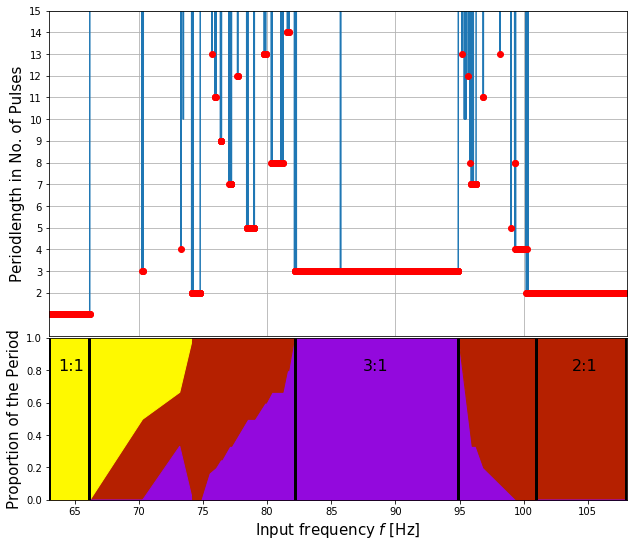

In [17]:



plot = False
periodpic = True
#farea = np.round(np.arange(63, 108+.1, .1), 1)63.7, 
farea = np.round(np.arange(63.0, 108+.05, .01), 2)
#farea = np.round(np.arange(73.30, 108+.05, .05), 2)
#frequence: 73.35, period: 13.63, whole period: 8.0
#farea = np.round(np.arange(63.7, 63.8, .05), 2)
dt = .01
pf = []

#print(farea)
#farea = (76.0, 98.1)
#farea = np.arange(98, 98.2, .1)
#farea = np.arange(77.7, 83, .1)
#farea = (77.1, 77.2)
#farea = (68, 69, 76, 82, 98, 99)
#farea = [68, 80]

if plot:
    fig = plt.figure(figsize=(30,len(farea)*8))



for f in farea:
    
    t, x, i = spikeresponse_rec15_hist(kepler, 5.0, 8.0, f)
    
    #set x just to x beginning with 100 ms
    x = x[int(1300/dt):]
    
    xold = x

    #normalization
    x = x - np.mean(x)
    x = x / np.std(x)
    
    #ac = np.correlate(x[int(100/.01):int(int(100+50*1000.0/93)/.01)], x[int(100/.01):int(int(100+50*1000.0/93)/.01)], 'full')
    #correlate input 20-60 with whole x
    #ac2 = np.correlate(x[int(20*1000.0/f/.01):int(int(40*1000.0/f)/.01)], x, 'same')
    ac2 = np.correlate(x, x[int(0*1000.0/f/dt):int(int(20*1000.0/f)/dt)],'valid') / len(x[int(0*1000.0/f/dt):int(int(20*1000.0/f)/dt)])
    #ac2 = (ac2 - np.mean(ac2)) / np.std(ac2) activate!!!
    #ac2 = np.correlate(x, x, 'same')

    
    #pick a relevant interval
    #ac2int = ac2[int(200/.01):int(int(200+50*1000.0/95)/.01)]
    #ac2int = ac2[int(30*1000.0/f/.01):int(int(60*1000.0/f)/.01)] #what is the right interval?
    
    #alternative:
    #ac2int = ac2[ac2>=0.23]
    ac2int = ac2
    t = t[int(1300/dt):]
    tint = t[:-int(int(20*1000.0/f)/dt)+1]
    #tint = tint[ac2>=0.23]
    
    #plt.plot(tint, ac2int)
    
    #ac2int = ac2[int(200/.01):int(600/.01)]
    
    


    #plot autocorrelation
    #plt.plot(t, ac2)
    #plt.axis((0*1000.0/f-100, 50*1000.0/f, 2.5, np.max(ac2)+.1))
    
    
    #detect peaks in ac
    #ac2_maxima, noneed = detect_peaks(ac2int, 1.05)
    ac2_maxima, noneed = detect_peaks(ac2, (np.max(ac2)-np.min(ac2))*.95)
    #ac2_maxima_times, noneed2 = detect_peaks(ac2int, 1.05, time = tint)
    ac2_maxima_times, noneed2 = detect_peaks(ac2, (np.max(ac2)-np.min(ac2))*.95, time = tint)
    
  #  print(tint[0])
  #  print(ac2_maxima_times)
    
    #print(ac2_maxima)
    
    ac2_maxima_times = np.append(tint[0], ac2_maxima_times)
    ac2_maxima = np.append(0, ac2_maxima).tolist()
    ac2_maxima[0] = int(0)
    
   # print(ac2_maxima_times)
    #print(type(ac2_maxima))
    #print(ac2_maxima)
    
    #ac2_maxima_indices = ac2
    if len(ac2_maxima) != 0:
        ac2_maxima_values = ac2[ac2_maxima]
        
    

    #ac2_maxima_times_diff = ac2_maxima_times - (ac2_maxima_times[0] - t[int(0*1000.0/f/.01)+int(300/.01)])
    #ac2_maxima_times_diff = ac2_maxima_times - 100
    #print(ac2_maxima_times)
    #print(ac2_maxima_times_diff)
    #print(ac2_maxima)
    #print(tint[-1])
    if plot:

    #plot autocorrelation in the specific interval
        #plt.plot(t[int(100/.01):int(int(100+50*1000.0/93)/.01)], ac)
        #fig = plt.figure(figsize=(20,16))
        #fig.add_subplot(len(farea)+1, 2, 1+2*(f-farea[0]))
        fig.add_subplot(len(farea)+1, 2, 1+2*np.where(np.asarray(farea) == f)[0][0])
        if f==farea[0]:
            plt.title('Autocorrelation')
        #plt.plot(t[int(200/.01):], ac2)
        plt.plot(tint, ac2int, label = f)
        if len(ac2_maxima) != 0:
            plt.plot(ac2_maxima_times, ac2_maxima_values, 'o')
        #plt.plot(t[:-int(300/.01)], ac2int)
        #plt.plot(t[int(30*1000.0/f/.01):int(int(60*1000.0/f)/.01)], ac2int)
        #plt.plot(t[int(200/.01):int(600/.01)], ac2int)
        if f==farea[len(farea)-1]:
            plt.xlabel('time [ms]')
        plt.legend(loc = 'upper right')
    #ac2_maxima_times = ac2_maxima * .01 + 200
    
    #find periods
    ac2_maxima_times_isi = np.diff(ac2_maxima_times)
    #ac2_maxima_times_isi = np.concatenate(([0], ac2_maxima_times_isi))#notneeded?
    print(ac2_maxima_times_isi)


    #print(ac2_maxima_times)
    
    #print(tint[0])

    periodic = True
    #print(len(tint)*.01 / 2)
    #if ac2_maxima_times_isi[0]
   # if np.sum(ac2_maxima_times_isi) < (len(tint)*.01 / 2):
   #     periodic = False
    
        
    if len(ac2_maxima_times_isi) < 1:
        periodic = False


    
    
    if len(ac2_maxima_times_isi) != 0:
 #       print((len(tint)*.01) // ac2_maxima_times_isi[0])
        print(len(ac2_maxima_times_isi))
        print(((len(tint)*dt) // ac2_maxima_times_isi[0]) -1)
        #if len(ac2_maxima_times_isi) != (((len(tint)*dt) // ac2_maxima_times_isi[0])):
        if ((((len(tint)*dt) // ac2_maxima_times_isi[0]) -1) - len(ac2_maxima_times_isi)) >= 1:
            
            periodic = False
    
    for i in range(0, len(ac2_maxima_times_isi)-1, 1):
            if np.round(ac2_maxima_times_isi[i], -1) != np.round(ac2_maxima_times_isi[i+1], -1):
                periodic = False

    #if len(ac2_maxima_times_isi) == 1:   #should be ISI??
    #    if ac2_maxima_times[0] < len(tint)*dt/2:
    #        period = False
    #    print(ac2_maxima_times)
        
    #if len(ac2_maxima_times) == 1:   #should be ISI??
    #    if ac2_maxima_times[0] < (1000.0-(20*1000.0/f))/2:
    #        period = False
    #    print(ac2_maxima_times)

    if periodic:
        
        ac2_maxima_values = ac2int[ac2_maxima]
        if len(ac2_maxima_times) == 1:
            period = round(((ac2_maxima_times[0] - t[0]) / (1000.0/f)), 1)
        else:
            period = round((ac2_maxima_times_isi[0] / (1000.0/f)), 1)
        
        #if f == 80:
        #    period = round(((ac2_maxima_times[1] - t[0])/ (1000.0/f)), 1)
        #    print((ac2_maxima_times[1] - t[0]))
            
       # if f in (68, 69, 76, 82, 98, 99):
            #period = 0
       #     period = 30
        
        
        #print(f)
        #print((1000.0/f))
        #print(period)
        print('frequence: {}, period: {:.2f}, whole period: {}'.format(f, 1000.0/f, period))
       # print(ac2_maxima_times_isi)
        pf.append(period)
        
        if plot:
            plt.plot(ac2_maxima_times, ac2_maxima_values, 'o')
            #plt.figure(figsize=(10,8))

            fig.add_subplot(len(farea)+1, 2, 2+2*np.where(np.asarray(farea) == f)[0][0])
            if f==farea[0]:
                plt.title('Voltagetrack')
            #plt.plot(t[int(300/.01):], x, label = f)
            plt.plot(t, xold, label = f)
            if f==farea[len(farea)-1]:
                plt.xlabel('time [ms]')
            plt.ylabel('Voltage V(t) [mV]')
            plt.axis((int(0*1000.0/f)+180, 1000, -80, -10))
            #plt.axis((200, 600, -80, -10))
            plt.legend(loc = 'upper right')
            plt.axvline(x=t[int(0*1000.0/farea[len(farea)-1]/dt)], color='blue')
            plt.axvline(x=t[int(20*1000.0/farea[len(farea)-1]/dt)], color='blue')

            for periods in range(0,len(ac2_maxima_times), 1):
            #plt.axvline(x=periods*ac2_maxima_times_isi[periods]+int(30*1000.0/f))
                #plt.axvline(x=ac2_maxima_times_diff[periods], color = 'red') activate
                plt.axvline(x=ac2_maxima_times[periods], color = 'red')
    else:
        print('frequence {}, no period found'.format(f))
        #plt.figure(figsize=(10,8))
        
        period = 30
        pf.append(period)
        if plot:
            fig.add_subplot(len(farea)+1, 2, 2+2*np.where(np.asarray(farea) == f)[0][0])
            if f==farea[0]:
                plt.title('Voltagetrack')
            #plt.plot(t[int(300/.01):], x, label = f)
            plt.plot(t, xold, label = f)
            if f==farea[len(farea)-1]:
                plt.xlabel('time [ms]')
            plt.ylabel('Voltage V(t) [mV]')
            plt.axis((int(0*1000.0/f)+180, 1000, -80, -10))
            plt.axvline(x=t[int(0*1000.0/farea[len(farea)-1]/dt)], color='blue')
            plt.axvline(x=t[int(20*1000.0/farea[len(farea)-1]/dt)], color='blue')
            #plt.axis((200, 600, -80, -10))
            plt.legend(loc = 'upper right')
#plt.figure(figsize=(10,8))
#plt.plot(t[int(200/.01):], x)
#plt.plot(t[int(300/.01)+int(0*1000.0/f/.01):int(300/.01)+int(int(20*1000.0/f)/.01)], x[int(0*1000.0/f/.01):int(int(20*1000.0/f)/.01)])
#plt.axvline(x=x[int(20*1000.0/farea[len(farea)-1]/.01)], color= 'red')
#plt.axvline(x=x[int(40*1000.0/farea[len(farea)-1]/.01)], color='red')
#plt.savefig('spikes{}{}.png'.format(farea[0], farea[-1]))
print(pf)

if periodpic: 
    fig=plt.figure(figsize=(16,9))
    
    #fig.add_subplot(2,1,1)
    ax0 = plt.subplot2grid((3, 3), (0, 0), colspan = 2, rowspan = 2)
    #plt.plot(farea, pf);
    ax0.plot(farea, pf)
   # plt.xlabel('Input frequency [Hz]', fontsize = 15);
    plt.ylabel('Periodlength in No. of Pulses', fontsize = 15);
    plt.grid()
    plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    labelbottom=False)

    #texts
  #  plt.text(66.20, 1.0, r'$(2)_0 (3)_0$', color = 'red', fontsize = 13)
  #  plt.text(66.20, 2.0, r'$(2)_0 (3)_0$', color = 'red', fontsize = 13)
  #  plt.text(66.20, 3.0, r'$(2)_0 (3)_1$', color = 'red', fontsize = 13)
  #  plt.text(66.20, 4.0, r'$(2)_2 (3)_0$', color = 'red', fontsize = 13)
   # plt.text(66.20, 5.0, r'$(2)_1 (3)_1$', color = 'red', fontsize = 13)
   # plt.text(66.20, 6.0, r'$(2)_0 (3)_2$', color = 'red', fontsize = 13)
    #plt.text(66.20, 7.0, r'$(2)_2 (3)_1$', color = 'red', fontsize = 13)
    #plt.text(66.20, 8.0, r'$(2)_1 (3)_2$', color = 'red', fontsize = 13)
    #plt.text(66.20, 9.0, r'$(2)_3 (3)_1$', color = 'red', fontsize = 13)
    #plt.text(66.20, 11.0, r'$(2)_4 (3)_1$', color = 'red', fontsize = 13)
    #plt.text(66.20, 12.0, r'$(2)_3 (3)_2$', color = 'red', fontsize = 13)
    #plt.text(66.20, 13.0, r'$(2)_2 (3)_3$', color = 'red', fontsize = 13)
    #plt.text(66.20, 14.0, r'$(2)_1 (3)_4$', color = 'red', fontsize = 13)

    #lines and dots
    possibleperiods = np.arange(1.0, 15.0, 1.0)
    possibleperiods = np.delete(possibleperiods, 9)
    for b in possibleperiods:
        #plt.hlines(y=b, xmin=63.0, xmax = 66.25, color = 'red')
        #print(b)
        for a in np.where(pf==b)[0]:
            np.where(pf==b)[0]
            #print(a)
            plt.plot(farea[a], b, 'o', color = 'red')

    plt.yticks(np.arange(2, 16, 1))
    plt.axis((np.min(farea), np.max(farea), 0, 15))
    #plt.axis((60, 110, 0, 15))
   # plt.grid()
    plt.subplots_adjust(hspace = .01)
    ax1 = plt.subplot2grid((3, 3), (2, 0), colspan = 2)
    
    cmap = plt.get_cmap('gnuplot')
    ##taken from here to the end
    frange = np.arange(63, 110+.05, .05)
    ones = np.zeros(len(frange))
    twos = np.zeros(len(frange))
    threes = np.zeros(len(frange))
    f1 = np.where(frange > 66.15)[0][0]
    fcrits = (66.15, 70.25, 73.15, 74.15, 74.3, 74.5, 74.6, 74.7,
              74.8, 75.45, 75.95, 76.35, 76.45, 77.05, 77.15, 77.2,
              77.7, 78.45, 79.0, 79.8, 79.9, 80.35, 81.2, 81.55,
              81.65, 82.1, 82.2, 94.9, 95.95, 96.25, 96.85, 99.4, 100.95, 101.0)
    #ones1[:np.where(frange == 66.15)]
    #plt.plot()
    fi = np.zeros(len(fcrits))
    print(fi)
    for counter, walk in enumerate(fcrits, 0):
        fi[counter] = np.where(frange > walk)[0][0]
    fi -= 1
    fi = fi.astype(int)

    print(type(fi))
    #print(fcindices)

    ones[0] = 1
    ones[fi[0]] = 1
    twos[0] = .001
    twos[fi[0]] = .001
    threes[0] = .001
    threes[fi[0]] = .001

    ones[fi[1]] = 1
    twos[fi[1]] = 1/2
    threes[fi[1]] = .001
    
    #???
    ones[fi[2]] = 1
    twos[fi[2]] = 2/3
    threes[fi[2]] = 1/3
    #ones[fi[2]] = 1
    #twos[fi[2]] = 2/3
    #threes[fi[2]] = 1/3

    twos[fi[3]] = 1
    twos[fi[4]+1] = 1
    threes[fi[3]] = .001
    threes[fi[4]+1] = .001
    ones[fi[3]] = .001
    ones[fi[4]+1] = .001


    twos[fi[5]] = 1
    ones[fi[5]] = .001
    threes[fi[5]] = .001


    twos[fi[6]] = 1
    threes[fi[6]] = .001
    ones[fi[6]] = .001
    twos[fi[7]+1] = 1
    ones[fi[7]+1] = .001
    threes[fi[7]+1] = .001


    twos[fi[8]] = 1
    ones[fi[8]] = .001
    threes[fi[8]] = .001



    twos[fi[9]] = 1
    threes[fi[9]] = 1/6
    ones[fi[9]] = .001

    twos[fi[10]] = 1
    threes[fi[10]] = 1/5
    ones[fi[10]] = .001

    twos[fi[11]] = 1
    threes[fi[11]] = 1/4
    ones[fi[11]] = .001
    twos[fi[12]+1] = 1
    threes[fi[12]+1] = 1/4
    ones[fi[12]+1] = .001

    twos[fi[13]] = 1
    threes[fi[13]] = 1/3
    ones[fi[13]] = .001

    twos[fi[14]] = 1
    ones[fi[14]] = .001
    threes[fi[14]] = 1/3
    twos[fi[15]+1] = 1
    threes[fi[15]+1] = 1/3
    ones[fi[15]+1] = .001

    twos[fi[16]] = 1
    threes[fi[16]] = 2/5
    ones[fi[16]] = .001

    twos[fi[17]] = 1
    ones[fi[17]] = .001
    threes[fi[17]] = 1/2
    twos[fi[18]+1] = 1
    threes[fi[18]+1] = 1/2
    ones[fi[18]+1] = .001

    ones[fi[19]] = .001
    twos[fi[19]] = 1
    threes[fi[19]] = 3/5
    ones[fi[20]+1] = .001
    twos[fi[20]+1] = 1
    threes[fi[20]+1] = 3/5

    twos[fi[21]] = 1
    threes[fi[21]] = 2/3
    ones[fi[21]] = .001
    twos[fi[22]+1] = 1
    threes[fi[22]+1] = 2/3
    ones[fi[22]+1] = .001

    twos[fi[23]] = 1
    ones[fi[23]] = .001
    threes[fi[23]] = 4/5
    twos[fi[24]+1] = 1
    threes[fi[24]+1] = 4/5
    ones[fi[24]+1] = .001

    ones[fi[25]] = .001
    twos[fi[25]] = .001
    threes[fi[25]] = 1


    twos[fi[26]] = .001
    ones[fi[26]] = .001
    twos[fi[27]] = .001 #3:1 LOCKING
    ones[fi[27]] = .001 #3:1 LOCKING

    threes[fi[26]] = 1
    threes[fi[27]] = 1 #3:1 LOCKING
    #LOL

    ones[fi[27]+1] = .001
    threes[fi[27]+1] = 1/3
    twos[fi[27]+1] = 1
    ones[fi[28]+1] = .001
    threes[fi[28]+1] = 1/3
    twos[fi[28]+1] = 1

    ones[fi[29]] = .001
    threes[fi[29]] = 1/5
    twos[fi[29]] = 1


    ones[fi[30]] = .001
    twos[fi[30]] = 1
    threes[fi[30]] = .001
    twos[fi[31]+1] = 1
    ones[fi[31]+1] = .001
    threes[fi[31]+1] = .001

    #print(frange[fi[32]])

    twos
    twos[fi[32]] = 1
    ones[fi[32]] = .001
    threes[fi[32]] = .001
    twos[-1] = 1
    ones[-1] = .001
    threes[-1] = .001


    #print(twos[-1])


    #print(len(fi))



    #print(ones)
    #print(twos)


    frangenew = frange[fi]
    print(type(frangenew))
    frangenew = np.concatenate((np.array([63.0]), frangenew))
    frangenew = np.concatenate((frangenew, np.array([108.0])))
    threesnew = threes[threes>0.0]
    twosnew = twos[twos>0.0]
    onesnew = ones[ones>0.0]
    print(threesnew)

    print(frangenew)


    print(len(frangenew))
    print(len(onesnew))
    print(len(twosnew))
    print(len(threesnew))
    #plt.scatter(frangenew, onesnew, color = 'mediumspringgreen')
    #plt.scatter(frange, twos, color = 'red')
    #plt.scatter(frange, threes, color = 'mediumblue')

    #plt.axis((min(frange), max(frange),0,1.2))
    #plt.plot(frangenew, onesnew, color = 'green')
    #plt.plot(frangenew, twosnew, color = 'red')
    #plt.plot(frangenew, threesnew, color = 'blue')



    #plt.fill_between(frangenew, 0, onesnew, color = 'green')
    #plt.fill_between(frangenew[0:27], 0, twosnew[0:27], color = 'red')

    plt.fill_between(frangenew, 0, twosnew, color = cmap(1/2))
    plt.fill_between(frangenew, 0, threesnew, color = cmap(1/3))
    #plt.fill_between(frangenew[27:-1], 0, twosnew[27:-1], color = 'red')
    print(frange[fi[3]])
    plt.fill_between(frangenew[0:5], twosnew[0:5], 1, color = cmap(.99))
    plt.fill_between(frangenew[4:27], threesnew[4:27], 1, color = cmap(1/2))
    plt.fill_between(frangenew[28:-1], threesnew[28:-1], 1, color = cmap(1/2))

    #plt.text(64.575, .9, r'$(1)$', color = 'black', fontsize = 13)
    #plt.text(87.25, .9, r'$(2)$', color = 'black', fontsize = 13)
    #plt.text(101.5, .9, r'$(3)$', color = 'black', fontsize = 13)

    plt.text(63.75, .8, r'1:1', fontsize = 16) #standard is 10
    plt.text(87.45, .8, r'3:1', fontsize = 16)
    plt.text(103.75, .8, r'2:1', fontsize = 16)

    plt.xlabel(r'Input frequency $f$ [Hz]', fontsize = 15);
    plt.xticks(np.arange(60, 115+2.5, 5.0))
    plt.ylabel('Proportion of the Period', fontsize = 15);

    plt.vlines(x=63.0, ymin =0, ymax = 1, color = 'black', linewidth = 3)
    plt.vlines(x=66.15, ymin =0, ymax = 1, color = 'black', linewidth = 3)
    plt.vlines(x=82.2, ymin =0, ymax = 1, color = 'black', linewidth = 3)
    plt.vlines(x=94.9, ymin =0, ymax = 1, color = 'black', linewidth = 3)
    plt.vlines(x=101.0, ymin =0, ymax = 1, color = 'black', linewidth = 3)
    plt.vlines(x=108.0, ymin =0, ymax = 1, color = 'black', linewidth = 3)
    
    plt.axis((np.min(farea), np.max(farea), 0.0, 1.0))



    
    plt.savefig('Rec_periods_proportion_newtime')
#plt.savefig('Rec_periods_outlier2')


[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 30, 64.0, 30, 38.0, 30, 30, 30, 63.0, 30, 30, 49.0, 26.0, 30.0, 30, 30, 30, 30, 30, 30, 36.0, 59.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 62.0, 30, 30, 30, 30, 30, 48.0, 30, 30, 30, 30, 30, 30, 34.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 41.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 34.0, 30, 30, 30, 30, 65.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 3.0, 30, 30, 3.0, 30, 30, 30, 30, 3.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 33.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 42.0, 30, 30, 30, 51.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 54.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 39.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 26.0, 30, 40.0, 30, 30.0, 70.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 57.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 4.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 10.0, 30, 35.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 52.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 39.0, 30.0, 30, 30, 44.0, 30, 30, 30, 30, 36.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 2.0, 30, 30, 2.0, 2.0, 47.0, 2.0, 2.0, 2.0, 67.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 41.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 71.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 32.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 68.0, 54.0, 30, 51.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 13.0, 30, 30, 53.0, 30, 30, 30, 30, 42.0, 30, 40.0, 30, 30, 30, 30, 30, 30, 30, 30, 62.0, 57.0, 30, 30, 30, 30, 11.0, 11.0, 30, 11.0, 30, 11.0, 30, 30, 30, 30, 43.0, 31.0, 30, 30, 30, 30, 30, 34.0, 30, 30, 61.0, 30, 30, 30, 30, 30, 53.0, 30, 30, 30, 30, 30, 30, 30, 30, 44.0, 30, 30, 30, 30, 30, 30, 30, 9.0, 30, 30, 9.0, 9.0, 9.0, 9.0, 9.0, 30, 30, 46.0, 30, 30, 53.0, 30, 30, 46.0, 30, 30, 51.0, 30, 65.0, 23.0, 30, 30, 73.0, 30, 30, 62.0, 30, 30, 30, 65.0, 30, 55.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 49.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 38.0, 30, 74.0, 30, 30, 30, 30, 30, 7.0, 30, 30, 7.0, 7.0, 7.0, 30, 7.0, 7.0, 30, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 30, 30, 54.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 39.0, 30, 30, 30, 30, 30, 29.0, 64.0, 46.0, 19.0, 19.0, 30, 30, 30, 63.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 46.0, 30, 30, 29.0, 30, 30, 30, 30, 12.0, 12.0, 12.0, 12.0, 30, 30, 30, 30, 30, 30, 30, 71.0, 30, 32.0, 30, 30, 27.0, 64.0, 30, 30, 30, 30, 30, 42.0, 30, 30, 59.0, 30, 30, 60.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 38.0, 30, 50.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 33.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 5.0, 5.0, 30, 5.0, 30, 30, 5.0, 30, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 30, 5.0, 30, 30, 30, 30, 30, 58.0, 30, 30, 30, 43.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 33.0, 30, 30, 30, 30, 61.0, 31.0, 30, 30, 30, 30, 30, 30, 30, 30, 23.0, 30, 23.0, 23.0, 18.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 18.0, 18.0, 30, 18.0, 30, 30, 18.0, 30, 30, 30, 30, 30, 63.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 30, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 30, 30, 30, 30, 30, 21.0, 30, 37.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 63.0, 30, 21.0, 30, 30, 30, 21.0, 21.0, 21.0, 30, 30, 32.0, 30, 30, 30, 30, 30, 30, 30, 42.0, 30, 30, 30, 30, 30, 30, 8.0, 30, 8.0, 30, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 30, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 30, 8.0, 30, 8.0, 16.0, 30, 30, 30, 40.0, 30, 30, 30, 30, 30, 16.0, 30, 30, 30, 30, 30, 30, 16.0, 30, 30, 30, 30, 30, 30, 76.0, 30, 36.0, 51.0, 30, 30, 30, 44.0, 30, 30, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 30, 30, 30, 30, 30, 78.0, 14.0, 30, 14.0, 30, 30, 30, 30, 30, 58.0, 30, 30, 30, 66.0, 67.0, 30, 30, 39.0, 54.0, 30, 30, 30, 30, 57.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 3.0, 30, 30, 3.0, 3.0, 30, 3.0, 30, 3.0, 3.0, 3.0, 3.0, 3.0, 30, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 30, 30, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 30, 30, 30, 30, 30, 30, 30, 53.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 26.0, 13.0, 30, 30, 63.0, 30, 30, 30, 30, 30, 38.0, 84.0, 30, 83.0, 30, 30, 30, 30, 10.0, 30, 30, 10.0, 10.0, 30, 10.0, 10.0, 10.0, 30, 10.0, 10.0, 10.0, 30, 30, 79.0, 30, 30, 30, 30, 45.0, 30, 30, 30, 64.0, 30, 101.0, 30, 30, 55.0, 30, 12.0, 30, 39.0, 30, 30, 30, 90.0, 30, 30, 82.0, 30, 30, 70.0, 30, 8.0, 30, 30, 30, 30, 30, 30, 30, 7.0, 7.0, 7.0, 7.0, 30, 30, 30, 30, 7.0, 30, 30, 30, 30, 7.0, 7.0, 7.0, 30, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 90.0, 30, 75.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 71.0, 30, 30, 81.0, 30, 30, 30, 30, 72.0, 30, 30, 76.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 94.0, 30, 30, 30, 30, 11.0, 11.0, 30, 30, 30, 30, 30, 30, 30, 30, 40.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 49.0, 37.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 86.0, 30, 30, 30, 30, 65.0, 30, 30, 30, 30, 30, 98.0, 37.0, 30, 30, 44.0, 30, 30, 30, 30, 30, 30, 30, 30, 85.0, 30, 30, 30, 30, 105.0, 87.0, 30, 30, 53.0, 30, 30, 30, 67.0, 30, 30, 101.0, 30, 30, 30, 30, 48.0, 30, 30, 30, 30, 30, 62.0, 30, 30, 30, 30, 30, 30, 50.0, 30, 30, 30, 30, 30, 53.0, 30, 30, 30, 30, 75.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 54.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 71.0, 30, 30, 30, 13.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 71.0, 30, 30, 30, 95.0, 30, 30, 30, 30, 30, 46.0, 30, 30, 30, 30, 30, 62.0, 30, 30, 30, 92.0, 30, 30, 75.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 77.0, 46.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 62.0, 30, 30, 30, 30, 30, 50.0, 30, 30, 30, 30, 30, 30, 30, 30, 30, 5.0, 30, 83.0, 30, 30, 30, 69.0, 30, 30, 30, 30, 30, 30, 30, 30, 40.0, 30, 30, 30, 30, 30, 30, 54.0, 30, 30, 30, 30, 96.0, 30, 8.0, 8.0, 30, 30, 30, 4.0, 30, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 30, 2.0, 30, 2.0, 4.0, 30, 2.0, 30, 30, 2.0, 2.0, 30, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
[ 0.001       0.001       0.001       0.33333333  0.3         0.001       0.001
  0.16666667  0.2         0.25        0.25        0.33333333  0.33333333
  0.4         0.5         0.5         0.6         0.6         0.66666667
  0.66666667  0.8         0.8         1.          1.          0.6         0.5
  0.5         0.4         0.66666667  0.33333333  0.33333333  0.2
  0.16666667  0.5         0.001       0.001     ]
[  62.75   66.15   70.25   73.25   73.45   74.1    74.75   75.65   75.95
   76.35   76.45   77.     77.2    77.7    78.4    79.     79.75   79.9
   80.3    81.2    81.6    81.7    82.1    94.9    95.2    95.35   95.5
   95.65   95.8    95.9    96.25   96.85   98.15   99.     99.3   107.75]
36
36
36
36
73.45


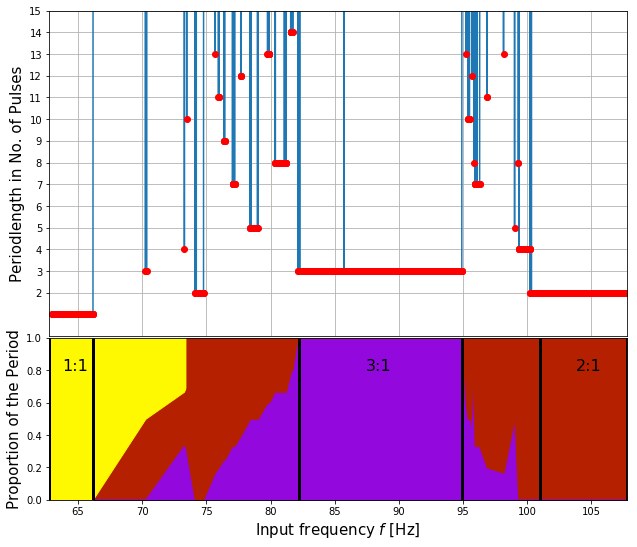

In [25]:
 fig=plt.figure(figsize=(16,9))
    
    #fig.add_subplot(2,1,1)
ax0 = plt.subplot2grid((3, 3), (0, 0), colspan = 2, rowspan = 2)
    #plt.plot(farea, pf);
ax0.plot(farea, pf)
   # plt.xlabel('Input frequency [Hz]', fontsize = 15);
plt.ylabel('Periodlength in No. of Pulses', fontsize = 15);
plt.grid()
plt.tick_params(
axis='x',          # changes apply to the x-axis
which='both',      # both major and minor ticks are affected
 bottom=False,      # ticks along the bottom edge are off
labelbottom=False)


    #lines and dots
possibleperiods = np.arange(1.0, 15.0, 1.0)
for b in possibleperiods:
        #plt.hlines(y=b, xmin=63.0, xmax = 66.25, color = 'red')
        #print(b)
    for a in np.where(pf==b)[0]:
        np.where(pf==b)[0]
            #print(a)
        plt.plot(farea[a], b, 'o', color = 'red')

plt.yticks(np.arange(2, 16, 1))
plt.axis((62.75, 107.75, 0, 15))
    #plt.axis((60, 110, 0, 15))
   # plt.grid()
plt.subplots_adjust(hspace = .01)
ax1 = plt.subplot2grid((3, 3), (2, 0), colspan = 2)
    
cmap = plt.get_cmap('gnuplot')
#TO DO :
#cut out the first 25 freqs and periods
#cut out the last 25 freqs and periods
frange = np.arange(63, 110+.05, .05)
#frange = frange[25:-25]
ones = np.zeros(len(frange))
twos = np.zeros(len(frange))
threes = np.zeros(len(frange))
    
f1 = np.where(frange > 66.15)[0][0]
#fcrits = (66.15, 70.25, 73.15, 74.15, 74.3, 74.5, 74.6, 74.7,
#          74.8, 75.45, 75.95, 76.35, 76.45, 77.05, 77.15, 77.2,
#          77.7, 78.45, 79.0, 79.8, 79.9, 80.35, 81.2, 81.55,
#          81.65, 82.1, 82.2, 94.9, 95.95, 96.25, 96.85, 99.4, 100.95, 101.0)

fcrits = (66.17, 70.26, 73.29, 73.47, 74.12, 74.78, 75.69,
          75.95, 76.37, 76.45, 77.04, 77.22, 77.71, 78.41,
          79.00, 79.76, 79.90, 80.34, 81.22, 81.60, 81.72,
          82.13, 94.90, 95.21, 95.38, 95.50, 95.69, 95.83,
          95.91, 96.29, 96.85, 98.15, 99.01, 99.3)
    #ones1[:np.where(frange == 66.15)]
    #plt.plot()
fi = np.zeros(len(fcrits))
print(fi)
for counter, walk in enumerate(fcrits, 0):
    fi[counter] = np.where(frange > walk)[0][0]
fi -= 1
fi = fi.astype(int)

print(type(fi))
    #print(fcindices)
#BEGIN
ones[0] = 1
ones[fi[0]] = 1
twos[0] = .001
twos[fi[0]] = .001
threes[0] = .001
threes[fi[0]] = .001

ones[fi[1]] = 1
twos[fi[1]] = 1/2
threes[fi[1]] = .001
    
    #???
ones[fi[2]] = 1
twos[fi[2]] = 2/3
threes[fi[2]] = 1/3
    #ones[fi[2]] = 1
    #twos[fi[2]] = 2/3
    #threes[fi[2]] = 1/3

twos[fi[3]] = 7/10
threes[fi[3]] = 3/10
ones[fi[3]] = 1
    
twos[fi[4]] = 1
threes[fi[4]] = .001
ones[fi[4]] = .001


twos[fi[5]] = 1
ones[fi[5]] = .001
threes[fi[5]] = .001


twos[fi[6]] = 1
threes[fi[6]] = 1/6
ones[fi[6]] = .001
    
twos[fi[7]] = 1
threes[fi[7]] = 1/5
ones[fi[7]] = .001



twos[fi[8]] = 1
threes[fi[8]] = 1/4
ones[fi[8]] = .001



twos[fi[9]] = 1
threes[fi[9]] = 1/4
ones[fi[9]] = .001

twos[fi[10]] = 1
threes[fi[10]] = 1/3
ones[fi[10]] = .001

twos[fi[11]] = 1
threes[fi[11]] = 1/3
ones[fi[11]] = .001
    
    
twos[fi[12]] = 1
threes[fi[12]] = 2/5
ones[fi[12]] = .001

twos[fi[13]] = 1
threes[fi[13]] = .5
ones[fi[13]] = .001

twos[fi[14]] = 1
threes[fi[14]] = .5
ones[fi[14]] = .001

twos[fi[15]] = 1
threes[fi[15]] = 3/5
ones[fi[15]] = .001

twos[fi[16]] = 1
threes[fi[16]] = 3/5
ones[fi[16]] = .001

twos[fi[17]] = 1
threes[fi[17]] = 2/3
ones[fi[17]] = .001
    
twos[fi[18]] = 1
threes[fi[18]] = 2/3
ones[fi[18]] = .001

ones[fi[19]] = .001
twos[fi[19]] = 1
threes[fi[19]] = 4/5
    
ones[fi[20]] = .001
twos[fi[20]] = 1
threes[fi[20]] = 4/5

twos[fi[21]] = .001
threes[fi[21]] = 1
ones[fi[21]] = .001
    
twos[fi[22]] = .001
threes[fi[22]] = 1
ones[fi[22]] = .001

twos[fi[23]] = 1
ones[fi[23]] = .001
threes[fi[23]] = 3/5
    
twos[fi[24]] = 1
threes[fi[24]] = 1/2
ones[fi[24]] = .001

twos[fi[25]] = 1
threes[fi[25]] = 1/2
ones[fi[25]] = .001

twos[fi[26]] = 1
threes[fi[26]] = 2/5
ones[fi[26]] = .001
    
    
twos[fi[27]] = 1 
ones[fi[27]] = .001
threes[fi[27]] = 2/3
    #LOL
ones[fi[28]] = .001
threes[fi[28]] = 1/3
twos[fi[28]] = 1
    
ones[fi[29]] = .001
threes[fi[29]] = 1/3
twos[fi[29]] = 1

ones[fi[30]] = .001
threes[fi[30]] = 1/5
twos[fi[30]] = 1


twos[fi[31]] = 1
ones[fi[31]] = .001
threes[fi[31]] = 1/6

    #print(frange[fi[32]])
twos[fi[32]] = 1
ones[fi[32]] = .001
threes[fi[32]] = 1/2
    
twos[fi[33]] = 1
ones[fi[33]] = .001
threes[fi[33]] = .001
    
twos[-1] = 1
ones[-1] = .001
threes[-1] = .001


    #print(twos[-1])


    #print(len(fi))



    #print(ones)
    #print(twos)


frangenew = frange[fi]
print(type(frangenew))
frangenew = np.concatenate((np.array([62.75]), frangenew))
frangenew = np.concatenate((frangenew, np.array([107.75])))
threesnew = threes[threes>0.0]
twosnew = twos[twos>0.0]
onesnew = ones[ones>0.0]
print(threesnew)

print(frangenew)


print(len(frangenew))
print(len(onesnew))
print(len(twosnew))
print(len(threesnew))
    #plt.scatter(frangenew, onesnew, color = 'mediumspringgreen')
    #plt.scatter(frange, twos, color = 'red')
    #plt.scatter(frange, threes, color = 'mediumblue')

    #plt.axis((min(frange), max(frange),0,1.2))
    #plt.plot(frangenew, onesnew, color = 'green')
    #plt.plot(frangenew, twosnew, color = 'red')
    #plt.plot(frangenew, threesnew, color = 'blue')



    #plt.fill_between(frangenew, 0, onesnew, color = 'green')
    #plt.fill_between(frangenew[0:27], 0, twosnew[0:27], color = 'red')

plt.fill_between(frangenew, 0, twosnew, color = cmap(1/2))
plt.fill_between(frangenew, 0, threesnew, color = cmap(1/3))
    #plt.fill_between(frangenew[27:-1], 0, twosnew[27:-1], color = 'red')
print(frange[fi[3]])
plt.fill_between(frangenew[0:5], twosnew[0:5], 1, color = cmap(.99))
plt.fill_between(frangenew[4:27], threesnew[4:27], 1, color = cmap(1/2))
plt.fill_between(frangenew[28:-1], threesnew[28:-1], 1, color = cmap(1/2))

    #plt.text(64.575, .9, r'$(1)$', color = 'black', fontsize = 13)
    #plt.text(87.25, .9, r'$(2)$', color = 'black', fontsize = 13)
    #plt.text(101.5, .9, r'$(3)$', color = 'black', fontsize = 13)

plt.text(63.75, .8, r'1:1', fontsize = 16) #standard is 10
plt.text(87.45, .8, r'3:1', fontsize = 16)
plt.text(103.75, .8, r'2:1', fontsize = 16)

plt.xlabel(r'Input frequency $f$ [Hz]', fontsize = 15);
plt.xticks(np.arange(60, 115+2.5, 5.0))
plt.ylabel('Proportion of the Period', fontsize = 15);

plt.vlines(x=62.75, ymin =0, ymax = 1, color = 'black', linewidth = 3)
plt.vlines(x=66.15, ymin =0, ymax = 1, color = 'black', linewidth = 3)
plt.vlines(x=82.2, ymin =0, ymax = 1, color = 'black', linewidth = 3)
plt.vlines(x=94.9, ymin =0, ymax = 1, color = 'black', linewidth = 3)
plt.vlines(x=101.0, ymin =0, ymax = 1, color = 'black', linewidth = 3)
plt.vlines(x=107.75, ymin =0, ymax = 1, color = 'black', linewidth = 3)
    
plt.axis((62.75, 107.75, 0.0, 1.0))



    
plt.savefig('Rec_periods_proportion_newtime2')
#plt.savefig('Rec_periods_outlier2')


In [27]:



plot = False
periodpic = True
#farea = np.round(np.arange(63, 108+.1, .1), 1)63.7, 
farea = np.round(np.arange(62.75, 107.55, .05), 2)
#farea = np.round(np.arange(73.30, 108+.05, .05), 2)
#frequence: 73.35, period: 13.63, whole period: 8.0
#farea = np.round(np.arange(63.7, 63.8, .05), 2)
dt = .01
pf = []

#print(farea)
#farea = (76.0, 98.1)
#farea = np.arange(98, 98.2, .1)
#farea = np.arange(77.7, 83, .1)
#farea = (77.1, 77.2)
#farea = (68, 69, 76, 82, 98, 99)
#farea = [68, 80]

if plot:
    fig = plt.figure(figsize=(30,len(farea)*8))



for f in farea:
    
    t, x, i = spikeresponse_rec15_hist(kepler, 5.0, 8.0, f)
    
    #set x just to x beginning with 100 ms
    x = x[int(1200/dt):]
    
    xold = x

    #normalization
    x = x - np.mean(x)
    x = x / np.std(x)
    
    #ac = np.correlate(x[int(100/.01):int(int(100+50*1000.0/93)/.01)], x[int(100/.01):int(int(100+50*1000.0/93)/.01)], 'full')
    #correlate input 20-60 with whole x
    #ac2 = np.correlate(x[int(20*1000.0/f/.01):int(int(40*1000.0/f)/.01)], x, 'same')
    ac2 = np.correlate(x, x[int(0*1000.0/f/dt):int(int(20*1000.0/f)/dt)],'valid') / len(x[int(0*1000.0/f/dt):int(int(20*1000.0/f)/dt)])
    #ac2 = (ac2 - np.mean(ac2)) / np.std(ac2) activate!!!
    #ac2 = np.correlate(x, x, 'same')

    
    #pick a relevant interval
    #ac2int = ac2[int(200/.01):int(int(200+50*1000.0/95)/.01)]
    #ac2int = ac2[int(30*1000.0/f/.01):int(int(60*1000.0/f)/.01)] #what is the right interval?
    
    #alternative:
    #ac2int = ac2[ac2>=0.23]
    ac2int = ac2
    t = t[int(1200/dt):]
    tint = t[:-int(int(20*1000.0/f)/dt)+1]
    #tint = tint[ac2>=0.23]
    
    #plt.plot(tint, ac2int)
    
    #ac2int = ac2[int(200/.01):int(600/.01)]
    
    


    #plot autocorrelation
    #plt.plot(t, ac2)
    #plt.axis((0*1000.0/f-100, 50*1000.0/f, 2.5, np.max(ac2)+.1))
    
    
    #detect peaks in ac
    #ac2_maxima, noneed = detect_peaks(ac2int, 1.05)
    ac2_maxima, noneed = detect_peaks(ac2, (np.max(ac2)-np.min(ac2))*.96)
    #ac2_maxima_times, noneed2 = detect_peaks(ac2int, 1.05, time = tint)
    ac2_maxima_times, noneed2 = detect_peaks(ac2, (np.max(ac2)-np.min(ac2))*.96, time = tint)
    
  #  print(tint[0])
  #  print(ac2_maxima_times)
    
    #print(ac2_maxima)
    
    ac2_maxima_times = np.append(tint[0], ac2_maxima_times)
    ac2_maxima = np.append(0, ac2_maxima).tolist()
    ac2_maxima[0] = int(0)
    
   # print(ac2_maxima_times)
    #print(type(ac2_maxima))
    #print(ac2_maxima)
    
    #ac2_maxima_indices = ac2
    if len(ac2_maxima) != 0:
        ac2_maxima_values = ac2[ac2_maxima]
        
    

    #ac2_maxima_times_diff = ac2_maxima_times - (ac2_maxima_times[0] - t[int(0*1000.0/f/.01)+int(300/.01)])
    #ac2_maxima_times_diff = ac2_maxima_times - 100
    #print(ac2_maxima_times)
    #print(ac2_maxima_times_diff)
    #print(ac2_maxima)
    #print(tint[-1])
    if plot:

    #plot autocorrelation in the specific interval
        #plt.plot(t[int(100/.01):int(int(100+50*1000.0/93)/.01)], ac)
        #fig = plt.figure(figsize=(20,16))
        #fig.add_subplot(len(farea)+1, 2, 1+2*(f-farea[0]))
        fig.add_subplot(len(farea)+1, 2, 1+2*np.where(np.asarray(farea) == f)[0][0])
        if f==farea[0]:
            plt.title('Autocorrelation')
        #plt.plot(t[int(200/.01):], ac2)
        plt.plot(tint, ac2int, label = f)
        if len(ac2_maxima) != 0:
            plt.plot(ac2_maxima_times, ac2_maxima_values, 'o')
        #plt.plot(t[:-int(300/.01)], ac2int)
        #plt.plot(t[int(30*1000.0/f/.01):int(int(60*1000.0/f)/.01)], ac2int)
        #plt.plot(t[int(200/.01):int(600/.01)], ac2int)
        if f==farea[len(farea)-1]:
            plt.xlabel('time [ms]')
        plt.legend(loc = 'upper right')
    #ac2_maxima_times = ac2_maxima * .01 + 200
    
    #find periods
    ac2_maxima_times_isi = np.diff(ac2_maxima_times)
    #ac2_maxima_times_isi = np.concatenate(([0], ac2_maxima_times_isi))#notneeded?
    print(ac2_maxima_times_isi)


    #print(ac2_maxima_times)
    
    #print(tint[0])

    periodic = True
    #print(len(tint)*.01 / 2)
    #if ac2_maxima_times_isi[0]
   # if np.sum(ac2_maxima_times_isi) < (len(tint)*.01 / 2):
   #     periodic = False
    
        
    if len(ac2_maxima_times_isi) < 1:
        periodic = False


    
    
    if len(ac2_maxima_times_isi) != 0:
 #       print((len(tint)*.01) // ac2_maxima_times_isi[0])
        print(len(ac2_maxima_times_isi))
        print(((len(tint)*dt) // ac2_maxima_times_isi[0]) -1)
        #if len(ac2_maxima_times_isi) != (((len(tint)*dt) // ac2_maxima_times_isi[0])):
        #if ((((len(tint)*dt) // ac2_maxima_times_isi[0]) -1) - len(ac2_maxima_times_isi)) >= 2:
        if ((((len(tint)*dt) // ac2_maxima_times_isi[0]) -1) - len(ac2_maxima_times_isi)) >= 1:    
            periodic = False
    
    for i in range(0, len(ac2_maxima_times_isi)-1, 1):
            if np.round(ac2_maxima_times_isi[i], -1) != np.round(ac2_maxima_times_isi[i+1], -1):
                periodic = False

    #if len(ac2_maxima_times_isi) == 1:   #should be ISI??
    #    if ac2_maxima_times[0] < len(tint)*dt/2:
    #        period = False
    #    print(ac2_maxima_times)
        
    #if len(ac2_maxima_times) == 1:   #should be ISI??
    #    if ac2_maxima_times[0] < (1000.0-(20*1000.0/f))/2:
    #        period = False
    #    print(ac2_maxima_times)

    if periodic:
        
        ac2_maxima_values = ac2int[ac2_maxima]
        if len(ac2_maxima_times) == 1:
            period = round(((ac2_maxima_times[0] - t[0]) / (1000.0/f)), 1)
        else:
            period = round((ac2_maxima_times_isi[0] / (1000.0/f)), 1)
        
        #if f == 80:
        #    period = round(((ac2_maxima_times[1] - t[0])/ (1000.0/f)), 1)
        #    print((ac2_maxima_times[1] - t[0]))
            
       # if f in (68, 69, 76, 82, 98, 99):
            #period = 0
       #     period = 30
        
        
        #print(f)
        #print((1000.0/f))
        #print(period)
        print('frequence: {}, period: {:.2f}, whole period: {}'.format(f, 1000.0/f, period))
       # print(ac2_maxima_times_isi)
        pf.append(period)
        
        if plot:
            plt.plot(ac2_maxima_times, ac2_maxima_values, 'o')
            #plt.figure(figsize=(10,8))

            fig.add_subplot(len(farea)+1, 2, 2+2*np.where(np.asarray(farea) == f)[0][0])
            if f==farea[0]:
                plt.title('Voltagetrack')
            #plt.plot(t[int(300/.01):], x, label = f)
            plt.plot(t, xold, label = f)
            if f==farea[len(farea)-1]:
                plt.xlabel('time [ms]')
            plt.ylabel('Voltage V(t) [mV]')
            plt.axis((int(0*1000.0/f)+180, 1000, -80, -10))
            #plt.axis((200, 600, -80, -10))
            plt.legend(loc = 'upper right')
            plt.axvline(x=t[int(0*1000.0/farea[len(farea)-1]/dt)], color='blue')
            plt.axvline(x=t[int(20*1000.0/farea[len(farea)-1]/dt)], color='blue')

            for periods in range(0,len(ac2_maxima_times), 1):
            #plt.axvline(x=periods*ac2_maxima_times_isi[periods]+int(30*1000.0/f))
                #plt.axvline(x=ac2_maxima_times_diff[periods], color = 'red') activate
                plt.axvline(x=ac2_maxima_times[periods], color = 'red')
    else:
        print('frequence {}, no period found'.format(f))
        #plt.figure(figsize=(10,8))
        
        period = 30
        pf.append(period)
        if plot:
            fig.add_subplot(len(farea)+1, 2, 2+2*np.where(np.asarray(farea) == f)[0][0])
            if f==farea[0]:
                plt.title('Voltagetrack')
            #plt.plot(t[int(300/.01):], x, label = f)
            plt.plot(t, xold, label = f)
            if f==farea[len(farea)-1]:
                plt.xlabel('time [ms]')
            plt.ylabel('Voltage V(t) [mV]')
            plt.axis((int(0*1000.0/f)+180, 1000, -80, -10))
            plt.axvline(x=t[int(0*1000.0/farea[len(farea)-1]/dt)], color='blue')
            plt.axvline(x=t[int(20*1000.0/farea[len(farea)-1]/dt)], color='blue')
            #plt.axis((200, 600, -80, -10))
            plt.legend(loc = 'upper right')
#plt.figure(figsize=(10,8))
#plt.plot(t[int(200/.01):], x)
#plt.plot(t[int(300/.01)+int(0*1000.0/f/.01):int(300/.01)+int(int(20*1000.0/f)/.01)], x[int(0*1000.0/f/.01):int(int(20*1000.0/f)/.01)])
#plt.axvline(x=x[int(20*1000.0/farea[len(farea)-1]/.01)], color= 'red')
#plt.axvline(x=x[int(40*1000.0/farea[len(farea)-1]/.01)], color='red')
#plt.savefig('spikes{}{}.png'.format(farea[0], farea[-1]))
print(pf)

if periodpic: 
    fig=plt.figure(figsize=(16,9))
    
    #fig.add_subplot(2,1,1)
    ax0 = plt.subplot2grid((3, 3), (0, 0), colspan = 2, rowspan = 2)
    #plt.plot(farea, pf);
    ax0.plot(farea, pf)
   # plt.xlabel('Input frequency [Hz]', fontsize = 15);
    plt.ylabel('Periodlength in No. of Pulses', fontsize = 15);
    plt.grid()
    plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    labelbottom=False)

    #texts
  #  plt.text(66.20, 1.0, r'$(2)_0 (3)_0$', color = 'red', fontsize = 13)
  #  plt.text(66.20, 2.0, r'$(2)_0 (3)_0$', color = 'red', fontsize = 13)
  #  plt.text(66.20, 3.0, r'$(2)_0 (3)_1$', color = 'red', fontsize = 13)
  #  plt.text(66.20, 4.0, r'$(2)_2 (3)_0$', color = 'red', fontsize = 13)
   # plt.text(66.20, 5.0, r'$(2)_1 (3)_1$', color = 'red', fontsize = 13)
   # plt.text(66.20, 6.0, r'$(2)_0 (3)_2$', color = 'red', fontsize = 13)
    #plt.text(66.20, 7.0, r'$(2)_2 (3)_1$', color = 'red', fontsize = 13)
    #plt.text(66.20, 8.0, r'$(2)_1 (3)_2$', color = 'red', fontsize = 13)
    #plt.text(66.20, 9.0, r'$(2)_3 (3)_1$', color = 'red', fontsize = 13)
    #plt.text(66.20, 11.0, r'$(2)_4 (3)_1$', color = 'red', fontsize = 13)
    #plt.text(66.20, 12.0, r'$(2)_3 (3)_2$', color = 'red', fontsize = 13)
    #plt.text(66.20, 13.0, r'$(2)_2 (3)_3$', color = 'red', fontsize = 13)
    #plt.text(66.20, 14.0, r'$(2)_1 (3)_4$', color = 'red', fontsize = 13)

    #lines and dots
    possibleperiods = np.arange(1.0, 15.0, 1.0)
    possibleperiods = np.delete(possibleperiods, 9)
    for b in possibleperiods:
        #plt.hlines(y=b, xmin=63.0, xmax = 66.25, color = 'red')
        #print(b)
        for a in np.where(pf==b)[0]:
            np.where(pf==b)[0]
            #print(a)
            plt.plot(farea[a], b, 'o', color = 'red')

    plt.yticks(np.arange(2, 16, 1))
    plt.axis((np.min(farea), np.max(farea), 0, 15))
    #plt.axis((60, 110, 0, 15))
   # plt.grid()
    plt.subplots_adjust(hspace = .01)
    ax1 = plt.subplot2grid((3, 3), (2, 0), colspan = 2)
    
    cmap = plt.get_cmap('gnuplot')

    frange = np.arange(63, 110+.05, .05)
    ones = np.zeros(len(frange))
    twos = np.zeros(len(frange))
    threes = np.zeros(len(frange))
    f1 = np.where(frange > 66.15)[0][0]
    fcrits = (66.15, 70.25, 73.15, 74.15, 74.3, 74.5, 74.6, 74.7,
              74.8, 75.45, 75.95, 76.35, 76.45, 77.05, 77.15, 77.2,
              77.7, 78.45, 79.0, 79.8, 79.9, 80.35, 81.2, 81.55,
              81.65, 82.1, 82.2, 94.9, 95.95, 96.25, 96.85, 99.4, 100.95, 101.0)
    #ones1[:np.where(frange == 66.15)]
    #plt.plot()
    fi = np.zeros(len(fcrits))
    print(fi)
    for counter, walk in enumerate(fcrits, 0):
        fi[counter] = np.where(frange > walk)[0][0]
    fi -= 1
    fi = fi.astype(int)

    print(type(fi))
    #print(fcindices)

    ones[0] = 1
    ones[fi[0]] = 1
    twos[0] = .001
    twos[fi[0]] = .001
    threes[0] = .001
    threes[fi[0]] = .001

    ones[fi[1]] = 1
    twos[fi[1]] = 1/2
    threes[fi[1]] = .001

    ones[fi[2]] = 1
    twos[fi[2]] = 2/3
    threes[fi[2]] = 1/3

    twos[fi[3]] = 1
    twos[fi[4]+1] = 1
    threes[fi[3]] = .001
    threes[fi[4]+1] = .001
    ones[fi[3]] = .001
    ones[fi[4]+1] = .001


    twos[fi[5]] = 1
    ones[fi[5]] = .001
    threes[fi[5]] = .001


    twos[fi[6]] = 1
    threes[fi[6]] = .001
    ones[fi[6]] = .001
    twos[fi[7]+1] = 1
    ones[fi[7]+1] = .001
    threes[fi[7]+1] = .001


    twos[fi[8]] = 1
    ones[fi[8]] = .001
    threes[fi[8]] = .001



    twos[fi[9]] = 1
    threes[fi[9]] = 1/6
    ones[fi[9]] = .001

    twos[fi[10]] = 1
    threes[fi[10]] = 1/5
    ones[fi[10]] = .001

    twos[fi[11]] = 1
    threes[fi[11]] = 1/4
    ones[fi[11]] = .001
    twos[fi[12]+1] = 1
    threes[fi[12]+1] = 1/4
    ones[fi[12]+1] = .001

    twos[fi[13]] = 1
    threes[fi[13]] = 1/3
    ones[fi[13]] = .001

    twos[fi[14]] = 1
    ones[fi[14]] = .001
    threes[fi[14]] = 1/3
    twos[fi[15]+1] = 1
    threes[fi[15]+1] = 1/3
    ones[fi[15]+1] = .001

    twos[fi[16]] = 1
    threes[fi[16]] = 2/5
    ones[fi[16]] = .001

    twos[fi[17]] = 1
    ones[fi[17]] = .001
    threes[fi[17]] = 1/2
    twos[fi[18]+1] = 1
    threes[fi[18]+1] = 1/2
    ones[fi[18]+1] = .001

    ones[fi[19]] = .001
    twos[fi[19]] = 1
    threes[fi[19]] = 3/5
    ones[fi[20]+1] = .001
    twos[fi[20]+1] = 1
    threes[fi[20]+1] = 3/5

    twos[fi[21]] = 1
    threes[fi[21]] = 2/3
    ones[fi[21]] = .001
    twos[fi[22]+1] = 1
    threes[fi[22]+1] = 2/3
    ones[fi[22]+1] = .001

    twos[fi[23]] = 1
    ones[fi[23]] = .001
    threes[fi[23]] = 4/5
    twos[fi[24]+1] = 1
    threes[fi[24]+1] = 4/5
    ones[fi[24]+1] = .001

    ones[fi[25]] = .001
    twos[fi[25]] = .001
    threes[fi[25]] = 1


    twos[fi[26]] = .001
    ones[fi[26]] = .001
    twos[fi[27]] = .001 #3:1 LOCKING
    ones[fi[27]] = .001 #3:1 LOCKING

    threes[fi[26]] = 1
    threes[fi[27]] = 1 #3:1 LOCKING
    #LOL

    ones[fi[27]+1] = .001
    threes[fi[27]+1] = 1/3
    twos[fi[27]+1] = 1
    ones[fi[28]+1] = .001
    threes[fi[28]+1] = 1/3
    twos[fi[28]+1] = 1

    ones[fi[29]] = .001
    threes[fi[29]] = 1/5
    twos[fi[29]] = 1


    ones[fi[30]] = .001
    twos[fi[30]] = 1
    threes[fi[30]] = .001
    twos[fi[31]+1] = 1
    ones[fi[31]+1] = .001
    threes[fi[31]+1] = .001

    #print(frange[fi[32]])

    twos
    twos[fi[32]] = 1
    ones[fi[32]] = .001
    threes[fi[32]] = .001
    twos[-1] = 1
    ones[-1] = .001
    threes[-1] = .001


    #print(twos[-1])


    #print(len(fi))



    #print(ones)
    #print(twos)


    frangenew = frange[fi]
    print(type(frangenew))
    frangenew = np.concatenate((np.array([63.0]), frangenew))
    frangenew = np.concatenate((frangenew, np.array([108.0])))
    threesnew = threes[threes>0.0]
    twosnew = twos[twos>0.0]
    onesnew = ones[ones>0.0]
    print(threesnew)

    print(frangenew)


    print(len(frangenew))
    print(len(onesnew))
    print(len(twosnew))
    print(len(threesnew))
    #plt.scatter(frangenew, onesnew, color = 'mediumspringgreen')
    #plt.scatter(frange, twos, color = 'red')
    #plt.scatter(frange, threes, color = 'mediumblue')

    #plt.axis((min(frange), max(frange),0,1.2))
    #plt.plot(frangenew, onesnew, color = 'green')
    #plt.plot(frangenew, twosnew, color = 'red')
    #plt.plot(frangenew, threesnew, color = 'blue')



    #plt.fill_between(frangenew, 0, onesnew, color = 'green')
    #plt.fill_between(frangenew[0:27], 0, twosnew[0:27], color = 'red')

    plt.fill_between(frangenew, 0, twosnew, color = cmap(1/2))
    plt.fill_between(frangenew, 0, threesnew, color = cmap(1/3))
    #plt.fill_between(frangenew[27:-1], 0, twosnew[27:-1], color = 'red')
    print(frange[fi[3]])
    plt.fill_between(frangenew[0:5], twosnew[0:5], 1, color = cmap(.99))
    plt.fill_between(frangenew[4:27], threesnew[4:27], 1, color = cmap(1/2))
    plt.fill_between(frangenew[28:-1], threesnew[28:-1], 1, color = cmap(1/2))

    #plt.text(64.575, .9, r'$(1)$', color = 'black', fontsize = 13)
    #plt.text(87.25, .9, r'$(2)$', color = 'black', fontsize = 13)
    #plt.text(101.5, .9, r'$(3)$', color = 'black', fontsize = 13)

    plt.text(63.75, .8, r'1:1', fontsize = 16) #standard is 10
    plt.text(87.45, .8, r'3:1', fontsize = 16)
    plt.text(103.75, .8, r'2:1', fontsize = 16)

    plt.xlabel(r'Input frequency $f$ [Hz]', fontsize = 15);
    plt.xticks(np.arange(60, 115+2.5, 5.0))
    plt.ylabel('Proportion of the Period', fontsize = 15);

    plt.vlines(x=63.0, ymin =0, ymax = 1, color = 'black', linewidth = 3)
    plt.vlines(x=66.15, ymin =0, ymax = 1, color = 'black', linewidth = 3)
    plt.vlines(x=82.2, ymin =0, ymax = 1, color = 'black', linewidth = 3)
    plt.vlines(x=94.9, ymin =0, ymax = 1, color = 'black', linewidth = 3)
    plt.vlines(x=101.0, ymin =0, ymax = 1, color = 'black', linewidth = 3)
    plt.vlines(x=108.0, ymin =0, ymax = 1, color = 'black', linewidth = 3)
    
    plt.axis((np.min(farea), np.max(farea), 0.0, 1.0))



    
    plt.savefig('Rec_periods_proportion3')
#plt.savefig('Rec_periods_outlier2')


[ 15.94  15.93  15.94  15.93  15.94  15.94  15.93  15.94  15.94  15.93
  15.94  15.94  15.93  15.94  15.93  15.94  15.94  15.93  15.94  15.93
  15.94  15.94  15.93  15.94  15.94  15.93  15.94  15.94  15.93  15.94
  15.93  15.94  15.94  15.93  15.94  15.93]
36
35.0
frequence: 62.75, period: 15.94, whole period: 1.0
[ 15.92  15.93  15.92  15.92  15.93  15.92  15.93  15.92  15.92  15.93
  15.92  15.92  15.93  15.92  15.92  15.93  15.92  15.92  15.93  15.92
  15.93  15.92  15.92  15.93  15.92  15.92  15.93  15.92  15.92  15.93
  15.92  15.92  15.93  15.92  15.93  15.92]
36
35.0
frequence: 62.8, period: 15.92, whole period: 1.0
[ 15.91  15.91  15.91  15.91  15.91  15.92  15.91  15.91  15.91  15.91
  15.91  15.91  15.91  15.91  15.91  15.91  15.92  15.91  15.91  15.91
  15.91  15.91  15.91  15.91  15.91  15.91  15.91  15.91  15.92  15.91
  15.91  15.91  15.91  15.91  15.91  15.91]
36
35.0
frequence: 62.85, period: 15.91, whole period: 1.0
[ 15.89  15.9   15.89  15.9   15.9   15.9   15.9   15

[ 15.61  15.62  15.61  15.61  15.61  15.62  15.61  15.61  15.62  15.61
  15.61  15.61  15.62  15.61  15.61  15.62  15.61  15.61  15.61  15.62
  15.61  15.61  15.61  15.62  15.61  15.61  15.62  15.61  15.61  15.61
  15.62  15.61  15.61  15.62  15.61  15.61  15.61]
37
36.0
frequence: 64.05, period: 15.61, whole period: 1.0
[ 15.6   15.6   15.6   15.6   15.6   15.6   15.6   15.6   15.61  15.6   15.6
  15.6   15.6   15.6   15.6   15.6   15.6   15.6   15.6   15.6   15.6   15.6
  15.6   15.6   15.61  15.6   15.6   15.6   15.6   15.6   15.6   15.6   15.6
  15.6   15.6   15.6   15.6 ]
37
36.0
frequence: 64.1, period: 15.60, whole period: 1.0
[ 15.59  15.59  15.59  15.58  15.59  15.59  15.59  15.59  15.59  15.59
  15.58  15.59  15.59  15.59  15.59  15.59  15.58  15.59  15.59  15.59
  15.59  15.59  15.59  15.58  15.59  15.59  15.59  15.59  15.59  15.58
  15.59  15.59  15.59  15.59  15.59  15.59  15.58]
37
36.0
frequence: 64.15, period: 15.59, whole period: 1.0
[ 15.58  15.57  15.58  15.58  15.57

[ 15.3   15.31  15.3   15.3   15.3   15.31  15.3   15.3   15.3   15.3   15.3
  15.31  15.3   15.3   15.3   15.3   15.31  15.3   15.3   15.31  15.3   15.3
  15.3   15.31  15.3   15.3   15.3   15.3   15.31  15.3   15.3   15.3
  15.31  15.3   15.3   15.3   15.3   15.3 ]
38
37.0
frequence: 65.35, period: 15.30, whole period: 1.0
[ 15.29  15.29  15.29  15.29  15.29  15.29  15.29  15.29  15.29  15.3
  15.29  15.29  15.29  15.29  15.29  15.29  15.29  15.29  15.29  15.29
  15.29  15.29  15.29  15.29  15.29  15.29  15.29  15.29  15.3   15.29
  15.29  15.29  15.29  15.29  15.29  15.29  15.29  15.29]
38
37.0
frequence: 65.4, period: 15.29, whole period: 1.0
[ 15.28  15.28  15.28  15.28  15.27  15.28  15.28  15.28  15.28  15.28
  15.28  15.28  15.28  15.27  15.28  15.28  15.28  15.28  15.28  15.28
  15.28  15.27  15.28  15.28  15.28  15.28  15.28  15.28  15.28  15.28
  15.27  15.28  15.28  15.28  15.28  15.28  15.28  15.28]
38
37.0
frequence: 65.45, period: 15.28, whole period: 1.0
[ 15.27  15.26 

[]
frequence 69.5, no period found
[]
frequence 69.55, no period found
[]
frequence 69.6, no period found
[]
frequence 69.65, no period found
[]
frequence 69.7, no period found
[]
frequence 69.75, no period found
[]
frequence 69.8, no period found
[]
frequence 69.85, no period found
[]
frequence 69.9, no period found
[]
frequence 69.95, no period found
[]
frequence 70.0, no period found
[]
frequence 70.05, no period found
[]
frequence 70.1, no period found
[ 71.28  71.29  71.3 ]
3
7.0
frequence 70.15, no period found
[]
frequence 70.2, no period found
[]
frequence 70.25, no period found
[ 42.69  42.68  42.67  42.69]
4
13.0
frequence 70.3, no period found
[]
frequence 70.35, no period found
[]
frequence 70.4, no period found
[]
frequence 70.45, no period found
[]
frequence 70.5, no period found
[]
frequence 70.55, no period found
[]
frequence 70.6, no period found
[]
frequence 70.65, no period found
[]
frequence 70.7, no period found
[]
frequence 70.75, no period found
[]
frequence 70.8

[ 117.8   117.8   117.81  117.8   117.8 ]
5
4.0
frequence: 76.4, period: 13.09, whole period: 9.0
[ 117.75  117.81  209.05  117.73]
4
4.0
frequence 76.45, no period found
[ 300.43  117.72]
2
1.0
frequence 76.5, no period found
[]
frequence 76.55, no period found
[]
frequence 76.6, no period found
[]
frequence 76.65, no period found
[]
frequence 76.7, no period found
[  91.07  299.91   91.26]
3
6.0
frequence 76.75, no period found
[ 494.77]
1
0.0
frequence: 76.8, period: 13.02, whole period: 38.0
[ 546.56]
1
0.0
frequence: 76.85, period: 13.01, whole period: 42.0
[ 558.9]
1
0.0
frequence: 76.9, period: 13.00, whole period: 43.0
[]
frequence 76.95, no period found
[ 441.57]
1
0.0
frequence: 77.0, period: 12.99, whole period: 34.0
[ 311.15   90.84   90.86   90.85]
4
1.0
frequence 77.05, no period found
[ 90.8   90.8   90.79  90.79]
4
6.0
frequence 77.1, no period found
[ 90.74  90.72  90.74  90.73  90.73  90.73  90.73]
7
6.0
frequence: 77.15, period: 12.96, whole period: 7.0
[ 90.68  90.6

[ 36.5   36.52  36.54  36.52  73.12  73.06  73.09  36.53  36.52  73.13
  73.05  36.53]
12
17.0
frequence 82.1, no period found
[ 73.03  73.06  73.02  73.03  73.04  36.53  36.51  73.03  73.02  36.56]
10
7.0
frequence 82.15, no period found
[ 36.53  36.46  36.53  36.46  36.54  36.46  36.53  36.46  36.54  36.46
  36.53  36.46  36.53  36.46  36.53  36.45  36.54]
17
16.0
frequence: 82.2, period: 12.17, whole period: 3.0
[ 36.51  36.44  36.5   36.46  36.5   36.44  36.51  36.44  36.5   36.44
  36.5   36.45  36.51  36.44  36.5   36.46  36.5 ]
17
16.0
frequence: 82.25, period: 12.16, whole period: 3.0
[ 36.47  36.43  36.48  36.43  36.47  36.43  36.47  36.43  36.48  36.43
  36.47  36.43  36.48  36.43  36.47  36.43  36.47]
17
17.0
frequence: 82.3, period: 12.15, whole period: 3.0
[ 36.42  36.44  36.42  36.48  36.42  36.44  36.41  36.45  36.41  36.44
  36.39  36.43  36.43  36.44  36.42  36.44  36.42]
17
17.0
frequence: 82.35, period: 12.14, whole period: 3.0
[ 36.41  36.41  36.4   36.41  36.41  36

[ 35.57  35.56  35.57  35.56  35.57  35.57  35.56  35.57  35.56  35.57
  35.57  35.56  35.57  35.57  35.56  35.57  35.56  35.57]
18
17.0
frequence: 84.35, period: 11.86, whole period: 3.0
[ 35.55  35.54  35.55  35.54  35.55  35.54  35.55  35.54  35.55  35.54
  35.55  35.54  35.55  35.54  35.55  35.54  35.55  35.54]
18
17.0
frequence: 84.4, period: 11.85, whole period: 3.0
[ 35.52  35.53  35.52  35.53  35.52  35.52  35.53  35.52  35.53  35.52
  35.52  35.53  35.52  35.53  35.52  35.52  35.53  35.52]
18
17.0
frequence: 84.45, period: 11.84, whole period: 3.0
[ 35.5   35.51  35.5   35.5   35.5   35.51  35.5   35.5   35.51  35.5   35.5
  35.51  35.5   35.5   35.5   35.51  35.5   35.5 ]
18
17.0
frequence: 84.5, period: 11.83, whole period: 3.0
[ 35.48  35.48  35.49  35.48  35.48  35.48  35.48  35.49  35.48  35.48
  35.48  35.48  35.49  35.48  35.48  35.48  35.48  35.49]
18
17.0
frequence: 84.55, period: 11.83, whole period: 3.0
[ 35.46  35.46  35.46  35.46  35.46  35.47  35.46  35.46  35.46

KeyboardInterrupt: 

In [18]:
82.2 - ((82.2 - 74.7) * (2/5))


#79.85

#74.7
#ä66.15 + 4
#80.75
#77.15


79.2

7.92
105.8


C:\Programmieren\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\Programmieren\Anaconda3\lib\site-packages\numpy\core\_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[ 1218.9   1237.81  1256.71  1275.61  1294.52  1313.42  1332.32  1351.23
  1370.13  1389.04  1407.94  1426.85  1445.75  1464.65  1483.56  1502.46
  1521.36  1540.26  1559.16  1578.07  1596.97  1615.88  1634.78  1653.69
  1672.59  1691.49  1710.4   1729.3   1748.2   1767.1   1786.01  1804.91]
[ 18.91  18.9   18.9   18.91  18.9   18.9   18.91  18.9   18.91  18.9
  18.91  18.9   18.9   18.91  18.9   18.9   18.9   18.9   18.91  18.9
  18.91  18.9   18.91  18.9   18.9   18.91  18.9   18.9   18.9   18.91
  18.9 ]
neuron not spiking
105.8
9.45179584121
2.0
105.9
[ 1218.89  1237.78  1256.67  1275.55  1294.44  1313.33  1332.21  1351.09
  1369.98  1388.87  1407.75  1426.64  1445.53  1464.41  1483.29  1502.18
  1521.07  1539.95  1558.84  1577.73  1596.61  1615.49  1634.38  1653.27
  1672.15  1691.04  1709.93  1728.81  1747.69  1766.58  1785.47  1804.35]
[ 18.89  18.89  18.88  18.89  18.89  18.88  18.88  18.89  18.89  18.88
  18.89  18.89  18.88  18.88  18.89  18.89  18.88  18.89  18.89  18.88
  1

[ 1209.35  1218.71  1228.06  1237.42  1246.77  1256.13  1265.48  1274.84
  1284.19  1293.54  1302.9   1312.25  1321.61  1330.96  1340.32  1349.67
  1359.03  1368.38  1377.74  1387.09  1396.44  1405.8   1415.15  1424.51
  1433.86  1443.22  1452.57  1461.93  1471.28  1480.64  1489.99  1499.34
  1508.7   1518.05  1527.41  1536.76  1546.12  1555.47  1564.83  1574.18
  1583.54  1592.89  1602.24  1611.6   1620.95  1630.31  1639.66  1649.02
  1658.37  1667.73  1677.08  1686.44  1695.79  1705.14  1714.5   1723.85
  1733.21  1742.56  1751.92  1761.27  1770.63  1779.98  1789.34  1798.69
  1808.04]
[ 9.36  9.35  9.36  9.35  9.36  9.35  9.36  9.35  9.35  9.36  9.35  9.36
  9.35  9.36  9.35  9.36  9.35  9.36  9.35  9.35  9.36  9.35  9.36  9.35
  9.36  9.35  9.36  9.35  9.36  9.35  9.35  9.36  9.35  9.36  9.35  9.36
  9.35  9.36  9.35  9.36  9.35  9.35  9.36  9.35  9.36  9.35  9.36  9.35
  9.36  9.35  9.36  9.35  9.35  9.36  9.35  9.36  9.35  9.36  9.35  9.36
  9.35  9.36  9.35  9.35]
neuron not spi

[ 1209.28  1218.57  1227.85  1237.14  1246.42  1255.71  1264.99  1274.28
  1283.56  1292.85  1302.13  1311.42  1320.7   1329.99  1339.27  1348.56
  1357.84  1367.13  1376.41  1385.7   1394.98  1404.27  1413.55  1422.84
  1432.12  1441.41  1450.69  1459.98  1469.26  1478.55  1487.83  1497.12
  1506.4   1515.69  1524.97  1534.26  1543.54  1552.83  1562.11  1571.4
  1580.68  1589.97  1599.25  1608.54  1617.82  1627.11  1636.39  1645.68
  1654.96  1664.25  1673.53  1682.82  1692.1   1701.39  1710.67  1719.96
  1729.24  1738.53  1747.81  1757.1   1766.38  1775.67  1784.96  1794.24
  1803.53]
[ 9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28
  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28
  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28
  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28
  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28
  9.29  9.29  9.28  9.29]
neuron not spik

[ 1209.22  1218.43  1227.65  1236.86  1246.08  1255.3   1264.52  1273.73
  1282.95  1292.17  1301.38  1310.6   1319.82  1329.03  1338.25  1347.47
  1356.68  1365.9   1375.12  1384.33  1393.55  1402.77  1411.98  1421.2
  1430.42  1439.63  1448.85  1458.06  1467.28  1476.5   1485.71  1494.93
  1504.15  1513.36  1522.58  1531.8   1541.01  1550.23  1559.45  1568.66
  1577.88  1587.1   1596.31  1605.53  1614.75  1623.96  1633.18  1642.39
  1651.61  1660.83  1670.05  1679.26  1688.48  1697.7   1706.91  1716.13
  1725.35  1734.56  1743.78  1753.    1762.21  1771.43  1780.65  1789.86
  1799.08  1808.3 ]
[ 9.21  9.22  9.21  9.22  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22
  9.21  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22
  9.21  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21
  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.21  9.22
  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21
  9.22  9.22  9.21  9.22  9.22]


[ 1209.15  1218.29  1227.44  1236.59  1245.74  1254.89  1264.04  1273.19
  1282.34  1291.49  1300.64  1309.79  1318.94  1328.08  1337.23  1346.38
  1355.53  1364.68  1373.83  1382.98  1392.13  1401.28  1410.43  1419.58
  1428.72  1437.87  1447.02  1456.17  1465.32  1474.47  1483.62  1492.77
  1501.92  1511.07  1520.22  1529.37  1538.51  1547.66  1556.81  1565.96
  1575.11  1584.26  1593.41  1602.56  1611.71  1620.86  1630.01  1639.15
  1648.3   1657.45  1666.6   1675.75  1684.9   1694.05  1703.2   1712.35
  1721.5   1730.65  1739.8   1748.94  1758.09  1767.24  1776.39  1785.54
  1794.69  1803.84  1812.99]
[ 9.14  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15
  9.14  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.14
  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.14
  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.14  9.15
  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.14  9.15
  9.15  9.15  9.15  9.

[ 1209.38  1218.75  1228.12  1237.49  1246.86  1256.24  1265.61  1274.98
  1284.35  1293.72  1303.09  1312.47  1321.84  1331.21  1340.58  1349.95
  1359.33  1368.7   1378.07  1387.44  1396.82  1406.19  1415.56  1424.93
  1434.3   1443.67  1453.05  1462.42  1471.79  1481.16  1490.54  1499.91
  1509.28  1518.65  1528.02  1537.4   1546.77  1556.14  1565.51  1574.88
  1584.26  1593.63  1603.    1612.37  1621.74  1631.12  1640.49  1649.86
  1659.23  1668.6   1677.98  1687.35  1696.72  1706.09  1715.47  1724.84
  1734.21  1743.58  1752.96  1762.33  1771.7   1781.07  1790.45  1799.82]
[ 9.37  9.37  9.37  9.37  9.38  9.37  9.37  9.37  9.37  9.37  9.38  9.37
  9.37  9.37  9.37  9.38  9.37  9.37  9.37  9.38  9.37  9.37  9.37  9.37
  9.37  9.38  9.37  9.37  9.37  9.38  9.37  9.37  9.37  9.37  9.38  9.37
  9.37  9.37  9.37  9.38  9.37  9.37  9.37  9.37  9.38  9.37  9.37  9.37
  9.37  9.38  9.37  9.37  9.37  9.38  9.37  9.37  9.37  9.38  9.37  9.37
  9.37  9.38  9.37]
neuron not spiking
106.7
9.372

[ 1209.3   1218.6   1227.91  1237.21  1246.51  1255.81  1265.12  1274.42
  1283.72  1293.02  1302.33  1311.63  1320.93  1330.23  1339.53  1348.84
  1358.14  1367.44  1376.74  1386.05  1395.35  1404.65  1413.95  1423.26
  1432.56  1441.86  1451.16  1460.47  1469.77  1479.07  1488.37  1497.67
  1506.98  1516.28  1525.58  1534.88  1544.19  1553.49  1562.79  1572.09
  1581.4   1590.7   1600.    1609.3   1618.6   1627.91  1637.21  1646.51
  1655.81  1665.12  1674.42  1683.72  1693.02  1702.33  1711.63  1720.93
  1730.23  1739.53  1748.84  1758.14  1767.44  1776.74  1786.05  1795.35
  1804.65]
[ 9.3   9.31  9.3   9.3   9.3   9.31  9.3   9.3   9.3   9.31  9.3   9.3
  9.3   9.3   9.31  9.3   9.3   9.3   9.31  9.3   9.3   9.3   9.31  9.3
  9.3   9.3   9.31  9.3   9.3   9.3   9.3   9.31  9.3   9.3   9.3   9.31
  9.3   9.3   9.3   9.31  9.3   9.3   9.3   9.3   9.31  9.3   9.3   9.3
  9.31  9.3   9.3   9.3   9.31  9.3   9.3   9.3   9.3   9.31  9.3   9.3
  9.3   9.31  9.3   9.3 ]
neuron not spiking

[ 1209.24  1218.47  1227.7   1236.94  1246.17  1255.4   1264.64  1273.87
  1283.1   1292.34  1301.57  1310.8   1320.04  1329.27  1338.51  1347.74
  1356.97  1366.21  1375.44  1384.67  1393.91  1403.14  1412.38  1421.61
  1430.84  1440.08  1449.31  1458.54  1467.78  1477.01  1486.24  1495.48
  1504.71  1513.94  1523.18  1532.41  1541.65  1550.88  1560.11  1569.35
  1578.58  1587.81  1597.05  1606.28  1615.51  1624.75  1633.98  1643.21
  1652.45  1661.68  1670.92  1680.15  1689.38  1698.62  1707.85  1717.08
  1726.32  1735.55  1744.79  1754.02  1763.25  1772.49  1781.72  1790.95
  1800.19  1809.42]
[ 9.23  9.23  9.24  9.23  9.23  9.24  9.23  9.23  9.24  9.23  9.23  9.24
  9.23  9.24  9.23  9.23  9.24  9.23  9.23  9.24  9.23  9.24  9.23  9.23
  9.24  9.23  9.23  9.24  9.23  9.23  9.24  9.23  9.23  9.24  9.23  9.24
  9.23  9.23  9.24  9.23  9.23  9.24  9.23  9.23  9.24  9.23  9.23  9.24
  9.23  9.24  9.23  9.23  9.24  9.23  9.23  9.24  9.23  9.24  9.23  9.23
  9.24  9.23  9.23  9.24  9.23]

[ 1209.17  1218.33  1227.5   1236.66  1245.83  1255.    1264.16  1273.33
  1282.49  1291.66  1300.83  1309.99  1319.16  1328.32  1337.49  1346.65
  1355.82  1364.99  1374.15  1383.32  1392.48  1401.65  1410.82  1419.98
  1429.15  1438.31  1447.48  1456.65  1465.81  1474.98  1484.14  1493.31
  1502.47  1511.64  1520.81  1529.97  1539.14  1548.3   1557.47  1566.64
  1575.8   1584.97  1594.13  1603.3   1612.47  1621.63  1630.8   1639.96
  1649.13  1658.3   1667.46  1676.63  1685.79  1694.96  1704.12  1713.29
  1722.46  1731.62  1740.79  1749.95  1759.12  1768.29  1777.45  1786.62
  1795.78  1804.95]
[ 9.16  9.17  9.16  9.17  9.17  9.16  9.17  9.16  9.17  9.17  9.16  9.17
  9.16  9.17  9.16  9.17  9.17  9.16  9.17  9.16  9.17  9.17  9.16  9.17
  9.16  9.17  9.17  9.16  9.17  9.16  9.17  9.16  9.17  9.17  9.16  9.17
  9.16  9.17  9.17  9.16  9.17  9.16  9.17  9.17  9.16  9.17  9.16  9.17
  9.17  9.16  9.17  9.16  9.17  9.16  9.17  9.17  9.16  9.17  9.16  9.17
  9.17  9.16  9.17  9.16  9.17]

[ 1218.8   1237.59  1256.39  1275.19  1293.98  1312.78  1331.58  1350.37
  1369.17  1387.97  1406.77  1425.56  1444.36  1463.16  1481.95  1500.75
  1519.55  1538.34  1557.14  1575.94  1594.74  1613.53  1632.33  1651.13
  1669.92  1688.72  1707.52  1726.31  1745.11  1763.91  1782.71  1801.5 ]
[ 18.79  18.8   18.8   18.79  18.8   18.8   18.79  18.8   18.8   18.8
  18.79  18.8   18.8   18.79  18.8   18.8   18.79  18.8   18.8   18.8
  18.79  18.8   18.8   18.79  18.8   18.8   18.79  18.8   18.8   18.8
  18.79]
neuron spiking
106.5
[ 1218.78  1237.56  1256.34  1275.12  1293.9   1312.68  1331.45  1350.23
  1369.01  1387.79  1406.57  1425.35  1444.13  1462.91  1481.69  1500.47
  1519.25  1538.03  1556.81  1575.59  1594.37  1613.14  1631.92  1650.7
  1669.48  1688.26  1707.04  1725.82  1744.6   1763.38  1782.16  1800.94]
[ 18.78  18.78  18.78  18.78  18.78  18.77  18.78  18.78  18.78  18.78
  18.78  18.78  18.78  18.78  18.78  18.78  18.78  18.78  18.78  18.78
  18.77  18.78  18.78  18.78  18.

[ 1209.3   1218.6   1227.91  1237.21  1246.51  1255.81  1265.12  1274.42
  1283.72  1293.02  1302.33  1311.63  1320.93  1330.23  1339.53  1348.84
  1358.14  1367.44  1376.74  1386.05  1395.35  1404.65  1413.95  1423.26
  1432.56  1441.86  1451.16  1460.47  1469.77  1479.07  1488.37  1497.67
  1506.98  1516.28  1525.58  1534.88  1544.19  1553.49  1562.79  1572.09
  1581.4   1590.7   1600.    1609.3   1618.6   1627.91  1637.21  1646.51
  1655.81  1665.12  1674.42  1683.72  1693.02  1702.33  1711.63  1720.93
  1730.23  1739.53  1748.84  1758.14  1767.44  1776.74  1786.05  1795.35
  1804.65]
[ 9.3   9.31  9.3   9.3   9.3   9.31  9.3   9.3   9.3   9.31  9.3   9.3
  9.3   9.3   9.31  9.3   9.3   9.3   9.31  9.3   9.3   9.3   9.31  9.3
  9.3   9.3   9.31  9.3   9.3   9.3   9.3   9.31  9.3   9.3   9.3   9.31
  9.3   9.3   9.3   9.31  9.3   9.3   9.3   9.3   9.31  9.3   9.3   9.3
  9.31  9.3   9.3   9.3   9.31  9.3   9.3   9.3   9.3   9.31  9.3   9.3
  9.3   9.31  9.3   9.3 ]
neuron not spiking

[ 1209.24  1218.47  1227.7   1236.94  1246.17  1255.4   1264.64  1273.87
  1283.1   1292.34  1301.57  1310.8   1320.04  1329.27  1338.51  1347.74
  1356.97  1366.21  1375.44  1384.67  1393.91  1403.14  1412.38  1421.61
  1430.84  1440.08  1449.31  1458.54  1467.78  1477.01  1486.24  1495.48
  1504.71  1513.95  1523.18  1532.41  1541.65  1550.88  1560.11  1569.35
  1578.58  1587.81  1597.05  1606.28  1615.51  1624.75  1633.98  1643.21
  1652.45  1661.68  1670.92  1680.15  1689.38  1698.62  1707.85  1717.08
  1726.32  1735.55  1744.79  1754.02  1763.25  1772.49  1781.72  1790.95
  1800.19  1809.42]
[ 9.23  9.23  9.24  9.23  9.23  9.24  9.23  9.23  9.24  9.23  9.23  9.24
  9.23  9.24  9.23  9.23  9.24  9.23  9.23  9.24  9.23  9.24  9.23  9.23
  9.24  9.23  9.23  9.24  9.23  9.23  9.24  9.23  9.24  9.23  9.23  9.24
  9.23  9.23  9.24  9.23  9.23  9.24  9.23  9.23  9.24  9.23  9.23  9.24
  9.23  9.24  9.23  9.23  9.24  9.23  9.23  9.24  9.23  9.24  9.23  9.23
  9.24  9.23  9.23  9.24  9.23]

[ 1209.17  1218.33  1227.5   1236.66  1245.83  1255.    1264.16  1273.33
  1282.49  1291.66  1300.83  1309.99  1319.16  1328.32  1337.49  1346.65
  1355.82  1364.99  1374.15  1383.32  1392.48  1401.65  1410.82  1419.98
  1429.15  1438.31  1447.48  1456.65  1465.81  1474.98  1484.14  1493.31
  1502.47  1511.64  1520.81  1529.97  1539.14  1548.3   1557.47  1566.64
  1575.8   1584.97  1594.13  1603.3   1612.47  1621.63  1630.8   1639.96
  1649.13  1658.3   1667.46  1676.63  1685.79  1694.96  1704.12  1713.29
  1722.46  1731.62  1740.79  1749.95  1759.12  1768.29  1777.45  1786.62
  1795.78  1804.95]
[ 9.16  9.17  9.16  9.17  9.17  9.16  9.17  9.16  9.17  9.17  9.16  9.17
  9.16  9.17  9.16  9.17  9.17  9.16  9.17  9.16  9.17  9.17  9.16  9.17
  9.16  9.17  9.17  9.16  9.17  9.16  9.17  9.16  9.17  9.17  9.16  9.17
  9.16  9.17  9.17  9.16  9.17  9.16  9.17  9.17  9.16  9.17  9.16  9.17
  9.17  9.16  9.17  9.16  9.17  9.16  9.17  9.17  9.16  9.17  9.16  9.17
  9.17  9.16  9.17  9.16  9.17]

[ 1218.8   1237.59  1256.39  1275.19  1293.98  1312.78  1331.58  1350.37
  1369.17  1387.97  1406.77  1425.56  1444.36  1463.16  1481.95  1500.75
  1519.55  1538.34  1557.14  1575.94  1594.74  1613.53  1632.33  1651.13
  1669.92  1688.72  1707.52  1726.31  1745.11  1763.91  1782.71  1801.5 ]
[ 18.79  18.8   18.8   18.79  18.8   18.8   18.79  18.8   18.8   18.8
  18.79  18.8   18.8   18.79  18.8   18.8   18.79  18.8   18.8   18.8
  18.79  18.8   18.8   18.79  18.8   18.8   18.79  18.8   18.8   18.8
  18.79]
neuron spiking
106.5
[ 1218.78  1237.56  1256.34  1275.12  1293.9   1312.68  1331.45  1350.23
  1369.01  1387.79  1406.57  1425.35  1444.13  1462.91  1481.69  1500.47
  1519.25  1538.03  1556.81  1575.59  1594.37  1613.14  1631.92  1650.7
  1669.48  1688.26  1707.04  1725.82  1744.6   1763.38  1782.16  1800.94]
[ 18.78  18.78  18.78  18.78  18.78  18.77  18.78  18.78  18.78  18.78
  18.78  18.78  18.78  18.78  18.78  18.78  18.78  18.78  18.78  18.78
  18.77  18.78  18.78  18.78  18.

[ 1209.28  1218.57  1227.85  1237.14  1246.42  1255.71  1264.99  1274.28
  1283.56  1292.85  1302.13  1311.42  1320.7   1329.99  1339.27  1348.56
  1357.84  1367.13  1376.41  1385.7   1394.98  1404.27  1413.55  1422.84
  1432.12  1441.41  1450.69  1459.98  1469.26  1478.55  1487.83  1497.12
  1506.4   1515.69  1524.97  1534.26  1543.54  1552.83  1562.11  1571.4
  1580.68  1589.97  1599.25  1608.54  1617.82  1627.11  1636.39  1645.68
  1654.96  1664.25  1673.53  1682.82  1692.1   1701.39  1710.67  1719.96
  1729.24  1738.52  1747.81  1757.09  1766.38  1775.66  1784.94  1794.23
  1803.51]
[ 9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28
  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28
  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28
  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28
  9.29  9.28  9.29  9.28  9.29  9.28  9.29  9.28  9.28  9.29  9.28  9.29
  9.28  9.28  9.29  9.28]
neuron not spik

[ 1209.22  1218.43  1227.65  1236.86  1246.08  1255.3   1264.52  1273.73
  1282.95  1292.17  1301.38  1310.6   1319.82  1329.03  1338.25  1347.47
  1356.68  1365.9   1375.12  1384.33  1393.55  1402.77  1411.98  1421.2
  1430.42  1439.63  1448.85  1458.06  1467.28  1476.5   1485.71  1494.93
  1504.15  1513.36  1522.58  1531.8   1541.01  1550.23  1559.45  1568.66
  1577.88  1587.1   1596.31  1605.53  1614.75  1623.96  1633.18  1642.39
  1651.61  1660.83  1670.05  1679.26  1688.48  1697.7   1706.91  1716.13
  1725.35  1734.56  1743.78  1753.    1762.21  1771.43  1780.65  1789.86
  1799.08  1808.3 ]
[ 9.21  9.22  9.21  9.22  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22
  9.21  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22
  9.21  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21
  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.21  9.22
  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21
  9.22  9.22  9.21  9.22  9.22]


[ 1209.15  1218.29  1227.44  1236.59  1245.74  1254.89  1264.04  1273.19
  1282.34  1291.49  1300.64  1309.79  1318.94  1328.08  1337.23  1346.38
  1355.53  1364.68  1373.83  1382.98  1392.13  1401.28  1410.43  1419.58
  1428.72  1437.87  1447.02  1456.17  1465.32  1474.47  1483.62  1492.77
  1501.92  1511.07  1520.22  1529.37  1538.51  1547.66  1556.81  1565.96
  1575.11  1584.26  1593.41  1602.56  1611.71  1620.86  1630.01  1639.15
  1648.3   1657.45  1666.6   1675.75  1684.9   1694.05  1703.2   1712.35
  1721.5   1730.65  1739.8   1748.94  1758.09  1767.24  1776.39  1785.54
  1794.69  1803.84  1812.99]
[ 9.14  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15
  9.14  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.14
  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.14
  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.14  9.15
  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.14  9.15
  9.15  9.15  9.15  9.

[ 1218.73  1237.45  1256.18  1274.91  1293.63  1312.36  1331.09  1349.81
  1368.54  1387.27  1405.99  1424.72  1443.45  1462.17  1480.9   1499.63
  1518.35  1537.08  1555.8   1574.53  1593.26  1611.98  1630.71  1649.43
  1668.16  1686.89  1705.62  1724.34  1743.07  1761.8   1780.52  1799.25]
[ 18.72  18.73  18.73  18.72  18.73  18.73  18.72  18.73  18.73  18.72
  18.73  18.73  18.72  18.73  18.73  18.72  18.73  18.72  18.73  18.73
  18.72  18.73  18.72  18.73  18.73  18.73  18.72  18.73  18.73  18.72
  18.73]
neuron not spiking
106.8
9.36329588015
2.0
106.9
[ 1218.71  1237.42  1256.13  1274.84  1293.55  1312.26  1330.97  1349.68
  1368.38  1387.09  1405.8   1424.51  1443.22  1461.93  1480.64  1499.35
  1518.06  1536.77  1555.48  1574.18  1592.89  1611.6   1630.31  1649.02
  1667.73  1686.44  1705.15  1723.86  1742.57  1761.28  1779.98  1798.69]
[ 18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.7   18.71  18.71
  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.71  18.7   18.71
 

[ 1209.25  1218.5   1227.75  1237.    1246.25  1255.5   1264.75  1274.
  1283.25  1292.51  1301.76  1311.01  1320.26  1329.51  1338.76  1348.01
  1357.26  1366.51  1375.76  1385.01  1394.26  1403.51  1412.76  1422.02
  1431.27  1440.52  1449.77  1459.02  1468.27  1477.52  1486.77  1496.02
  1505.27  1514.52  1523.77  1533.02  1542.27  1551.53  1560.78  1570.03
  1579.28  1588.53  1597.78  1607.03  1616.28  1625.53  1634.78  1644.03
  1653.28  1662.53  1671.78  1681.03  1690.29  1699.54  1708.79  1718.04
  1727.29  1736.54  1745.79  1755.04  1764.29  1773.54  1782.79  1792.04
  1801.29  1810.54]
[ 9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.26  9.25  9.25  9.25
  9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.26  9.25
  9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.25
  9.26  9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.25
  9.25  9.25  9.25  9.26  9.25  9.25  9.25  9.25  9.25  9.25  9.25  9.25
  9.25  9.25  9.25  9.25  9.25]
n

[ 1209.18  1218.36  1227.55  1236.73  1245.91  1255.09  1264.28  1273.46
  1282.64  1291.82  1301.01  1310.19  1319.37  1328.56  1337.74  1346.92
  1356.1   1365.29  1374.47  1383.65  1392.83  1402.02  1411.2   1420.38
  1429.57  1438.75  1447.93  1457.11  1466.3   1475.48  1484.66  1493.84
  1503.03  1512.21  1521.39  1530.58  1539.76  1548.94  1558.12  1567.31
  1576.49  1585.67  1594.85  1604.04  1613.22  1622.4   1631.59  1640.77
  1649.95  1659.13  1668.32  1677.5   1686.68  1695.86  1705.05  1714.23
  1723.41  1732.6   1741.78  1750.96  1760.14  1769.33  1778.51  1787.69
  1796.87  1806.06]
[ 9.18  9.19  9.18  9.18  9.18  9.19  9.18  9.18  9.18  9.19  9.18  9.18
  9.19  9.18  9.18  9.18  9.19  9.18  9.18  9.18  9.19  9.18  9.18  9.19
  9.18  9.18  9.18  9.19  9.18  9.18  9.18  9.19  9.18  9.18  9.19  9.18
  9.18  9.18  9.19  9.18  9.18  9.18  9.19  9.18  9.18  9.19  9.18  9.18
  9.18  9.19  9.18  9.18  9.18  9.19  9.18  9.18  9.19  9.18  9.18  9.18
  9.19  9.18  9.18  9.18  9.19]

[ 1218.87  1237.74  1256.6   1275.47  1294.34  1313.21  1332.08  1350.94
  1369.81  1388.68  1407.55  1426.42  1445.28  1464.15  1483.02  1501.89
  1520.76  1539.62  1558.49  1577.36  1596.23  1615.1   1633.96  1652.83
  1671.7   1690.57  1709.44  1728.31  1747.17  1766.04  1784.91  1803.78]
[ 18.87  18.86  18.87  18.87  18.87  18.87  18.86  18.87  18.87  18.87
  18.87  18.86  18.87  18.87  18.87  18.87  18.86  18.87  18.87  18.87
  18.87  18.86  18.87  18.87  18.87  18.87  18.87  18.86  18.87  18.87
  18.87]
neuron spiking
106.1
[ 1218.83  1237.68  1256.53  1275.38  1294.23  1313.08  1331.93  1350.78
  1369.63  1388.48  1407.33  1426.18  1445.03  1463.88  1482.73  1501.58
  1520.43  1539.28  1558.13  1576.98  1595.83  1614.68  1633.53  1652.38
  1671.23  1690.08  1708.93  1727.78  1746.63  1765.48  1784.33  1803.18]
[ 18.85  18.85  18.85  18.85  18.85  18.85  18.85  18.85  18.85  18.85
  18.85  18.85  18.85  18.85  18.85  18.85  18.85  18.85  18.85  18.85
  18.85  18.85  18.85  18.85 

[ 1218.6   1237.21  1255.82  1274.42  1293.03  1311.64  1330.24  1348.85
  1367.45  1386.05  1404.66  1423.26  1441.86  1460.46  1479.07  1497.67
  1516.28  1534.89  1553.49  1572.1   1590.71  1609.31  1627.92  1646.52
  1665.12  1683.73  1702.33  1720.93  1739.53  1758.14  1776.75  1795.35]
[ 18.61  18.61  18.6   18.61  18.61  18.6   18.61  18.6   18.6   18.61
  18.6   18.6   18.6   18.61  18.6   18.61  18.61  18.6   18.61  18.61
  18.6   18.61  18.6   18.6   18.61  18.6   18.6   18.6   18.61  18.61
  18.6 ]
neuron not spiking
107.5
9.3023255814
2.0
107.6
[ 1218.59  1237.17  1255.76  1274.35  1292.94  1311.53  1330.12  1348.71
  1367.29  1385.88  1404.46  1423.05  1441.64  1460.22  1478.81  1497.39
  1515.98  1534.57  1553.16  1571.75  1590.33  1608.92  1627.51  1646.1
  1664.69  1683.28  1701.87  1720.45  1739.04  1757.62  1776.21  1794.8 ]
[ 18.58  18.59  18.59  18.59  18.59  18.59  18.59  18.58  18.59  18.58
  18.59  18.59  18.58  18.59  18.58  18.59  18.59  18.59  18.59  18.58
  1

[ 1209.22  1218.43  1227.65  1236.86  1246.08  1255.3   1264.52  1273.73
  1282.95  1292.16  1301.38  1310.6   1319.81  1329.03  1338.25  1347.46
  1356.68  1365.9   1375.11  1384.33  1393.55  1402.76  1411.98  1421.2
  1430.41  1439.63  1448.85  1458.06  1467.28  1476.5   1485.71  1494.93
  1504.15  1513.36  1522.58  1531.8   1541.01  1550.23  1559.45  1568.66
  1577.88  1587.1   1596.31  1605.53  1614.75  1623.96  1633.18  1642.39
  1651.61  1660.83  1670.05  1679.26  1688.48  1697.69  1706.91  1716.13
  1725.34  1734.56  1743.78  1752.99  1762.21  1771.43  1780.64  1789.86
  1799.08  1808.29]
[ 9.21  9.22  9.21  9.22  9.22  9.22  9.21  9.22  9.21  9.22  9.22  9.21
  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21
  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21
  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21  9.22  9.21  9.22
  9.22  9.22  9.21  9.22  9.21  9.22  9.22  9.21  9.22  9.22  9.21  9.22
  9.22  9.21  9.22  9.22  9.21]


[ 1209.15  1218.29  1227.44  1236.59  1245.74  1254.89  1264.04  1273.19
  1282.34  1291.49  1300.64  1309.79  1318.94  1328.08  1337.23  1346.38
  1355.53  1364.68  1373.83  1382.98  1392.13  1401.28  1410.43  1419.58
  1428.72  1437.87  1447.02  1456.17  1465.32  1474.47  1483.62  1492.77
  1501.92  1511.07  1520.22  1529.37  1538.51  1547.66  1556.81  1565.96
  1575.11  1584.26  1593.41  1602.56  1611.71  1620.86  1630.01  1639.15
  1648.3   1657.45  1666.6   1675.75  1684.9   1694.05  1703.2   1712.35
  1721.5   1730.65  1739.8   1748.94  1758.09  1767.24  1776.39  1785.54
  1794.69  1803.84  1812.99]
[ 9.14  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15
  9.14  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.14
  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.14
  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.14  9.15
  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.15  9.14  9.15
  9.15  9.15  9.15  9.

[ 1218.73  1237.45  1256.18  1274.91  1293.63  1312.36  1331.09  1349.81
  1368.54  1387.27  1405.99  1424.72  1443.45  1462.17  1480.9   1499.63
  1518.35  1537.08  1555.8   1574.53  1593.26  1611.98  1630.71  1649.44
  1668.16  1686.89  1705.62  1724.34  1743.07  1761.8   1780.52  1799.25]
[ 18.72  18.73  18.73  18.72  18.73  18.73  18.72  18.73  18.73  18.72
  18.73  18.73  18.72  18.73  18.73  18.72  18.73  18.72  18.73  18.73
  18.72  18.73  18.73  18.72  18.73  18.73  18.72  18.73  18.73  18.72
  18.73]
neuron spiking
106.9
[ 1218.71  1237.42  1256.13  1274.84  1293.55  1312.25  1330.96  1349.67
  1368.38  1387.09  1405.8   1424.51  1443.22  1461.93  1480.64  1499.35
  1518.05  1536.77  1555.47  1574.18  1592.89  1611.6   1630.31  1649.02
  1667.73  1686.44  1705.15  1723.86  1742.57  1761.28  1779.99  1798.69]
[ 18.71  18.71  18.71  18.71  18.7   18.71  18.71  18.71  18.71  18.71
  18.71  18.71  18.71  18.71  18.71  18.7   18.72  18.7   18.71  18.71
  18.71  18.71  18.71  18.71 

[ 1218.47  1236.94  1255.4   1273.87  1292.34  1310.8   1329.27  1347.74
  1366.2   1384.67  1403.14  1421.6   1440.07  1458.54  1477.01  1495.48
  1513.94  1532.41  1550.88  1569.35  1587.81  1606.28  1624.75  1643.21
  1661.68  1680.15  1698.61  1717.08  1735.55  1754.01  1772.48  1790.95
  1809.42]
[ 18.47  18.46  18.47  18.47  18.46  18.47  18.47  18.46  18.47  18.47
  18.46  18.47  18.47  18.47  18.47  18.46  18.47  18.47  18.47  18.46
  18.47  18.47  18.46  18.47  18.47  18.46  18.47  18.47  18.46  18.47
  18.47  18.47]
neuron not spiking
108.3
9.23361034164
2.0
108.4
[ 1209.23  1218.46  1227.69  1236.91  1246.14  1255.36  1264.6   1273.82
  1283.05  1292.27  1301.51  1310.73  1319.96  1329.18  1338.41  1347.63
  1356.86  1366.08  1375.31  1384.53  1393.76  1402.98  1412.21  1421.43
  1430.65  1439.88  1449.1   1458.32  1467.54  1476.77  1485.99  1495.21
  1504.43  1513.66  1522.88  1532.11  1541.33  1550.55  1559.77  1569.
  1578.22  1587.45  1596.67  1605.9   1615.12  1624.35  

[ 1209.16  1218.32  1227.47  1236.63  1245.79  1254.95  1264.1   1273.26
  1282.42  1291.58  1300.73  1309.89  1319.05  1328.21  1337.36  1346.52
  1355.68  1364.84  1373.99  1383.15  1392.31  1401.47  1410.62  1419.78
  1428.94  1438.1   1447.25  1456.41  1465.57  1474.73  1483.88  1493.04
  1502.2   1511.36  1520.51  1529.67  1538.83  1547.99  1557.14  1566.3
  1575.46  1584.62  1593.77  1602.93  1612.09  1621.25  1630.4   1639.56
  1648.72  1657.88  1667.03  1676.19  1685.35  1694.51  1703.66  1712.82
  1721.98  1731.14  1740.29  1749.45  1758.61  1767.77  1776.92  1786.08
  1795.24  1804.4 ]
[ 9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16
  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16
  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16
  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16
  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16
  9.16  9.15  9.16  9.16  9.16]


[ 1218.76  1237.52  1256.28  1275.05  1293.81  1312.57  1331.33  1350.09
  1368.86  1387.62  1406.38  1425.14  1443.9   1462.66  1481.43  1500.19
  1518.95  1537.71  1556.47  1575.23  1594.    1612.76  1631.52  1650.28
  1669.04  1687.8   1706.57  1725.33  1744.09  1762.85  1781.61  1800.38]
[ 18.76  18.76  18.77  18.76  18.76  18.76  18.76  18.77  18.76  18.76
  18.76  18.76  18.76  18.77  18.76  18.76  18.76  18.76  18.76  18.77
  18.76  18.76  18.76  18.76  18.76  18.77  18.76  18.76  18.76  18.76
  18.77]
neuron spiking
106.7
[ 1218.74  1237.49  1256.23  1274.98  1293.72  1312.47  1331.21  1349.95
  1368.7   1387.44  1406.19  1424.93  1443.67  1462.42  1481.16  1499.91
  1518.65  1537.4   1556.14  1574.88  1593.63  1612.37  1631.12  1649.86
  1668.6   1687.35  1706.09  1724.84  1743.58  1762.32  1781.07  1799.81]
[ 18.75  18.74  18.75  18.74  18.75  18.74  18.74  18.75  18.74  18.75
  18.74  18.74  18.75  18.74  18.75  18.74  18.75  18.74  18.74  18.75
  18.74  18.75  18.74  18.74 

[ 1218.5   1237.    1255.5   1274.01  1292.51  1311.01  1329.51  1348.01
  1366.51  1385.01  1403.51  1422.02  1440.52  1459.02  1477.52  1496.02
  1514.52  1533.02  1551.53  1570.03  1588.53  1607.03  1625.53  1644.03
  1662.53  1681.03  1699.53  1718.03  1736.54  1755.04  1773.54  1792.04
  1810.54]
[ 18.5   18.5   18.51  18.5   18.5   18.5   18.5   18.5   18.5   18.5
  18.51  18.5   18.5   18.5   18.5   18.5   18.5   18.51  18.5   18.5   18.5
  18.5   18.5   18.5   18.5   18.5   18.5   18.51  18.5   18.5   18.5   18.5 ]
neuron not spiking
108.1
9.25069380204
2.0
108.2
[ 1218.48  1236.96  1255.44  1273.93  1292.41  1310.9   1329.39  1347.87
  1366.35  1384.83  1403.32  1421.8   1440.29  1458.78  1477.26  1495.74
  1514.22  1532.71  1551.19  1569.68  1588.17  1606.65  1625.13  1643.61
  1662.1   1680.58  1699.07  1717.56  1736.04  1754.52  1773.    1791.49
  1809.97]
[ 18.48  18.48  18.49  18.48  18.49  18.49  18.48  18.48  18.48  18.49
  18.48  18.49  18.49  18.48  18.48  18.48  18.4

[ 1209.16  1218.32  1227.47  1236.63  1245.79  1254.95  1264.1   1273.26
  1282.42  1291.58  1300.73  1309.89  1319.05  1328.21  1337.36  1346.52
  1355.68  1364.84  1373.99  1383.15  1392.31  1401.47  1410.62  1419.78
  1428.94  1438.1   1447.25  1456.41  1465.57  1474.73  1483.88  1493.04
  1502.2   1511.36  1520.51  1529.67  1538.83  1547.99  1557.14  1566.3
  1575.46  1584.62  1593.77  1602.93  1612.09  1621.25  1630.4   1639.56
  1648.72  1657.88  1667.03  1676.19  1685.35  1694.51  1703.66  1712.82
  1721.98  1731.14  1740.29  1749.45  1758.61  1767.77  1776.92  1786.08
  1795.24  1804.4 ]
[ 9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16
  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16
  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16
  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16
  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16  9.16  9.15  9.16  9.16
  9.16  9.15  9.16  9.16  9.16]


[ 1218.76  1237.52  1256.28  1275.05  1293.81  1312.57  1331.33  1350.09
  1368.86  1387.62  1406.38  1425.14  1443.9   1462.66  1481.43  1500.19
  1518.95  1537.71  1556.47  1575.23  1594.    1612.76  1631.52  1650.28
  1669.04  1687.8   1706.57  1725.33  1744.09  1762.85  1781.61  1800.38]
[ 18.76  18.76  18.77  18.76  18.76  18.76  18.76  18.77  18.76  18.76
  18.76  18.76  18.76  18.77  18.76  18.76  18.76  18.76  18.76  18.77
  18.76  18.76  18.76  18.76  18.76  18.77  18.76  18.76  18.76  18.76
  18.77]
neuron spiking
106.7
[ 1218.74  1237.49  1256.23  1274.98  1293.72  1312.47  1331.21  1349.95
  1368.7   1387.44  1406.19  1424.93  1443.67  1462.42  1481.16  1499.91
  1518.65  1537.4   1556.14  1574.88  1593.63  1612.37  1631.12  1649.86
  1668.6   1687.35  1706.09  1724.84  1743.58  1762.32  1781.07  1799.81]
[ 18.75  18.74  18.75  18.74  18.75  18.74  18.74  18.75  18.74  18.75
  18.74  18.74  18.75  18.74  18.75  18.74  18.75  18.74  18.74  18.75
  18.74  18.75  18.74  18.74 

[ 1218.48  1236.96  1255.44  1273.92  1292.41  1310.9   1329.38  1347.87
  1366.35  1384.83  1403.31  1421.8   1440.29  1458.77  1477.26  1495.74
  1514.22  1532.7   1551.19  1569.68  1588.16  1606.65  1625.13  1643.61
  1662.09  1680.58  1699.07  1717.55  1736.04  1754.52  1773.    1791.48
  1809.97]
[ 18.48  18.48  18.48  18.49  18.49  18.48  18.49  18.48  18.48  18.48
  18.49  18.49  18.48  18.49  18.48  18.48  18.48  18.49  18.49  18.48
  18.49  18.48  18.48  18.48  18.49  18.49  18.48  18.49  18.48  18.48
  18.48  18.49]
neuron not spiking
108.2
9.24214417745
2.0
108.3
[ 1218.47  1236.93  1255.4   1273.86  1292.33  1310.8   1329.27  1347.73
  1366.2   1384.67  1403.14  1421.6   1440.07  1458.54  1477.01  1495.47
  1513.94  1532.41  1550.88  1569.34  1587.81  1606.27  1624.74  1643.21
  1661.68  1680.14  1698.61  1717.08  1735.55  1754.01  1772.48  1790.95
  1809.42]
[ 18.46  18.47  18.46  18.47  18.47  18.47  18.46  18.47  18.47  18.47
  18.46  18.47  18.47  18.47  18.46  18.47  1

[ 1209.14  1218.27  1227.4   1236.53  1245.67  1254.8   1263.93  1273.06
  1282.2   1291.33  1300.46  1309.59  1318.73  1327.86  1336.99  1346.12
  1355.26  1364.39  1373.52  1382.65  1391.78  1400.92  1410.05  1419.18
  1428.31  1437.45  1446.58  1455.71  1464.84  1473.98  1483.11  1492.24
  1501.37  1510.51  1519.64  1528.77  1537.9   1547.04  1556.17  1565.3
  1574.43  1583.57  1592.7   1601.83  1610.96  1620.1   1629.23  1638.36
  1647.49  1656.63  1665.76  1674.89  1684.02  1693.16  1702.29  1711.42
  1720.55  1729.68  1738.82  1747.95  1757.08  1766.21  1775.35  1784.48
  1793.61  1802.74  1811.88]
[ 9.13  9.13  9.13  9.14  9.13  9.13  9.13  9.14  9.13  9.13  9.13  9.14
  9.13  9.13  9.13  9.14  9.13  9.13  9.13  9.13  9.14  9.13  9.13  9.13
  9.14  9.13  9.13  9.13  9.14  9.13  9.13  9.13  9.14  9.13  9.13  9.13
  9.14  9.13  9.13  9.13  9.14  9.13  9.13  9.13  9.14  9.13  9.13  9.13
  9.14  9.13  9.13  9.13  9.14  9.13  9.13  9.13  9.13  9.14  9.13  9.13
  9.13  9.14  9.13  9.1

[ 1218.66  1237.31  1255.97  1274.63  1293.28  1311.94  1330.6   1349.25
  1367.91  1386.57  1405.22  1423.88  1442.54  1461.19  1479.85  1498.51
  1517.16  1535.82  1554.48  1573.13  1591.79  1610.45  1629.1   1647.76
  1666.42  1685.07  1703.73  1722.39  1741.05  1759.7   1778.36  1797.02]
[ 18.65  18.66  18.66  18.65  18.66  18.66  18.65  18.66  18.66  18.65
  18.66  18.66  18.65  18.66  18.66  18.65  18.66  18.66  18.65  18.66
  18.66  18.65  18.66  18.66  18.65  18.66  18.66  18.66  18.65  18.66
  18.66]
neuron spiking
107.3
[ 1218.64  1237.28  1255.92  1274.56  1293.2   1311.83  1330.47  1349.11
  1367.75  1386.39  1405.03  1423.67  1442.31  1460.95  1479.59  1498.23
  1516.87  1535.51  1554.15  1572.78  1591.42  1610.06  1628.7   1647.34
  1665.98  1684.62  1703.26  1721.9   1740.54  1759.18  1777.82  1796.46]
[ 18.64  18.64  18.64  18.64  18.63  18.64  18.64  18.64  18.64  18.64
  18.64  18.64  18.64  18.64  18.64  18.64  18.64  18.64  18.63  18.64
  18.64  18.64  18.64  18.64 

[ 1218.4   1236.8   1255.2   1273.6   1292.    1310.4   1328.8   1347.2
  1365.6   1384.    1402.4   1420.79  1439.19  1457.59  1475.99  1494.39
  1512.79  1531.19  1549.59  1567.99  1586.38  1604.78  1623.18  1641.58
  1659.98  1678.38  1696.78  1715.17  1733.57  1751.97  1770.37  1788.78
  1807.18]
[ 18.4   18.4   18.4   18.4   18.4   18.4   18.4   18.4   18.4   18.4
  18.39  18.4   18.4   18.4   18.4   18.4   18.4   18.4   18.4   18.39
  18.4   18.4   18.4   18.4   18.4   18.4   18.39  18.4   18.4   18.4
  18.41  18.4 ]
neuron not spiking
108.7
9.19963201472
2.0
108.8
[ 1218.38  1236.77  1255.15  1273.54  1291.92  1310.3   1328.68  1347.06
  1365.44  1383.82  1402.2   1420.58  1438.96  1457.35  1475.73  1494.12
  1512.5   1530.88  1549.27  1567.65  1586.04  1604.42  1622.8   1641.18
  1659.56  1677.94  1696.32  1714.7   1733.08  1751.46  1769.85  1788.23
  1806.62]
[ 18.39  18.38  18.39  18.38  18.38  18.38  18.38  18.38  18.38  18.38
  18.38  18.38  18.39  18.38  18.39  18.38  18.3

[ 1218.8   1237.59  1256.39  1275.19  1293.98  1312.78  1331.58  1350.37
  1369.17  1387.97  1406.77  1425.56  1444.36  1463.16  1481.95  1500.75
  1519.55  1538.34  1557.14  1575.94  1594.74  1613.53  1632.33  1651.13
  1669.92  1688.72  1707.52  1726.31  1745.11  1763.91  1782.71  1801.5 ]
[ 18.79  18.8   18.8   18.79  18.8   18.8   18.79  18.8   18.8   18.8
  18.79  18.8   18.8   18.79  18.8   18.8   18.79  18.8   18.8   18.8
  18.79  18.8   18.8   18.79  18.8   18.8   18.79  18.8   18.8   18.8
  18.79]
neuron spiking
106.5
[ 1218.78  1237.56  1256.34  1275.12  1293.9   1312.68  1331.45  1350.23
  1369.01  1387.79  1406.57  1425.35  1444.13  1462.91  1481.69  1500.47
  1519.25  1538.03  1556.81  1575.59  1594.37  1613.15  1631.93  1650.7
  1669.48  1688.26  1707.04  1725.82  1744.6   1763.38  1782.16  1800.94]
[ 18.78  18.78  18.78  18.78  18.78  18.77  18.78  18.78  18.78  18.78
  18.78  18.78  18.78  18.78  18.78  18.78  18.78  18.78  18.78  18.78
  18.78  18.78  18.77  18.78  18.

[ 1218.52  1237.04  1255.55  1274.07  1292.59  1311.11  1329.63  1348.15
  1366.67  1385.18  1403.7   1422.22  1440.74  1459.26  1477.78  1496.29
  1514.81  1533.33  1551.85  1570.37  1588.89  1607.41  1625.92  1644.44
  1662.96  1681.48  1700.    1718.52  1737.04  1755.55  1774.07  1792.59
  1811.11]
[ 18.52  18.51  18.52  18.52  18.52  18.52  18.52  18.52  18.51  18.52
  18.52  18.52  18.52  18.52  18.51  18.52  18.52  18.52  18.52  18.52
  18.52  18.51  18.52  18.52  18.52  18.52  18.52  18.52  18.51  18.52
  18.52  18.52]
neuron spiking
108.1
[ 1218.5   1237.    1255.5   1274.    1292.51  1311.01  1329.51  1348.01
  1366.51  1385.01  1403.51  1422.02  1440.52  1459.02  1477.52  1496.02
  1514.52  1533.02  1551.52  1570.03  1588.53  1607.03  1625.53  1644.03
  1662.53  1681.03  1699.54  1718.04  1736.54  1755.04  1773.54  1792.04
  1810.54]
[ 18.5   18.5   18.5   18.51  18.5   18.5   18.5   18.5   18.5   18.5
  18.51  18.5   18.5   18.5   18.5   18.5   18.5   18.5   18.51  18.5   18

[ 1218.27  1236.53  1254.8   1273.06  1291.32  1309.58  1327.84  1346.1
  1364.36  1382.61  1400.87  1419.13  1437.39  1455.65  1473.92  1492.18
  1510.44  1528.71  1546.97  1565.24  1583.51  1601.77  1620.04  1638.31
  1656.59  1674.86  1693.13  1711.4   1729.67  1747.94  1766.21  1784.48
  1802.74]
[ 18.26  18.27  18.26  18.26  18.26  18.26  18.26  18.26  18.25  18.26
  18.26  18.26  18.26  18.27  18.26  18.26  18.27  18.26  18.27  18.27
  18.26  18.27  18.27  18.28  18.27  18.27  18.27  18.27  18.27  18.27
  18.27  18.26]
neuron not spiking
109.5
9.13242009132
2.0
8.03
105.8
[ 1218.9   1237.81  1256.71  1275.61  1294.52  1313.42  1332.33  1351.23
  1370.13  1389.04  1407.94  1426.84  1445.75  1464.65  1483.55  1502.46
  1521.36  1540.26  1559.17  1578.07  1596.98  1615.88  1634.78  1653.69
  1672.59  1691.49  1710.4   1729.3   1748.2   1767.11  1786.01  1804.92]
[ 18.91  18.9   18.9   18.91  18.9   18.91  18.9   18.9   18.91  18.9   18.9
  18.91  18.9   18.9   18.91  18.9   18.9   1

[ 1218.64  1237.28  1255.92  1274.56  1293.19  1311.83  1330.47  1349.11
  1367.75  1386.39  1405.03  1423.67  1442.31  1460.95  1479.59  1498.23
  1516.87  1535.51  1554.15  1572.78  1591.42  1610.06  1628.7   1647.34
  1665.98  1684.62  1703.26  1721.9   1740.54  1759.18  1777.82  1796.46]
[ 18.64  18.64  18.64  18.63  18.64  18.64  18.64  18.64  18.64  18.64
  18.64  18.64  18.64  18.64  18.64  18.64  18.64  18.64  18.63  18.64
  18.64  18.64  18.64  18.64  18.64  18.64  18.64  18.64  18.64  18.64
  18.64]
neuron spiking
107.4
[ 1218.62  1237.24  1255.87  1274.49  1293.11  1311.73  1330.35  1348.98
  1367.6   1386.22  1404.84  1423.46  1442.08  1460.71  1479.33  1497.95
  1516.57  1535.19  1553.82  1572.44  1591.06  1609.68  1628.3   1646.93
  1665.55  1684.17  1702.79  1721.41  1740.04  1758.66  1777.28  1795.9 ]
[ 18.62  18.63  18.62  18.62  18.62  18.62  18.63  18.62  18.62  18.62
  18.62  18.62  18.63  18.62  18.62  18.62  18.62  18.63  18.62  18.62
  18.62  18.62  18.63  18.62 

[ 1218.38  1236.77  1255.15  1273.53  1291.91  1310.3   1328.68  1347.06
  1365.44  1383.83  1402.21  1420.59  1438.97  1457.36  1475.74  1494.12
  1512.5   1530.88  1549.27  1567.65  1586.03  1604.41  1622.8   1641.18
  1659.56  1677.94  1696.33  1714.71  1733.09  1751.47  1769.86  1788.24
  1806.62]
[ 18.39  18.38  18.38  18.38  18.39  18.38  18.38  18.38  18.39  18.38
  18.38  18.38  18.39  18.38  18.38  18.38  18.38  18.39  18.38  18.38
  18.38  18.39  18.38  18.38  18.38  18.39  18.38  18.38  18.38  18.39
  18.38  18.38]
neuron spiking
108.9
[ 1218.36  1236.73  1255.1   1273.46  1291.83  1310.19  1328.56  1346.93
  1365.29  1383.65  1402.02  1420.39  1438.75  1457.12  1475.48  1493.85
  1512.21  1530.58  1548.94  1567.31  1585.67  1604.04  1622.4   1640.77
  1659.14  1677.5   1695.87  1714.23  1732.6   1750.97  1769.33  1787.7
  1806.06]
[ 18.37  18.37  18.36  18.37  18.36  18.37  18.37  18.36  18.36  18.37
  18.37  18.36  18.37  18.36  18.37  18.36  18.37  18.36  18.37  18.36
  1

[ 1218.76  1237.52  1256.28  1275.05  1293.81  1312.57  1331.33  1350.09
  1368.85  1387.62  1406.38  1425.14  1443.9   1462.66  1481.43  1500.19
  1518.95  1537.71  1556.47  1575.23  1594.    1612.76  1631.52  1650.28
  1669.04  1687.8   1706.57  1725.33  1744.09  1762.85  1781.61  1800.37]
[ 18.76  18.76  18.77  18.76  18.76  18.76  18.76  18.76  18.77  18.76
  18.76  18.76  18.76  18.77  18.76  18.76  18.76  18.76  18.76  18.77
  18.76  18.76  18.76  18.76  18.76  18.77  18.76  18.76  18.76  18.76
  18.76]
neuron spiking
106.7
[ 1218.74  1237.49  1256.23  1274.98  1293.72  1312.46  1331.21  1349.95
  1368.7   1387.44  1406.19  1424.93  1443.67  1462.42  1481.16  1499.91
  1518.65  1537.39  1556.14  1574.88  1593.63  1612.37  1631.12  1649.86
  1668.6   1687.35  1706.09  1724.84  1743.58  1762.32  1781.07  1799.81]
[ 18.75  18.74  18.75  18.74  18.74  18.75  18.74  18.75  18.74  18.75
  18.74  18.74  18.75  18.74  18.75  18.74  18.74  18.75  18.74  18.75
  18.74  18.75  18.74  18.74 

[ 1218.49  1236.97  1255.45  1273.94  1292.42  1310.91  1329.39  1347.88
  1366.36  1384.84  1403.33  1421.81  1440.3   1458.78  1477.27  1495.75
  1514.23  1532.72  1551.2   1569.69  1588.17  1606.66  1625.14  1643.62
  1662.11  1680.59  1699.08  1717.56  1736.05  1754.53  1773.01  1791.5
  1809.98]
[ 18.48  18.48  18.49  18.48  18.49  18.48  18.49  18.48  18.48  18.49
  18.48  18.49  18.48  18.49  18.48  18.48  18.49  18.48  18.49  18.48
  18.49  18.48  18.48  18.49  18.48  18.49  18.48  18.49  18.48  18.48
  18.49  18.48]
neuron spiking
108.3
[ 1218.47  1236.93  1255.4   1273.87  1292.34  1310.8   1329.27  1347.74
  1366.21  1384.67  1403.14  1421.61  1440.07  1458.54  1477.01  1495.48
  1513.94  1532.41  1550.88  1569.34  1587.81  1606.28  1624.75  1643.21
  1661.68  1680.15  1698.62  1717.08  1735.55  1754.02  1772.48  1790.95
  1809.42]
[ 18.46  18.47  18.47  18.47  18.46  18.47  18.47  18.47  18.46  18.47
  18.47  18.46  18.47  18.47  18.47  18.46  18.47  18.47  18.46  18.47
  1

[ 1218.89  1237.77  1256.66  1275.54  1294.43  1313.32  1332.2   1351.09
  1369.97  1388.86  1407.74  1426.63  1445.52  1464.4   1483.29  1502.17
  1521.06  1539.94  1558.83  1577.72  1596.6   1615.49  1634.37  1653.26
  1672.14  1691.03  1709.92  1728.8   1747.69  1766.57  1785.46  1804.34]
[ 18.88  18.89  18.88  18.89  18.89  18.88  18.89  18.88  18.89  18.88
  18.89  18.89  18.88  18.89  18.88  18.89  18.88  18.89  18.89  18.88
  18.89  18.88  18.89  18.88  18.89  18.89  18.88  18.89  18.88  18.89
  18.88]
neuron spiking
106.0
[ 1218.87  1237.74  1256.6   1275.47  1294.34  1313.21  1332.08  1350.94
  1369.81  1388.68  1407.55  1426.42  1445.28  1464.15  1483.02  1501.89
  1520.75  1539.62  1558.49  1577.36  1596.23  1615.1   1633.96  1652.83
  1671.7   1690.57  1709.43  1728.3   1747.17  1766.04  1784.91  1803.77]
[ 18.87  18.86  18.87  18.87  18.87  18.87  18.86  18.87  18.87  18.87
  18.87  18.86  18.87  18.87  18.87  18.86  18.87  18.87  18.87  18.87
  18.87  18.86  18.87  18.87 

[ 1218.6   1237.21  1255.81  1274.42  1293.02  1311.63  1330.23  1348.84
  1367.44  1386.05  1404.65  1423.26  1441.86  1460.46  1479.07  1497.67
  1516.28  1534.88  1553.49  1572.09  1590.7   1609.3   1627.91  1646.51
  1665.12  1683.72  1702.32  1720.93  1739.53  1758.14  1776.74  1795.35]
[ 18.61  18.6   18.61  18.6   18.61  18.6   18.61  18.6   18.61  18.6
  18.61  18.6   18.6   18.61  18.6   18.61  18.6   18.61  18.6   18.61
  18.6   18.61  18.6   18.61  18.6   18.6   18.61  18.6   18.61  18.6
  18.61]
neuron spiking
107.6
[ 1218.59  1237.18  1255.76  1274.35  1292.94  1311.52  1330.11  1348.7
  1367.29  1385.87  1404.46  1423.05  1441.64  1460.22  1478.81  1497.4
  1515.99  1534.57  1553.16  1571.75  1590.33  1608.92  1627.51  1646.1
  1664.68  1683.27  1701.86  1720.45  1739.03  1757.62  1776.21  1794.8 ]
[ 18.59  18.58  18.59  18.59  18.58  18.59  18.59  18.59  18.58  18.59
  18.59  18.59  18.58  18.59  18.59  18.59  18.58  18.59  18.59  18.58
  18.59  18.59  18.59  18.58  18.5

[ 1218.35  1236.7   1255.05  1273.4   1291.74  1310.09  1328.44  1346.79
  1365.14  1383.49  1401.84  1420.18  1438.53  1456.88  1475.23  1493.58
  1511.93  1530.28  1548.63  1566.97  1585.32  1603.67  1622.02  1640.37
  1658.72  1677.07  1695.41  1713.76  1732.11  1750.46  1768.81  1787.16
  1805.51]
[ 18.35  18.35  18.35  18.34  18.35  18.35  18.35  18.35  18.35  18.35
  18.34  18.35  18.35  18.35  18.35  18.35  18.35  18.35  18.34  18.35
  18.35  18.35  18.35  18.35  18.35  18.34  18.35  18.35  18.35  18.35
  18.35  18.35]
neuron spiking
109.1
[ 1218.33  1236.66  1254.99  1273.33  1291.66  1309.99  1328.32  1346.65
  1364.98  1383.32  1401.65  1419.98  1438.31  1456.64  1474.98  1493.31
  1511.64  1529.97  1548.3   1566.64  1584.97  1603.3   1621.63  1639.96
  1658.29  1676.63  1694.96  1713.29  1731.62  1749.95  1768.28  1786.62
  1804.95]
[ 18.33  18.33  18.34  18.33  18.33  18.33  18.33  18.33  18.34  18.33
  18.33  18.33  18.33  18.34  18.33  18.33  18.33  18.33  18.34  18.33
  

[ 1218.73  1237.45  1256.18  1274.91  1293.63  1312.36  1331.09  1349.81
  1368.54  1387.27  1405.99  1424.72  1443.45  1462.17  1480.9   1499.63
  1518.35  1537.08  1555.81  1574.53  1593.26  1611.98  1630.71  1649.44
  1668.16  1686.89  1705.62  1724.34  1743.07  1761.8   1780.52  1799.25]
[ 18.72  18.73  18.73  18.72  18.73  18.73  18.72  18.73  18.73  18.72
  18.73  18.73  18.72  18.73  18.73  18.72  18.73  18.73  18.72  18.73
  18.72  18.73  18.73  18.72  18.73  18.73  18.72  18.73  18.73  18.72
  18.73]
neuron spiking
106.9
[ 1218.71  1237.42  1256.13  1274.84  1293.54  1312.25  1330.96  1349.67
  1368.38  1387.09  1405.8   1424.51  1443.22  1461.93  1480.63  1499.34
  1518.05  1536.76  1555.47  1574.18  1592.89  1611.6   1630.31  1649.02
  1667.73  1686.43  1705.14  1723.85  1742.56  1761.27  1779.98  1798.69]
[ 18.71  18.71  18.71  18.7   18.71  18.71  18.71  18.71  18.71  18.71
  18.71  18.71  18.71  18.7   18.71  18.71  18.71  18.71  18.71  18.71
  18.71  18.71  18.71  18.71 

[ 1218.45  1236.9   1255.35  1273.8   1292.25  1310.7   1329.15  1347.6
  1366.05  1384.5   1402.95  1421.4   1439.85  1458.3   1476.75  1495.2
  1513.65  1532.1   1550.55  1569.    1587.45  1605.9   1624.35  1642.8
  1661.25  1679.7   1698.15  1716.6   1735.05  1753.5   1771.95  1790.4
  1808.85]
[ 18.45  18.45  18.45  18.45  18.45  18.45  18.45  18.45  18.45  18.45
  18.45  18.45  18.45  18.45  18.45  18.45  18.45  18.45  18.45  18.45
  18.45  18.45  18.45  18.45  18.45  18.45  18.45  18.45  18.45  18.45
  18.45  18.45]
neuron spiking
108.5
[ 1218.43  1236.87  1255.3   1273.73  1292.17  1310.6   1329.03  1347.47
  1365.9   1384.33  1402.77  1421.2   1439.63  1458.07  1476.5   1494.93
  1513.36  1531.8   1550.23  1568.66  1587.1   1605.53  1623.96  1642.4
  1660.83  1679.26  1697.7   1716.13  1734.56  1753.    1771.43  1789.86
  1808.3 ]
[ 18.44  18.43  18.43  18.44  18.43  18.43  18.44  18.43  18.43  18.44
  18.43  18.43  18.44  18.43  18.43  18.43  18.44  18.43  18.43  18.44
  18.43

[ 1218.85  1237.7   1256.55  1275.4   1294.25  1313.11  1331.96  1350.81
  1369.66  1388.51  1407.36  1426.21  1445.06  1463.91  1482.76  1501.61
  1520.46  1539.31  1558.16  1577.01  1595.86  1614.71  1633.56  1652.41
  1671.26  1690.11  1708.96  1727.81  1746.66  1765.51  1784.36  1803.21]
[ 18.85  18.85  18.85  18.85  18.86  18.85  18.85  18.85  18.85  18.85
  18.85  18.85  18.85  18.85  18.85  18.85  18.85  18.85  18.85  18.85
  18.85  18.85  18.85  18.85  18.85  18.85  18.85  18.85  18.85  18.85
  18.85]
neuron spiking
106.2
[ 1218.83  1237.66  1256.5   1275.33  1294.16  1312.99  1331.83  1350.66
  1369.49  1388.32  1407.16  1425.99  1444.82  1463.65  1482.49  1501.32
  1520.15  1538.98  1557.82  1576.65  1595.48  1614.31  1633.15  1651.98
  1670.81  1689.64  1708.47  1727.31  1746.14  1764.97  1783.8   1802.64]
[ 18.83  18.84  18.83  18.83  18.83  18.84  18.83  18.83  18.83  18.84
  18.83  18.83  18.83  18.84  18.83  18.83  18.83  18.84  18.83  18.83
  18.83  18.84  18.83  18.83 

[ 1218.57  1237.14  1255.71  1274.28  1292.85  1311.42  1329.99  1348.56
  1367.13  1385.7   1404.27  1422.84  1441.41  1459.98  1478.55  1497.12
  1515.69  1534.26  1552.83  1571.4   1589.97  1608.54  1627.11  1645.68
  1664.25  1682.82  1701.39  1719.96  1738.54  1757.11  1775.68  1794.25]
[ 18.57  18.57  18.57  18.57  18.57  18.57  18.57  18.57  18.57  18.57
  18.57  18.57  18.57  18.57  18.57  18.57  18.57  18.57  18.57  18.57
  18.57  18.57  18.57  18.57  18.57  18.57  18.57  18.58  18.57  18.57
  18.57]
neuron spiking
107.8
[ 1218.55  1237.11  1255.66  1274.21  1292.76  1311.32  1329.87  1348.42
  1366.98  1385.53  1404.08  1422.64  1441.19  1459.74  1478.29  1496.85
  1515.4   1533.95  1552.51  1571.06  1589.61  1608.16  1626.72  1645.27
  1663.82  1682.38  1700.93  1719.48  1738.03  1756.59  1775.14  1793.69
  1812.25]
[ 18.56  18.55  18.55  18.55  18.56  18.55  18.55  18.56  18.55  18.55
  18.56  18.55  18.55  18.55  18.56  18.55  18.55  18.56  18.55  18.55
  18.55  18.56  18.

[ 1218.32  1236.63  1254.95  1273.26  1291.58  1309.89  1328.21  1346.52
  1364.84  1383.15  1401.47  1419.78  1438.1   1456.41  1474.73  1493.04
  1511.36  1529.67  1547.99  1566.3   1584.62  1602.93  1621.25  1639.56
  1657.88  1676.19  1694.51  1712.82  1731.14  1749.45  1767.77  1786.08
  1804.4 ]
[ 18.31  18.32  18.31  18.32  18.31  18.32  18.31  18.32  18.31  18.32
  18.31  18.32  18.31  18.32  18.31  18.32  18.31  18.32  18.31  18.32
  18.31  18.32  18.31  18.32  18.31  18.32  18.31  18.32  18.31  18.32
  18.31  18.32]
neuron spiking
109.3
[ 1218.3   1236.6   1254.89  1273.19  1291.49  1309.79  1328.09  1346.39
  1364.68  1382.98  1401.28  1419.58  1437.88  1456.18  1474.47  1492.77
  1511.07  1529.37  1547.67  1565.97  1584.26  1602.56  1620.86  1639.16
  1657.46  1675.75  1694.05  1712.35  1730.65  1748.95  1767.25  1785.54
  1803.84]
[ 18.3   18.29  18.3   18.3   18.3   18.3   18.3   18.29  18.3   18.3   18.3
  18.3   18.3   18.29  18.3   18.3   18.3   18.3   18.3   18.29  18

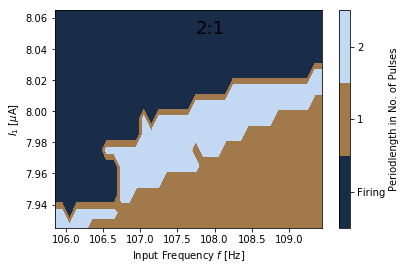

In [33]:
#TODO - lass laufen
dt = .01
plot = False
farea = np.arange(106, 112, .5)
iarea = np.arange(7.8, 8.225, .025)
#7.85-7.95 drop
#farea = [68, 80]

df, di = .1, .01
#f0, f1 = 120, 122#112
#i0, i1 = 7.95 + di, 8.1
#f0, f1 = 108, 109#112
#i0, i1 = 7.95 + di, 8.1

f0, f1 = 105.8, 109.5
i0, i1 = 7.92, 8.06
fgrid, igrid = np.mgrid[slice(f0, f1 + df, df), slice(i0, i1 + di, di)]

zx = np.zeros(shape=(len(fgrid[:,1]), len(igrid[1,:])))

if plot:
    fig = plt.figure(figsize=(50,len(iarea)*14))
pf = []


#for f in farea:
#for i in range(0, len(iarea)):
for counter1, i in enumerate(igrid[1,:], 0):
    print(i)
    for counter2, f in enumerate(fgrid[:,1], 0):
        print(f)
    #for counter, i in enumerate(iarea, 0):
        #f = farea[1]
        #t, x, i = spikeresponse_rec15_hist(kepler, 5.0, 7.6, f)
        t, x, I, rate = spikeresponse_rec15_hist(kepler, 5.0, i, f)

        #set x just to x beginning with 100 ms
        x = x[int(1300/.01):]

        xold = x

        #normalization
        x = x - np.mean(x)
        x = x / np.std(x)

        ac2 = np.correlate(x, x[int(0*1000.0/f/.01):int(int(20*1000.0/f)/.01)],'valid') / len(x[int(0*1000.0/f/.01):int(int(20*1000.0/f)/.01)])

        ac2int = ac2
        t = t[int(1300/.01):]
        tint = t[:-int(int(20*1000.0/f)/.01)+1]
        #plt.figure(figsize=(10,10))
        #plt.plot(tint, ac2int, label = i)
        if plot:

        #plot autocorrelation in the specific interval

            fig.add_subplot(len(iarea)+1, 2, 1+2*counter)
            if counter==0:
                plt.title('Autocorrelation')
            #plt.plot(t[int(200/.01):], ac2)
            

            #plt.legend(loc = 'lower right')

            #if counter==(len(iarea)-1):
            #    plt.xlabel('time [ms]')

        #plot autocorrelation

        #detect peaks in ac
        ac2_maxima, noneed = detect_peaks(ac2int, (np.max(ac2)-np.min(ac2))*.95)
        #ac2_maxima = argrelextrema(ac2, np.greater, order = int(1000.0/f/dt))[0]
        #ac2_maxima = signal.find_peaks_cwt(ac2, np.arange(0, 1000.0/f / .01 * 2))
        #print(ac2_maxima)
        #ac2_maxima_times, noneed2 = detect_peaks(ac2int, 1.68, time = tint)
        #ac2_maxima_times = ac2_maxima * dt
        ac2_maxima_times, noneed2 = detect_peaks(ac2int, (np.max(ac2)-np.min(ac2))*.95, time = tint)
        print(ac2_maxima_times)
        if len(ac2_maxima_times) == 1:
            print(ac2_maxima_times)

        #find periods
        ac2_maxima_times_isi = np.diff(ac2_maxima_times)
        #ac2_maxima_times_isi = np.concatenate(([0], ac2_maxima_times_isi))#notneeded?

        print(ac2_maxima_times_isi)
        #plt.figure(figsize=(10,10))
        #plt.plot(t, xold, label = 'i = {}, f = {}'.format(i, f))
        #plt.axis((190, 800, -76, -50))

        #print(ac2_maxima_times)

        #print(tint[0])

        #periodic = True

        #if len(ac2_maxima_times) < 1:
        #    periodic = False


        #if periodic:
        if rate == 0:
            print('neuron not spiking')

            ac2_maxima_values = ac2int[ac2_maxima]
            period = round((ac2_maxima_times_isi[0] / (1000.0/f)), 0)
            zx[counter2][counter1] = period

            print(f)
            print((1000.0/f))
            print(period)
            #pf.append(period)

            if plot:
                plt.plot(ac2_maxima_times, ac2_maxima_values, 'o')
                #plt.figure(figsize=(10,8))

                fig.add_subplot(len(iarea)+1, 2, 2+2*counter)
                #if f==farea[0]:
                if counter == 0:
                    plt.title('Voltagetrack')
                #plt.plot(t[int(300/.01):], x, label = f)
                plt.plot(t, xold, label = iarea[counter])
                #if f==farea[len(farea)-1]:
                if counter == (len(iarea)-1):
                    plt.xlabel('time [ms]')
                plt.ylabel('Voltage V(t) [mV]')
                #plt.axis((int(0*1000.0/f)+180, 1000, -80, -10))
                plt.axis((190, 800, -76, -50))
                plt.legend(loc = 'upper right')
                plt.axvline(x=t[int(0*1000.0/farea[len(farea)-1]/.01)], color='blue')
                plt.axvline(x=t[int(20*1000.0/farea[len(farea)-1]/.01)], color='blue')

                for periods in range(0,len(ac2_maxima_times), 1):
                #plt.axvline(x=periods*ac2_maxima_times_isi[periods]+int(30*1000.0/f))
                    #plt.axvline(x=ac2_maxima_times_diff[periods], color = 'red') activate
                    plt.axvline(x=ac2_maxima_times[periods], color = 'red')
        else:
            #print('no period found')
            print('neuron spiking')
            #plt.figure(figsize=(10,8))
            period = 0
            
            zx[counter2][counter1] = period
            #pf.append(period)
            #period = 30
            if plot:
                #fig.add_subplot(len(farea)+1, 2, 2+2*counter)
                fig.add_subplot(len(iarea)+1, 2, 2+2*counter)
                if counter == 0:
                    plt.title('Voltagetrack')
                #plt.plot(t[int(300/.01):], x, label = f)
                plt.plot(t, xold, label = iarea[counter])
                if counter == (len(iarea)-1):
                    plt.xlabel('time [ms]')
                plt.ylabel('Voltage V(t) [mV]')
               # plt.axis((int(0*1000.0/f)+180, 1000, -80, -10))
                plt.axvline(x=t[int(0*1000.0/farea[len(farea)-1]/.01)], color='blue')
                plt.axvline(x=t[int(20*1000.0/farea[len(farea)-1]/.01)], color='blue')
                plt.axis((190, 800, -76, -50))
                plt.legend(loc = 'upper right')
        
print(zx)

zx = zx[:-1, :-1]

levels = MaxNLocator(nbins=3).tick_values(zx.min(), zx.max())

cmap = plt.get_cmap('cubehelix')

norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)


fig, ax0 = plt.subplots(nrows=1)

cf = ax0.contourf(fgrid[:-1, :-1] + df/2.,
                  igrid[:-1, :-1] + di/2., zx, levels=levels,
                  cmap=cmap)

cbar = fig.colorbar(cf, ax=ax0, label = 'Periodlength in No. of Pulses')
cbar.set_ticks((0.4, 1.2, 2))
cbar.set_ticklabels(("Firing", "1", "2"))
plt.xlabel(r'Input Frequency $f$ [Hz]')
plt.ylabel(r'$I_1$ [$\mu$A]')
plt.text(107.75, 8.05, '2:1', fontsize = 18)
plt.savefig('BA_nonspikingperiods4.png')

In [34]:
zxsafe = zx

In [31]:
zx = zx[:-1, :-1]

<class 'numpy.ndarray'>


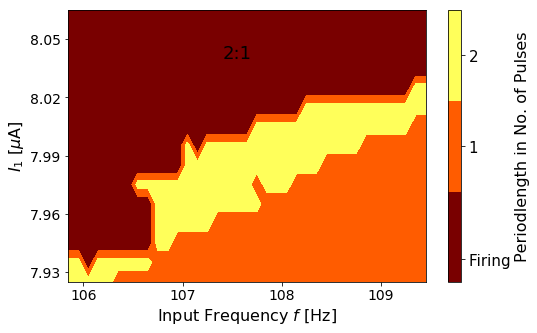

In [54]:
#TODO
print(type(zx))
f0, f1 = 105.8, 109.5
i0, i1 = 7.92, 8.06
df, di = .1, .01

#figure2 = plt.figure(figsize = (10,10))
fgrid, igrid = np.mgrid[slice(f0, f1 + df, df), slice(i0, i1 + di, di)]       
levels = MaxNLocator(nbins=3).tick_values(zx.min(), zx.max())


cmap = plt.get_cmap('hot')

norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

fig, ax0 = plt.subplots(nrows=1, figsize = (8,5))
#fig =
cf = ax0.contourf(fgrid[:-1, :-1] + df/2.,
                  igrid[:-1, :-1] + di/2., zx, levels=levels,
                  cmap=cmap)

cbar = fig.colorbar(cf, ax=ax0)
cbar.set_label('Periodlength in No. of Pulses', fontsize = 16)
cbar.set_ticks((0.2, 1.2, 2))
cbar.set_ticklabels(("Firing", "1", "2"))
cbar.ax.set_yticklabels(["Firing", "1", "2"], fontsize=15)
plt.xlabel(r'Input Frequency $f$ [Hz]', fontsize = 16)
plt.ylabel(r'$I_1$ [$\mu$A]', fontsize = 16)
plt.text(107.4, 8.04, '2:1', fontsize = 18)
plt.xticks(np.arange(106, 110, 1), fontsize = 14)
plt.yticks(np.arange(7.93, 8.05, .03), fontsize = 14)
#plt.xticklabels({'-3\pi','-2\pi','-\pi','0','\pi','2\pi','3\pi'})
plt.savefig('BA_nonspikingperiods6.png')

[ 1756.17  1772.11  1788.03  1803.97  1819.91  1835.85  1851.79  1867.71
  1883.65  1899.59  1915.53  1931.47  1947.41  1963.33  1979.27  1995.21]
[ 3.18195219  3.18569721  3.16944223  3.17318725  3.17693227  3.18067729
  3.18442231  3.16816733  3.17191235  3.17565737  3.17940239  3.18314741
  3.18689243  3.17063745  3.17438247  3.17812749]
1756.17
3.18195219218
3.17753984165
[ 1749.24  1765.11  1780.98  1796.86  1812.73  1828.6   1844.47  1860.35
  1876.22  1892.09  1907.97  1923.84  1939.71  1955.59  1971.46  1987.33]
[ 3.20825397  3.2052381   3.20222222  3.20920635  3.20619048  3.2031746
  3.20015873  3.20714286  3.20412699  3.20111111  3.20809524  3.20507937
  3.20206349  3.20904762  3.20603175  3.20301587]
1749.24
3.2082539692
3.20500992164
[ 1742.37  1758.18  1773.99  1789.8   1805.61  1821.42  1837.23  1853.04
  1868.85  1884.66  1900.47  1916.28  1932.09  1947.9   1963.71  1979.52
  1995.33]
[ 3.23956522  3.23928854  3.23901186  3.23873518  3.2384585   3.23818182
  3.23790514  

[ 1629.13  1657.77  1673.82  1703.02  1731.68  1748.5   1789.9   1805.
  1820.23  1837.56  1879.33  1897.77]
[ 5.51376384  4.63346864  5.92332103  5.60302583  4.74273063  6.80258303
  3.92214022  4.26199262  4.73184502  7.30169742  4.79125461  8.47110701]
1629.13
5.51376383852
5.5582441584
[ 1622.69  1650.85  1665.95  1681.25  1709.22  1724.38  1739.51  1754.83
  1782.85  1797.98  1813.12  1828.56  1856.76  1871.86  1887.19]
[ 5.04294118  3.79117647  4.18529412  4.77941177  3.33764706  3.79176471
  4.21588235  4.83        3.4382353   3.86235294  4.29647059  5.03058824
  3.81882353  4.21294118  4.83705882]
1622.69
5.04294117735
4.23137254997
[ 1616.48  1644.36  1659.51  1674.66  1690.1   1718.35  1733.56  1750.73
  1792.17  1808.83  1849.98  1865.08  1880.56]
[ 4.75838828  3.33435898  3.83234432  4.33032967  5.11831502  4.06428572
  4.62227106  7.14025641  4.62421246  6.6321978   3.82615385  4.2741392
  5.10212454]
1616.48
4.75838827927
4.7430290232
[ 1611.82  1641.71  1682.74  1697.88 

[ 1478.96  1505.67  1532.43  1559.23  1586.47  1624.78  1651.45  1678.13
  1704.81]
[ 3.87694352  4.00887043  4.19079734  4.41272425  5.07465116  3.51754153
  3.60946844  3.71139535  3.81332226]
1478.96
3.8769435224
4.02396825483
[ 1460.76  1487.42  1514.15  1541.08  1579.45  1606.26  1632.89  1659.54
  1686.23  1713.04]
[ 3.80635762  3.97629139  4.21622517  4.65615894  3.2910596   3.61099338
  3.75092715  3.91086093  4.1107947   4.43072848]
1460.76
3.80635761669
3.97603973596
[ 1456.8   1495.05  1521.73  1548.33  1574.95  1601.68  1628.79  1666.9
  1693.49]
[ 4.65478548  3.30082508  3.57818482  3.77554456  3.99290429  4.32026403
  5.02762376  3.53366337  3.7210231 ]
1456.8
4.65478547934
3.98942427662
[ 1477.01  1503.6   1530.17  1556.79  1583.68  1621.79  1648.36  1674.88
  1701.49]
[ 3.32578947  3.6         3.85421053  4.15842105  4.73263158  3.36894737
  3.6231579   3.82736842  4.12157895]
1477.01
3.32578947449
3.84578947455
[ 1446.25  1472.79  1499.46  1526.83  1564.66  1591.34  16

[ 1309.71  1344.69  1379.68  1414.66  1449.65  1484.63]
[ 3.58755102  3.58212828  3.58670554  3.5812828   3.58586006  3.58043732]
1309.71
3.58755102113
3.58399416986
[ 1305.92  1340.79  1375.68  1410.56  1445.45  1480.34]
[ 3.59441861  3.58069768  3.58697674  3.58325581  3.58953488  3.59581395]
1305.92
3.59441860537
3.58844961317
[ 1302.15  1336.93  1371.71  1406.49  1441.28  1476.06]
[ 3.59927536  3.59666667  3.59405797  3.59144928  3.59884058  3.59623188]
1302.15
3.59927536304
3.59608695728
[ 1298.4   1333.08  1367.76  1402.45  1437.13  1471.81]
[ 3.60231214  3.60023121  3.59815029  3.60606936  3.60398844  3.60190752]
1298.4
3.60231213944
3.60210982735
[ 1294.67  1329.25  1363.84  1398.42  1433.    1467.58]
[ 3.60371758  3.60158502  3.60945245  3.60731989  3.60518732  3.60305476]
1294.67
3.60371757996
3.60505283457
[ 1290.96  1325.44  1359.93  1394.41  1428.89  1463.38]
[ 3.60367816  3.60091954  3.60816092  3.6054023   3.60264368  3.60988506]
1290.96
3.60367816163
3.60511494328
[ 128

[ 1142.71  1162.49  1184.3   1203.14  1234.78  1254.97  1276.06  1295.76
  1318.04]
[ 4.24846154  3.51564103  4.81282051  3.14        4.01076923  3.68794872
  4.26512821  3.45230769  5.21948718]
1142.71
4.2484615391
4.03917378985
[ 1138.69  1170.39  1190.2   1211.85  1230.79  1262.56  1282.18  1304.33
  1322.74]
[ 3.14012788  4.14959079  3.49923274  4.68887468  3.16851662  4.24797954
  3.40762148  5.09726343  3.04690537]
1138.69
3.14012787787
3.82734583757
[ 1127.11  1146.01  1178.07  1197.04  1228.84  1248.19  1270.84  1288.67
  1320.33]
[ 4.66102041  3.15285714  4.60061225  3.16244898  4.35020408  3.29204082
  5.53387755  2.95571429  4.00346939]
1127.11
4.66102040879
3.96802721156
[ 1145.48  1163.26  1194.94  1214.64  1236.05  1255.11  1278.35  1295.57]
[ 5.53089059  2.95465649  4.10030534  3.44407125  4.49783715  3.20160305
  6.08536896  2.94913486]
1145.48
5.53089058588
4.09548346124
[ 1119.73  1151.58  1170.75  1192.91  1211.13  1243.06  1262.06  1284.72
  1302.45]
[ 2.97873097  4

[ 1050.37  1069.25  1088.12  1106.99  1125.86  1144.71  1163.59  1182.46
  1201.33  1220.2 ]
[ 3.20018868  3.21226415  3.21433962  3.21641509  3.21849057  3.20056604
  3.21264151  3.21471698  3.21679245  3.21886793]
1050.37
3.20018867983
3.21252830252
[ 1047.9   1066.73  1085.56  1104.37  1123.21  1142.04  1160.84  1179.7
  1198.48  1217.32]
[ 3.19411765  3.20058824  3.20705882  3.19352941  3.21        3.21647059
  3.19294118  3.22941177  3.18588235  3.20235294]
1047.9
3.19411764765
3.20323529475
[ 1045.44  1064.22  1083.    1101.78  1120.56  1139.34  1158.11  1176.9
  1195.67  1214.46]
[ 3.18647887  3.18713615  3.18779343  3.1884507   3.18910798  3.18976526
  3.18042254  3.19107981  3.18173709  3.19239437]
1045.44
3.18647887383
3.18743662035
[ 1043.    1061.72  1080.47  1099.19  1117.94  1136.66  1155.41  1174.14
  1192.87  1211.62]
[ 3.18735363  3.17199063  3.18662764  3.17126464  3.18590164  3.17053864
  3.18517564  3.17981265  3.17444965  3.18908665]
1043.0
3.18735363056
3.18022014

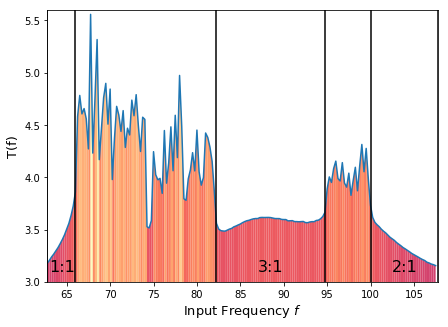

In [4]:
#TODO


#spikereponse(kepler, 5.0, 8.0, freqwalk)

#somewhere in 200+ ms
#T = spikemax - pulsestart

###################################################################
def spikeresponse_track3(derivative, I0, I1, freq) :
    #tmax = 10000.0
    #tmax = 600.0
    tmax = 2000.0
    dt = 0.01
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    thresh = -20.0
    taus = 1.0 #changed taus as an input
    stime = np.arange(0.0, 1.5 * taus, dt) #spiketime: [0, dt, 2dt, ..., 8taus] WHY 8?
    spulse = (I1-I0) + 0 * stime

    rates = [] #creates empty array
    dp = 1000.0/freq          #period = distance of pulses (= 1000 ms / frequency)
    pulses = np.arange(0.0, tmax-(1.5*taus), dp) #pulses occuring between 0 and tmax-8taus with dist. dp
    current = np.zeros(len(time)) + I0 #current = I0 for all the time
    for pt in pulses: #loop through all the pulse-times
        current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
            #add spulse (growth) while current is between pt and pt + 8tau/dt (= back at rest. pot)
            # = adds a full spulse on the current to the next pulse (dimensions are perfectly fit)
    t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
        #...
    spikes = t[:-1][(x[0][:-1]<thresh) & (x[0][1:]>=thresh)]
        #array of times where value just jumps over threshhold
    spikes = spikes[spikes>1200.0] #only pick spikes, which occur for t>200ms
    rate = 0.0
    if len(spikes) > 2: #more han two spikes occur
        rate = 1000.0*(len(spikes)-1)/(spikes[-1]-spikes[0]) #
    rates.append(rate) #put all rate together in rates (evaluate one rate per frequency)
    
    return t[10000:], x[0][10000:], i[10000:]
#############################

dt = .01
Ts = []
#f = 106
mymap = plt.get_cmap('magma')
locked11 = [63, 64, 65, 66]
locked31 = np.arange(82, 95, 1)
locked21 = np.arange(101, 109, 1)

farea = np.arange(62.75, 107.75, .25)
#farea = np.arange(63, 65, .25)
for f in farea:
    t, x, i = spikeresponse_track3(kepler, 5.0, 8.0, f)
    period = 1000.0 / f
    intervalstart = int(period * 110 / dt)
    intervalend = int(period * 130 / dt)
    xf_interval = x[intervalstart:intervalend]
    tint = t[intervalstart:intervalend]
    #plt.figure(figsize=(10,10))
    #plt.plot(tint, xf_interval)
    #plt.grid()

    maxima_indices_xf, xyz = detect_peaks(xf_interval, 30)
    maxima_times_xf, xyz = detect_peaks(xf_interval, 30, time = tint)
    if len(maxima_times_xf) < 1:
        print(maxima_times_xf)
        T = -1
    else:
        T = maxima_times_xf % period
        print(maxima_times_xf)
        print(T)
        print(maxima_times_xf[0])
        print(T[0])
        print(np.mean(T))
    
        #T = maxima_times_xf[0] % period
        #print(maxima_times_xf[0])
    #print(tint[0])

    Ts.append(np.mean(T))
print(Ts)
plt.figure(figsize=(7,5))
plt.plot(farea, Ts)
#plt.axvline(x = 62.75, color='black')
#plt.axvline(x = locked11[-1], color='black')
#plt.axvline(x = 100.0, color='black')
#plt.axvline(x = 107.75, color='black')
#plt.axvline(x = 82.25, color='black')
#plt.axvline(x = 94.75, color='black')
#plt.xlabel(r'Input Frequency $f$', fontsize = 13)
#plt.ylabel('T(f)', fontsize = 13)
#plt.text(63.25, 3.1, r'1:1', fontsize = 16) #standard is 10
#plt.text(87, 3.1, r'3:1', fontsize = 16)
#plt.text(102.5, 3.1, r'2:1', fontsize = 16)
plt.axvline(x = 62.75, color='black')
plt.axvline(x = locked11[-1], color='black')
plt.axvline(x = 100.0, color='black')
plt.axvline(x = 107.75, color='black')
plt.axvline(x = 82.25, color='black')
plt.axvline(x = 94.75, color='black')
plt.xlabel(r'Input Frequency $f$', fontsize = 13)
plt.ylabel('T(f)', fontsize = 13)
plt.text(62.95, 3.1, r'1:1', fontsize = 16) #standard is 10
plt.text(87, 3.1, r'3:1', fontsize = 16)
plt.text(102.5, 3.1, r'2:1', fontsize = 16)

#plt.grid()

for k in range(0,len(farea)-1,1):
    color = mymap(Ts[k]/np.max(Ts))
    if Ts[k]>0:
        #plt.fill_between((frange[k]-1, frange[k+1]-1), 0, (rates[k-1], rates[k+1-1]), facecolor = color, interpolate=True)
        plt.fill_between((farea[k], farea[k+1]), 0, (Ts[k], Ts[k+1]), facecolor = color, interpolate=True)
#plt.axis((62.75, 107.75, 3.0, 5.25))
plt.axis((62.75, 107.75, 3.0, 5.6))
plt.savefig('rec_Tf2_colored_newtime2.pdf')

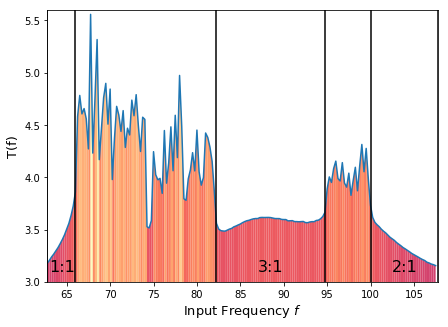

In [20]:
plt.figure(figsize=(7,5))
plt.plot(farea, Ts)
plt.axvline(x = 62.75, color='black')
plt.axvline(x = locked11[-1], color='black')
plt.axvline(x = 100.0, color='black')
plt.axvline(x = 107.75, color='black')
plt.axvline(x = 82.25, color='black')
plt.axvline(x = 94.75, color='black')
plt.xlabel(r'Input Frequency $f$', fontsize = 13)
plt.ylabel('T(f)', fontsize = 13)
plt.text(62.95, 3.1, r'1:1', fontsize = 16) #standard is 10
plt.text(87, 3.1, r'3:1', fontsize = 16)
plt.text(102.5, 3.1, r'2:1', fontsize = 16)
#plt.grid()

for k in range(0,len(farea)-1,1):
    color = mymap(Ts[k]/np.max(Ts))
    if Ts[k]>0:
        if k == len(farea)-1:
            plt.fill_between((farea[k], farea[k]+.25), 0, (Ts[k], Ts[k]), facecolor = color, interpolate=True)
        #plt.fill_between((frange[k]-1, frange[k+1]-1), 0, (rates[k-1], rates[k+1-1]), facecolor = color, interpolate=True)
        plt.fill_between((farea[k], farea[k+1]), 0, (Ts[k], Ts[k+1]), facecolor = color, interpolate=True)
plt.axis((62.75, 107.75, 3.0, 5.6))
plt.savefig('rec_Tf2_colored_newtime2')

(200, 800, -76, -50)

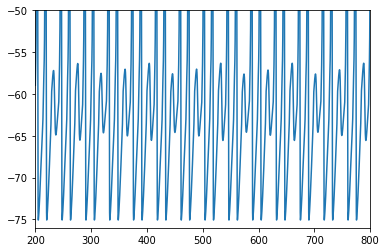

In [47]:
a, b, c = spikeresponse_rec15_hist(kepler, 5.0, 8.0, 70.25)
plt.plot(a, b)
plt.axis((200,800,-76,-50))

In [19]:
a = np.arange(0,10,1)
al = a.tolist()

a[np.arange(0,2,1).tolist()]

array([0, 1])

In [30]:
np.round(159, -1)

160

In [37]:
500 // 110

4

In [9]:
singlepulse = True
###################################################################
def spikeresponse_steadyp(derivative, I0, I1) :
    #tmax = 10000.0
    #tmax = 600.0
    tmax = 1000.0
    dt = 0.01
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    thresh = -20.0

#SPIKING
    #spikes = t[:-1][(x[0][:-1]<thresh) & (x[0][1:]>=thresh)]
    #spikes = spikes[spikes>200.0] #only pick spikes, which occur for t>200ms
    #rate = 0.0
    #if len(spikes) > 2: #more han two spikes occur
    #    rate = 1000.0*(len(spikes)-1)/(spikes[-1]-spikes[0]) #
    
    #get fixpoint
    current = np.zeros(len(time)) + I0 #current = I0 for all the time
    
    t1, i1, x1 = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)

    fp_v = x1[0][10000]
    fp_u = x1[1][10000]
        
    fig = plt.figure(figsize=(16,7))
    
    mymap1 = plt.get_cmap('winter')
    mymap2 = plt.get_cmap('autumn')
    
    #fig.add_subplot(1, 2, 1)
    #plt.plot(x[0][int(20/dt):int(100/dt)], x[1][int(20/dt):int(100/dt)], color = 'b')
    if singlepulse:
        #IS = (5.0, 6.0, 7.0, 8.0, 9.0)
        IS = (9.0, 8.0, 7.0, 6.0, 5.0)
    else:
        # = (5.0, 5.5, 6.0, 6.5, 7.0)
        IS = (7.0, 6.5, 6.0, 5.5, 5.0)
    #IS = (5.0, 7.0)
    #f, (ax1, ax2) = 
    #lfig, 
    #lfig = plt.figure()
    fig.add_subplot(1,2,1)
    #lfig, ax1 = plt.subplots()
    #lfig, ax1 = fig.subplots()
    #ax1 = plt.add_subplot(111)
    #ax2 = ax1.twinx()
    
    for counter, a in enumerate(IS, 0):
        color1 = mymap1(1 - float(counter)/(len(IS)-1))
        color2 = mymap2(1 - float(counter)/(len(IS)-1))
        
        current = np.zeros(len(time)) + I0 #current = I0 for all the time
        if singlepulse:
            current[0:150] += (a-I0)
        else:
            current[0:] += (a-I0)
        t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
        #plt.plot(x[0][int(100/dt):], x[1][int(100/dt):])
        
        if a == I0:
            plt.plot(t[9500:12100], i[9500:12100]-73.0, linestyle = 'dashed', color = color2, linewidth = 3.5, label = 'I0')
            plt.plot(t[9500:12100], x[0][9500:12100], color = color1, linewidth = 3.5)
        else:
            plt.plot(t[9500:12100], i[9500:12100]-73.0, color = color2, linewidth = 3.5)
            plt.plot(t[9500:10150], x[0][9500:10150], color = color1, linewidth = 3.5)
            plt.plot(t[10150:12100], x[0][10150:12100], color = color1, linewidth = 3.5, linestyle = 'dashed')

        #plt.ylabel(r'I1 [$\mu$A]')

    plt.plot(t1[10000], fp_v, 'o', color = 'red', label = r'stable fixpoint for $I_0$', markersize = 10)
    plt.axis((-5, 21, -69.0, -54))
    plt.xlabel('Time [ms]', fontsize = 21)
    plt.ylabel('V(t)', fontsize = 21)
    plt.xticks(fontsize = 18)
    plt.yticks(fontsize = 18)
   # plt.legend(loc = 'upper left')
    ax2 = plt.twinx()
    #plt.xlabel('Time [ms]')
    #plt.ylabel('V(t) [mV]')

    ax2.set_ylabel(r'Input Current $I_1$', va = 'bottom', fontsize  = 21, position = (20,.65))
    if singlepulse:
        ax2.set_yticks(np.arange(0, 16, 1))
        ax2.set_yticklabels(np.append([], np.arange(4.0, 10.0, 1.0)))
    else:
        ax2.set_yticks(np.arange(0, 15.5, .5))
        ax2.set_yticklabels(np.append([], np.arange(4.0, 7.5, .5)))

    #ax2.set_yticklabels(('4', '5', '6', '7', '', '', '', '', '', '', '', '', '', '', ''))
   # ax2.set_yticks.setvisible(np.arange(7,16,1), visible = False)
    #ax2.tick_params(IS)
    plt.xticks(fontsize = 18)
    plt.yticks(fontsize = 18)
    

    

    plt.subplots_adjust(wspace = .45)
    fig.add_subplot(1, 2, 2)
    #ax1.add_subplot(1,2,2)
    plt.plot(vs[np.where(ichange[1] == 1)[0]], us[np.where(ichange[1] == 1)[1]], color = 'black', linewidth = 4, label = r'$I = 5$')
    plt.plot(np.arange(-70, -30, 1), np.arange(-70, -30, 1), color = 'black', linewidth = 4)
    for counter, a in enumerate(IS, 0):
        color1 = mymap1(1 - float(counter)/(len(IS)-1))
        color2 = mymap2(1 - float(counter)/(len(IS)-1))
        
        current = np.zeros(len(time)) + I0 #current = I0 for all the time
        if singlepulse:
            current[0:150] += (a-I0)
        else:
            current[0:] += (a-I0)
        t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
        plt.plot(x[0][9999:10150], x[1][9999:10150], color = color1, linewidth = 6)
        plt.plot(x[0][10150:11000], x[1][10150:11000], color = color1, linestyle = 'dashed', linewidth = 6)
    #plt.plot(vs[np.where(ichange[1] == 1)[0]], us[np.where(ichange[1] == 1)[1]], color = 'black', linewidth = 3, label = r'$I = 5$')
    #plt.plot(np.arange(-70, -30, 1), np.arange(-70, -30, 1), color = 'black', linewidth = 3)
    plt.plot(fp_v, fp_u, 'o', color = 'red', markersize = 12.5)
    plt.axis((-63.75, -55, -61.75, -60.0))
    plt.ylabel('U(t)', fontsize = 21)
    plt.xlabel('V(t)', fontsize = 21)
    plt.xticks(np.arange(-63, -55, 2), fontsize = 18)
    plt.yticks(np.arange(-61.6, -60.0, .4), fontsize = 18)
        #plt.ylabel(r'I1 [$\mu$A]')


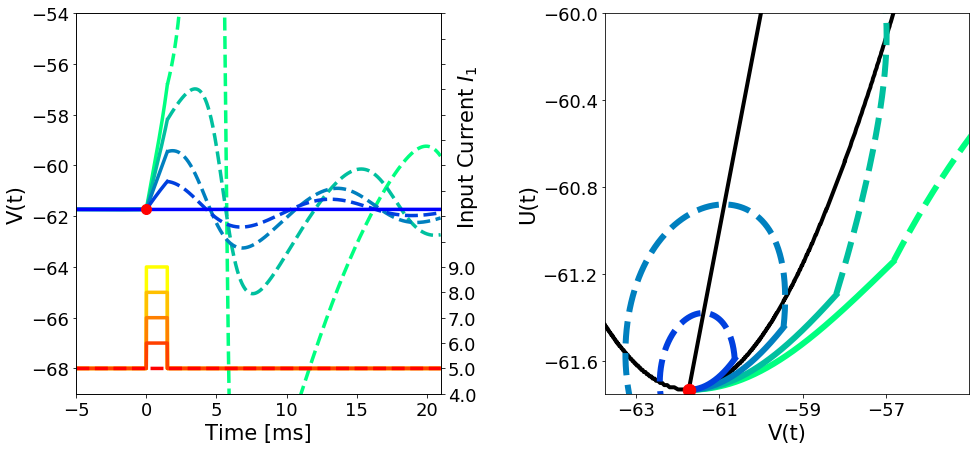

In [10]:
spikeresponse_steadyp(kepler, 5.0, 10.0)

plt.savefig('BA_pulse_behavior_fin.pdf')

In [26]:
ax.set_ylabel?

Object `ax.set_ylabel` not found.


In [11]:
singlepulse = True
###################################################################
def spikeresponse_pspike(derivative, I0, I1) :
    #tmax = 10000.0
    #tmax = 600.0
    tmax = 1000.0
    dt = 0.01
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    thresh = -20.0

#SPIKING
    #spikes = t[:-1][(x[0][:-1]<thresh) & (x[0][1:]>=thresh)]
    #spikes = spikes[spikes>200.0] #only pick spikes, which occur for t>200ms
    #rate = 0.0
    #if len(spikes) > 2: #more han two spikes occur
    #    rate = 1000.0*(len(spikes)-1)/(spikes[-1]-spikes[0]) #
    
    #get fixpoint
    current = np.zeros(len(time)) + I0 #current = I0 for all the time
    
    t0, i0, x0 = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)

    fp_v = x0[0][10000]
    fp_u = x0[1][10000]
        
    fig = plt.figure(figsize=(22,10))
    
    mymap1 = plt.get_cmap('winter')
    
    Ix = 9.0
    color1 = mymap1(.99)
    color2 = mymap1(.01)
    
    fig.add_subplot(1,2,1)
    plt.plot(vs[np.where(ichange[1] == 1)[0]], us[np.where(ichange[1] == 1)[1]], color = 'black', linewidth = 3, label = r'$I = 5$')
    plt.plot(np.arange(-70, -30, 1), np.arange(-70, -30, 1), color = 'black', linewidth = 3)

    current[0:150] += (8.1125-I0)
    t1, i1, x1 = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
    current = np.zeros(len(time)) + I0 #current = I0 for all the time
    current[0:150] += (8.125-I0)
    t2, i2, x2 = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
        #plt.plot(x[0][int(100/dt):], x[1][int(100/dt):])
        
    plt.plot(x1[0][9999:10150], x1[1][9999:10150], color = color2, linewidth = 6)
    plt.plot(x1[0][10150:11000], x1[1][10150:11000], color = color2, linestyle = 'dashed', linewidth = 6)
    plt.plot(x2[0][9999:10150], x2[1][9999:10150], color = color1, linewidth = 6)
    plt.plot(x2[0][10150:11000], x2[1][10150:11000], color = color1, linestyle = 'dashed', linewidth = 6)
    plt.arrow(-50, -58.5, 2, .4, head_width=.25, width = .08, head_length=1.5, linestyle = 'solid', zorder = 3, color = color1)
    plt.arrow(-59.2, -58.5, -1.75, -.25, head_width=.25, width = .08, head_length=1.5, linestyle = 'solid', zorder = 3, color = color2)
    
    plt.ylabel('U(t)', fontsize = 28)
    plt.xlabel('V(t)', fontsize = 28)
    plt.axis((-62.5, -45, -61.75, -57))  
    plt.plot(fp_v, fp_u, 'o', color = 'red', markersize = 12.5)
    plt.xticks([-62, -58, -54, -50, -46], ['-62', '-58', '-54', '-50', '-46'], fontsize = 24)
    plt.yticks(fontsize = 24)
    fig.add_subplot(1, 2, 2)

    plt.plot(vs[np.where(ichange[1] == 1)[0]], us[np.where(ichange[1] == 1)[1]], color = 'black', linewidth = 3, label = r'$I = 5$')
    plt.plot(np.arange(-70, -30, 1), np.arange(-70, -30, 1), color = 'black', linewidth = 3)
    plt.plot(x1[0][9999:10150], x1[1][9999:10150], color = color2, linewidth = 6)
    plt.plot(x1[0][10150:11500], x1[1][10150:11500], color = color2, linestyle = 'dashed', linewidth = 6)
    plt.plot(x2[0][9999:10150], x2[1][9999:10150], color = color1, linewidth = 6)
    plt.plot(x2[0][10150:11900], x2[1][10150:11900], color = color1, linestyle = 'dashed', linewidth = 6)

   # plt.arrow(-50, -58.5, 10, .5, head_width=.5, width = .2, head_length=2, linestyle = 'solid', zorder = 3, color = color1)
    #plt.ylabel('U(t)', fontsize = 28)
    plt.xlabel('V(t)', fontsize = 28)
    plt.axis((-78, 36, -62.5, -36.0))
    plt.plot(fp_v, fp_u, 'o', color = 'red', markersize = 12.5)
    plt.xticks(fontsize = 24)
    plt.yticks(fontsize = 24)



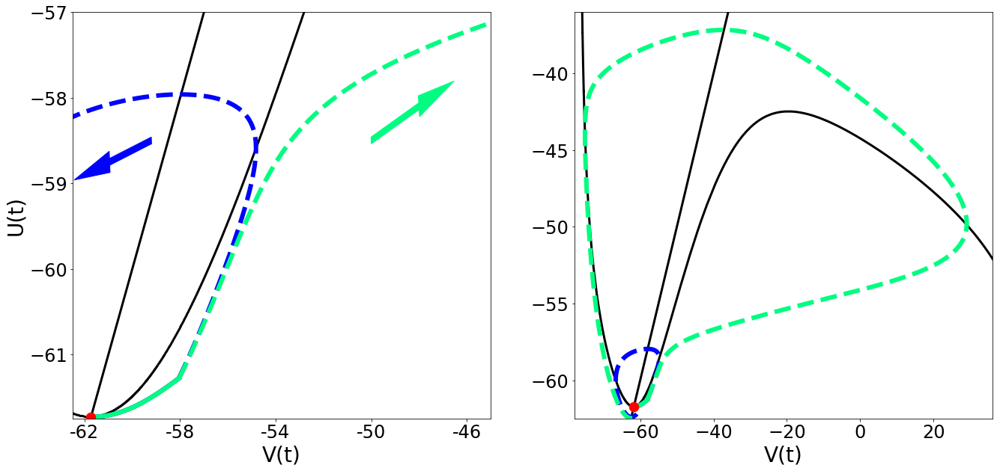

In [12]:
spikeresponse_pspike(kepler, 5.0, 9.0)

plt.savefig('BA_pspike_fin.pdf')

In [105]:
plt.subplots?

In [20]:
plt.axvline?

In [19]:
def eigenfreq_new(derivative, I0, I1s, I1e, di):
    delta = False
    I0 = 5.0
    tmax = 1000.0
    dt = 0.01
    taus = 1.0
    dinput = 0.0
    time = np.arange(int(tmax/dt))*dt #[ 0, dt, 2dt, ... , (tmax / dt) dt = tmax]
    threshold = -50
    
    #set current for low frequency
    #di = .05 now as input
    #i0, i1 = 7.95 + di, 8
    i0, i1 = I1s, I1e
    iarray = np.arange(i0, i1 + di, di)
    rec_eigenfrequences, diff_eigenfrequences, thresh_eigenfrequences = np.zeros(len(iarray)), np.zeros(len(iarray)), np.zeros(len(iarray))
  
    #print(len(iarray))
    
    for ix in range(0, len(iarray)):
        if delta:
            stime = np.arange(0.0, .025 * taus, dt) #spiketime: [0, dt, 2dt, ..., 8taus] WHY 8?
        else:
            stime = np.arange(0.0, 1.5 * taus, dt) #spiketime: [0, dt, 2dt, ..., 8taus] WHY 8?
        spulse = (iarray[ix]-I0) + 0 * stime
    
        dp_high = 1000.0 / 20

        pulses = np.arange(0.0, tmax-(1.5*taus), dp_high) #pulses occuring between 0 and tmax-8taus with dist. dp
        current = np.zeros(len(time)) + I0 #current = I0 for all the time

        for pt in pulses: #loop through all the pulse-times
            current[int(pt/dt):int(pt/dt)+len(spulse)] += spulse
        
        t, i, x = trajectory(derivative, -100.0, tmax, I0, current, -65.0, -65.0)
    
    #find maxima:
             
        maxima_indices, xyz = detect_peaks(x[0][10000:(10000+int(dp_high/dt))], .1)
        #maxima_times = maxima_indices * dt
        maxima_times, xyz2 = detect_peaks(x[0][10000:(10000+int(dp_high/dt))], .1, time = t[10000:(10000+int(dp_high/dt))])
        maxima_values = (x[0][10000+maxima_indices])

        thresh_maxima_indices = []
        
        if len(maxima_indices)>1:
            
        #eigenperiode
            eigenperiods = np.diff(maxima_indices)

            for threshcheck in range(0, len(maxima_indices), 1):
                if maxima_values[threshcheck] < threshold:
                    thresh_maxima_indices.append(maxima_indices[threshcheck])
            
            
            thresh_eigenperiods = np.diff(thresh_maxima_indices)#[0]
            thresh_maxima_times = np.asarray(thresh_maxima_indices) * dt
            thresh_maxima_values = (x[0][10000+np.asarray(thresh_maxima_indices)])
            
            diff_eigenperiod = eigenperiods[0] * dt
            rec_eigenperiod = np.mean(eigenperiods) * dt
            thresh_eigenperiod = np.mean(thresh_eigenperiods) * dt
            
            
            
            #print('maxima indices are: {}'.format(maxima_indices))
            #print('the periods are: {}'.format(eigenperiods))
            #print('maxima values are: {}'.format(maxima_values))
            #print('from which are indices: {} under the threshold'.format(thresh_maxima_indices))
            
            
            
            print('diff. eigenperiod is {:.2f}'.format(diff_eigenperiod))
            #print('rec. eigenperiod is {:.2f}'.format(rec_eigenperiod))
            print('thresh. eigenperiod is {:.2f}'.format(thresh_eigenperiod))

            
        #compute eigenfrequence
            rec_eigenfrequences[ix] = 1000.0 / rec_eigenperiod
            diff_eigenfrequences[ix] = 1000.0 / diff_eigenperiod
            thresh_eigenfrequences[ix] = 1000.0 / thresh_eigenperiod
            
            #plt.figure(figsize=(15,8))
            plt.plot(t, x[0])
            plt.plot(thresh_maxima_times, thresh_maxima_values, 'o')
            plt.axis((-1,dp_high+1,-66,-50))
            #plt.axis((-1,dp_high, np.min(x[0][10000:]), np.max(x[0][10000:])))
        
        

        #print('recent computed eigenfrequence for I1 = {:.2f} is: {:.2f}'.format(iarray[ix], rec_eigenfrequences[ix]))
        print('diff. computed eigenfrequence for I1 = {:.2f} is: {:.2f}'.format(iarray[ix], diff_eigenfrequences[ix]))
        print('thresh. computed eigenfrequence for I1 = {:.2f} is: {:.2f}'.format(iarray[ix], thresh_eigenfrequences[ix]))
        
    #return diff_eigenfrequences, thresh_eigenfrequences


diff. eigenperiod is 11.85
thresh. eigenperiod is 11.86
diff. computed eigenfrequence for I1 = 8.00 is: 84.39
thresh. computed eigenfrequence for I1 = 8.00 is: 84.32
diff. eigenperiod is 12.01
thresh. eigenperiod is 11.90
diff. computed eigenfrequence for I1 = 8.10 is: 83.26
thresh. computed eigenfrequence for I1 = 8.10 is: 84.03
diff. eigenperiod is 16.07
thresh. eigenperiod is 11.81
diff. computed eigenfrequence for I1 = 8.20 is: 62.23
thresh. computed eigenfrequence for I1 = 8.20 is: 84.64
diff. eigenperiod is 16.09
thresh. eigenperiod is 11.81
diff. computed eigenfrequence for I1 = 8.30 is: 62.15
thresh. computed eigenfrequence for I1 = 8.30 is: 84.64
diff. eigenperiod is 16.10
thresh. eigenperiod is 11.81
diff. computed eigenfrequence for I1 = 8.40 is: 62.11
thresh. computed eigenfrequence for I1 = 8.40 is: 84.64


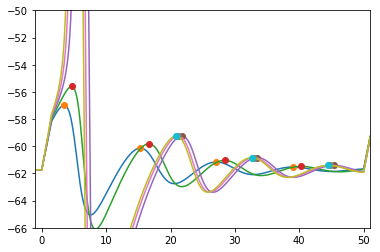

In [22]:
#TODO

eigenfreq_new(kepler, 5.0, 8.0, 8.3, .1)

In [31]:
a = [[1.1111, 2.22222, 3.33333], [1.111111, 2.22222, 3.33333]]

In [32]:
a = np.round(a, 3)

a

array([[ 1.111,  2.222,  3.333],
       [ 1.111,  2.222,  3.333]])

([<matplotlib.axis.XTick at 0x2b69ff35a90>,
 <a list of 3 Text xticklabel objects>)

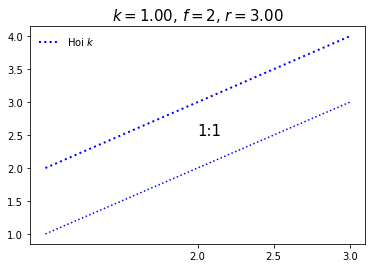

In [35]:
    
    plt.plot([1,2,3], [1,2,3], ls = 'dotted', color = 'blue')#, linewidth = 2)
    plt.plot([1,2,3], [2,3,4], ls = 'dotted', color = 'blue', linewidth = 2, label = r'Hoi $k$')
    plt.title(r'$k = {:.2f}$, $f = {}$, $r = {:.2f}$'.format(1, 2, 3), fontsize = 15)
    plt.legend(loc = 'upper left', frameon = False)
    plt.text(2.0, 2.5, r'1:1', fontsize = 15)
    #plt.set_xticks(1,2,3)
    #plt.xlabel('HOI')
    plt.xticks(np.arange(2,3.5, .5))
    #plt.xticklabels({'-3\pi','-2\pi','-\pi','0','\pi','2\pi','3\pi'})
    #plt.xtickslabels([])

In [46]:
print(np.max(np.arange(0.0, 1.01, .01)))

1.0


In [12]:
for f in np.arange(100, 105, .5):
    print(spikeresponse_rec15_hist(kepler, 5.0, 8.0, f))
    
#for f in np.arange(81.5, 83, .25):
#    print(np.round(spikeresponse_rec15_hist(kepler, 5.0, 8.0, f), 2))

0.922523748499
0.990718373903
0.998958483262


KeyboardInterrupt: 

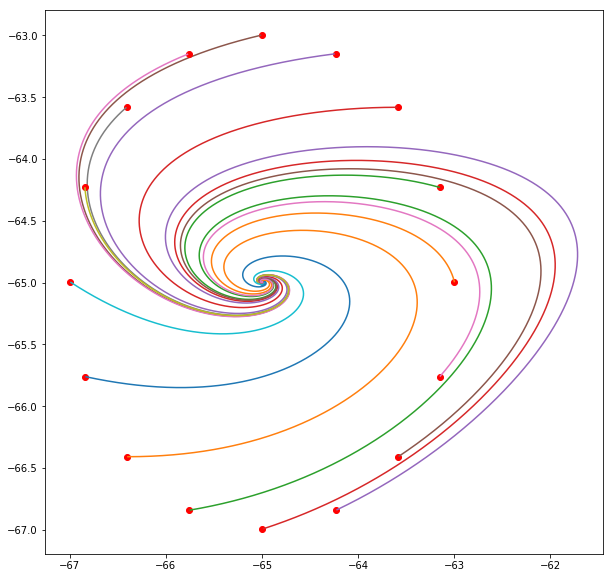

In [20]:
t1, i1, x1 = spikeresponse_trajec(kepler, 0.0, 0.0, 84, True)

fp_v = x1[0][10000]
fp_u = x1[1][10000]
plt.figure(figsize=(10,10))
plt.plot(fp_v, fp_u, 'o', label = 'fixpoint')   

for r in np.arange(2, 3, 1):
    for phi in np.arange(0, 2*np.pi, 1/8 * np.pi):
        x = r * np.cos(phi)
        y = r * np.sin(phi)
        uy = fp_u + y
        vx = fp_v + x
        plt.plot(vx, uy, 'o', color = 'red')
        t, i, ix = spikeresponse_baby(kepler, 0.0, 0.0, 80, False, vx, uy)
        plt.plot(ix[0][:10000], ix[1][:10000])
        #plt.axis((-70, -60, -69, -61))
        

In [16]:
for phi in np.arange(0, 2*np.pi, 1/4 * np.pi):
    print(phi)
    print('cos: {}'.format(np.round(np.cos(phi), 4)))
    print('sin: {}'.format(np.round(np.sin(phi), 4)))

0.0
cos: 1.0
sin: 0.0
0.785398163397
cos: 0.7071
sin: 0.7071
1.57079632679
cos: 0.0
sin: 1.0
2.35619449019
cos: -0.7071
sin: 0.7071
3.14159265359
cos: -1.0
sin: 0.0
3.92699081699
cos: -0.7071
sin: -0.7071
4.71238898038
cos: -0.0
sin: -1.0
5.49778714378
cos: 0.7071
sin: -0.7071


In [6]:
a = [[2 3 4]]
a[0]

SyntaxError: invalid syntax (<ipython-input-6-c67a9ce080c8>, line 1)

In [29]:
a = np.asarray([[ 2.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 0.,  0.,  0.,  0., 0.,  0.,  0.]
 ,[ 2.,  2.,  0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 2.,  0.  ,0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 2. , 2.  ,0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 2.  ,2.  ,0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,2.  ,0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,2.  ,0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,2.  ,0. , 0. , 0. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,2.  ,0. , 0. , 0. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,2. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,2. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 2. , 2. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 2. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 2. , 2. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 2. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 2. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 2. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 2. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 2. , 1. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 2. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 2. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 2. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 1. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 1. , 2. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 1. , 2. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 1. , 1. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 1. , 1. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 1. , 1. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 1. , 1. , 2. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 1. , 1. , 1. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 1. , 1. , 1. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 1. , 1. , 1. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 1. , 1. , 1. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 1. , 1. , 1. , 2. , 2. , 0. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 1. , 1. , 1. , 1. , 2. , 2. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 1. , 1. , 1. , 1. , 2. , 2. , 0. , 0. , 0. , 0. , 0.]
 ,[ 1.  ,1.  ,1. , 1. , 1. , 1. , 1. , 1. , 1. , 2. , 2. , 0. , 0. , 0. , 0. , 0.]])
 

In [30]:
zx = a

In [23]:
type(zx)

numpy.ndarray